# ViEWS prediction competition LSTM notebook

## Author: Iris Malone

# Load Packages

In [1]:
import tensorflow as tf
from tensorflow.python.keras.layers import LSTM
from tensorflow.python.keras.layers import Input, Dense, Dropout, RepeatVector, TimeDistributed, Activation, Bidirectional
from tensorflow.python.keras.models import Sequential
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

#plots
from plotnine import ggplot, aes
from plotnine import options
import plotnine as p9
from matplotlib import pyplot as plt

#random number generators since rnn is stochastic
from random import seed

In [2]:
import sys
import logging
import os
import pandas as pd
import numpy as np
import math
import csv
from datetime import datetime
from joblib import dump, load

# Import any other sklearn estimator you would like. 
# See https://scikit-learn.org/stable/user_guide.html#user-guide
#from sklearn.ensemble import RandomForestRegressor

from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler

#import views package

import views
from views import Period, Model, Downsampling
from views.utils.data import assign_into_df
from views.apps.transforms import lib as translib
from views.apps.evaluation import lib as evallib, feature_importance as fi
from views.apps.model import api
from views.apps.extras import extras


In [3]:

logging.basicConfig(
    #level=logging.DEBUG,
    level=logging.INFO, # uncomment this and comment debug above for less yelling in red
    format=views.config.LOGFMT,
)

In [4]:
# Do you wish to fetch the latest public data? If so, change False to True and run this cell
# Cells below will fail if this is not run if you haven't imported data yourself yet.
if False:
    path_zip = views.apps.data.public.fetch_latest_zip_from_website(path_dir_destination=views.DIR_SCRATCH)
    views.apps.data.public.import_tables_and_geoms(tables=views.TABLES, geometries=views.GEOMETRIES, path_zip=path_zip)

In [5]:
# Enter the level of analysis, and whether to predict Africa-only.
level = "cm"
pred_africa = False

In [6]:
model_path = "./models/{sub}"
out_paths = {
    "evaluation": model_path.format(sub="evaluation"),
    "features": model_path.format(sub="features")
}
for k, v in out_paths.items():
    if not os.path.isdir(v):
        os.makedirs(v)

In [7]:
if level == "pgm":
    dataset = views.DATASETS["pgm_africa_imp_0"]
elif level == "cm":
    dataset = views.DATASETS["cm_global_imp_0"]
df = dataset.df

In [8]:
df.reset_index(inplace=True)

# Clean Data

In [9]:
df["time"] = df["month_id"]
df["gwno"] = df["country_id"]

df = df.dropna(subset=['country_id'], how='all')
df = df.set_index(["month_id", "country_id"]).sort_index()

In [10]:
df.head()

acled_count_ns  acled_count_os  acled_count_pr  \
month_id country_id                                                   
1        1                      0.0             0.0             0.0   
         2                      0.0             0.0             0.0   
         3                      0.0             0.0             0.0   
         4                      0.0             0.0             0.0   
         5                      0.0             0.0             0.0   

                     acled_count_sb  acled_dummy_ns  acled_dummy_os  \
month_id country_id                                                   
1        1                      0.0               0               0   
         2                      0.0               0               0   
         3                      0.0               0               0   
         4                      0.0               0               0   
         5                      0.0               0               0   

                     acled_dummy_pr  acled_dummy_sb  cdum_1  cdum_10  ...  \
month_id country_id                                                   ...   
1        1                        0               0       1        0  ...   
         2                        0               0       0        0  ...   
         3                        0               0       0        0  ...   
         4                        0               0       0        0  ...   
         5                        0               0       0        0  ...   

                     wdi_vc_idp_nwcv  wdi_vc_idp_nwds  wdi_vc_idp_tocv  \
month_id country_id                                                      
1        1              3.600000e+04            200.0          23000.0   
         2              2.667522e+05            300.0           2100.0   
         3              7.500000e+04             29.0         164000.0   
         4              1.672000e+06           4700.0         197000.0   
         5              1.500000e+02           5300.0           2100.0   

                     wdi_vc_ihr_psrc_fe_p5  wdi_vc_ihr_psrc_ma_p5  \
month_id country_id                                                 
1        1                             7.5                   30.3   
         2                             5.8                   11.9   
         3                             4.0                   36.6   
         4                             1.9                   22.9   
         5                             0.0                   10.0   

                     wdi_vc_ihr_psrc_p5  wdi_vc_pkp_totl_un  year  time  gwno  
month_id country_id                                                            
1        1                         12.1               141.0  1980     1     1  
         2                         14.4              9057.0  1980     1     2  
         3                          9.5               871.0  1980     1     3  
         4                         12.5              8536.0  1980     1     4  
         5                          8.7              1216.0  1980     1     5  

[5 rows x 3159 columns]

## Define Time Periods

In [11]:
# Define our 2017.01-2019.12 development period
# Keeping periods in a list lets us easily expand this as the 
# updated data becomes available
period_calib = {'train_start': 121,   # 1990-01
          'train_end': 408,     # 2016.12
          'predict_start': 409, # 2017.01
          'predict_end': 444}   # 2019.12

print(period_calib)


period_test = {'train_start': 121,   # 1990-01
          'train_end': 444,     # 2016.12
          'predict_start': 445, # 2017.01
          'predict_end': 480}   # 2019.12

print(period_test)

periods = [period_calib, period_test]


{'train_start': 121, 'train_end': 408, 'predict_start': 409, 'predict_end': 444}
{'train_start': 121, 'train_end': 444, 'predict_start': 445, 'predict_end': 480}


## Write Model Functions

In [12]:
scaler = MinMaxScaler()

#create training and test based on period predictions

def partition_dataset(dataset, period, look_back):
    #create delta/first diff
    from views.apps.transforms import lib as translib
    dataset['s_outcome'] = translib.delta(dataset['ln_ged_best_sb'], time=1)

    train_df = dataset[dataset['time'].between(period['train_start'] , period['train_end']-look_back, inclusive=True)].dropna()
    test_df = dataset[dataset['time'].between(period['predict_start'] - look_back, period['predict_end'], inclusive=True)].dropna()
    #print(train_df)
    #print(test_df) 
    #identify outcome of interest
    train_df = train_df[['s_outcome']]
    test_df = test_df[['s_outcome']]   
    
    return np.array(train_df), np.array(test_df)

def partition_delta(countryname, period, dataset, look_back):

    #s_actual = df.loc[:, self.model.col_outcome].copy()

    #if self.model.delta_outcome:
    #    s_actual = translib.delta(s_actual, time=step)
    
    dataset['s_outcome1'] = translib.delta(dataset['ln_ged_best_sb'], time=1)
    dataset['s_outcome2'] = translib.delta(dataset['ln_ged_best_sb'], time=2)
    dataset['s_outcome3'] = translib.delta(dataset['ln_ged_best_sb'], time=3)
    dataset['s_outcome4'] = translib.delta(dataset['ln_ged_best_sb'], time=4)
    dataset['s_outcome5'] = translib.delta(dataset['ln_ged_best_sb'], time=5)
    dataset['s_outcome6'] = translib.delta(dataset['ln_ged_best_sb'], time=6)
    dataset['s_outcome7'] = translib.delta(dataset['ln_ged_best_sb'], time=7)
    #translib.delta(dataset['ln_ged_best_sb'], time=1)
    
    train_df = dataset[dataset['time'].between(period['train_start'] , period['train_end']-look_back)].dropna()
    test_df = dataset[dataset['time'].between(period['predict_start'] - look_back , period['predict_end'])].dropna()
     
    #identify outcome of interest
    train_df = train_df[['s_outcome1', 's_outcome2', 's_outcome3', 's_outcome4', 's_outcome5', 's_outcome6', 's_outcome7']]
    test_df = test_df[['s_outcome1', 's_outcome2', 's_outcome3', 's_outcome4', 's_outcome5', 's_outcome6', 's_outcome7']]

    return train_df, test_df
    
     
# split a univariate sequence into samples
def create_dataset(dataset, look_back, look_forward):
    X, y = list(), list()
    for i in range(len(dataset)):
        # find the end of this pattern
        end_ix = i + look_back
        out_end_ix = end_ix + look_forward
        # check if we are beyond the sequence
        if out_end_ix > len(dataset):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = dataset[i:end_ix], dataset[end_ix:out_end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)
 

#VANILLA LSTM
def create_vanilla_model(X_train, y_train, epochs, num_neurons, batch_size, val_split):
    """BUILDING THE MODEL""" 
    print('Building vanilla Model...')
    # simple early stopping
    es = EarlyStopping(monitor='loss', mode='min', verbose=1)

    model = Sequential()

    #Input Layers
    model.add(LSTM(units = num_neurons, input_shape = (X_train.shape[1], 1), activation="tanh"))

    #model.add(LSTM(units = num_neurons, input_shape = (X_train.shape[1], 1), activation="tanh", stateful=True))
    #model.add(TimeDistributed(Dense(1)))

    # Dropout Regularization - randomly removes 20\%, helps with overfitting
    model.add(Dropout(0.2))
    #model.add(Dense(4)) 
    
    #Hidden Layers
    #
    model.add(Dense(num_neurons, activation="tanh")) # New hidden layer with 2 params, sigmoid function to constrainw weights
    #model.add(Dense(num_neurons, activation="tanh"))
    
    model.add(Dropout(0.2))
              
    # Output Layers
    model.add(Dense(units = y_train.shape[1]))

    #model.add(Activation('relu'))
    #model.add(Dropout(0.2))

    # Compiling the model
    model.compile(optimizer = 'adam', loss = 'mean_squared_error')

    #Summarize the model
    model.summary()

    # Fitting the model to the training set
    #model.fit(X_train, y_train, epochs = epochs, batch_size = batch_size, validation_split=val_split, callbacks=[es])
    #remove callback, train for more epochs (passes through the data)
    model.fit(X_train, y_train, epochs = epochs, batch_size = batch_size, validation_split=val_split)

    return model

#STATEFUL LSTM


def create_stateful_model(X_train, y_train, epochs, num_neurons, batch_size, val_split):
    """BUILDING THE MODEL""" 
    print('Building stateful model...')
    # simple early stopping
    #es = EarlyStopping(monitor='loss', mode='min', verbose=1)

    model = Sequential()

    #Input Layers
    model.add(LSTM(units = num_neurons, batch_input_shape = (batch_size, X_train.shape[1], 1), activation="tanh",  stateful=True))
    model.add(Dense(num_neurons, activation="tanh"))
    #model.add(LSTM(units = num_neurons, input_shape = (X_train.shape[1], 1), activation="tanh", stateful=True))
    #model.add(TimeDistributed(Dense(1)))

    # Dropout Regularization - randomly removes 20\%, helps with overfitting
    model.add(Dropout(0.2))
    #model.add(Dense(4)) 
    
    #Hidden Layers
    #
    model.add(Dense(num_neurons, activation="tanh")) # New hidden layer, tanh function to constrainw weights
    model.add(Dropout(0.2))
    model.add(Dense(num_neurons, activation="tanh"))
    #model.add(TimeDistributed(Dense(1, activation='sigmoid')))
    
    #model.add(Dropout(0.2))
              
    # Output Layers
    model.add(Dense(units = y_train.shape[1]))

    #model.add(Activation('relu'))
    #model.add(Dropout(0.2))

    # Compiling the model
    model.compile(optimizer = 'adam', loss = 'mean_squared_error')

    #Summarize the model
    model.summary()

    # Fitting the model to the training set
    model.fit(X_train, y_train, epochs = epochs, batch_size = batch_size, validation_split=val_split)
    #remove callback, train for more epochs (passes through the data)
    #model.fit(X_train, y_train, epochs = epochs, batch_size = batch_size, validation_split=val_split)

    return model

#BIDIRECTIONAL LSTM
def create_bidirectional_model(X_train, y_train, epochs, num_neurons, batch_size, val_split):
    """BUILDING THE MODEL""" 
    print('Building bidirectional model...')
    # simple early stopping
    es = EarlyStopping(monitor='loss', mode='min', verbose=1)

    model = Sequential()

    #Input Layers
    #model.add(LSTM(units = num_neurons, input_shape = (X_train.shape[1], 1), activation = 'tanh'))
    model.add(Bidirectional(LSTM(num_neurons, return_sequences=True), input_shape = (X_train.shape[1], 1)))
    model.add(TimeDistributed(Dense(1, activation='tanh')))

    # Compiling the model
    model.compile(optimizer = 'adam', loss = 'mean_squared_error')

    #Summarize the model
    model.summary()

    # Fitting the model to the training set
    model.fit(X_train, y_train, epochs = epochs, batch_size = batch_size, callbacks=[es])
    
    return model


def make_forecasts(model, period, batch_size, X_train, y_train, test_df, X_test, y_test, look_back, look_forward):
    """FORECASTING""" 
    print('Forecasting...')
    forecasts = []
    futures = []

    for i in range(0, len(X_test)):
        X = X_test[i, 0:look_back]
        y = y_test[i, look_back:]  

        # forecast steps       
        forecast = forecast_lstm(model, X, look_back, batch_size)
        #print(forecast)
        # store the forecast
        forecasts.append(forecast)
    
    print(forecast[-1:])
    currentStep = forecast[-1:]
    #Make one-step predictions for data beyond test_set
    for i in range(look_forward):
        if i == 0:
            X = X.reshape(1, look_back, 1)
            yhat = forecast_lstm(model, X, look_back, batch_size)
            #print(yhat)
        else:
            x0_input = np.append(X, [currentStep[i-1]])
            x0_input = x0_input.reshape((1, look_back+1, 1))
            x_input = x0_input[:,1:]
            yhat = forecast_lstm(model, x_input, look_back, batch_size)
            currentStep = np.append(currentStep, yhat)        
        #print(period['predict_end'] + i - look_forward + 1)
        futures.append(yhat)
    #print(futures)
        
    return forecasts, futures

def forecast_lstm(model, X, look_back, batch_size): 
    #make predictions
    X = X.reshape(1, look_back, 1)
    
    testPredict = model.predict(X, batch_size)
    # convert to array
    return [x for x in testPredict[0, :]]

def eval_model(countryname, model, X_train, y_train, X_test, y_test, futures, forecasts, look_back, look_forward):
    """EVALUATING THE MODEL"""
    print('Evaluating...')
    testScore_values = []
    testScore_valuespercountry = []
    for i in range(look_forward):
        #print(type(y_test))
        s_actual = [row[i] for row in y_test]
        #print(s_actual)
        s_prediction = [forecast[i] for forecast in forecasts]
        #print(type(forecasts))
        #print(s_prediction)
        scores = {}
        scores["Country"] = countryname.ravel().tolist()[0]
        scores["Step"] = 't+%d' % ((i))
        scores["mse"] = evallib.mean_squared_error(actuals=s_actual, preds=s_prediction)
        scores["mae"] = evallib.mean_absolute_error(actuals=s_actual, preds=s_prediction)
        scores["r2"] = evallib.r2_score(actuals=s_actual, preds=s_prediction)
        scores["tadda_score"] = evallib.tadda_score(y_deltas=np.array(s_actual), f_deltas=np.array(s_prediction), epsilon=0.048)
        #scores["Future Prediction"] = flat_future2[i]
        #print(scores)
        
        testScore_values.append(scores)
    testScore_valuespercountry.append(testScore_values)
    return testScore_valuespercountry


        
def plot_forecasts(period, test_df, y_test, forecasts, look_back, look_forward):
    print('Plotting forecasts...')
    """PLOTTING THE MODEL"""
    plt.plot(range(period['predict_start']- look_back, period['predict_start'] + len(test_df)- look_back), test_df, color='blue', label = 'Real Ln BD')
    # show the plot
    # plot the forecasts in red
    #print(test_df.shape)
    #print(len(forecasts))
    #print(len(tot))
    print(y_test.shape)
    for i in range(len(forecasts)):
        off_s = period['predict_start'] + i  
        off_e = off_s + len(forecasts[i]) 
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = forecasts[i:][0]
        #print(xaxis)
        #print(yaxis)
        plt.plot(xaxis, yaxis, color='red')
    plt.title('Change in Ln Battle-Death Prediction')
    plt.xlabel('Time')
    plt.ylabel('Change in Ln Battle-Death')
    plt.legend()
    plt.show()
    
def store_forecasts(period, countryname, y_test, futures, forecasts, look_back, look_forward):
    print('Storing forecasts...')
    """STORING MODEL RESULTS"""
    storage =[]
    storagepredictions = []
    storagepredictionspercountry = []
    for i in range(len(forecasts)):
        off_s = period['predict_start'] + i 
        off_e = off_s + len(forecasts[i]) 
        #print(off_s)      
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = forecasts[i:][0]

        storage = {}
        storage["Country"] = countryname.ravel().tolist()[0]
        storage["Month"] = off_s - 1
        storage["Future Months"] = xaxis
        storage["S=0"] = yaxis[0]
        storage["S=1"] = yaxis[1]
        storage["S=2"] = yaxis[2]
        storage["S=3"] = yaxis[3]
        storage["S=4"] = yaxis[4]
        storage["S=5"] = yaxis[5]
        storage["S=6"] = yaxis[6]
        storage["D=0"] = yaxis[0]
        storage["D=1"] = yaxis[0] + yaxis[1]
        storage["D=2"] = yaxis[0] + yaxis[1] + yaxis[2]
        storage["D=3"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3]
        storage["D=4"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4]
        storage["D=5"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4] + yaxis[5]
        storage["D=6"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4] + yaxis[5] + yaxis[6]
        storagepredictions.append(storage)
    #storagepredictionspercountry.append(storagepredictions)
    #print(storagepredictionspercountry)
    for i in range(len(futures)):
        off_s = period['predict_end'] + i - look_forward + 1   
        off_e = off_s + len(futures[i]) 
        #print(off_s)
        
        xaxis = [x for x in range(off_s +1, off_e)]
        yaxis = futures[i:][0]
        #print(countryname)
        #print(xaxis)
        #print(yaxis)
        storage = {}
        storage["Country"] = countryname.ravel().tolist()[0]
        storage["Month"] = off_s 
        storage["Future Month"] = xaxis
        storage["S=0"] = yaxis[0]
        storage["S=1"] = yaxis[1]
        storage["S=2"] = yaxis[2]
        storage["S=3"] = yaxis[3]
        storage["S=4"] = yaxis[4]
        storage["S=5"] = yaxis[5]
        storage["S=6"] = yaxis[6]
        storage["D=0"] = yaxis[0]
        storage["D=1"] = yaxis[0] + yaxis[1]
        storage["D=2"] = yaxis[0] + yaxis[1] + yaxis[2]
        storage["D=3"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3]
        storage["D=4"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4]
        storage["D=5"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4] + yaxis[5]
        storage["D=6"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4] + yaxis[5] + yaxis[6]
        #print(storage)
        storagepredictions.append(storage)
    storagepredictionspercountry.append(storagepredictions)
    #print(storagepredictionspercountry)
    return storagepredictionspercountry



def store_forecasts(period, countryname, gwno, train_step, test_step, y_test, futures, forecasts, look_back, look_forward):
    print('Storing forecasts...')
    """STORING MODEL RESULTS"""
    storage =[]
    storagepredictions = []
    storagepredictionspercountry = []
    for i in range(len(forecasts)):
        off_s = period['predict_start'] + i 
        off_e = off_s + len(forecasts[i]) 
        #print(off_s)      
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = forecasts[i:][0]

        storage = {}
        storage["Country"] = countryname.ravel().tolist()[0]
        storage["country_id"] = gwno.ravel().tolist()[0]
        storage["Month"] = off_s 
        #storage["Future Month"] = xaxis
        storage["S=0"] = yaxis[0]
        storage["S=1"] = yaxis[1]
        storage["S=2"] = yaxis[2]
        storage["S=3"] = yaxis[3]
        storage["S=4"] = yaxis[4]
        storage["S=5"] = yaxis[5]
        storage["S=6"] = yaxis[6]
        storage["D=0"] = yaxis[0]
        storage["D=1"] = yaxis[0] + yaxis[1]
        storage["D=2"] = yaxis[0] + yaxis[1] + yaxis[2]
        storage["D=3"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3]
        storage["D=4"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4]
        storage["D=5"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4] + yaxis[5]
        storage["D=6"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4] + yaxis[5] + yaxis[6]
        storagepredictions.append(storage)
    #storagepredictionspercountry.append(storagepredictions)
    #print(storagepredictionspercountry)
    for i in range(1, len(futures)):
        off_s = period['predict_end'] + i - look_forward + 1   
        off_e = off_s + len(futures[i]) 
        #print(off_s)
        
        xaxis = [x for x in range(off_s +1, off_e)]
        yaxis = futures[i:][0]
        #print(countryname)
        #print(xaxis)
        #print(yaxis)
        storage = {}
        storage["Country"] = countryname.ravel().tolist()[0]
        storage["country_id"] = gwno.ravel().tolist()[0]
        storage["Month"] = off_s 
        #storage["Future Month"] = xaxis
        storage["S=0"] = yaxis[0]
        storage["S=1"] = yaxis[1]
        storage["S=2"] = yaxis[2]
        storage["S=3"] = yaxis[3]
        storage["S=4"] = yaxis[4]
        storage["S=5"] = yaxis[5]
        storage["S=6"] = yaxis[6]
        storage["D=0"] = yaxis[0]
        storage["D=1"] = yaxis[0] + yaxis[1]
        storage["D=2"] = yaxis[0] + yaxis[1] + yaxis[2]
        storage["D=3"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3]
        storage["D=4"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4]
        storage["D=5"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4] + yaxis[5]
        storage["D=6"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4] + yaxis[5] + yaxis[6]
        #print(storage)
        storagepredictions.append(storage)

    storagepredictionspercountry.append(storagepredictions)
    #print(storagepredictionspercountry)
    return storagepredictionspercountry

def export_results(modelname, period, batch_size, epochs, num_neurons, look_back, look_forward, scoresglobal, storagepredictionsglobal, scoresdeltaglobal):
    print('Exporting results...')
    #Write Tables
    if period == period_calib:
        period_print = 'calibration'
    elif period == period_test:
        period_print = 'test'
    #Write .csv file with evaluation metrics, one per country-step
    flattenscores_list = [item for sublist in scoresglobal for item in sublist]
    
    flattenscores_list_final = [item for sublist in flattenscores_list for item in sublist]
    keys = flattenscores_list_final[0].keys()
    with open('country.csv', 'w') as output_file:
        dict_writer = csv.DictWriter(output_file, keys)
        dict_writer.writeheader()
        dict_writer.writerows(flattenscores_list_final)
    
    path_out = os.path.join(
        out_paths["evaluation"], 
        f"{modelname}_{period_print}_epochs{epochs}_batchsize{batch_size}_neurons{num_neurons}_lookback{look_back}_countryscores.csv"
        )
    with open(path_out, "w") as f:
        dict_writer = csv.DictWriter(f, keys)
        dict_writer.writeheader()
        dict_writer.writerows(flattenscores_list_final)
    print(f"Wrote country-level error tables to {path_out}.")
 
    #Write .csv file with evaluation metrics, one per country-step
    flattenscores_listdelta = [item for sublist in scoresdeltaglobal for item in sublist]
    
    flattenscores_list_final = [item for sublist in flattenscores_listdelta for item in sublist]
    keys = flattenscores_list_final[0].keys()
    with open('country.csv', 'w') as output_file:
        dict_writer = csv.DictWriter(output_file, keys)
        dict_writer.writeheader()
        dict_writer.writerows(flattenscores_list_final)
    
    path_out = os.path.join(
        out_paths["evaluation"], 
        f"{modelname}_{period_print}_epochs{epochs}_batchsize{batch_size}_neurons{num_neurons}_lookback{look_back}_countryscores_delta.csv"
        )
    with open(path_out, "w") as f:
        dict_writer = csv.DictWriter(f, keys)
        dict_writer.writeheader()
        dict_writer.writerows(flattenscores_list_final)
    print(f"Wrote country-level delta error tables to {path_out}.")
    
    #write country predictions
    flattenstorage_list = [item for sublist in storagepredictionsglobal for item in sublist]
    flattenstorage_list_final = [item for sublist in flattenstorage_list for item in sublist]
    keys = flattenstorage_list_final[0].keys()
    with open('country.csv', 'w') as output_file:
        dict_writer = csv.DictWriter(output_file, keys)
        dict_writer.writeheader()
        dict_writer.writerows(flattenstorage_list_final)
   
    path_out = os.path.join(
        out_paths["evaluation"], 
        f"predictions_{modelname}_{period_print}_epochs{epochs}_batchsize{batch_size}_neurons{num_neurons}_lookback{look_back}_countryscores.csv"
        )
    with open(path_out, "w") as f:
        dict_writer = csv.DictWriter(f, keys)
        dict_writer.writeheader()
        dict_writer.writerows(flattenstorage_list_final)
    print(f"Wrote country-level prediction tables to {path_out}.")

    #Write .tex file with evaluation metrics, averaged over countries    
    mselist = []
    mse2 = []
    scores2 = []
    sumscores = []
    scores = {
            "Step":[], 
            "MSE":[], 
            "MAE":[],
            "R2":[],
            "tadda_score":[]
        }
    
    for i in range(look_forward):
        evalmetrics = [a[i] for a in flattenscores_listdelta]
        mse = [d['mse'] for d in evalmetrics]
        mae = [d['mae'] for d in evalmetrics]
        r2 = [d['r2'] for d in evalmetrics]
        tadda = [d['tadda_score'] for d in evalmetrics]

        scores["Step"].append('t+%d' % ((i)))
        scores["MSE"].append(np.mean(mse))
        scores["MAE"].append(np.mean(mae))
        scores["R2"].append(np.mean(r2))
        scores["tadda_score"].append(np.mean(tadda))
        #print(scores)
        scores_summary = scores
        #print(scores2)
        
    out = pd.DataFrame([v for v in scores_summary.values()],
                    index = [k for k in scores_summary.keys()])
    #print(out)
    out_transpose = out.T
    tex = out_transpose.to_latex(index=False)
    
    now = datetime.now().strftime("%Y/%m/%d %H:%M:%S")
    meta = f"""
        %Output created by LSTM Multi-Step.ipynb.
        %Produced on {now}, written to {out_paths["evaluation"]}.
        \\
        """
    tex = meta + tex
    path_out = os.path.join(
        out_paths["evaluation"], 
        f"{modelname}_{period_print}_epochs{epochs}_batchsize{batch_size}_neurons{num_neurons}_lookback{look_back}_delta_scores.tex"
        )
    with open(path_out, "w") as f:
        f.write(tex)
    print(f"Wrote scores table to {path_out}.")
#Write .tex file with evaluation metrics, averaged over countries    
    mselist = []
    mse2 = []
    scores2 = []
    sumscores = []
    scores = {
            "Step":[], 
            "MSE":[], 
            "MAE":[],
            "R2":[],
            "tadda_score":[]
        }
    
    for i in range(look_forward):
        evalmetrics = [a[i] for a in flattenscores_list]
        mse = [d['mse'] for d in evalmetrics]
        mae = [d['mae'] for d in evalmetrics]
        r2 = [d['r2'] for d in evalmetrics]
        tadda = [d['tadda_score'] for d in evalmetrics]

        scores["Step"].append('t+%d' % ((i)))
        scores["MSE"].append(np.mean(mse))
        scores["MAE"].append(np.mean(mae))
        scores["R2"].append(np.mean(r2))
        scores["tadda_score"].append(np.mean(tadda))
        #print(scores)
        scores_summary = scores
        #print(scores2)
        
    out = pd.DataFrame([v for v in scores_summary.values()],
                    index = [k for k in scores_summary.keys()])
    #print(out)
    out_transpose = out.T
    tex = out_transpose.to_latex(index=False)
    
    now = datetime.now().strftime("%Y/%m/%d %H:%M:%S")
    meta = f"""
        %Output created by LSTM Multi-Step.ipynb.
        %Produced on {now}, written to {out_paths["evaluation"]}.
        \\
        """
    tex = meta + tex
    path_out = os.path.join(
        out_paths["evaluation"], 
        f"{modelname}_{period_print}_epochs{epochs}_batchsize{batch_size}_neurons{num_neurons}_lookback{look_back}_scores.tex"
        )
    with open(path_out, "w") as f:
        f.write(tex)
    print(f"Wrote scores table to {path_out}.")

def eval_delta_forecasts(period, countryname, gwno, train_step, test_step, y_test, futures, forecasts, look_back, look_forward):
    print('Evaluating delta multi-step forecasts...')
    storage_pred2 = []
    storage_actual2 = []
    testScore_values = []
    testScore_valuespercountry = []
    for i in range(len(forecasts)):
        
        yaxis = forecasts[i:][0]  
        storage_pred = (yaxis[0], yaxis[0] + yaxis[1], yaxis[0] + yaxis[1] + yaxis[2] ,yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3],yaxis[0] + yaxis[2] + yaxis[3] + yaxis[4], yaxis[0] + yaxis[2] + yaxis[3] + yaxis[4] + yaxis[5], yaxis[0] + yaxis[2] + yaxis[3] +yaxis[4] + yaxis[5] + yaxis[6]) 
        storage_pred = list(storage_pred)
        storage_pred2.append(storage_pred)

    for index, row in test_step.iterrows(): 
        #yaxis = test_step[i:, 0]
        #print(yaxis)
        storage_actual = (row.loc['s_outcome1'], row.loc['s_outcome2'], row.loc['s_outcome3'], row.loc['s_outcome4'], row.loc['s_outcome5'], row.loc['s_outcome6'], row.loc['s_outcome7'])
        storage_actual = list(storage_actual)
        storage_actual2.append(storage_actual)
        #print(storage_actual2)
        
    for i in range(look_forward):
        s_actual = [item[i] for item in storage_actual2]
        s_prediction = [item[i] for item in storage_pred2]
        
        scores = {}
        scores["country"] = countryname.ravel().tolist()[0]
        scores["country_id"] = gwno.ravel().tolist()[0]
        scores["step"] = 't+%d' % ((i+1))
        scores["mse"] = evallib.mean_squared_error(actuals=s_actual, preds=s_prediction)
        scores["mae"] = evallib.mean_absolute_error(actuals=s_actual, preds=s_prediction)
        scores["r2"] = evallib.r2_score(actuals=s_actual, preds=s_prediction)
        scores["tadda_score"] = evallib.tadda_score(y_deltas=np.array(s_actual), f_deltas=np.array(s_prediction), epsilon=0.048)
        print(scores)
        # calculate root mean squared error for scaled data
        
        testScore_values.append(scores)
    testScore_valuespercountry.append(testScore_values)
    return testScore_valuespercountry

#print(storagepredictionspercountry)
    return storagepredictionspercountry

In [13]:
#list to store country-specific MSE

def summary_model(dataset, modelname, pred_africa, period, epochs, batch_size, look_back, look_forward, num_neurons, val_split):
    
    if pred_africa == False:
        dataset = dataset
    elif pred_africa == True:
        dataset = dataset[(dataset.in_africa==1)]

    if period == period_calib:
        period_print = 'calibration'
    elif period == period_test:
        period_print = 'test'
    elif period == period_task1:
        period_print = 'task1'    
    #create unique list of names
    gwnonames = dataset.gwno.unique()
    
    #create a data frame dictionary to store data frame for each unique country
    gwno_dict = {elem : pd.DataFrame for elem in gwnonames}

    for key in gwno_dict.keys():
        gwno_dict[key] = dataset[:][dataset.gwno == key]
    
    #model needs to be global
    forecasts = []
    predictions = []
    forecastsglobal = []
    storagepredictionsglobal = []
    scoresglobal = []
    
    scores = []
    scoresdelta = []
    scoresdeltaglobal = []
    futures = []
    storage = []
    for key in gwno_dict:
    #for key in range(53, 57):
        forecasts = []
        dfgwno = pd.DataFrame(gwno_dict[key])
        dfgwno = dfgwno[['gwno','time','ln_ged_best_sb','country_name']]
        countryname = dfgwno.country_name.unique()
        gwno = dfgwno.gwno.unique()

        print(countryname)
        
        train_df, test_df = partition_dataset(dfgwno, period, look_back)
        
        train_step, test_step = partition_delta(countryname, period, dfgwno, look_back)        
        
        test_step = test_step.iloc[look_back: -look_forward+1]
        X_train, y_train = create_dataset(train_df, look_back, look_forward)
    
        # reshape it [samples, time steps, features]
        X_train = np.reshape(X_train, (X_train.shape[0], look_back, 1))
    
        # Create the data to test our model on:
        X_test, y_test = create_dataset(test_df, look_back, look_forward)
        
        # LSTM input shape: (samples, time steps, features)
        X_test = np.reshape(X_test, (X_test.shape[0], look_back, 1))
    
        #Create the model to predict:
        if modelname == "Vanilla":
            model = create_vanilla_model(X_train, y_train, epochs, num_neurons, batch_size, val_split)
        elif modelname == "Stateful":
            model = create_stateful_model(X_train, y_train, epochs, num_neurons, batch_size, val_split)
        elif modelname == "Bidirectional":
            model = create_bidirectional_model(X_train, y_train, epochs, num_neurons, batch_size, val_split)
        elif modelname == "Stacked":
            model = create_stacked_model(X_train, y_train, epochs, num_neurons, batch_size, val_split)
        
        #Make Multi-Step Predictions for Test Data 
        forecasts, futures = make_forecasts(model, period, batch_size, X_train, y_train, test_df, X_test, y_test, look_back, look_forward)

        forecastsglobal.append(forecasts)
        
        #Evaluate out-of-sample forecasting by different metrics
        scores = eval_model(countryname,model, X_train, y_train, X_test, y_test, futures, forecasts, look_back, look_forward)
        
        # plot the forecasts in red
        plot_forecasts(period, test_df, y_test, forecasts, look_back, look_forward)
        scoresglobal.append(scores)

        # Store the Predictions for Write-Out
        storage = store_forecasts(period, countryname, gwno, train_step, test_step, y_test, futures, forecasts, look_back, look_forward)
    
        storagepredictionsglobal.append(storage)
        scoresdelta = eval_delta_forecasts(period, countryname, gwno, train_step, test_step, y_test, futures, forecasts, look_back, look_forward)
        scoresdeltaglobal.append(scoresdelta)
    export_results(modelname, period, batch_size, epochs, num_neurons, look_back, look_forward, scoresglobal, storagepredictionsglobal, scoresdeltaglobal)
    

# Model Results: Adjust Neurons, Hold Look Back Constant

['Cape Verde']
Building vanilla Model...
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 2)                 32        
_________________________________________________________________
dropout (Dropout)            (None, 2)                 0         
_________________________________________________________________
dense (Dense)                (None, 2)                 6         
_________________________________________________________________
dropout_1 (Dropout)          (None, 2)                 0         
_________________________________________________________________
dense_1 (Dense)              (None, 7)                 21        
Total params: 59
Trainable params: 59
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
4/4 [==============================] - 0s 67ms/step - loss: 0.0000e+00 

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 72/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 73/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 74/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 75/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 76/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 77/100
4/4 [==============================] - 0s 7ms/

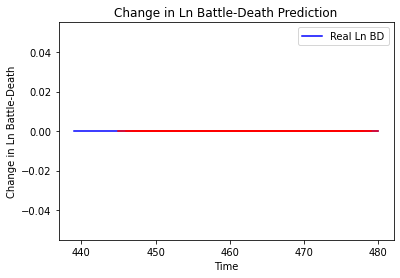

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
["Cote d'Ivoire"]
Building vanilla Model...
Model: "sequential_2"
_________________________________________________________________
Layer (t

4/4 [==============================] - 0s 8ms/step - loss: 0.5606 - val_loss: 0.2887
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5639 - val_loss: 0.2887
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5642 - val_loss: 0.2887
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5635 - val_loss: 0.2886
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5637 - val_loss: 0.2886
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5661 - val_loss: 0.2886
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5627 - val_loss: 0.2886
Epoch 72/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5630 - val_loss: 0.2886
Epoch 73/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5669 - val_loss: 0.2886
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5636 - val_loss: 0.2886
Epoch 75/100
4/4 [===============

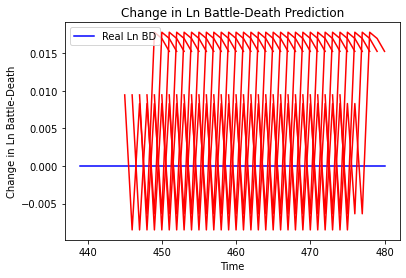

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+1', 'mse': 8.905191382305513e-05, 'mae': 0.009436732158064842, 'r2': 0.0, 'tadda_score': 0.009436732158064842}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+2', 'mse': 8.644879508114267e-07, 'mae': 0.000929778441786766, 'r2': 0.0, 'tadda_score': 0.000929778441786766}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+3', 'mse': 8.497658689055141e-05, 'mae': 0.009218274615705013, 'r2': 0.0, 'tadda_score': 0.009218274615705013}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+4', 'mse': 8.166821840325383e-06, 'mae': 0.002857765182852745, 'r2': 0.0, 'tadda_score': 0.002857765182852745}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+5', 'mse': 0.0008485929644458517, 'mae': 0.029130619019269943, 'r2': 0.0, 'tadda_score': 0.029130619019269943}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+6', 'mse': 0.002122384674803579, 'm

Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [============================

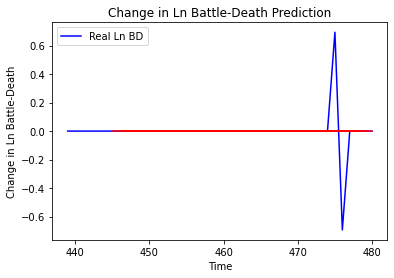

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ghana', 'country_id': 42, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Liberia']
Building vanilla Model...
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape        

4/4 [==============================] - 0s 7ms/step - loss: 1.2500 - val_loss: 6.5935e-04
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2491 - val_loss: 6.6476e-04
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2514 - val_loss: 6.4740e-04
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2446 - val_loss: 6.6319e-04
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2400 - val_loss: 6.6306e-04
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2385 - val_loss: 6.3338e-04
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2488 - val_loss: 6.0533e-04
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2500 - val_loss: 5.9073e-04
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2426 - val_loss: 5.5059e-04
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2359 - val_loss: 5.61

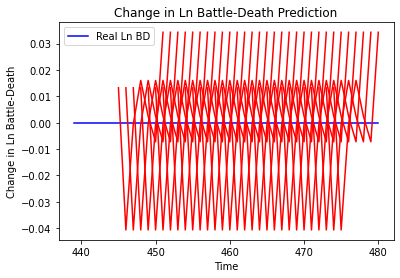

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Liberia', 'country_id': 43, 'step': 't+1', 'mse': 0.00017518738694466407, 'mae': 0.01323583722114563, 'r2': 0.0, 'tadda_score': 0.01323583722114563}
{'country': 'Liberia', 'country_id': 43, 'step': 't+2', 'mse': 0.0007521027582729212, 'mae': 0.027424491941928864, 'r2': 0.0, 'tadda_score': 0.027424491941928864}
{'country': 'Liberia', 'country_id': 43, 'step': 't+3', 'mse': 0.0007762246846848703, 'mae': 0.02786080911755562, 'r2': 0.0, 'tadda_score': 0.02786080911755562}
{'country': 'Liberia', 'country_id': 43, 'step': 't+4', 'mse': 0.00014014839351977892, 'mae': 0.011838428676128387, 'r2': 0.0, 'tadda_score': 0.011838428676128387}
{'country': 'Liberia', 'country_id': 43, 'step': 't+5', 'mse': 0.0009784539998500819, 'mae': 0.03128024935722351, 'r2': 0.0, 'tadda_score': 0.03128024935722351}
{'country': 'Liberia', 'country_id': 43, 'step': 't+6', 'mse': 0.0005777812989719161, 'mae': 0.024037081748247147, 'r2': 0.0, '

4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 7ms/

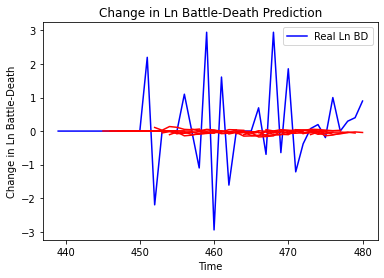

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+1', 'mse': 1.7060866525203429, 'mae': 0.8488332664282796, 'r2': -0.034567438467579814, 'tadda_score': 0.8727365645579177}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+2', 'mse': 1.2095005610586402, 'mae': 0.749167925686132, 'r2': -0.02207841508667774, 'tadda_score': 0.765131402582418}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+3', 'mse': 2.023616777052616, 'mae': 0.9296421717240969, 'r2': -0.015049178027836785, 'tadda_score': 0.9631812155877113}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+4', 'mse': 2.3263638225293506, 'mae': 1.055662068016878, 'r2': -0.0479908830006468, 'tadda_score': 1.1088646412268792}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+5', 'mse': 2.36727430206061, 'mae': 0.9828510482676021, 'r2': -0.13561125520676898, 'tadda_score': 1.0291162127819848}
{'country': 'Burkina Faso', 'country_id': 47, 'step':

4/4 [==============================] - 0s 7ms/step - loss: 0.2638 - val_loss: 6.7672e-06
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2636 - val_loss: 9.1501e-06
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2634 - val_loss: 7.6440e-06
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2645 - val_loss: 5.6344e-06
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2638 - val_loss: 2.6354e-06
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2631 - val_loss: 2.1478e-06
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2636 - val_loss: 2.3900e-06
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2641 - val_loss: 1.9653e-06
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2634 - val_loss: 1.5168e-06
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2629 - val_loss: 8.97

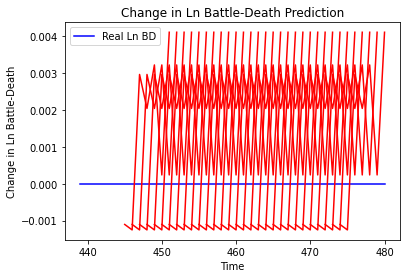

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea', 'country_id': 48, 'step': 't+1', 'mse': 1.218318465696401e-06, 'mae': 0.001103774644434452, 'r2': 0.0, 'tadda_score': 0.001103774644434452}
{'country': 'Guinea', 'country_id': 48, 'step': 't+2', 'mse': 5.550433260621444e-06, 'mae': 0.00235593575052917, 'r2': 0.0, 'tadda_score': 0.00235593575052917}
{'country': 'Guinea', 'country_id': 48, 'step': 't+3', 'mse': 3.638731964196538e-07, 'mae': 0.0006032190285623074, 'r2': 0.0, 'tadda_score': 0.0006032190285623074}
{'country': 'Guinea', 'country_id': 48, 'step': 't+4', 'mse': 6.980030397425697e-06, 'mae': 0.002641974715515971, 'r2': 0.0, 'tadda_score': 0.002641974715515971}
{'country': 'Guinea', 'country_id': 48, 'step': 't+5', 'mse': 5.056487581280803e-05, 'mae': 0.00711089838296175, 'r2': 0.0, 'tadda_score': 0.00711089838296175}
{'country': 'Guinea', 'country_id': 48, 'step': 't+6', 'mse': 5.3998005013011253e-05, 'mae': 0.007348333485424519, 'r2': 0.0, 'tad

Epoch 59/100
4/4 [==============================] - 0s 14ms/step - loss: 0.7177 - val_loss: 5.4619e-05
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.7156 - val_loss: 4.8931e-05
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.7186 - val_loss: 5.5223e-05
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7222 - val_loss: 6.1434e-05
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7182 - val_loss: 6.3487e-05
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7180 - val_loss: 5.7136e-05
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.7155 - val_loss: 5.6758e-05
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7165 - val_loss: 5.4198e-05
Epoch 67/100
4/4 [==============================] - 0s 13ms/step - loss: 0.7214 - val_loss: 5.5211e-05
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 

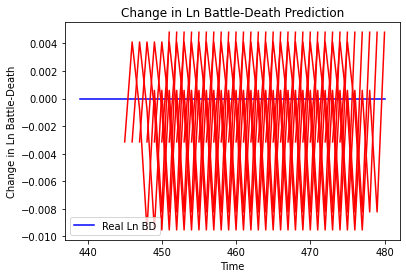

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+1', 'mse': 9.900903871776223e-06, 'mae': 0.003146570175886154, 'r2': 0.0, 'tadda_score': 0.003146570175886154}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+2', 'mse': 9.237243681940125e-07, 'mae': 0.0009611058048903942, 'r2': 0.0, 'tadda_score': 0.0009611058048903942}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+3', 'mse': 4.751843002762102e-08, 'mae': 0.00021798722445964813, 'r2': 0.0, 'tadda_score': 0.00021798722445964813}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+4', 'mse': 8.677291913298038e-05, 'mae': 0.00931519828736782, 'r2': 0.0, 'tadda_score': 0.00931519828736782}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+5', 'mse': 0.00016458185838530426, 'mae': 0.012828946113586426, 'r2': 0.0, 'tadda_score': 0.012828946113586426}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+6', 'mse': 0.00044343782134603

Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 1.3242 - val_loss: 3.1056
Epoch 62/100
4/4 [==============================] - 0s 13ms/step - loss: 1.3201 - val_loss: 3.1052
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 1.3258 - val_loss: 3.1049
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 1.3191 - val_loss: 3.1044
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 1.3205 - val_loss: 3.1040
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 1.3216 - val_loss: 3.1036
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 1.3206 - val_loss: 3.1031
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 1.3227 - val_loss: 3.1025
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 1.3174 - val_loss: 3.1020
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 1.3277 - val_loss: 3.1015
Epoch 71/10

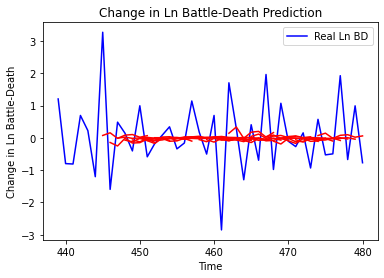

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mali', 'country_id': 50, 'step': 't+1', 'mse': 1.1867082329532368, 'mae': 0.7811961211462294, 'r2': 0.05996997008776228, 'tadda_score': 0.7900163750672813}
{'country': 'Mali', 'country_id': 50, 'step': 't+2', 'mse': 1.1073739028707719, 'mae': 0.8350407819464354, 'r2': -0.14376985395078457, 'tadda_score': 0.9280216421201376}
{'country': 'Mali', 'country_id': 50, 'step': 't+3', 'mse': 1.188730931675932, 'mae': 0.881540754984547, 'r2': -0.04708169941204465, 'tadda_score': 0.9759945625322355}
{'country': 'Mali', 'country_id': 50, 'step': 't+4', 'mse': 1.652400704808606, 'mae': 1.0492782946236072, 'r2': -0.10496221618891433, 'tadda_score': 1.176659468672637}
{'country': 'Mali', 'country_id': 50, 'step': 't+5', 'mse': 1.350538141103445, 'mae': 0.9702210220116413, 'r2': -0.24728652449557953, 'tadda_score': 1.0805084831310348}
{'country': 'Mali', 'country_id': 50, 'step': 't+6', 'mse': 1.7105130804192494, 'mae': 1.08008

4/4 [==============================] - 0s 8ms/step - loss: 1.7031 - val_loss: 0.4338
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 1.6992 - val_loss: 0.4338
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 1.7025 - val_loss: 0.4337
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 1.7019 - val_loss: 0.4337
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 1.6995 - val_loss: 0.4337
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.6961 - val_loss: 0.4336
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 1.6957 - val_loss: 0.4335
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 1.7059 - val_loss: 0.4335
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 1.6987 - val_loss: 0.4334
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 1.7026 - val_loss: 0.4333
Epoch 71/100
4/4 [===============

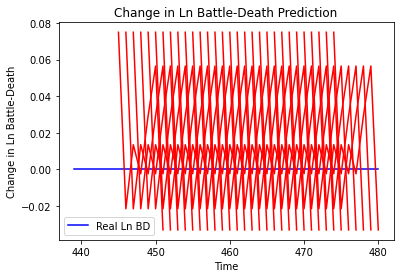

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Senegal', 'country_id': 52, 'step': 't+1', 'mse': 0.005625254142174685, 'mae': 0.07500169426202774, 'r2': 0.0, 'tadda_score': 0.07500169426202774}
{'country': 'Senegal', 'country_id': 52, 'step': 't+2', 'mse': 0.002850190189697399, 'mae': 0.053387172520160675, 'r2': 0.0, 'tadda_score': 0.053387172520160675}
{'country': 'Senegal', 'country_id': 52, 'step': 't+3', 'mse': 0.004466155527867388, 'mae': 0.06682930141687393, 'r2': 0.0, 'tadda_score': 0.06682930141687393}
{'country': 'Senegal', 'country_id': 52, 'step': 't+4', 'mse': 0.004140478740794151, 'mae': 0.0643465518951416, 'r2': 0.0, 'tadda_score': 0.0643465518951416}
{'country': 'Senegal', 'country_id': 52, 'step': 't+5', 'mse': 0.013295275452131827, 'mae': 0.11530514061450958, 'r2': 0.0, 'tadda_score': 0.11530514061450958}
{'country': 'Senegal', 'country_id': 52, 'step': 't+6', 'mse': 0.029524001880653294, 'mae': 0.17182549834251404, 'r2': 0.0, 'tadda_score':

4/4 [==============================] - 0s 10ms/step - loss: 2.2602 - val_loss: 1.1529e-04
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 2.2600 - val_loss: 1.1439e-04
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 2.2543 - val_loss: 1.2887e-04
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 2.2629 - val_loss: 1.3622e-04
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 2.2618 - val_loss: 1.2953e-04
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 2.2646 - val_loss: 1.2469e-04
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 2.2581 - val_loss: 1.0707e-04
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 2.2614 - val_loss: 9.9195e-05
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 2.2599 - val_loss: 9.3596e-05
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 2.2581 - val_loss: 

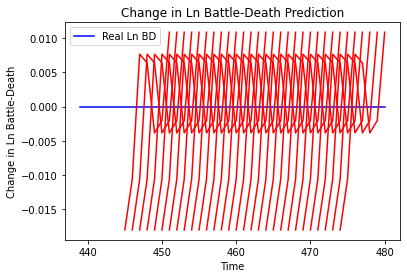

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+1', 'mse': 0.00032646112929669846, 'mae': 0.018068235367536545, 'r2': 0.0, 'tadda_score': 0.018068235367536545}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+2', 'mse': 0.000823759157348461, 'mae': 0.02870120480656624, 'r2': 0.0, 'tadda_score': 0.02870120480656624}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+3', 'mse': 0.0004422042380449742, 'mae': 0.021028652787208557, 'r2': 0.0, 'tadda_score': 0.021028652787208557}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+4', 'mse': 0.00021373384868170545, 'mae': 0.01461963914334774, 'r2': 0.0, 'tadda_score': 0.01461963914334774}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+5', 'mse': 6.14852004314527e-05, 'mae': 0.00784124992787838, 'r2': 0.0, 'tadda_score': 0.00784124992787838}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+6', 'mse': 9.802161659983391e-05, 'mae': 0.0099

Epoch 57/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [============================

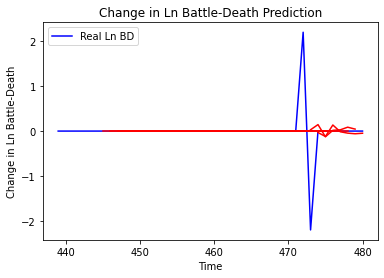

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'The Gambia', 'country_id': 54, 'step': 't+1', 'mse': 0.32616992729942124, 'mae': 0.14851274014802163, 'r2': -0.013412552714199943, 'tadda_score': 0.14948097438903038}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+2', 'mse': 0.3013676464255681, 'mae': 0.14718909793884938, 'r2': 0.0636483308001542, 'tadda_score': 0.14718909793884938}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+3', 'mse': 0.16100772418429618, 'mae': 0.07534553028042805, 'r2': -0.0350047107290663, 'tadda_score': 0.07534553028042805}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+4', 'mse': 0.1610932915356636, 'mae': 0.07640862941141617, 'r2': -0.03555476267345936, 'tadda_score': 0.07640862941141617}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+5', 'mse': 0.16108053316729926, 'mae': 0.07642459141111067, 'r2': -0.035472748152570954, 'tadda_score': 0.07642459141111067}
{'country': 'The Gambia', 'country_id': 54, 's

4/4 [==============================] - 0s 9ms/step - loss: 0.6414 - val_loss: 5.1644e-05
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6428 - val_loss: 5.4296e-05
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6395 - val_loss: 5.8415e-05
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6419 - val_loss: 6.1702e-05
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6413 - val_loss: 6.3534e-05
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6433 - val_loss: 6.6787e-05
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6406 - val_loss: 6.7758e-05
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6429 - val_loss: 6.7179e-05
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6444 - val_loss: 6.9999e-05
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6423 - val_loss: 5.59

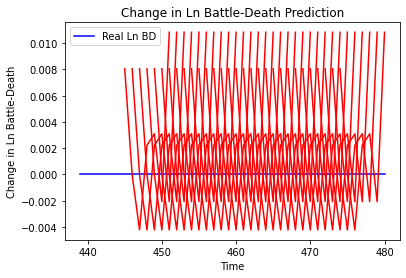

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Djibouti', 'country_id': 55, 'step': 't+1', 'mse': 6.489524762879565e-05, 'mae': 0.00805575866252184, 'r2': 0.0, 'tadda_score': 0.00805575866252184}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+2', 'mse': 6.485420038743975e-05, 'mae': 0.008053210563957691, 'r2': 0.0, 'tadda_score': 0.008053210563957691}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+3', 'mse': 1.4645907896918865e-05, 'mae': 0.0038269972428679466, 'r2': 0.0, 'tadda_score': 0.0038269972428679466}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+4', 'mse': 3.6578083746665636e-05, 'mae': 0.006047981791198254, 'r2': 0.0, 'tadda_score': 0.006047981791198254}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+5', 'mse': 8.369615857045654e-05, 'mae': 0.009148560464382172, 'r2': 0.0, 'tadda_score': 0.009148560464382172}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+6', 'mse': 5.0119844510775925e-05, 'mae': 0.007079537026584148,

4/4 [==============================] - 0s 8ms/step - loss: 2.0382 - val_loss: 0.0286
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 2.0290 - val_loss: 0.0286
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 2.0367 - val_loss: 0.0286
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 2.0327 - val_loss: 0.0286
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 2.0300 - val_loss: 0.0286
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 2.0285 - val_loss: 0.0286
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 2.0304 - val_loss: 0.0286
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 2.0325 - val_loss: 0.0286
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 2.0341 - val_loss: 0.0286
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 2.0325 - val_loss: 0.0286
Epoch 71/100
4/4 [===============

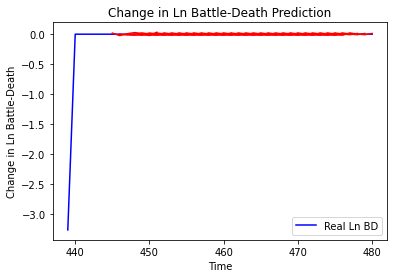

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Eritrea', 'country_id': 56, 'step': 't+1', 'mse': 1.3009284465354913e-05, 'mae': 0.00214793731768926, 'r2': 0.0, 'tadda_score': 0.00214793731768926}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+2', 'mse': 0.00012773610945167695, 'mae': 0.011243641873200734, 'r2': 0.0, 'tadda_score': 0.011243641873200734}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+3', 'mse': 0.0006392018514935982, 'mae': 0.024922426044940948, 'r2': 0.0, 'tadda_score': 0.024922426044940948}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+4', 'mse': 5.8558688659158274e-05, 'mae': 0.006483014610906442, 'r2': 0.0, 'tadda_score': 0.006483014610906442}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+5', 'mse': 0.0002305939535590538, 'mae': 0.011876155746479829, 'r2': 0.0, 'tadda_score': 0.011876155746479829}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+6', 'mse': 5.978989182415436e-05, 'mae': 0.0034091525400678315, 'r2': 

4/4 [==============================] - 0s 7ms/step - loss: 4.8520 - val_loss: 2.7461
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 4.8460 - val_loss: 2.7459
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 4.8527 - val_loss: 2.7457
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 4.8534 - val_loss: 2.7454
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 4.8505 - val_loss: 2.7452
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 4.8516 - val_loss: 2.7449
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 4.8506 - val_loss: 2.7446
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 4.8454 - val_loss: 2.7443
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 4.8489 - val_loss: 2.7441
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 4.8547 - val_loss: 2.7439
Epoch 71/100
4/4 [===============

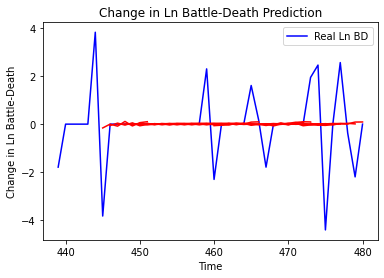

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+1', 'mse': 1.3140566264124385, 'mae': 0.5537312776493286, 'r2': 0.03678564081915703, 'tadda_score': 0.5551972985134527}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+2', 'mse': 2.026689804003989, 'mae': 0.7349296800336322, 'r2': -0.015764686072999856, 'tadda_score': 0.7404583890776913}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+3', 'mse': 2.0344455186312387, 'mae': 0.7447170057421384, 'r2': -0.019651803390142497, 'tadda_score': 0.7506774911744354}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+4', 'mse': 2.041029502916029, 'mae': 0.7439146603545006, 'r2': -0.022951656538333642, 'tadda_score': 0.7508341480599549}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+5', 'mse': 2.0087044898158037, 'mae': 0.7485731433698741, 'r2': -0.006750555255252921, 'tadda_score': 0.7512284082913605}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+6', 'mse': 1.7

Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.9517 - val_loss: 1.0247
Epoch 62/100
4/4 [==============================] - 0s 6ms/step - loss: 0.9455 - val_loss: 1.0246
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.9502 - val_loss: 1.0244
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.9491 - val_loss: 1.0242
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.9514 - val_loss: 1.0241
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 0.9474 - val_loss: 1.0239
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.9523 - val_loss: 1.0238
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 0.9487 - val_loss: 1.0236
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 0.9486 - val_loss: 1.0234
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 0.9475 - val_loss: 1.0232
Epoch 71/100
4/4 [==

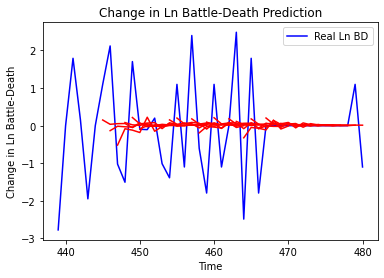

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Algeria', 'country_id': 67, 'step': 't+1', 'mse': 1.438090170749828, 'mae': 0.8920781072332458, 'r2': 0.09830221640561665, 'tadda_score': 0.9108682362776493}
{'country': 'Algeria', 'country_id': 67, 'step': 't+2', 'mse': 1.91167423097844, 'mae': 0.9584890378262976, 'r2': -0.1350635532674107, 'tadda_score': 1.0474871480461339}
{'country': 'Algeria', 'country_id': 67, 'step': 't+3', 'mse': 2.0723443307340377, 'mae': 1.0846669505929958, 'r2': -0.15523843413537142, 'tadda_score': 1.1932028018828242}
{'country': 'Algeria', 'country_id': 67, 'step': 't+4', 'mse': 2.367491072841548, 'mae': 1.2088612620229549, 'r2': -0.15968852496958563, 'tadda_score': 1.3330563618933189}
{'country': 'Algeria', 'country_id': 67, 'step': 't+5', 'mse': 1.5029607636520597, 'mae': 0.8671003968694948, 'r2': -0.1168031537068448, 'tadda_score': 0.9380488801056289}
{'country': 'Algeria', 'country_id': 67, 'step': 't+6', 'mse': 1.918828311750348

Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1965 - val_loss: 1.4811
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1975 - val_loss: 1.4811
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1981 - val_loss: 1.4811
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1994 - val_loss: 1.4810
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1972 - val_loss: 1.4809
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1971 - val_loss: 1.4809
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1977 - val_loss: 1.4807
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1967 - val_loss: 1.4807
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1983 - val_loss: 1.4805
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1973 - val_loss: 1.4805
Epoch 71/100
4/4

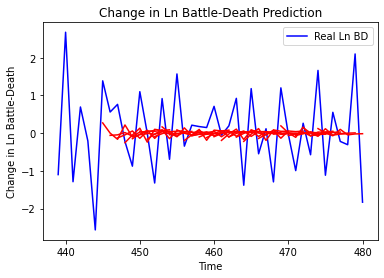

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cameroon', 'country_id': 69, 'step': 't+1', 'mse': 0.6599064617026705, 'mae': 0.67418457216558, 'r2': 0.10394497636481492, 'tadda_score': 0.7012238024079517}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+2', 'mse': 0.8941729005261716, 'mae': 0.8143278831117153, 'r2': -0.21141016018676306, 'tadda_score': 0.9155433939891855}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+3', 'mse': 1.0784196199006397, 'mae': 0.8249983449944411, 'r2': -0.10042481342566201, 'tadda_score': 0.8683250202654358}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+4', 'mse': 1.1235343883478655, 'mae': 0.8573354348614395, 'r2': -0.2757439209832262, 'tadda_score': 0.9648655448803881}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+5', 'mse': 1.1894330094885923, 'mae': 0.8800868351678823, 'r2': -0.19578842060339663, 'tadda_score': 0.9508053788495088}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+6', 'mse': 1.599157

4/4 [==============================] - 0s 7ms/step - loss: 0.7593 - val_loss: 2.4220
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.7593 - val_loss: 2.4217
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.7584 - val_loss: 2.4215
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.7606 - val_loss: 2.4214
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.7587 - val_loss: 2.4211
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.7602 - val_loss: 2.4208
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 0.7598 - val_loss: 2.4205
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.7559 - val_loss: 2.4201
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 0.7588 - val_loss: 2.4198
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 0.7579 - val_loss: 2.4195
Epoch 70/100
4/4 [===============

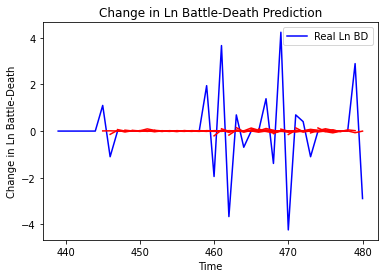

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+1', 'mse': 2.4520603378395376, 'mae': 0.9146246072877372, 'r2': 0.07285214147989427, 'tadda_score': 0.9146246072877372}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+2', 'mse': 1.503630765939844, 'mae': 0.7115229715695504, 'r2': -0.02708899869806558, 'tadda_score': 0.728383015075378}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+3', 'mse': 2.256253850924475, 'mae': 0.8905498149318127, 'r2': 0.03736023319527837, 'tadda_score': 0.9019344451505819}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+4', 'mse': 2.418322797132286, 'mae': 0.835865880879722, 'r2': -0.0002796022622659766, 'tadda_score': 0.8532082316979389}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+5', 'mse': 2.539105697868002, 'mae': 0.8818904723654662, 'r2': -0.001953815040062201, 'tadda_score': 0.89394617363

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.3724
Epoch 58/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.3724
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.3724
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.3724
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.3724
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.3724
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.3724
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.3724
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.3724
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 

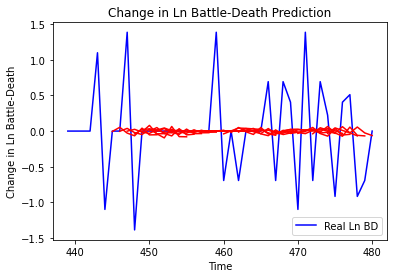

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tunisia', 'country_id': 73, 'step': 't+1', 'mse': 0.4059015202685847, 'mae': 0.4026775059721613, 'r2': 0.016808312945039483, 'tadda_score': 0.40506193791561385}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+2', 'mse': 0.4278886524688367, 'mae': 0.4296656333153308, 'r2': -0.03983621342837007, 'tadda_score': 0.43843363879818326}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+3', 'mse': 0.4850783009223096, 'mae': 0.4666819661307857, 'r2': -0.015223891384675392, 'tadda_score': 0.4697813480234172}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+4', 'mse': 0.4986753394468, 'mae': 0.4669146082022972, 'r2': -0.032733560052867317, 'tadda_score': 0.47401799180549253}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+5', 'mse': 0.45978588345074084, 'mae': 0.4553370876777435, 'r2': -0.04511370445047813, 'tadda_score': 0.46435825140955694}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+6', 'mse': 0.5739

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 7ms/

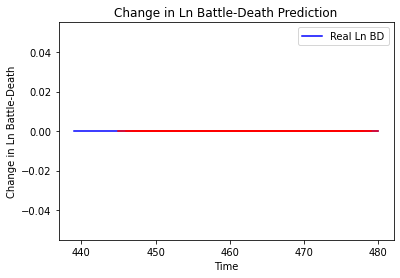

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Benin', 'country_id': 74, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Equatorial Guinea']
Building vanilla Model...
Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Sh

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 1

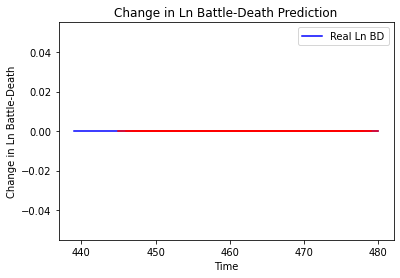

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Niger']
Building vanilla Model...
Model: "sequential_21"
________________________________

4/4 [==============================] - 0s 9ms/step - loss: 0.8954 - val_loss: 1.7137
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.8943 - val_loss: 1.7134
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.8997 - val_loss: 1.7131
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8937 - val_loss: 1.7127
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8963 - val_loss: 1.7124
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8974 - val_loss: 1.7121
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8983 - val_loss: 1.7118
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 0.8966 - val_loss: 1.7115
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8929 - val_loss: 1.7112
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8911 - val_loss: 1.7110
Epoch 74/100
4/4 [===============

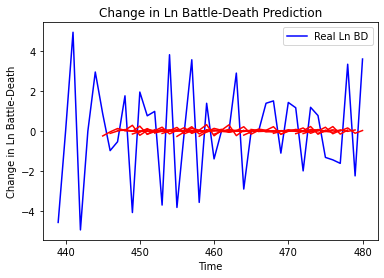

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Niger', 'country_id': 78, 'step': 't+1', 'mse': 4.11464038716542, 'mae': 1.6254917294778837, 'r2': 0.050146355316698865, 'tadda_score': 1.6578793519237054}
{'country': 'Niger', 'country_id': 78, 'step': 't+2', 'mse': 4.1961290704406435, 'mae': 1.6118713384163972, 'r2': -0.06858547057762854, 'tadda_score': 1.6697037261270082}
{'country': 'Niger', 'country_id': 78, 'step': 't+3', 'mse': 3.9120565308846857, 'mae': 1.5156435802637251, 'r2': -0.010075286176840503, 'tadda_score': 1.5352523316377116}
{'country': 'Niger', 'country_id': 78, 'step': 't+4', 'mse': 4.552974317306247, 'mae': 1.6924703695407948, 'r2': -0.0034705200079554466, 'tadda_score': 1.7069637232056698}
{'country': 'Niger', 'country_id': 78, 'step': 't+5', 'mse': 5.589625785072321, 'mae': 1.9019114257215899, 'r2': -0.01614259219873282, 'tadda_score': 1.9425021093407713}
{'country': 'Niger', 'country_id': 78, 'step': 't+6', 'mse': 4.8167204691503835, 'ma

4/4 [==============================] - 0s 9ms/step - loss: 0.5563 - val_loss: 1.1930
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5562 - val_loss: 1.1929
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5562 - val_loss: 1.1929
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5581 - val_loss: 1.1928
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5560 - val_loss: 1.1928
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5588 - val_loss: 1.1927
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5577 - val_loss: 1.1926
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5571 - val_loss: 1.1925
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5579 - val_loss: 1.1924
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5548 - val_loss: 1.1923
Epoch 71/100
4/4 [===============

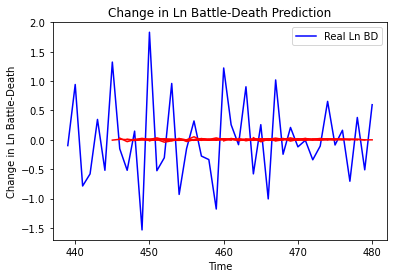

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Nigeria', 'country_id': 79, 'step': 't+1', 'mse': 0.5827496188779793, 'mae': 0.5919060254959682, 'r2': -0.01967318927713646, 'tadda_score': 0.601852733054476}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+2', 'mse': 0.5423032079824883, 'mae': 0.5745157278588429, 'r2': -0.0022788258964836494, 'tadda_score': 0.5771282845234265}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+3', 'mse': 0.612310469046577, 'mae': 0.6032027709302855, 'r2': 0.0006192422204397419, 'tadda_score': 0.6087919814206711}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+4', 'mse': 0.7446308970273067, 'mae': 0.6157441221753889, 'r2': -0.0010149926806322096, 'tadda_score': 0.6236511658211682}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+5', 'mse': 0.5046782545595091, 'mae': 0.569032277516256, 'r2': 0.014229212520213474, 'tadda_score': 0.5845150732825003}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+6', 'mse': 0.685261

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/

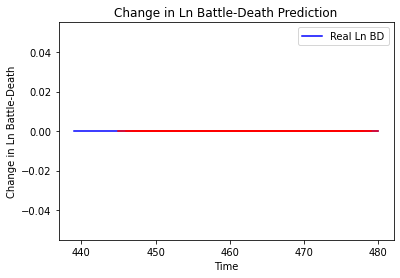

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Togo']
Building vanilla Model...
Model: "sequential_24"
_____

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 8ms/

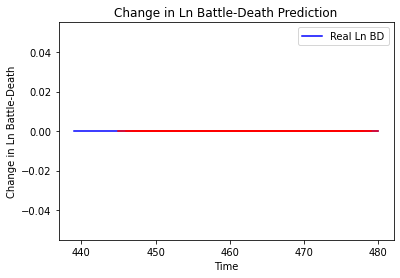

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Togo', 'country_id': 81, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Somalia']
Building vanilla Model...
Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              

4/4 [==============================] - 0s 10ms/step - loss: 2.6326 - val_loss: 0.3620
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 2.6295 - val_loss: 0.3619
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6366 - val_loss: 0.3619
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6212 - val_loss: 0.3618
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 2.6254 - val_loss: 0.3618
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6386 - val_loss: 0.3617
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6194 - val_loss: 0.3617
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6335 - val_loss: 0.3616
Epoch 73/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6329 - val_loss: 0.3616
Epoch 74/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6318 - val_loss: 0.3616
Epoch 75/100
4/4 [============

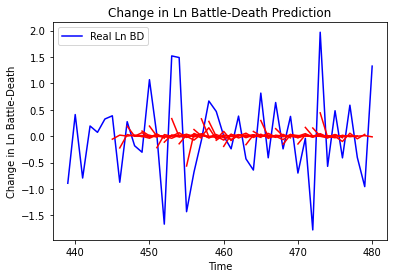

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Somalia', 'country_id': 120, 'step': 't+1', 'mse': 0.6165220236720246, 'mae': 0.6202239316731114, 'r2': 0.19068832243598355, 'tadda_score': 0.6756214828073401}
{'country': 'Somalia', 'country_id': 120, 'step': 't+2', 'mse': 1.103337806454706, 'mae': 0.7673557967196037, 'r2': -0.12512949061630918, 'tadda_score': 0.8577963116516798}
{'country': 'Somalia', 'country_id': 120, 'step': 't+3', 'mse': 0.9950329777372301, 'mae': 0.7470484364057453, 'r2': -0.24676238781350834, 'tadda_score': 0.8534152228906623}
{'country': 'Somalia', 'country_id': 120, 'step': 't+4', 'mse': 0.775077967445888, 'mae': 0.7266716063380042, 'r2': -0.11815041511943813, 'tadda_score': 0.7858152071992357}
{'country': 'Somalia', 'country_id': 120, 'step': 't+5', 'mse': 0.8401468780819122, 'mae': 0.6795848878357732, 'r2': -0.0898325220448819, 'tadda_score': 0.7678656288369421}
{'country': 'Somalia', 'country_id': 120, 'step': 't+6', 'mse': 0.719837

4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0

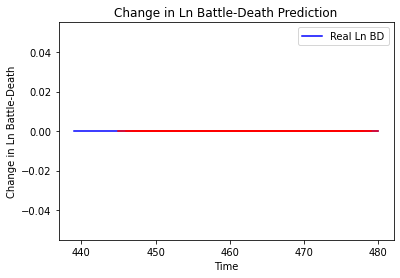

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Botswana', 'country_id': 154, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Burundi']
Building vanilla Model...
Model: "sequential_27"
_________________________________________________________________
Layer (type)        

4/4 [==============================] - 0s 8ms/step - loss: 2.0151 - val_loss: 1.6711
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 2.0144 - val_loss: 1.6709
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 2.0120 - val_loss: 1.6708
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 2.0093 - val_loss: 1.6707
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 2.0150 - val_loss: 1.6705
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 2.0111 - val_loss: 1.6704
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 2.0137 - val_loss: 1.6703
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 2.0116 - val_loss: 1.6702
Epoch 73/100
4/4 [==============================] - 0s 7ms/step - loss: 2.0126 - val_loss: 1.6700
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 2.0098 - val_loss: 1.6698
Epoch 75/100
4/4 [===============

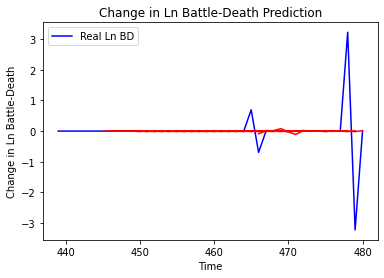

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burundi', 'country_id': 155, 'step': 't+1', 'mse': 0.028685075280507743, 'mae': 0.05108356067320288, 'r2': 0.10443661140010663, 'tadda_score': 0.051357726641303114}
{'country': 'Burundi', 'country_id': 155, 'step': 't+2', 'mse': 0.03316565161882354, 'mae': 0.054438622999308815, 'r2': -0.035449377713866026, 'tadda_score': 0.055092749330518956}
{'country': 'Burundi', 'country_id': 155, 'step': 't+3', 'mse': 0.032556926742567965, 'mae': 0.05119393422609152, 'r2': -0.016444661582793785, 'tadda_score': 0.05151102559671383}
{'country': 'Burundi', 'country_id': 155, 'step': 't+4', 'mse': 0.031881448100458086, 'mae': 0.0509901424531448, 'r2': 0.0046441428124957, 'tadda_score': 0.05103873812003017}
{'country': 'Burundi', 'country_id': 155, 'step': 't+5', 'mse': 0.03209223321001994, 'mae': 0.04930023829327853, 'r2': -0.0019366810180030392, 'tadda_score': 0.04939998277803839}
{'country': 'Burundi', 'country_id': 155, 'step

4/4 [==============================] - 0s 8ms/step - loss: 2.5180 - val_loss: 0.1849
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 2.5230 - val_loss: 0.1849
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 2.5118 - val_loss: 0.1849
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 2.5244 - val_loss: 0.1849
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 2.5247 - val_loss: 0.1849
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 2.5201 - val_loss: 0.1849
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 2.5316 - val_loss: 0.1849
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 2.5170 - val_loss: 0.1848
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 2.5231 - val_loss: 0.1848
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 2.5199 - val_loss: 0.1848
Epoch 70/100
4/4 [===============

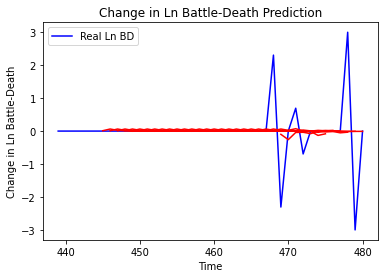

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Rwanda', 'country_id': 156, 'step': 't+1', 'mse': 0.3673248960875327, 'mae': 0.20401166917268992, 'r2': 0.04712229977421911, 'tadda_score': 0.20401166917268992}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+2', 'mse': 0.39744234735508305, 'mae': 0.27245717418824195, 'r2': -0.031005395914685874, 'tadda_score': 0.27629549643779355}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+3', 'mse': 0.28372080027419033, 'mae': 0.2483669714174318, 'r2': -0.016599598769853507, 'tadda_score': 0.25068792326168693}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+4', 'mse': 0.3471129846354299, 'mae': 0.2669277881361596, 'r2': 0.05916432444379316, 'tadda_score': 0.2669277881361596}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+5', 'mse': 0.3661481556601566, 'mae': 0.21172695663720884, 'r2': 0.007570264921109793, 'tadda_score': 0.21212313852857073}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+6', 'mse': 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/

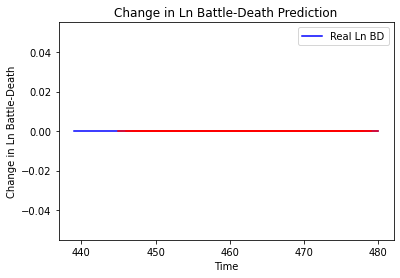

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zambia', 'country_id': 157, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Zimbabwe']
Building vanilla Model...
Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Outp

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 8ms/

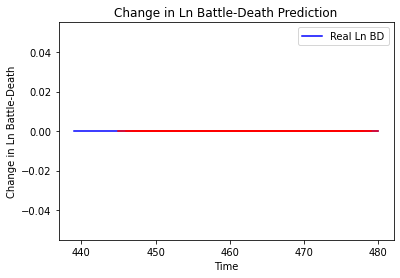

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Comoros']
Building vanilla Model...
Model: "sequential_31"
_________________________________________________________________
Layer (type)        

4/4 [==============================] - 0s 10ms/step - loss: 0.1340 - val_loss: 8.4452e-07
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1340 - val_loss: 1.5349e-06
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1340 - val_loss: 1.5046e-06
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1341 - val_loss: 1.0406e-06
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1341 - val_loss: 7.4874e-07
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1340 - val_loss: 1.4949e-06
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1341 - val_loss: 2.7633e-06
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1340 - val_loss: 2.9130e-06
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1336 - val_loss: 3.4149e-06
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1335 - val_loss: 4

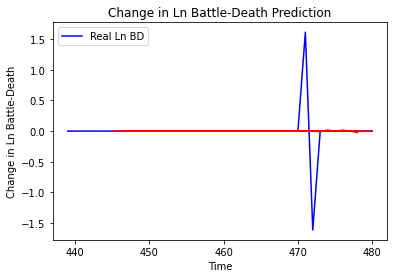

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Comoros', 'country_id': 159, 'step': 't+1', 'mse': 0.1723182746802513, 'mae': 0.10748154610778783, 'r2': 0.0021295966619360174, 'tadda_score': 0.10748154610778783}
{'country': 'Comoros', 'country_id': 159, 'step': 't+2', 'mse': 0.17233762494062752, 'mae': 0.10814924296530232, 'r2': 0.0020175420805972344, 'tadda_score': 0.10814924296530232}
{'country': 'Comoros', 'country_id': 159, 'step': 't+3', 'mse': 0.17264200459145357, 'mae': 0.10831007049181456, 'r2': 0.00025492319701514443, 'tadda_score': 0.10834444941870515}
{'country': 'Comoros', 'country_id': 159, 'step': 't+4', 'mse': 0.08642272782645143, 'mae': 0.05437007823762618, 'r2': -0.03543782693865838, 'tadda_score': 0.05439467509934502}
{'country': 'Comoros', 'country_id': 159, 'step': 't+5', 'mse': 0.08660597886158697, 'mae': 0.05672457473389007, 'r2': -0.03763337269817235, 'tadda_score': 0.056798629143329435}
{'country': 'Comoros', 'country_id': 159, 'step':

4/4 [==============================] - 0s 8ms/step - loss: 0.1428 - val_loss: 1.8969e-05
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1450 - val_loss: 1.2495e-05
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1433 - val_loss: 1.1926e-05
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1452 - val_loss: 1.2012e-05
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1431 - val_loss: 1.0019e-05
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1427 - val_loss: 8.9650e-06
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1454 - val_loss: 9.0331e-06
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1426 - val_loss: 8.1485e-06
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1432 - val_loss: 8.8031e-06
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1454 - val_loss: 1.05

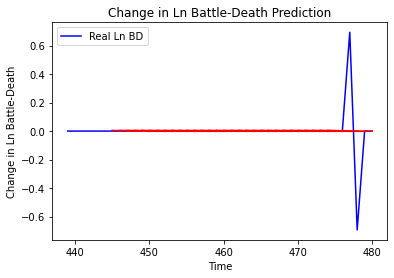

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Lesotho', 'country_id': 160, 'step': 't+1', 'mse': 2.654299961824761e-05, 'mae': 0.005151989869773388, 'r2': 0.0, 'tadda_score': 0.005151989869773388}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+2', 'mse': 7.127024980851937e-05, 'mae': 0.008442170917987823, 'r2': 0.0, 'tadda_score': 0.008442170917987823}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+3', 'mse': 0.00012890272781786172, 'mae': 0.01135353371500969, 'r2': 0.0, 'tadda_score': 0.01135353371500969}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+4', 'mse': 0.00016644233069766732, 'mae': 0.012901253066956997, 'r2': 0.0, 'tadda_score': 0.012901253066956997}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+5', 'mse': 9.240190584597439e-05, 'mae': 0.00961259100586176, 'r2': 0.0, 'tadda_score': 0.00961259100586176}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+6', 'mse': 5.535934888878727e-05, 'mae': 0.007440386340022087, 'r2'

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/

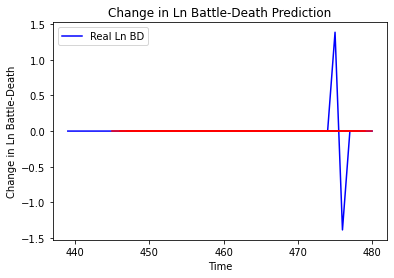

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Malawi', 'country_id': 161, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mozambique']
Building vanilla Model...
Model: "sequential_34"
_________________________________________________________________
Layer (type)                 Ou

4/4 [==============================] - 0s 9ms/step - loss: 1.1689 - val_loss: 0.7016
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.1708 - val_loss: 0.7016
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 1.1590 - val_loss: 0.7016
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 1.1744 - val_loss: 0.7015
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 1.1665 - val_loss: 0.7015
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 1.1693 - val_loss: 0.7015
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 1.1614 - val_loss: 0.7014
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 1.1678 - val_loss: 0.7014
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 1.1578 - val_loss: 0.7013
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 1.1732 - val_loss: 0.7013
Epoch 75/100
4/4 [===============

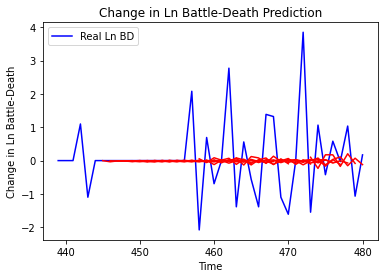

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mozambique', 'country_id': 162, 'step': 't+1', 'mse': 1.6170681511494711, 'mae': 0.813729640547345, 'r2': -0.02765382650738535, 'tadda_score': 0.824420600959569}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+2', 'mse': 1.9585837439386549, 'mae': 0.8325925627074586, 'r2': -0.02365687113493764, 'tadda_score': 0.8450376455333776}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+3', 'mse': 2.003686656835667, 'mae': 0.9989095128175101, 'r2': -0.04695243723972009, 'tadda_score': 1.0162242673681656}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+4', 'mse': 1.5798525359430875, 'mae': 0.7882179108921649, 'r2': -0.048322841250947324, 'tadda_score': 0.7971775311518671}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+5', 'mse': 0.9047799597992037, 'mae': 0.6231427439371318, 'r2': -0.10474290851064261, 'tadda_score': 0.6410526518592804}
{'country': 'Mozambique', 'country_id': 162, 'step': 't

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/

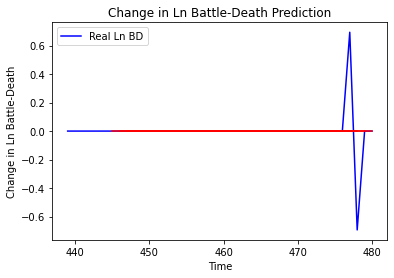

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Africa', 'country_id': 163, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Swaziland']
Building vanilla Model...
Model: "sequential_36"
________________________________________________________

4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 9m

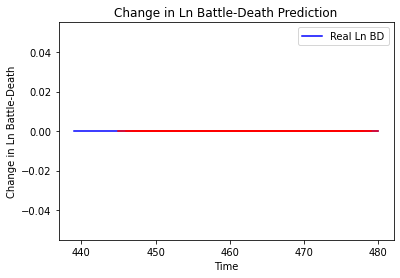

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Swaziland', 'country_id': 164, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Angola']
Building vanilla Model...
Model: "sequential_37"
_________________________________________________________________
Layer (type)  

Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 3.4027 - val_loss: 0.0915
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 3.4159 - val_loss: 0.0915
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3966 - val_loss: 0.0916
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 3.4065 - val_loss: 0.0917
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 3.4058 - val_loss: 0.0918
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 3.4050 - val_loss: 0.0918
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 3.4118 - val_loss: 0.0919
Epoch 72/100
4/4 [==============================] - 0s 10ms/step - loss: 3.3958 - val_loss: 0.0920
Epoch 73/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3987 - val_loss: 0.0919
Epoch 74/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3967 - val_loss: 0.0918
Epoch 75/100
4/

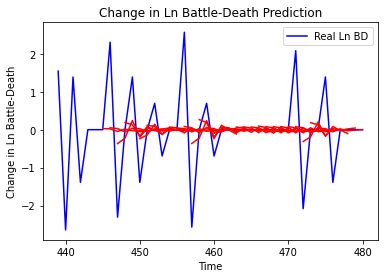

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Angola', 'country_id': 165, 'step': 't+1', 'mse': 1.0665387431911613, 'mae': 0.6457317110088509, 'r2': 0.16186256546782185, 'tadda_score': 0.6457317110088509}
{'country': 'Angola', 'country_id': 165, 'step': 't+2', 'mse': 1.4670842297745528, 'mae': 0.79718941095591, 'r2': -0.15290534022866642, 'tadda_score': 0.8476839422496201}
{'country': 'Angola', 'country_id': 165, 'step': 't+3', 'mse': 0.8795722000767797, 'mae': 0.5400826397711842, 'r2': -0.00279540899373365, 'tadda_score': 0.5414352969005515}
{'country': 'Angola', 'country_id': 165, 'step': 't+4', 'mse': 0.9951657487885143, 'mae': 0.6640842137061634, 'r2': 0.07286328042060153, 'tadda_score': 0.6677344515278268}
{'country': 'Angola', 'country_id': 165, 'step': 't+5', 'mse': 0.9882827069418408, 'mae': 0.5734059063104312, 'r2': -0.009381628756024663, 'tadda_score': 0.578821056461088}
{'country': 'Angola', 'country_id': 165, 'step': 't+6', 'mse': 1.309648238027

4/4 [==============================] - 0s 8ms/step - loss: 1.9633 - val_loss: 0.2237
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9559 - val_loss: 0.2237
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9614 - val_loss: 0.2236
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9527 - val_loss: 0.2236
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9649 - val_loss: 0.2236
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9574 - val_loss: 0.2236
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9570 - val_loss: 0.2236
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9638 - val_loss: 0.2236
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9594 - val_loss: 0.2236
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9553 - val_loss: 0.2236
Epoch 71/100
4/4 [===============

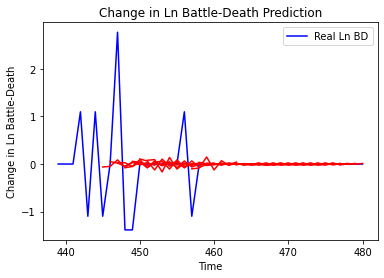

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo', 'country_id': 166, 'step': 't+1', 'mse': 0.4890272064914523, 'mae': 0.30874375484415256, 'r2': 0.029161350743354908, 'tadda_score': 0.31126932185916467}
{'country': 'Congo', 'country_id': 166, 'step': 't+2', 'mse': 0.8128647812114271, 'mae': 0.4406406008970194, 'r2': -0.06961822982777455, 'tadda_score': 0.4585758768043372}
{'country': 'Congo', 'country_id': 166, 'step': 't+3', 'mse': 0.6098254372178367, 'mae': 0.36442506331532376, 'r2': -0.028200619119070236, 'tadda_score': 0.36776173337875984}
{'country': 'Congo', 'country_id': 166, 'step': 't+4', 'mse': 0.7393495760321026, 'mae': 0.3972092724363424, 'r2': -0.06437439922469324, 'tadda_score': 0.41183171554360964}
{'country': 'Congo', 'country_id': 166, 'step': 't+5', 'mse': 0.5891259889316102, 'mae': 0.3651181879721997, 'r2': 0.006699836395576808, 'tadda_score': 0.3671514767490743}
{'country': 'Congo', 'country_id': 166, 'step': 't+6', 'mse': 0.68978221

Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0707 - val_loss: 3.3641
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0656 - val_loss: 3.3642
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0689 - val_loss: 3.3642
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0661 - val_loss: 3.3644
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0741 - val_loss: 3.3645
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0669 - val_loss: 3.3646
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0675 - val_loss: 3.3646
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0639 - val_loss: 3.3647
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0728 - val_loss: 3.3648
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0665 - val_loss: 3.3649
Epoch 71/100
4/4 [==

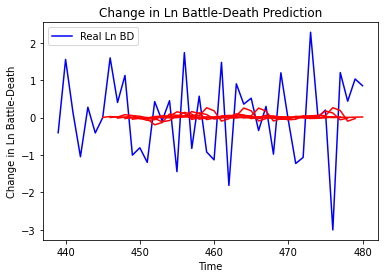

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+1', 'mse': 1.07263273036317, 'mae': 0.8679261962728403, 'r2': 0.019961972103624825, 'tadda_score': 0.8723705946933927}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+2', 'mse': 1.4241392976216984, 'mae': 0.9599663945656837, 'r2': -0.007224673924117075, 'tadda_score': 0.9766033613088798}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+3', 'mse': 1.7698938794211216, 'mae': 1.0728235637736687, 'r2': -0.026063567052551306, 'tadda_score': 1.1066257288647066}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+4', 'mse': 1.994316725431827, 'mae': 1.0925175337493134, 'r2': -0.14472578916100298, 'tadda_score': 1.1930524611907416}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+5', 'mse': 2.23431373847182, 'mae': 1.2258532405981353, 'r2': -0.217126787820491, 'tadda_score': 1.3620441715383462}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+6'

4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8m

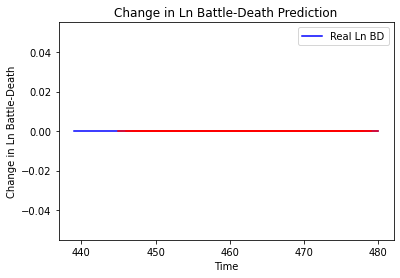

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Gabon', 'country_id': 169, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Namibia']
Building vanilla Model...
Model: "sequential_41"
_________________________________________________________________
Layer (type)                 Output Shape

Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1431 - val_loss: 3.8484e-06
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1438 - val_loss: 3.9826e-06
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1444 - val_loss: 7.0263e-06
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1437 - val_loss: 1.3515e-05
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1431 - val_loss: 1.0283e-05
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1432 - val_loss: 1.7815e-05
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1431 - val_loss: 1.7570e-05
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1426 - val_loss: 1.5883e-05
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1433 - val_loss: 1.0000e-05
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1429 - 

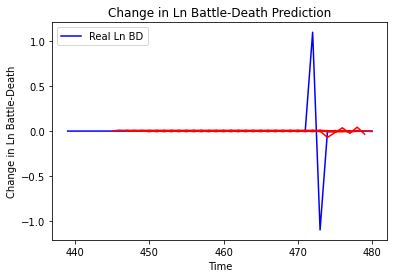

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Namibia', 'country_id': 170, 'step': 't+1', 'mse': 0.0803706105293167, 'mae': 0.07432054866901976, 'r2': 0.0011515009482223615, 'tadda_score': 0.07432054866901976}
{'country': 'Namibia', 'country_id': 170, 'step': 't+2', 'mse': 0.07851572574649342, 'mae': 0.0845879504893789, 'r2': 0.024204067913122906, 'tadda_score': 0.0845879504893789}
{'country': 'Namibia', 'country_id': 170, 'step': 't+3', 'mse': 0.039701314571228406, 'mae': 0.05179242760884609, 'r2': -0.020846616186522615, 'tadda_score': 0.05179242760884609}
{'country': 'Namibia', 'country_id': 170, 'step': 't+4', 'mse': 0.039676427726739405, 'mae': 0.048653282309053796, 'r2': -0.02020669654510665, 'tadda_score': 0.048653282309053796}
{'country': 'Namibia', 'country_id': 170, 'step': 't+5', 'mse': 0.03996646763188169, 'mae': 0.041134903570739886, 'r2': -0.02766454167999144, 'tadda_score': 0.041134903570739886}
{'country': 'Namibia', 'country_id': 170, 'step'

Epoch 56/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [============================

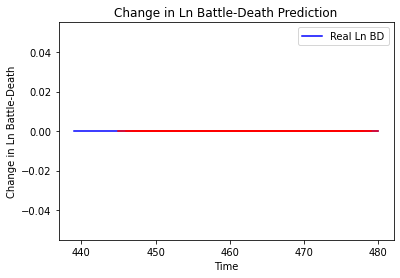

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Madagascar', 'country_id': 172, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mauritius']
Building vanilla Model...
Model: "sequential_43"
_________________________________________________________________
Laye

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 9ms/

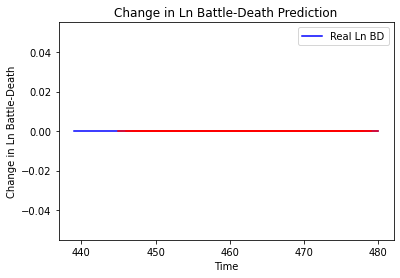

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritius', 'country_id': 173, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Seychelles']
Building vanilla Model...
Model: "sequential_44"
_________________________________________________________________
Layer (typ

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 8ms/

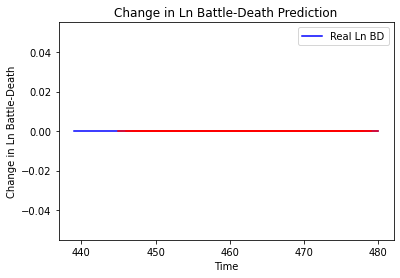

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Seychelles', 'country_id': 174, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Libya']
Building vanilla Model...
Model: "sequential_45"
_________________________________________________________________
Layer (t

4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3497
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3497
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3496
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3495
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3495
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3495
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3494
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3494
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3493
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3493
Epoch 75/100
4/4 [===============

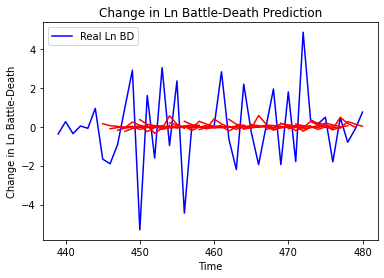

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Libya', 'country_id': 213, 'step': 't+1', 'mse': 5.320131703861025, 'mae': 1.7802875254983088, 'r2': -0.09792232339025975, 'tadda_score': 1.880114354695815}
{'country': 'Libya', 'country_id': 213, 'step': 't+2', 'mse': 5.306231330046968, 'mae': 1.8106904538186404, 'r2': 0.02048974640361856, 'tadda_score': 1.887089503974916}
{'country': 'Libya', 'country_id': 213, 'step': 't+3', 'mse': 7.286543106114701, 'mae': 2.1110195656449284, 'r2': 0.018322191550594114, 'tadda_score': 2.1887907451471373}
{'country': 'Libya', 'country_id': 213, 'step': 't+4', 'mse': 5.557242734017305, 'mae': 1.9685914533493387, 'r2': 0.03967510418362108, 'tadda_score': 2.022897297358261}
{'country': 'Libya', 'country_id': 213, 'step': 't+5', 'mse': 7.370479648994231, 'mae': 2.2702705222671087, 'r2': -0.012960098580547363, 'tadda_score': 2.4087041245952103}
{'country': 'Libya', 'country_id': 213, 'step': 't+6', 'mse': 6.051596327087509, 'mae':

4/4 [==============================] - 0s 9ms/step - loss: 5.3488 - val_loss: 0.8508
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 5.3539 - val_loss: 0.8508
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 5.3437 - val_loss: 0.8508
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 5.3604 - val_loss: 0.8507
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 5.3390 - val_loss: 0.8506
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 5.3410 - val_loss: 0.8506
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 5.3531 - val_loss: 0.8505
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 5.3512 - val_loss: 0.8505
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 5.3473 - val_loss: 0.8504
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 5.3380 - val_loss: 0.8504
Epoch 71/100
4/4 [===============

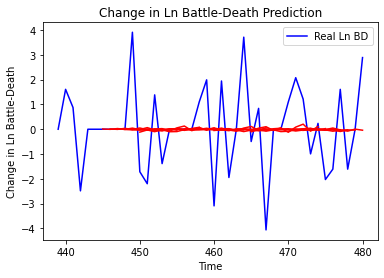

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Chad', 'country_id': 214, 'step': 't+1', 'mse': 2.9005507731511715, 'mae': 1.171608097008536, 'r2': 0.011883946229321318, 'tadda_score': 1.1739590448281862}
{'country': 'Chad', 'country_id': 214, 'step': 't+2', 'mse': 4.378225002939088, 'mae': 1.478085333166749, 'r2': -0.03144452522342078, 'tadda_score': 1.499429587348159}
{'country': 'Chad', 'country_id': 214, 'step': 't+3', 'mse': 5.415111196714832, 'mae': 1.7489361870805455, 'r2': -0.03684477095076599, 'tadda_score': 1.7713996516933077}
{'country': 'Chad', 'country_id': 214, 'step': 't+4', 'mse': 6.376555036628812, 'mae': 2.041916389150693, 'r2': -0.045691409277144546, 'tadda_score': 2.070959866831227}
{'country': 'Chad', 'country_id': 214, 'step': 't+5', 'mse': 5.168799790821958, 'mae': 1.7444334864207562, 'r2': -0.0879713014331236, 'tadda_score': 1.7922125052251872}
{'country': 'Chad', 'country_id': 214, 'step': 't+6', 'mse': 4.265232625656162, 'mae': 1.454

4/4 [==============================] - 0s 10ms/step - loss: 0.6027 - val_loss: 2.2759
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6026 - val_loss: 2.2759
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6022 - val_loss: 2.2759
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6024 - val_loss: 2.2760
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6028 - val_loss: 2.2759
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6024 - val_loss: 2.2759
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6021 - val_loss: 2.2759
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6024 - val_loss: 2.2759
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6023 - val_loss: 2.2758
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6021 - val_loss: 2.2757
Epoch 71/100
4/4 [=========

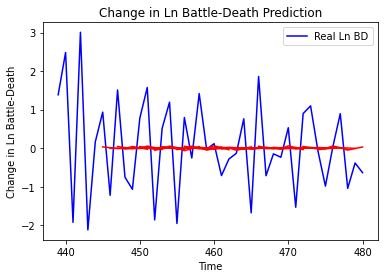

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Egypt', 'country_id': 222, 'step': 't+1', 'mse': 1.0878908918903414, 'mae': 0.8719886201792606, 'r2': 0.034740269813665625, 'tadda_score': 0.8758574950867541}
{'country': 'Egypt', 'country_id': 222, 'step': 't+2', 'mse': 1.1029618279381836, 'mae': 0.8819321765136041, 'r2': -0.019886428580078386, 'tadda_score': 0.8996743946839191}
{'country': 'Egypt', 'country_id': 222, 'step': 't+3', 'mse': 0.9352727636285006, 'mae': 0.8044703342988956, 'r2': -0.008463060605681916, 'tadda_score': 0.8169968710938957}
{'country': 'Egypt', 'country_id': 222, 'step': 't+4', 'mse': 1.2264865814452541, 'mae': 0.939683666341567, 'r2': 0.0042944204087137505, 'tadda_score': 0.9488040882137307}
{'country': 'Egypt', 'country_id': 222, 'step': 't+5', 'mse': 1.1945271009680638, 'mae': 0.8774334129541707, 'r2': -0.006885613172274541, 'tadda_score': 0.9006822711762877}
{'country': 'Egypt', 'country_id': 222, 'step': 't+6', 'mse': 1.10137236744

4/4 [==============================] - 0s 8ms/step - loss: 2.7877 - val_loss: 0.0010
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7935 - val_loss: 9.6654e-04
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7868 - val_loss: 9.4768e-04
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7906 - val_loss: 9.4234e-04
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7870 - val_loss: 9.1825e-04
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7879 - val_loss: 9.1739e-04
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7954 - val_loss: 9.0811e-04
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7894 - val_loss: 9.1458e-04
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7822 - val_loss: 9.4607e-04
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7884 - val_loss: 9.7254e-

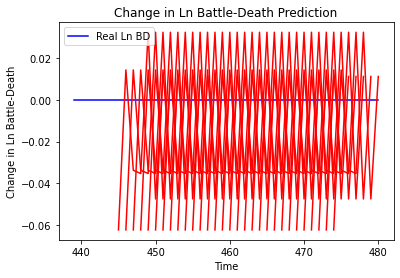

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Uganda', 'country_id': 235, 'step': 't+1', 'mse': 0.003875721058973061, 'mae': 0.062255289405584335, 'r2': 0.0, 'tadda_score': 0.062255289405584335}
{'country': 'Uganda', 'country_id': 235, 'step': 't+2', 'mse': 0.0022984051340699807, 'mae': 0.04794168472290039, 'r2': 0.0, 'tadda_score': 0.04794168472290039}
{'country': 'Uganda', 'country_id': 235, 'step': 't+3', 'mse': 0.006664136708550927, 'mae': 0.08163416385650635, 'r2': 0.0, 'tadda_score': 0.08163416385650635}
{'country': 'Uganda', 'country_id': 235, 'step': 't+4', 'mse': 0.013664999623453022, 'mae': 0.11689738929271698, 'r2': 0.0, 'tadda_score': 0.11689738929271698}
{'country': 'Uganda', 'country_id': 235, 'step': 't+5', 'mse': 0.009775107816526685, 'mae': 0.09886914491653442, 'r2': 0.0, 'tadda_score': 0.09886914491653442}
{'country': 'Uganda', 'country_id': 235, 'step': 't+6', 'mse': 0.02140749737700176, 'mae': 0.14631301164627075, 'r2': 0.0, 'tadda_score

Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1216 - val_loss: 1.6987
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1198 - val_loss: 1.6985
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1202 - val_loss: 1.6982
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1202 - val_loss: 1.6979
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1201 - val_loss: 1.6977
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1199 - val_loss: 1.6974
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1216 - val_loss: 1.6972
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1199 - val_loss: 1.6971
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1208 - val_loss: 1.6969
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1199 - val_loss: 1.6968
Epoch 72/100
4/4 [==

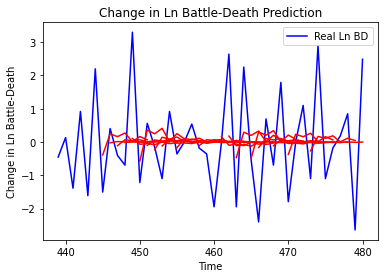

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Kenya', 'country_id': 237, 'step': 't+1', 'mse': 1.778744836364548, 'mae': 0.9973165654235248, 'r2': 0.1415855931592468, 'tadda_score': 1.0029209226726283}
{'country': 'Kenya', 'country_id': 237, 'step': 't+2', 'mse': 1.956931805517899, 'mae': 1.1156311328377553, 'r2': -0.02516174160547835, 'tadda_score': 1.1496368383377766}
{'country': 'Kenya', 'country_id': 237, 'step': 't+3', 'mse': 2.1851797026035, 'mae': 1.1571345255946321, 'r2': -0.0007317768688741566, 'tadda_score': 1.1613725688117758}
{'country': 'Kenya', 'country_id': 237, 'step': 't+4', 'mse': 2.810817871256914, 'mae': 1.3508805395378956, 'r2': -0.0008932318432857134, 'tadda_score': 1.3920189072963385}
{'country': 'Kenya', 'country_id': 237, 'step': 't+5', 'mse': 1.517785448789418, 'mae': 0.9946095261848316, 'r2': -0.0020849291811122495, 'tadda_score': 1.004981214162096}
{'country': 'Kenya', 'country_id': 237, 'step': 't+6', 'mse': 2.6703967224875726, 

3/3 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
3/3 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
3/3 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
3/3 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
3/3 [==============================] 

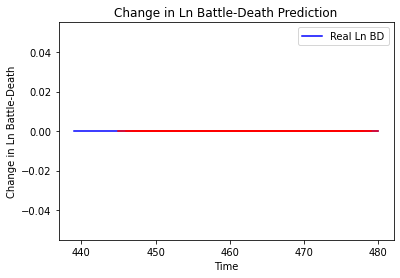

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tanzania', 'country_id': 242, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Morocco']
Building vanilla Model...
Model: "sequential_51"
_________________________________________________________________
Layer (type)        

Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0735 - val_loss: 1.0767e-06
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0733 - val_loss: 5.5699e-07
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0735 - val_loss: 3.6969e-07
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0733 - val_loss: 2.7551e-07
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0733 - val_loss: 1.8252e-06
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0736 - val_loss: 1.6832e-06
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0733 - val_loss: 5.9678e-07
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0735 - val_loss: 3.8776e-07
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0733 - val_loss: 2.3820e-07
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 0.07

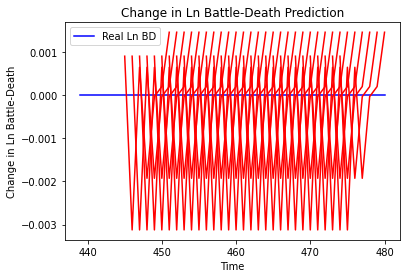

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Morocco', 'country_id': 243, 'step': 't+1', 'mse': 8.110639848576577e-07, 'mae': 0.0009005909087136388, 'r2': 0.0, 'tadda_score': 0.0009005909087136388}
{'country': 'Morocco', 'country_id': 243, 'step': 't+2', 'mse': 4.94046379978714e-06, 'mae': 0.00222271541133523, 'r2': 0.0, 'tadda_score': 0.00222271541133523}
{'country': 'Morocco', 'country_id': 243, 'step': 't+3', 'mse': 2.4921710186419452e-06, 'mae': 0.001578661147505045, 'r2': 0.0, 'tadda_score': 0.001578661147505045}
{'country': 'Morocco', 'country_id': 243, 'step': 't+4', 'mse': 1.2293341566722469e-05, 'mae': 0.0035061861854046583, 'r2': 0.0, 'tadda_score': 0.0035061861854046583}
{'country': 'Morocco', 'country_id': 243, 'step': 't+5', 'mse': 1.7371227006114176e-07, 'mae': 0.00041678803972899914, 'r2': 0.0, 'tadda_score': 0.00041678803972899914}
{'country': 'Morocco', 'country_id': 243, 'step': 't+6', 'mse': 4.809651583866995e-08, 'mae': 0.00021930917864

4/4 [==============================] - 0s 7ms/step - loss: 0.0664 - val_loss: 0.1187
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0668 - val_loss: 0.1187
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0649 - val_loss: 0.1186
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0650 - val_loss: 0.1186
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0667 - val_loss: 0.1186
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0666 - val_loss: 0.1185
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0650 - val_loss: 0.1185
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0664 - val_loss: 0.1185
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0654 - val_loss: 0.1184
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0665 - val_loss: 0.1184
Epoch 71/100
4/4 [===============

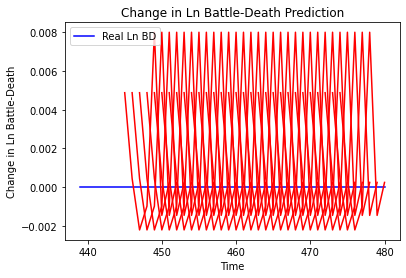

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritania', 'country_id': 244, 'step': 't+1', 'mse': 2.3795532584858226e-05, 'mae': 0.0048780664801597595, 'r2': 0.0, 'tadda_score': 0.0048780664801597595}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+2', 'mse': 2.8319064857132425e-05, 'mae': 0.005321566015481949, 'r2': 0.0, 'tadda_score': 0.005321566015481949}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+3', 'mse': 9.6742213181842e-06, 'mae': 0.003110341029241681, 'r2': 0.0, 'tadda_score': 0.003110341029241681}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+4', 'mse': 4.532950941297945e-06, 'mae': 0.0021290727891027927, 'r2': 0.0, 'tadda_score': 0.0021290727891027927}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+5', 'mse': 9.382880226883276e-05, 'mae': 0.009686526842415333, 'r2': 0.0, 'tadda_score': 0.009686526842415333}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+6', 'mse': 6.767114800288257e-05, 'mae': 0.

Epoch 61/100
1/1 [==============================] - 0s 15ms/step - loss: 3.2504 - val_loss: 0.9051
Epoch 62/100
1/1 [==============================] - 0s 16ms/step - loss: 3.2278 - val_loss: 0.9051
Epoch 63/100
1/1 [==============================] - 0s 16ms/step - loss: 3.2207 - val_loss: 0.9052
Epoch 64/100
1/1 [==============================] - 0s 15ms/step - loss: 3.2629 - val_loss: 0.9052
Epoch 65/100
1/1 [==============================] - 0s 16ms/step - loss: 3.2524 - val_loss: 0.9052
Epoch 66/100
1/1 [==============================] - 0s 15ms/step - loss: 3.2343 - val_loss: 0.9052
Epoch 67/100
1/1 [==============================] - 0s 14ms/step - loss: 3.2294 - val_loss: 0.9053
Epoch 68/100
1/1 [==============================] - 0s 16ms/step - loss: 3.2594 - val_loss: 0.9053
Epoch 69/100
1/1 [==============================] - 0s 20ms/step - loss: 3.2585 - val_loss: 0.9053
Epoch 70/100
1/1 [==============================] - 0s 15ms/step - loss: 3.2200 - val_loss: 0.9053
Epoch 71/1

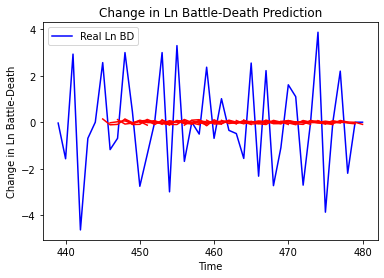

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sudan', 'country_id': 245, 'step': 't+1', 'mse': 3.865414875366964, 'mae': 1.6544215932333002, 'r2': 0.033970957444207306, 'tadda_score': 1.670481822003278}
{'country': 'Sudan', 'country_id': 245, 'step': 't+2', 'mse': 4.27422673486354, 'mae': 1.6994573098956998, 'r2': -0.0017518765190913665, 'tadda_score': 1.7067237254271364}
{'country': 'Sudan', 'country_id': 245, 'step': 't+3', 'mse': 3.856191273540072, 'mae': 1.6740563783215159, 'r2': 0.005637557612439892, 'tadda_score': 1.7015449252020989}
{'country': 'Sudan', 'country_id': 245, 'step': 't+4', 'mse': 3.301886968802743, 'mae': 1.4355620090243346, 'r2': 0.005482934952825036, 'tadda_score': 1.4502418471204368}
{'country': 'Sudan', 'country_id': 245, 'step': 't+5', 'mse': 5.182733708829752, 'mae': 1.92833563030348, 'r2': 0.011456883671833618, 'tadda_score': 1.9540062709707595}
{'country': 'Sudan', 'country_id': 245, 'step': 't+6', 'mse': 4.630096545983778, 'mae

1/1 [==============================] - 0s 16ms/step - loss: 6.6426 - val_loss: 4.1782
Epoch 61/100
1/1 [==============================] - 0s 15ms/step - loss: 6.6751 - val_loss: 4.1783
Epoch 62/100
1/1 [==============================] - 0s 16ms/step - loss: 6.6599 - val_loss: 4.1784
Epoch 63/100
1/1 [==============================] - 0s 16ms/step - loss: 6.6629 - val_loss: 4.1785
Epoch 64/100
1/1 [==============================] - 0s 15ms/step - loss: 6.6682 - val_loss: 4.1786
Epoch 65/100
1/1 [==============================] - 0s 16ms/step - loss: 6.6479 - val_loss: 4.1788
Epoch 66/100
1/1 [==============================] - 0s 16ms/step - loss: 6.5840 - val_loss: 4.1788
Epoch 67/100
1/1 [==============================] - 0s 15ms/step - loss: 6.5785 - val_loss: 4.1789
Epoch 68/100
1/1 [==============================] - 0s 15ms/step - loss: 6.5954 - val_loss: 4.1790
Epoch 69/100
1/1 [==============================] - 0s 15ms/step - loss: 6.6536 - val_loss: 4.1791
Epoch 70/100
1/1 [=====

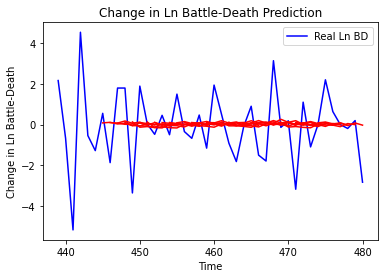

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Sudan', 'country_id': 246, 'step': 't+1', 'mse': 2.2829319932811254, 'mae': 1.1897509905123913, 'r2': -0.026220492282815977, 'tadda_score': 1.2400227891826832}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+2', 'mse': 2.9609512353082863, 'mae': 1.3653503100810436, 'r2': -0.09567937551730554, 'tadda_score': 1.474258745286662}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+3', 'mse': 3.0159401570793776, 'mae': 1.4283006648500787, 'r2': -0.1535103945853029, 'tadda_score': 1.546396081674102}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+4', 'mse': 3.61668069699989, 'mae': 1.565037790833766, 'r2': -0.14734881286588464, 'tadda_score': 1.7098631785798617}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+5', 'mse': 2.904464111589895, 'mae': 1.3072254736143374, 'r2': -0.15147645207209615, 'tadda_score': 1.396243560703399}
{'country': 'South Sudan', 'country_id': 246, 'step': '

In [14]:
np.random.seed(1)
tf.random.set_seed(1)
model = Sequential()
summary_model(dataset=df,
              modelname = "Vanilla",
              pred_africa=True,
              period=period_test, 
              epochs=100, 
              batch_size=64, #need small batch size
              look_back=6, 
              look_forward=7,
              num_neurons=2, 
              val_split=0.2)

['Cape Verde']
Building vanilla Model...
Model: "sequential_56"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_54 (LSTM)               (None, 10)                480       
_________________________________________________________________
dropout_108 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_108 (Dense)            (None, 10)                110       
_________________________________________________________________
dropout_109 (Dropout)        (None, 10)                0         
_________________________________________________________________
dense_109 (Dense)            (None, 7)                 77        
Total params: 667
Trainable params: 667
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
4/4 [==============================] - 0s 64ms/step - loss: 0.0000e+

4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 72/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 75/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 76/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 77/100
4/4 [==============================] - 0s 8ms/

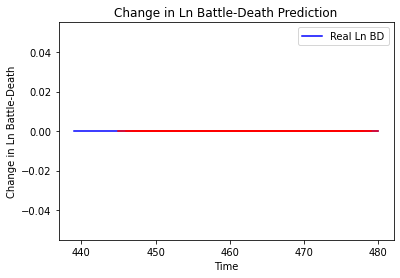

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
["Cote d'Ivoire"]
Building vanilla Model...
Model: "sequential_57"
_________________________________________________________________
Layer (

4/4 [==============================] - 0s 7ms/step - loss: 0.5484 - val_loss: 0.2792
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5516 - val_loss: 0.2792
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5490 - val_loss: 0.2792
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5449 - val_loss: 0.2792
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5444 - val_loss: 0.2792
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5459 - val_loss: 0.2793
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5424 - val_loss: 0.2794
Epoch 72/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5481 - val_loss: 0.2793
Epoch 73/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5440 - val_loss: 0.2795
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5410 - val_loss: 0.2795
Epoch 75/100
4/4 [===============

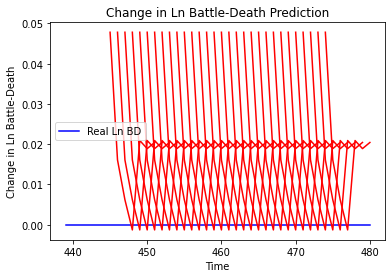

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+1', 'mse': 0.002285905404553701, 'mae': 0.04781114310026169, 'r2': 0.0, 'tadda_score': 0.04781114310026169}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+2', 'mse': 0.004082672205790949, 'mae': 0.06389579176902771, 'r2': 0.0, 'tadda_score': 0.06389579176902771}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+3', 'mse': 0.004910963736588281, 'mae': 0.07007826864719391, 'r2': 0.0, 'tadda_score': 0.07007826864719391}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+4', 'mse': 0.004730282207476899, 'mae': 0.06877704709768295, 'r2': 0.0, 'tadda_score': 0.06877704709768295}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+5', 'mse': 0.005416467821849125, 'mae': 0.07359665632247925, 'r2': 0.0, 'tadda_score': 0.07359665632247925}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+6', 'mse': 0.008554763037500523, 'mae': 0.09249196

Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [============================

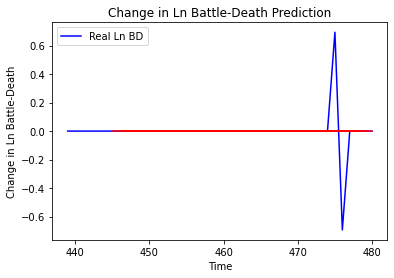

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ghana', 'country_id': 42, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Liberia']
Building vanilla Model...
Model: "sequential_59"
_________________________________________________________________
Layer (type)                 Output Shape       

Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2029 - val_loss: 2.0649e-04
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 1.1961 - val_loss: 2.4431e-04
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 1.1973 - val_loss: 2.5190e-04
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 1.1921 - val_loss: 2.8664e-04
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 1.1965 - val_loss: 2.9887e-04
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2000 - val_loss: 3.3372e-04
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 1.1954 - val_loss: 2.9322e-04
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2086 - val_loss: 2.6729e-04
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 1.1932 - val_loss: 3.0352e-04
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2087 - v

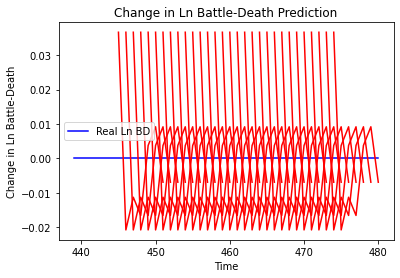

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Liberia', 'country_id': 43, 'step': 't+1', 'mse': 0.0013440660001293736, 'mae': 0.036661505699157715, 'r2': 0.0, 'tadda_score': 0.036661505699157715}
{'country': 'Liberia', 'country_id': 43, 'step': 't+2', 'mse': 0.00025303907279573823, 'mae': 0.015907201915979385, 'r2': 0.0, 'tadda_score': 0.015907201915979385}
{'country': 'Liberia', 'country_id': 43, 'step': 't+3', 'mse': 2.1573803465100433e-05, 'mae': 0.004644760861992836, 'r2': 0.0, 'tadda_score': 0.004644760861992836}
{'country': 'Liberia', 'country_id': 43, 'step': 't+4', 'mse': 0.00014171336083440914, 'mae': 0.011904342100024223, 'r2': 0.0, 'tadda_score': 0.011904342100024223}
{'country': 'Liberia', 'country_id': 43, 'step': 't+5', 'mse': 0.0001594623206080401, 'mae': 0.012627839110791683, 'r2': 0.0, 'tadda_score': 0.012627839110791683}
{'country': 'Liberia', 'country_id': 43, 'step': 't+6', 'mse': 0.0004765350744467961, 'mae': 0.02182968333363533, 'r2': 

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 9ms

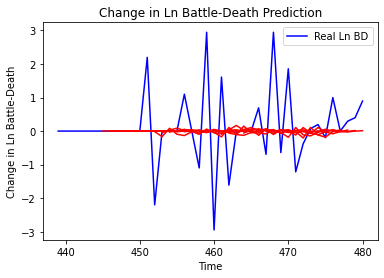

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+1', 'mse': 1.6596591016155549, 'mae': 0.8230977006566204, 'r2': -0.006413867051419331, 'tadda_score': 0.8300058649231173}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+2', 'mse': 1.255374176453313, 'mae': 0.7618944570811997, 'r2': -0.06084353320770175, 'tadda_score': 0.7860467809331825}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+3', 'mse': 2.0718775390724344, 'mae': 0.9144125177577203, 'r2': -0.039256847866670164, 'tadda_score': 0.9244635157028899}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+4', 'mse': 2.450636403820016, 'mae': 1.030914755264969, 'r2': -0.10397375676197185, 'tadda_score': 1.056467222087136}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+5', 'mse': 2.42677626485835, 'mae': 0.9676797071914327, 'r2': -0.16415509509942128, 'tadda_score': 0.9901067289034974}
{'country': 'Burkina Faso', 'country_id': 47, 'step'

4/4 [==============================] - 0s 8ms/step - loss: 0.2584 - val_loss: 3.7124e-06
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2617 - val_loss: 6.1023e-06
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2611 - val_loss: 1.5356e-05
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2567 - val_loss: 2.6834e-05
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2610 - val_loss: 4.4788e-05
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2587 - val_loss: 5.2529e-05
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2601 - val_loss: 6.1502e-05
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2599 - val_loss: 6.0961e-05
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2584 - val_loss: 6.2123e-05
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2560 - val_loss: 4.91

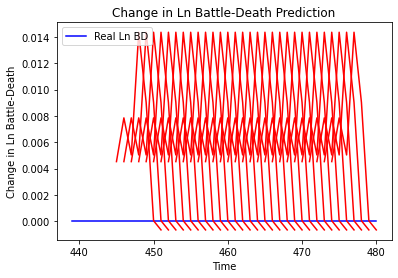

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea', 'country_id': 48, 'step': 't+1', 'mse': 2.0482471566083543e-05, 'mae': 0.00452575646340847, 'r2': 0.0, 'tadda_score': 0.00452575646340847}
{'country': 'Guinea', 'country_id': 48, 'step': 't+2', 'mse': 0.00015318746499640937, 'mae': 0.012376892380416393, 'r2': 0.0, 'tadda_score': 0.012376892380416393}
{'country': 'Guinea', 'country_id': 48, 'step': 't+3', 'mse': 0.00030311831005769285, 'mae': 0.017410293221473694, 'r2': 0.0, 'tadda_score': 0.017410293221473694}
{'country': 'Guinea', 'country_id': 48, 'step': 't+4', 'mse': 0.0010095936622214197, 'mae': 0.03177410364151001, 'r2': 0.0, 'tadda_score': 0.03177410364151001}
{'country': 'Guinea', 'country_id': 48, 'step': 't+5', 'mse': 0.0010858556277357767, 'mae': 0.03295232355594635, 'r2': 0.0, 'tadda_score': 0.03295232355594635}
{'country': 'Guinea', 'country_id': 48, 'step': 't+6', 'mse': 0.0010877375702760816, 'mae': 0.032980866730213165, 'r2': 0.0, 'tadda

4/4 [==============================] - 0s 8ms/step - loss: 0.6722 - val_loss: 1.0621e-04
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6626 - val_loss: 9.4441e-05
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.6822 - val_loss: 8.7120e-05
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6696 - val_loss: 9.2106e-05
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6522 - val_loss: 7.6343e-05
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.6627 - val_loss: 8.5484e-05
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6704 - val_loss: 7.7725e-05
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6602 - val_loss: 6.6185e-05
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.6495 - val_loss: 8.1040e-05
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 0.6592 - val_loss: 8.20

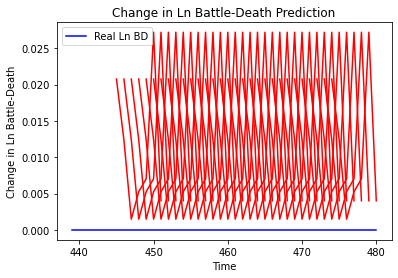

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+1', 'mse': 0.00043064309466002426, 'mae': 0.020751941949129105, 'r2': 0.0, 'tadda_score': 0.020751941949129105}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+2', 'mse': 0.001099622728441274, 'mae': 0.033160559833049774, 'r2': 0.0, 'tadda_score': 0.033160559833049774}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+3', 'mse': 0.0012001324152813297, 'mae': 0.03464292734861374, 'r2': 0.0, 'tadda_score': 0.03464292734861374}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+4', 'mse': 0.001591627219582184, 'mae': 0.039895202964544296, 'r2': 0.0, 'tadda_score': 0.039895202964544296}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+5', 'mse': 0.0011915439995116017, 'mae': 0.03451874852180481, 'r2': 0.0, 'tadda_score': 0.03451874852180481}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+6', 'mse': 0.003807786177338471, 'mae': 

4/4 [==============================] - 0s 7ms/step - loss: 1.2840 - val_loss: 3.0322
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2837 - val_loss: 3.0308
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2885 - val_loss: 3.0298
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2848 - val_loss: 3.0292
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2813 - val_loss: 3.0287
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2800 - val_loss: 3.0278
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2791 - val_loss: 3.0274
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2800 - val_loss: 3.0269
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2899 - val_loss: 3.0268
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2751 - val_loss: 3.0259
Epoch 71/100
4/4 [===============

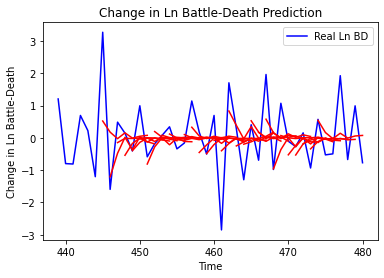

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mali', 'country_id': 50, 'step': 't+1', 'mse': 0.8119873173300817, 'mae': 0.636762482099167, 'r2': 0.3567985449139187, 'tadda_score': 0.7088579296295161}
{'country': 'Mali', 'country_id': 50, 'step': 't+2', 'mse': 1.7183160356706486, 'mae': 1.0148052652152835, 'r2': -0.7747917628050349, 'tadda_score': 1.3485782963010136}
{'country': 'Mali', 'country_id': 50, 'step': 't+3', 'mse': 1.538128239077985, 'mae': 1.0353369797275536, 'r2': -0.35484480766122917, 'tadda_score': 1.3480243233348996}
{'country': 'Mali', 'country_id': 50, 'step': 't+4', 'mse': 2.3402123208246306, 'mae': 1.268382347560231, 'r2': -0.5649026200763447, 'tadda_score': 1.6724874036374728}
{'country': 'Mali', 'country_id': 50, 'step': 't+5', 'mse': 1.942474845155027, 'mae': 1.1347589908344986, 'r2': -0.793968363273293, 'tadda_score': 1.4529555512769463}
{'country': 'Mali', 'country_id': 50, 'step': 't+6', 'mse': 2.1560188363720694, 'mae': 1.206440622

4/4 [==============================] - 0s 7ms/step - loss: 1.6555 - val_loss: 0.4308
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 1.6665 - val_loss: 0.4309
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 1.6535 - val_loss: 0.4309
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 1.6486 - val_loss: 0.4307
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 1.6384 - val_loss: 0.4305
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 1.6489 - val_loss: 0.4304
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 1.6567 - val_loss: 0.4302
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 1.6452 - val_loss: 0.4300
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 1.6471 - val_loss: 0.4300
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 1.6393 - val_loss: 0.4300
Epoch 71/100
4/4 [===============

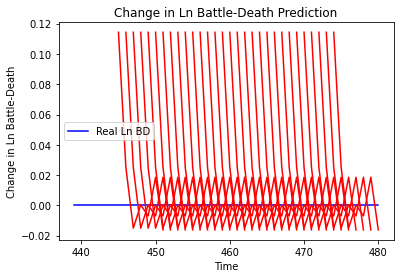

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Senegal', 'country_id': 52, 'step': 't+1', 'mse': 0.01307055357642839, 'mae': 0.11432652175426483, 'r2': 0.0, 'tadda_score': 0.11432652175426483}
{'country': 'Senegal', 'country_id': 52, 'step': 't+2', 'mse': 0.01941798146547402, 'mae': 0.13934841752052307, 'r2': 0.0, 'tadda_score': 0.13934841752052307}
{'country': 'Senegal', 'country_id': 52, 'step': 't+3', 'mse': 0.015449531326512167, 'mae': 0.1242961436510086, 'r2': 0.0, 'tadda_score': 0.1242961436510086}
{'country': 'Senegal', 'country_id': 52, 'step': 't+4', 'mse': 0.015522106073221131, 'mae': 0.12458774447441101, 'r2': 0.0, 'tadda_score': 0.12458774447441101}
{'country': 'Senegal', 'country_id': 52, 'step': 't+5', 'mse': 0.008568366133350713, 'mae': 0.09256546944379807, 'r2': 0.0, 'tadda_score': 0.09256546944379807}
{'country': 'Senegal', 'country_id': 52, 'step': 't+6', 'mse': 0.012352612520850847, 'mae': 0.11114230751991272, 'r2': 0.0, 'tadda_score': 0.1

4/4 [==============================] - 0s 7ms/step - loss: 2.1648 - val_loss: 1.6942e-04
Epoch 60/100
4/4 [==============================] - 0s 7ms/step - loss: 2.1593 - val_loss: 2.1793e-04
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 2.1656 - val_loss: 2.8238e-04
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 2.1578 - val_loss: 3.8757e-04
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 2.1731 - val_loss: 4.0400e-04
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 2.1699 - val_loss: 3.8572e-04
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 2.1797 - val_loss: 3.5264e-04
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 2.1526 - val_loss: 3.2978e-04
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 2.1791 - val_loss: 2.7087e-04
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 2.1400 - val_loss: 2.00

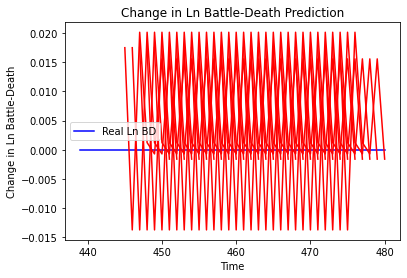

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+1', 'mse': 0.00030614094513126133, 'mae': 0.017496883869171143, 'r2': 0.0, 'tadda_score': 0.017496883869171143}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+2', 'mse': 1.422438584295152e-05, 'mae': 0.0037715230137109756, 'r2': 0.0, 'tadda_score': 0.0037715230137109756}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+3', 'mse': 0.0005719082613494554, 'mae': 0.023914603516459465, 'r2': 0.0, 'tadda_score': 0.023914603516459465}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+4', 'mse': 0.0006322800098810567, 'mae': 0.02514517866075039, 'r2': 0.0, 'tadda_score': 0.02514517866075039}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+5', 'mse': 0.0014567315340647952, 'mae': 0.03816715255379677, 'r2': 0.0, 'tadda_score': 0.03816715255379677}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+6', 'mse': 0.0028885964693326494, 'mae': 0

Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [============================

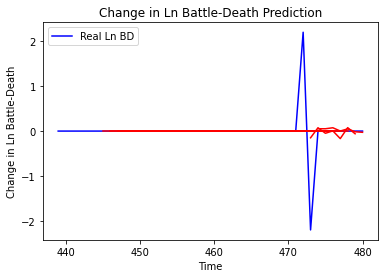

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'The Gambia', 'country_id': 54, 'step': 't+1', 'mse': 0.3008335058232604, 'mae': 0.1432371430972356, 'r2': 0.06530790989064483, 'tadda_score': 0.1432371430972356}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+2', 'mse': 0.33756865439487843, 'mae': 0.1524368192632137, 'r2': -0.04882848826394026, 'tadda_score': 0.15588893005044643}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+3', 'mse': 0.16248689634950844, 'mae': 0.0832825155744522, 'r2': -0.044513261742566756, 'tadda_score': 0.0832825155744522}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+4', 'mse': 0.16246639358113818, 'mae': 0.08317818807458571, 'r2': -0.044381463954890954, 'tadda_score': 0.08317818807458571}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+5', 'mse': 0.1663078553000534, 'mae': 0.09115852978721949, 'r2': -0.06907550267449691, 'tadda_score': 0.09115852978721949}
{'country': 'The Gambia', 'country_id': 54, 'step

4/4 [==============================] - 0s 8ms/step - loss: 0.6189 - val_loss: 1.4382e-04
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6249 - val_loss: 1.5497e-04
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6255 - val_loss: 1.8801e-04
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6249 - val_loss: 2.0567e-04
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6238 - val_loss: 2.3456e-04
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.6193 - val_loss: 2.7609e-04
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.6197 - val_loss: 2.8070e-04
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.6200 - val_loss: 3.1067e-04
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6217 - val_loss: 3.7502e-04
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.6195 - val_loss: 3.60

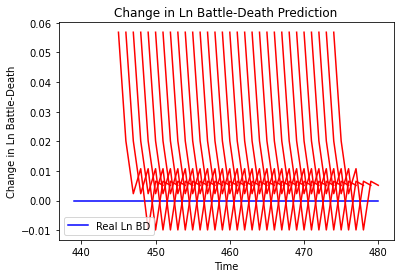

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Djibouti', 'country_id': 55, 'step': 't+1', 'mse': 0.003230039740288737, 'mae': 0.05683343857526779, 'r2': 0.0, 'tadda_score': 0.05683343857526779}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+2', 'mse': 0.0059230281309874955, 'mae': 0.0769612118601799, 'r2': 0.0, 'tadda_score': 0.0769612118601799}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+3', 'mse': 0.006285639172976476, 'mae': 0.07928202301263809, 'r2': 0.0, 'tadda_score': 0.07928202301263809}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+4', 'mse': 0.008105459858829045, 'mae': 0.09003032743930817, 'r2': 0.0, 'tadda_score': 0.09003032743930817}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+5', 'mse': 0.0035973623698098423, 'mae': 0.05997801572084427, 'r2': 0.0, 'tadda_score': 0.05997801572084427}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+6', 'mse': 0.0044207905718371965, 'mae': 0.06648902595043182, 'r2': 0.0, 'tadda_

Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9898 - val_loss: 0.0284
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9964 - val_loss: 0.0284
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9882 - val_loss: 0.0284
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9825 - val_loss: 0.0285
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9867 - val_loss: 0.0285
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9887 - val_loss: 0.0285
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9813 - val_loss: 0.0286
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9868 - val_loss: 0.0286
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9851 - val_loss: 0.0286
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9982 - val_loss: 0.0287
Epoch 72/100
4/4 [==

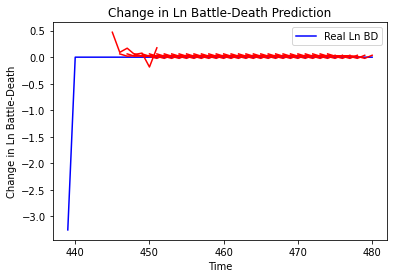

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Eritrea', 'country_id': 56, 'step': 't+1', 'mse': 0.01105694089671358, 'mae': 0.07539336644113064, 'r2': 0.0, 'tadda_score': 0.07539336644113064}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+2', 'mse': 0.01676277123779538, 'mae': 0.09653206368287405, 'r2': 0.0, 'tadda_score': 0.09653206368287405}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+3', 'mse': 0.029019518399742712, 'mae': 0.12859056989351908, 'r2': 0.0, 'tadda_score': 0.12859056989351908}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+4', 'mse': 0.037798825242792704, 'mae': 0.1558845619360606, 'r2': 0.0, 'tadda_score': 0.1558845619360606}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+5', 'mse': 0.03587993186692806, 'mae': 0.1509837806224823, 'r2': 0.0, 'tadda_score': 0.1509837806224823}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+6', 'mse': 0.022423041148966857, 'mae': 0.12318708946307501, 'r2': 0.0, 'tadda_score': 0.1231

Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 4.5749 - val_loss: 2.6215
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 4.6235 - val_loss: 2.6185
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 4.5571 - val_loss: 2.6158
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 4.6097 - val_loss: 2.6128
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 4.5587 - val_loss: 2.6101
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 4.5840 - val_loss: 2.6075
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 4.5936 - val_loss: 2.6049
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 4.5525 - val_loss: 2.6022
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 4.5254 - val_loss: 2.5996
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 4.5465 - val_loss: 2.5970
Epoch 72/100
4/4 [==

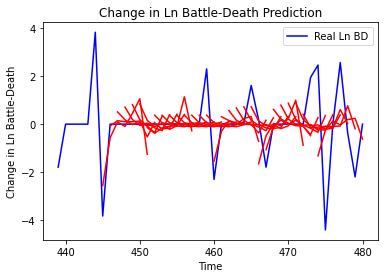

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+1', 'mse': 1.2001212404371207, 'mae': 0.8231972355883326, 'r2': 0.12030121966438156, 'tadda_score': 0.9228792935476705}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+2', 'mse': 3.779971150132377, 'mae': 1.4137874425631471, 'r2': -0.8944987047813919, 'tadda_score': 1.5913439496042041}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+3', 'mse': 4.105708006698489, 'mae': 1.4695840501469086, 'r2': -1.0577560494419322, 'tadda_score': 1.708634775249333}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+4', 'mse': 4.251339531229343, 'mae': 1.4677983948272177, 'r2': -1.130745689743653, 'tadda_score': 1.7264178701919028}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+5', 'mse': 3.24732726425873, 'mae': 1.197296603389751, 'r2': -0.627540807004312, 'tadda_score': 1.3640082427543114}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+6', 'mse': 2.415565673638993,

4/4 [==============================] - 0s 9ms/step - loss: 0.9259 - val_loss: 1.0117
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9255 - val_loss: 1.0114
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9248 - val_loss: 1.0111
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9203 - val_loss: 1.0108
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9267 - val_loss: 1.0105
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9215 - val_loss: 1.0101
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9186 - val_loss: 1.0097
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9231 - val_loss: 1.0093
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9206 - val_loss: 1.0089
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9205 - val_loss: 1.0085
Epoch 71/100
4/4 [===============

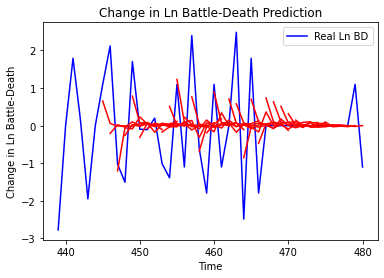

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Algeria', 'country_id': 67, 'step': 't+1', 'mse': 1.0649493899513687, 'mae': 0.7852938572764433, 'r2': 0.33226544197944574, 'tadda_score': 0.8193062149186966}
{'country': 'Algeria', 'country_id': 67, 'step': 't+2', 'mse': 2.3406680649428324, 'mae': 1.1571261660130199, 'r2': -0.3897802082385917, 'tadda_score': 1.4106948128214856}
{'country': 'Algeria', 'country_id': 67, 'step': 't+3', 'mse': 2.6485929976425524, 'mae': 1.2630945580349375, 'r2': -0.47647105834709746, 'tadda_score': 1.5452721309806914}
{'country': 'Algeria', 'country_id': 67, 'step': 't+4', 'mse': 2.7054664057009368, 'mae': 1.2674540251314668, 'r2': -0.3252418906130645, 'tadda_score': 1.49400036184192}
{'country': 'Algeria', 'country_id': 67, 'step': 't+5', 'mse': 1.9443419982233712, 'mae': 1.0190393562047821, 'r2': -0.44477974942213905, 'tadda_score': 1.2093712833950065}
{'country': 'Algeria', 'country_id': 67, 'step': 't+6', 'mse': 2.0649693930532

4/4 [==============================] - 0s 8ms/step - loss: 0.1905 - val_loss: 1.4666
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1872 - val_loss: 1.4666
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1889 - val_loss: 1.4665
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1876 - val_loss: 1.4666
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1886 - val_loss: 1.4666
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1929 - val_loss: 1.4664
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1902 - val_loss: 1.4663
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1912 - val_loss: 1.4664
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1914 - val_loss: 1.4664
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1865 - val_loss: 1.4664
Epoch 71/100
4/4 [===============

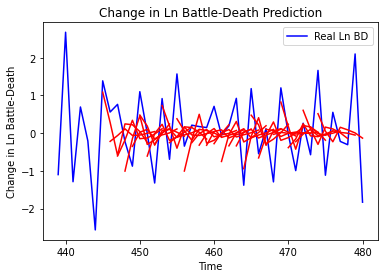

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cameroon', 'country_id': 69, 'step': 't+1', 'mse': 0.5484918208801809, 'mae': 0.6546579478450881, 'r2': 0.2552295210833404, 'tadda_score': 0.749166318602191}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+2', 'mse': 1.6699340673943361, 'mae': 1.1258031862311422, 'r2': -1.2623981278040253, 'tadda_score': 1.5575470817419748}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+3', 'mse': 1.3858068848172478, 'mae': 0.9559581604941538, 'r2': -0.4140843272209027, 'tadda_score': 1.1491682685756535}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+4', 'mse': 1.5696668392910644, 'mae': 0.9898706116873345, 'r2': -0.7823156540309866, 'tadda_score': 1.2610343919295393}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+5', 'mse': 1.7647945937798442, 'mae': 1.0901292532093878, 'r2': -0.7742242927096541, 'tadda_score': 1.3934330144929445}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+6', 'mse': 2.015848995

4/4 [==============================] - 0s 8ms/step - loss: 0.7378 - val_loss: 2.4180
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7396 - val_loss: 2.4173
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7399 - val_loss: 2.4166
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7377 - val_loss: 2.4161
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7352 - val_loss: 2.4154
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7393 - val_loss: 2.4145
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7362 - val_loss: 2.4140
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7384 - val_loss: 2.4136
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7279 - val_loss: 2.4132
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7276 - val_loss: 2.4123
Epoch 70/100
4/4 [===============

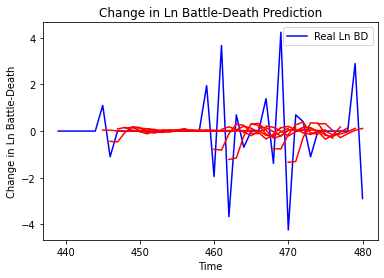

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+1', 'mse': 1.8403189323841402, 'mae': 0.8241309537283008, 'r2': 0.3041575156925769, 'tadda_score': 0.8268605514160221}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+2', 'mse': 2.1619860253673293, 'mae': 1.0574170859477692, 'r2': -0.4767934470972235, 'tadda_score': 1.1230127377382688}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+3', 'mse': 2.328117963355387, 'mae': 1.0414937809587554, 'r2': 0.006699121014228537, 'tadda_score': 1.0829813247403537}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+4', 'mse': 2.8769516807240283, 'mae': 1.1400045765767117, 'r2': -0.189980132650162, 'tadda_score': 1.1862149584620814}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+5', 'mse': 2.5705953201416776, 'mae': 0.9611561528892744, 'r2': -0.014379901593990274, 'tadda_score': 0.98319192660

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.3713
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.3713
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.3713
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.3713
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.3713
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.3713
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.3713
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.3713
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.3713
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 

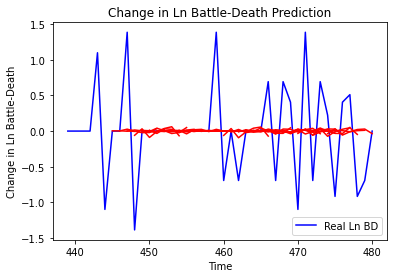

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tunisia', 'country_id': 73, 'step': 't+1', 'mse': 0.40069608040066335, 'mae': 0.4001455939825649, 'r2': 0.02941714772402293, 'tadda_score': 0.4023606773606216}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+2', 'mse': 0.42093279294916897, 'mae': 0.4218485565633685, 'r2': -0.02293238907514583, 'tadda_score': 0.4256210981645793}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+3', 'mse': 0.4944109318624258, 'mae': 0.4810045335049208, 'r2': -0.034756222313242935, 'tadda_score': 0.4926184734402623}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+4', 'mse': 0.5190741854664793, 'mae': 0.4777095784790627, 'r2': -0.0749786265409027, 'tadda_score': 0.49100060873203594}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+5', 'mse': 0.4717601690772944, 'mae': 0.4587607617253576, 'r2': -0.07233178673563434, 'tadda_score': 0.4742339588310088}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+6', 'mse': 0.570784

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/

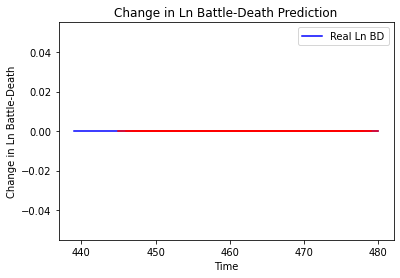

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Benin', 'country_id': 74, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Equatorial Guinea']
Building vanilla Model...
Model: "sequential_75"
_________________________________________________________________
Layer (type)                 Output Sh

4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 7ms/

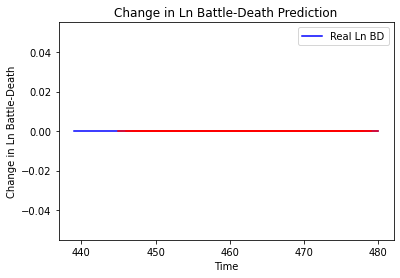

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Niger']
Building vanilla Model...
Model: "sequential_76"
________________________________

4/4 [==============================] - 0s 8ms/step - loss: 0.8572 - val_loss: 1.6350
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8514 - val_loss: 1.6345
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8536 - val_loss: 1.6339
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8495 - val_loss: 1.6333
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8408 - val_loss: 1.6328
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8535 - val_loss: 1.6323
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8411 - val_loss: 1.6321
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8449 - val_loss: 1.6320
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 0.8542 - val_loss: 1.6316
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8528 - val_loss: 1.6312
Epoch 74/100
4/4 [===============

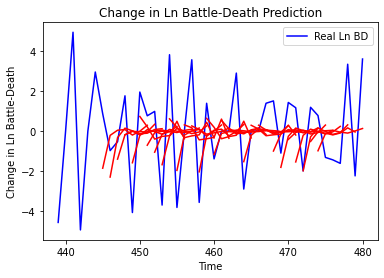

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Niger', 'country_id': 78, 'step': 't+1', 'mse': 3.159056213813849, 'mae': 1.5046058110546587, 'r2': 0.2707403864964105, 'tadda_score': 1.779457068160327}
{'country': 'Niger', 'country_id': 78, 'step': 't+2', 'mse': 6.824037871697794, 'mae': 2.1871726148467823, 'r2': -0.7378082508796593, 'tadda_score': 2.6570672132712168}
{'country': 'Niger', 'country_id': 78, 'step': 't+3', 'mse': 6.052411324197078, 'mae': 1.903810041839487, 'r2': -0.5627052043048597, 'tadda_score': 2.3951937076395806}
{'country': 'Niger', 'country_id': 78, 'step': 't+4', 'mse': 6.424064263653995, 'mae': 2.109792274115948, 'r2': -0.415856681358872, 'tadda_score': 2.5460897851769806}
{'country': 'Niger', 'country_id': 78, 'step': 't+5', 'mse': 7.501837450945557, 'mae': 2.19118616817632, 'r2': -0.3637650974802642, 'tadda_score': 2.620392376191802}
{'country': 'Niger', 'country_id': 78, 'step': 't+6', 'mse': 7.141939345071605, 'mae': 2.083676825274

4/4 [==============================] - 0s 8ms/step - loss: 0.5441 - val_loss: 1.1558
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5413 - val_loss: 1.1553
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5408 - val_loss: 1.1547
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5431 - val_loss: 1.1544
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5443 - val_loss: 1.1541
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5434 - val_loss: 1.1537
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5456 - val_loss: 1.1534
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5358 - val_loss: 1.1532
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5433 - val_loss: 1.1530
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5390 - val_loss: 1.1526
Epoch 71/100
4/4 [===============

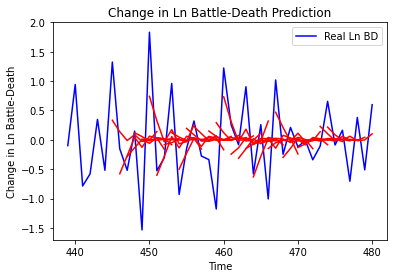

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Nigeria', 'country_id': 79, 'step': 't+1', 'mse': 0.3876019720236589, 'mae': 0.4681584003866716, 'r2': 0.32178876453932515, 'tadda_score': 0.514239431624711}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+2', 'mse': 1.0066687333507085, 'mae': 0.8038507854072849, 'r2': -0.8605140837780723, 'tadda_score': 1.0233876215421758}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+3', 'mse': 0.9582000364635593, 'mae': 0.797380627704037, 'r2': -0.5639234129647246, 'tadda_score': 1.0011464647450772}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+4', 'mse': 1.2336803377969885, 'mae': 0.870869741495096, 'r2': -0.6584491984420107, 'tadda_score': 1.1588077861499222}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+5', 'mse': 0.8316161919426079, 'mae': 0.6875298900171927, 'r2': -0.6243674876139154, 'tadda_score': 0.8767504142860384}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+6', 'mse': 0.7513698955751377

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/

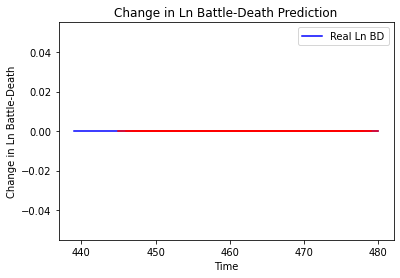

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Togo']
Building vanilla Model...
Model: "sequential_79"
_____

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 9ms/

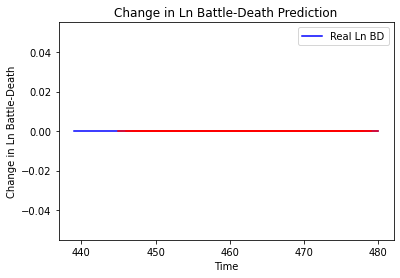

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Togo', 'country_id': 81, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Somalia']
Building vanilla Model...
Model: "sequential_80"
_________________________________________________________________
Layer (type)                 Output Shape              

4/4 [==============================] - 0s 7ms/step - loss: 2.5734 - val_loss: 0.3639
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 2.5718 - val_loss: 0.3638
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 2.5714 - val_loss: 0.3639
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 2.5805 - val_loss: 0.3640
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 2.5717 - val_loss: 0.3640
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 2.5934 - val_loss: 0.3640
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 2.5843 - val_loss: 0.3640
Epoch 72/100
4/4 [==============================] - 0s 7ms/step - loss: 2.5658 - val_loss: 0.3640
Epoch 73/100
4/4 [==============================] - 0s 7ms/step - loss: 2.5580 - val_loss: 0.3641
Epoch 74/100
4/4 [==============================] - 0s 7ms/step - loss: 2.5827 - val_loss: 0.3642
Epoch 75/100
4/4 [===============

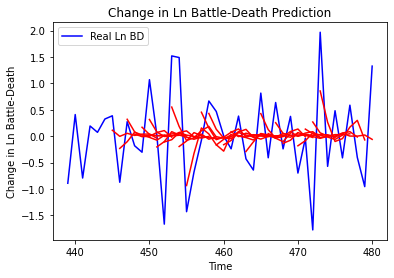

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Somalia', 'country_id': 120, 'step': 't+1', 'mse': 0.5458669310991955, 'mae': 0.5701949500730874, 'r2': 0.28343763114352893, 'tadda_score': 0.634913272342706}
{'country': 'Somalia', 'country_id': 120, 'step': 't+2', 'mse': 1.2865425940693274, 'mae': 0.8560043868872192, 'r2': -0.31195269939372916, 'tadda_score': 1.0261285942000813}
{'country': 'Somalia', 'country_id': 120, 'step': 't+3', 'mse': 1.210113276068742, 'mae': 0.8126555280846949, 'r2': -0.5162549898870972, 'tadda_score': 0.9935957733007863}
{'country': 'Somalia', 'country_id': 120, 'step': 't+4', 'mse': 0.9602259777688296, 'mae': 0.8039610476984431, 'r2': -0.38525041446961783, 'tadda_score': 0.9390070729398577}
{'country': 'Somalia', 'country_id': 120, 'step': 't+5', 'mse': 0.9023644950220224, 'mae': 0.7167703768610428, 'r2': -0.1705407697982606, 'tadda_score': 0.8567763388063233}
{'country': 'Somalia', 'country_id': 120, 'step': 't+6', 'mse': 0.9610104

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/

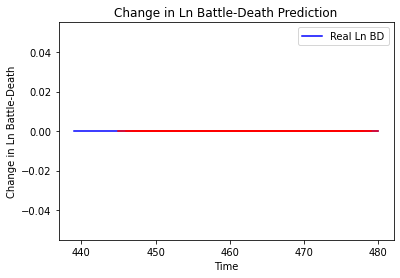

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Botswana', 'country_id': 154, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Burundi']
Building vanilla Model...
Model: "sequential_82"
_________________________________________________________________
Layer (type)        

4/4 [==============================] - 0s 8ms/step - loss: 1.9396 - val_loss: 1.6288
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9515 - val_loss: 1.6281
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9457 - val_loss: 1.6273
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9305 - val_loss: 1.6267
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9355 - val_loss: 1.6260
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9413 - val_loss: 1.6255
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9338 - val_loss: 1.6249
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9272 - val_loss: 1.6244
Epoch 73/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9481 - val_loss: 1.6237
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9358 - val_loss: 1.6232
Epoch 75/100
4/4 [===============

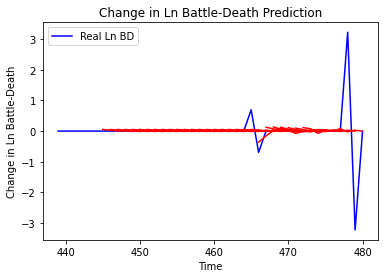

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burundi', 'country_id': 155, 'step': 't+1', 'mse': 0.022085194653333244, 'mae': 0.09362963574347975, 'r2': 0.31048841363621926, 'tadda_score': 0.09362963574347975}
{'country': 'Burundi', 'country_id': 155, 'step': 't+2', 'mse': 0.05806773830629778, 'mae': 0.15806711800116383, 'r2': -0.8129058396181899, 'tadda_score': 0.16456700451392017}
{'country': 'Burundi', 'country_id': 155, 'step': 't+3', 'mse': 0.059072068632025, 'mae': 0.15942519890485288, 'r2': -0.8442615694179683, 'tadda_score': 0.1667264410577027}
{'country': 'Burundi', 'country_id': 155, 'step': 't+4', 'mse': 0.05654834023680715, 'mae': 0.16881936428167504, 'r2': -0.765469419443626, 'tadda_score': 0.17516084598718168}
{'country': 'Burundi', 'country_id': 155, 'step': 't+5', 'mse': 0.039787062215404866, 'mae': 0.11340169670401098, 'r2': -0.2421733571072593, 'tadda_score': 0.11647356264013134}
{'country': 'Burundi', 'country_id': 155, 'step': 't+6', 'ms

Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 2.4227 - val_loss: 0.1810
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 2.4202 - val_loss: 0.1808
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 2.4339 - val_loss: 0.1805
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 2.4263 - val_loss: 0.1806
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 2.4458 - val_loss: 0.1806
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 2.4433 - val_loss: 0.1809
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 2.4480 - val_loss: 0.1812
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 2.4256 - val_loss: 0.1814
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 2.4334 - val_loss: 0.1814
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 2.4447 - val_loss: 0.1814
Epoch 71/100
4/4 [==

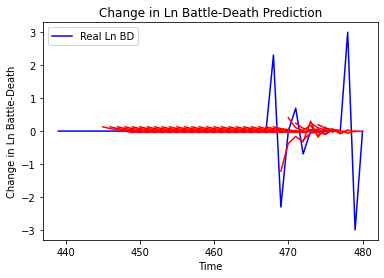

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Rwanda', 'country_id': 156, 'step': 't+1', 'mse': 0.23117107895660602, 'mae': 0.26575967294608116, 'r2': 0.4003189862132528, 'tadda_score': 0.26575967294608116}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+2', 'mse': 0.5730979954238792, 'mae': 0.4421637224419372, 'r2': -0.48667380213014066, 'tadda_score': 0.47060047857597037}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+3', 'mse': 0.4730365301156493, 'mae': 0.45981493180410543, 'r2': -0.6949365229983759, 'tadda_score': 0.4826669065695651}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+4', 'mse': 0.4732484043241287, 'mae': 0.4462490616145285, 'r2': -0.2827206180599384, 'tadda_score': 0.4462490616145285}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+5', 'mse': 0.4748744026137655, 'mae': 0.3500116763415487, 'r2': -0.2871278205184993, 'tadda_score': 0.3588345783852092}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+6', 'mse': 0.48784569

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 7ms/

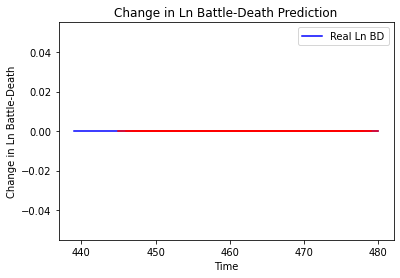

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zambia', 'country_id': 157, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Zimbabwe']
Building vanilla Model...
Model: "sequential_85"
_________________________________________________________________
Layer (type)                 Outp

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 8ms/

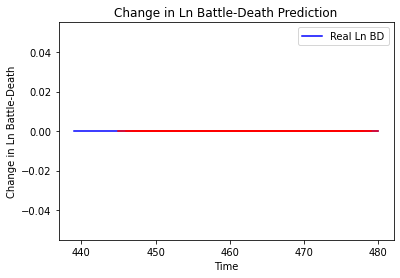

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Comoros']
Building vanilla Model...
Model: "sequential_86"
_________________________________________________________________
Layer (type)        

Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1291 - val_loss: 8.0692e-06
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1273 - val_loss: 1.3768e-05
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1274 - val_loss: 1.3124e-05
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1301 - val_loss: 1.3692e-05
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1297 - val_loss: 2.4499e-05
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1284 - val_loss: 3.0400e-05
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1283 - val_loss: 3.2808e-05
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1300 - val_loss: 3.2989e-05
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1284 - val_loss: 2.8863e-05
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1264 - v

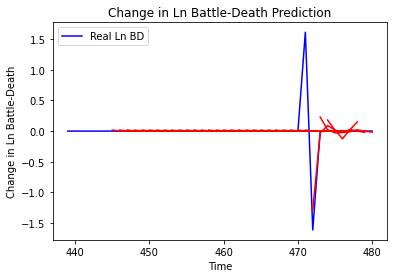

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Comoros', 'country_id': 159, 'step': 't+1', 'mse': 0.09117413492153048, 'mae': 0.09274105080165859, 'r2': 0.47202366692118736, 'tadda_score': 0.09274105080165859}
{'country': 'Comoros', 'country_id': 159, 'step': 't+2', 'mse': 0.2583671853863663, 'mae': 0.1802746325552304, 'r2': -0.4961672983855676, 'tadda_score': 0.18858103551664349}
{'country': 'Comoros', 'country_id': 159, 'step': 't+3', 'mse': 0.2416557844450273, 'mae': 0.17398068313249346, 'r2': -0.39939397339365224, 'tadda_score': 0.17961697135814425}
{'country': 'Comoros', 'country_id': 159, 'step': 't+4', 'mse': 0.13547052022035957, 'mae': 0.1162830152148922, 'r2': -0.6230834712010307, 'tadda_score': 0.1162830152148922}
{'country': 'Comoros', 'country_id': 159, 'step': 't+5', 'mse': 0.14314507060173948, 'mae': 0.12357290175158976, 'r2': -0.7150328920245081, 'tadda_score': 0.12357290175158976}
{'country': 'Comoros', 'country_id': 159, 'step': 't+6', 'mse'

4/4 [==============================] - 0s 8ms/step - loss: 0.1404 - val_loss: 1.0782e-05
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1409 - val_loss: 8.7252e-06
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1423 - val_loss: 1.1842e-05
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1419 - val_loss: 2.1358e-05
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1405 - val_loss: 1.7551e-05
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1398 - val_loss: 1.9646e-05
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1418 - val_loss: 1.4362e-05
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1428 - val_loss: 1.9063e-05
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1409 - val_loss: 2.2796e-05
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1402 - val_loss: 3.42

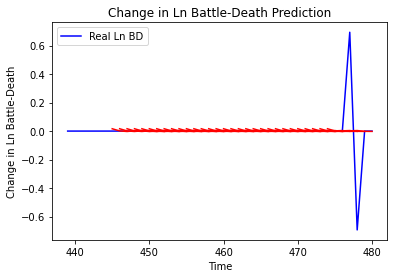

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Lesotho', 'country_id': 160, 'step': 't+1', 'mse': 0.0002666843524857243, 'mae': 0.016330473124980927, 'r2': 0.0, 'tadda_score': 0.016330473124980927}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+2', 'mse': 0.0003042604376672954, 'mae': 0.017443062737584114, 'r2': 0.0, 'tadda_score': 0.017443062737584114}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+3', 'mse': 0.00021323958893462117, 'mae': 0.014602725394070148, 'r2': 0.0, 'tadda_score': 0.014602725394070148}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+4', 'mse': 0.0002644522943924567, 'mae': 0.016261989250779152, 'r2': 0.0, 'tadda_score': 0.016261989250779152}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+5', 'mse': 0.00035479977291176523, 'mae': 0.0188361294567585, 'r2': 0.0, 'tadda_score': 0.0188361294567585}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+6', 'mse': 0.0002897897879155509, 'mae': 0.01702321320772171, 'r2':

Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [============================

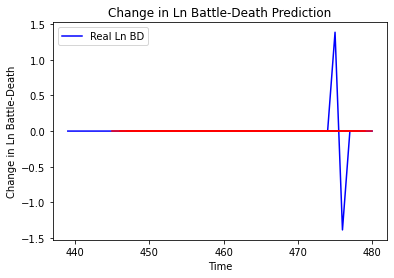

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Malawi', 'country_id': 161, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mozambique']
Building vanilla Model...
Model: "sequential_89"
_________________________________________________________________
Layer (type)                 Ou

4/4 [==============================] - 0s 7ms/step - loss: 1.0574 - val_loss: 0.6920
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.0330 - val_loss: 0.6921
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 1.0502 - val_loss: 0.6923
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 1.0483 - val_loss: 0.6924
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 1.0336 - val_loss: 0.6926
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 1.0568 - val_loss: 0.6931
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 1.0187 - val_loss: 0.6934
Epoch 72/100
4/4 [==============================] - 0s 7ms/step - loss: 1.1001 - val_loss: 0.6937
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 1.0251 - val_loss: 0.6941
Epoch 74/100
4/4 [==============================] - 0s 7ms/step - loss: 1.1064 - val_loss: 0.6942
Epoch 75/100
4/4 [===============

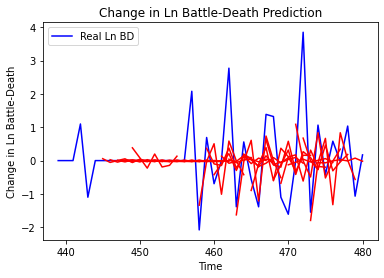

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mozambique', 'country_id': 162, 'step': 't+1', 'mse': 1.121857963706069, 'mae': 0.6399342706652387, 'r2': 0.28705439632781404, 'tadda_score': 0.6617018615431491}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+2', 'mse': 2.8593528189994712, 'mae': 1.1450880158043846, 'r2': -0.49444524352160624, 'tadda_score': 1.3604454308099494}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+3', 'mse': 2.4621852541353624, 'mae': 1.1072623798346997, 'r2': -0.2865239402370965, 'tadda_score': 1.2430837964983266}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+4', 'mse': 2.750448506798666, 'mae': 1.1731566193986895, 'r2': -0.8250804602091499, 'tadda_score': 1.4923165152633153}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+5', 'mse': 1.3518564805479194, 'mae': 0.8073260249872924, 'r2': -0.6506265905147912, 'tadda_score': 0.9216289927244109}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+6',

4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 7ms/

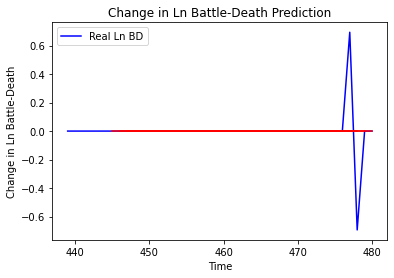

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Africa', 'country_id': 163, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Swaziland']
Building vanilla Model...
Model: "sequential_91"
________________________________________________________

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 8ms/

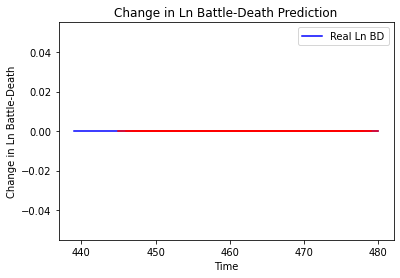

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Swaziland', 'country_id': 164, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Angola']
Building vanilla Model...
Model: "sequential_92"
_________________________________________________________________
Layer (type)  

4/4 [==============================] - 0s 8ms/step - loss: 3.3221 - val_loss: 0.0850
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3085 - val_loss: 0.0850
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3099 - val_loss: 0.0849
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 3.3318 - val_loss: 0.0848
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 3.3402 - val_loss: 0.0848
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3270 - val_loss: 0.0847
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 3.2886 - val_loss: 0.0848
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 3.2953 - val_loss: 0.0848
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 3.2889 - val_loss: 0.0849
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 3.3028 - val_loss: 0.0849
Epoch 75/100
4/4 [===============

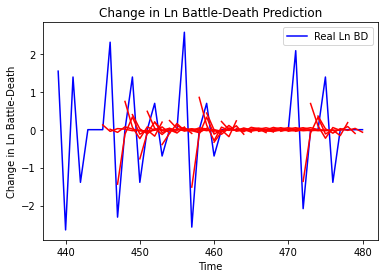

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Angola', 'country_id': 165, 'step': 't+1', 'mse': 0.7565769692631822, 'mae': 0.5572730902519863, 'r2': 0.40544543356479057, 'tadda_score': 0.5586071830180329}
{'country': 'Angola', 'country_id': 165, 'step': 't+2', 'mse': 2.070948139499962, 'mae': 0.9737151102410794, 'r2': -0.6274506404673379, 'tadda_score': 1.0958476958112955}
{'country': 'Angola', 'country_id': 165, 'step': 't+3', 'mse': 1.202938084488361, 'mae': 0.7671674378886628, 'r2': -0.37146306843638754, 'tadda_score': 0.809735392846148}
{'country': 'Angola', 'country_id': 165, 'step': 't+4', 'mse': 1.0876083276952186, 'mae': 0.7606916397789447, 'r2': -0.013259970365871787, 'tadda_score': 0.7668818630257576}
{'country': 'Angola', 'country_id': 165, 'step': 't+5', 'mse': 1.1836741527986931, 'mae': 0.7237022037032458, 'r2': -0.2089445012809108, 'tadda_score': 0.7500956050466212}
{'country': 'Angola', 'country_id': 165, 'step': 't+6', 'mse': 1.5143270169246

4/4 [==============================] - 0s 8ms/step - loss: 1.8967 - val_loss: 0.2222
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9068 - val_loss: 0.2221
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 1.8982 - val_loss: 0.2221
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9089 - val_loss: 0.2220
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9004 - val_loss: 0.2220
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.8971 - val_loss: 0.2219
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 1.8925 - val_loss: 0.2219
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 1.8894 - val_loss: 0.2218
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 1.8981 - val_loss: 0.2219
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 1.8819 - val_loss: 0.2220
Epoch 71/100
4/4 [===============

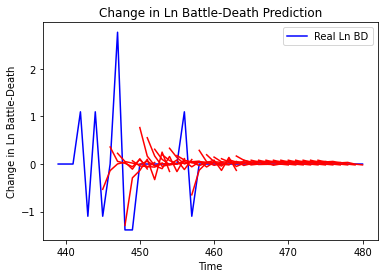

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo', 'country_id': 166, 'step': 't+1', 'mse': 0.3910909633963031, 'mae': 0.35694399971977736, 'r2': 0.22358875416314195, 'tadda_score': 0.3592184377135422}
{'country': 'Congo', 'country_id': 166, 'step': 't+2', 'mse': 1.2006228418970593, 'mae': 0.6804377168283068, 'r2': -0.5798544955125822, 'tadda_score': 0.7901606716081702}
{'country': 'Congo', 'country_id': 166, 'step': 't+3', 'mse': 1.138740152811954, 'mae': 0.6262049322595615, 'r2': -0.9199811268593463, 'tadda_score': 0.7452217266232192}
{'country': 'Congo', 'country_id': 166, 'step': 't+4', 'mse': 1.0784785834596056, 'mae': 0.6734864735623617, 'r2': -0.5525876142474093, 'tadda_score': 0.7833210576594293}
{'country': 'Congo', 'country_id': 166, 'step': 't+5', 'mse': 1.0117103358386377, 'mae': 0.6575155751427431, 'r2': -0.7058015789309613, 'tadda_score': 0.7403755924622634}
{'country': 'Congo', 'country_id': 166, 'step': 't+6', 'mse': 0.9506221989000166, '

Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9791 - val_loss: 3.2704
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9693 - val_loss: 3.2708
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 2.9536 - val_loss: 3.2712
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9616 - val_loss: 3.2720
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 2.9588 - val_loss: 3.2728
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 2.9745 - val_loss: 3.2732
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9529 - val_loss: 3.2735
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 2.9631 - val_loss: 3.2744
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9526 - val_loss: 3.2751
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 2.9612 - val_loss: 3.2759
Epoch 71/100
4/4 [==

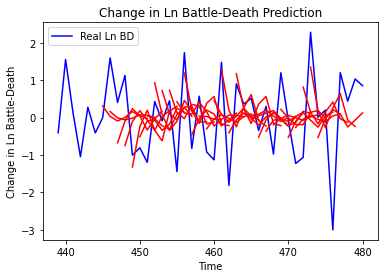

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+1', 'mse': 0.9009462492086394, 'mae': 0.7910321966463877, 'r2': 0.17682766866892108, 'tadda_score': 0.9519781279717439}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+2', 'mse': 2.4316814303788923, 'mae': 1.2791013550387358, 'r2': -0.7198103724059424, 'tadda_score': 1.6242258386439616}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+3', 'mse': 2.5638627114534325, 'mae': 1.3118875338923028, 'r2': -0.4863524586046666, 'tadda_score': 1.6663517707875461}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+4', 'mse': 3.2870620291262176, 'mae': 1.4993358435872273, 'r2': -0.8867538076219694, 'tadda_score': 1.9687874194376742}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+5', 'mse': 4.288284326013573, 'mae': 1.6494225709102486, 'r2': -1.3360129050415757, 'tadda_score': 2.2328295974395607}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+6',

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/

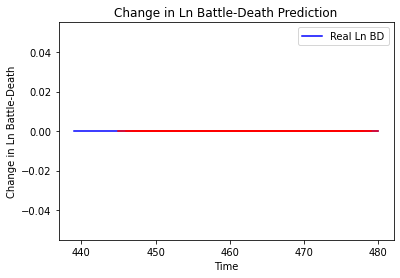

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Gabon', 'country_id': 169, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Namibia']
Building vanilla Model...
Model: "sequential_96"
_________________________________________________________________
Layer (type)                 Output Shape

Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1413 - val_loss: 2.4454e-05
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1394 - val_loss: 2.6485e-05
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1398 - val_loss: 2.0781e-05
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1404 - val_loss: 1.4695e-05
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1389 - val_loss: 9.2198e-06
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1395 - val_loss: 1.3498e-05
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1399 - val_loss: 1.1016e-05
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1394 - val_loss: 6.1149e-06
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1377 - val_loss: 1.4058e-05
Epoch 72/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1399 - v

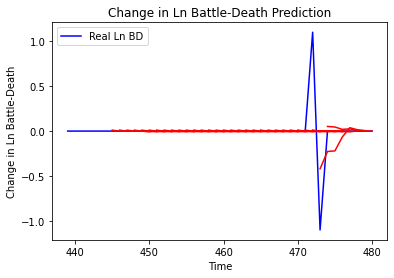

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Namibia', 'country_id': 170, 'step': 't+1', 'mse': 0.055020901337793936, 'mae': 0.07035926895236663, 'r2': 0.3161984915159426, 'tadda_score': 0.07035926895236663}
{'country': 'Namibia', 'country_id': 170, 'step': 't+2', 'mse': 0.101214710660362, 'mae': 0.10535004608974548, 'r2': -0.25789963718373254, 'tadda_score': 0.10857265391097161}
{'country': 'Namibia', 'country_id': 170, 'step': 't+3', 'mse': 0.06493763303574757, 'mae': 0.07975654697366404, 'r2': -0.6697523410407795, 'tadda_score': 0.07975654697366404}
{'country': 'Namibia', 'country_id': 170, 'step': 't+4', 'mse': 0.0688874773254836, 'mae': 0.08629086324024048, 'r2': -0.7713153552932803, 'tadda_score': 0.08629086324024048}
{'country': 'Namibia', 'country_id': 170, 'step': 't+5', 'mse': 0.05437591085598133, 'mae': 0.07816177689480629, 'r2': -0.39817699234615045, 'tadda_score': 0.07816177689480629}
{'country': 'Namibia', 'country_id': 170, 'step': 't+6', 'm

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/

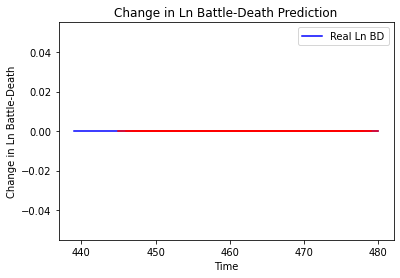

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Madagascar', 'country_id': 172, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mauritius']
Building vanilla Model...
Model: "sequential_98"
_________________________________________________________________
Laye

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 10

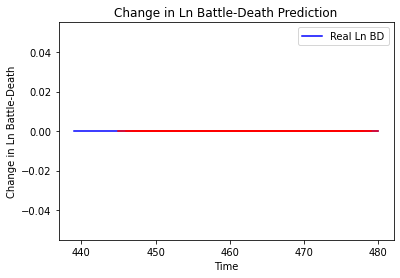

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritius', 'country_id': 173, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Seychelles']
Building vanilla Model...
Model: "sequential_99"
_________________________________________________________________
Layer (typ

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 9ms/

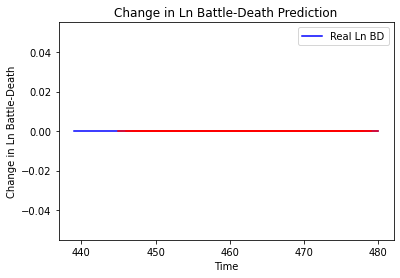

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Seychelles', 'country_id': 174, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Libya']
Building vanilla Model...
Model: "sequential_100"
_________________________________________________________________
Layer (

4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3204
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3203
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3203
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3204
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3203
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3203
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3202
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3201
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3202
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.3202
Epoch 75/100
4/4 [===============

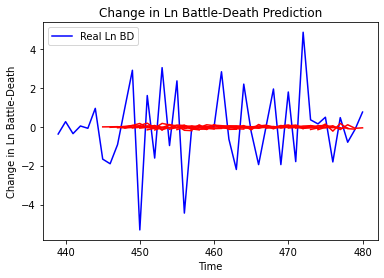

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Libya', 'country_id': 213, 'step': 't+1', 'mse': 4.890674603919139, 'mae': 1.7160910465366441, 'r2': -0.009294717306288947, 'tadda_score': 1.755396100187977}
{'country': 'Libya', 'country_id': 213, 'step': 't+2', 'mse': 5.459802712833264, 'mae': 1.8262925781302912, 'r2': -0.00785895057956032, 'tadda_score': 1.8757291366649929}
{'country': 'Libya', 'country_id': 213, 'step': 't+3', 'mse': 7.473695339459596, 'mae': 2.120094896013482, 'r2': -0.006891849126973826, 'tadda_score': 2.141868247726876}
{'country': 'Libya', 'country_id': 213, 'step': 't+4', 'mse': 6.039352719023378, 'mae': 2.0095753420735365, 'r2': -0.043636394572580395, 'tadda_score': 2.0597386637051867}
{'country': 'Libya', 'country_id': 213, 'step': 't+5', 'mse': 7.460124137311888, 'mae': 2.2945365394413675, 'r2': -0.025280367280542615, 'tadda_score': 2.3256686632159056}
{'country': 'Libya', 'country_id': 213, 'step': 't+6', 'mse': 6.287590723210907, '

4/4 [==============================] - 0s 9ms/step - loss: 5.0801 - val_loss: 0.8178
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 5.0380 - val_loss: 0.8183
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 5.0268 - val_loss: 0.8186
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 5.0298 - val_loss: 0.8190
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 5.0358 - val_loss: 0.8194
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 5.0351 - val_loss: 0.8198
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 4.9936 - val_loss: 0.8200
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 5.0202 - val_loss: 0.8199
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 5.0121 - val_loss: 0.8200
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 5.0056 - val_loss: 0.8201
Epoch 71/100
4/4 [==============

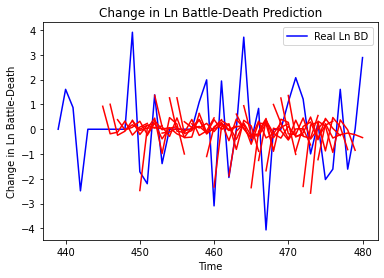

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Chad', 'country_id': 214, 'step': 't+1', 'mse': 2.8962269888036096, 'mae': 1.3555280991378738, 'r2': 0.013356908111738841, 'tadda_score': 1.581444870231878}
{'country': 'Chad', 'country_id': 214, 'step': 't+2', 'mse': 7.384613171442302, 'mae': 2.0974833495770207, 'r2': -0.7397047482630015, 'tadda_score': 2.663374387955101}
{'country': 'Chad', 'country_id': 214, 'step': 't+3', 'mse': 8.461145702939628, 'mae': 2.283136608552936, 'r2': -0.6200765523832124, 'tadda_score': 2.801181737931573}
{'country': 'Chad', 'country_id': 214, 'step': 't+4', 'mse': 12.62358863003801, 'mae': 2.9910362293645303, 'r2': -1.0701425940578453, 'tadda_score': 3.799987490010715}
{'country': 'Chad', 'country_id': 214, 'step': 't+5', 'mse': 11.223437407983338, 'mae': 2.6751799188127987, 'r2': -1.362401001679162, 'tadda_score': 3.437940495418595}
{'country': 'Chad', 'country_id': 214, 'step': 't+6', 'mse': 8.999079458435753, 'mae': 2.34007760

4/4 [==============================] - 0s 8ms/step - loss: 0.5733 - val_loss: 2.1591
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5664 - val_loss: 2.1566
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5746 - val_loss: 2.1542
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5736 - val_loss: 2.1519
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5744 - val_loss: 2.1500
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5753 - val_loss: 2.1482
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5798 - val_loss: 2.1475
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5667 - val_loss: 2.1456
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5701 - val_loss: 2.1444
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5696 - val_loss: 2.1427
Epoch 71/100
4/4 [===============

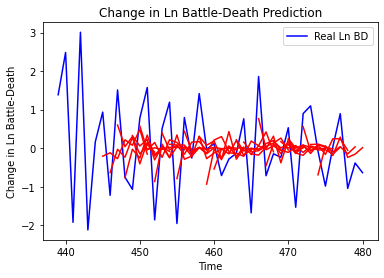

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Egypt', 'country_id': 222, 'step': 't+1', 'mse': 0.7182164587671235, 'mae': 0.7099320681720976, 'r2': 0.3627436074951358, 'tadda_score': 0.7654989616900687}
{'country': 'Egypt', 'country_id': 222, 'step': 't+2', 'mse': 1.4902862577974667, 'mae': 1.0346741204767316, 'r2': -0.37803747194795356, 'tadda_score': 1.2457152901524196}
{'country': 'Egypt', 'country_id': 222, 'step': 't+3', 'mse': 1.300080338440805, 'mae': 0.9051701961393916, 'r2': -0.40181885768894254, 'tadda_score': 1.1177097373640303}
{'country': 'Egypt', 'country_id': 222, 'step': 't+4', 'mse': 1.3234146209142708, 'mae': 0.949494376067449, 'r2': -0.07439522135191412, 'tadda_score': 1.107982702338824}
{'country': 'Egypt', 'country_id': 222, 'step': 't+5', 'mse': 1.674439222915259, 'mae': 1.1165430710667374, 'r2': -0.41141106159785035, 'tadda_score': 1.4053299795542162}
{'country': 'Egypt', 'country_id': 222, 'step': 't+6', 'mse': 1.5179046051661567, 'm

Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7186 - val_loss: 7.8723e-04
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7157 - val_loss: 7.6593e-04
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6989 - val_loss: 7.9233e-04
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6988 - val_loss: 7.8653e-04
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6915 - val_loss: 7.6340e-04
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6700 - val_loss: 7.4164e-04
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6877 - val_loss: 7.0384e-04
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6768 - val_loss: 7.0902e-04
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6879 - val_loss: 7.3460e-04
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6713 - v

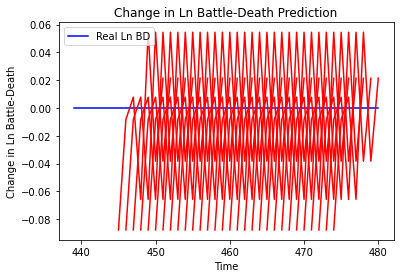

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Uganda', 'country_id': 235, 'step': 't+1', 'mse': 0.007706930598286255, 'mae': 0.0877891257405281, 'r2': 0.0, 'tadda_score': 0.0877891257405281}
{'country': 'Uganda', 'country_id': 235, 'step': 't+2', 'mse': 0.00923434414506824, 'mae': 0.0960954949259758, 'r2': 0.0, 'tadda_score': 0.0960954949259758}
{'country': 'Uganda', 'country_id': 235, 'step': 't+3', 'mse': 0.007801280847799186, 'mae': 0.08832485973834991, 'r2': 0.0, 'tadda_score': 0.08832485973834991}
{'country': 'Uganda', 'country_id': 235, 'step': 't+4', 'mse': 0.023748261528680814, 'mae': 0.15410470962524414, 'r2': 0.0, 'tadda_score': 0.15410470962524414}
{'country': 'Uganda', 'country_id': 235, 'step': 't+5', 'mse': 0.008334108431321319, 'mae': 0.09129133820533752, 'r2': 0.0, 'tadda_score': 0.09129133820533752}
{'country': 'Uganda', 'country_id': 235, 'step': 't+6', 'mse': 0.016803461564762978, 'mae': 0.12962816655635834, 'r2': 0.0, 'tadda_score': 0.12

Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1177 - val_loss: 1.6538
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1170 - val_loss: 1.6532
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1149 - val_loss: 1.6526
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1161 - val_loss: 1.6520
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1144 - val_loss: 1.6516
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1152 - val_loss: 1.6508
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1139 - val_loss: 1.6500
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1146 - val_loss: 1.6495
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1150 - val_loss: 1.6492
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1146 - val_loss: 1.6489
Epoch 72/100
4/4 [==

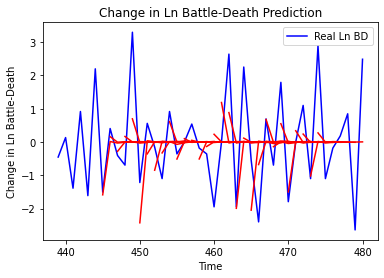

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Kenya', 'country_id': 237, 'step': 't+1', 'mse': 1.337307804914874, 'mae': 0.8538956605731579, 'r2': 0.3546211560811864, 'tadda_score': 0.8790583290993305}
{'country': 'Kenya', 'country_id': 237, 'step': 't+2', 'mse': 3.328688331270118, 'mae': 1.4786263682889418, 'r2': -0.7437725307160667, 'tadda_score': 1.91828018485978}
{'country': 'Kenya', 'country_id': 237, 'step': 't+3', 'mse': 3.1306463860526414, 'mae': 1.3624272194466367, 'r2': -0.43372067612100174, 'tadda_score': 1.6424331006369366}
{'country': 'Kenya', 'country_id': 237, 'step': 't+4', 'mse': 3.9169502606252986, 'mae': 1.6314160469443855, 'r2': -0.39477162338289395, 'tadda_score': 1.9196733512750523}
{'country': 'Kenya', 'country_id': 237, 'step': 't+5', 'mse': 2.7770972950297765, 'mae': 1.225950109291148, 'r2': -0.8335182673141295, 'tadda_score': 1.5562102417926706}
{'country': 'Kenya', 'country_id': 237, 'step': 't+6', 'mse': 2.6587427673899406, 'mae'

3/3 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
3/3 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
3/3 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
3/3 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
3/3 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
3/3 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
3/3 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
3/3 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
3/3 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
3/3 [==============================] - 0s 10ms

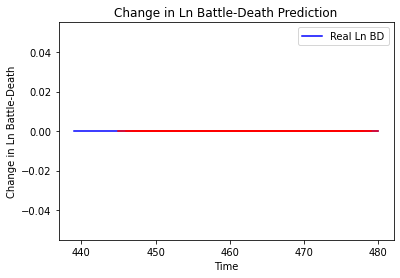

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tanzania', 'country_id': 242, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Morocco']
Building vanilla Model...
Model: "sequential_106"
_________________________________________________________________
Layer (type)       

4/4 [==============================] - 0s 9ms/step - loss: 0.0715 - val_loss: 1.5014e-05
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0701 - val_loss: 1.9153e-05
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0706 - val_loss: 1.9603e-05
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0702 - val_loss: 1.4899e-05
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0707 - val_loss: 1.3671e-05
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0712 - val_loss: 1.6295e-05
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0707 - val_loss: 1.0329e-05
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0707 - val_loss: 6.8784e-06
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0699 - val_loss: 4.9554e-06
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0704 - val_loss: 7.55

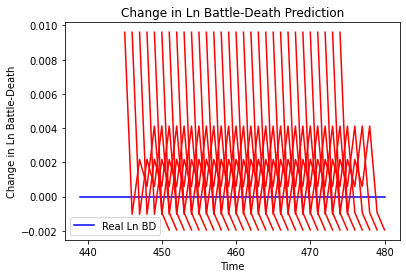

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Morocco', 'country_id': 243, 'step': 't+1', 'mse': 9.227028051649131e-05, 'mae': 0.009605742059648037, 'r2': 0.0, 'tadda_score': 0.009605742059648037}
{'country': 'Morocco', 'country_id': 243, 'step': 't+2', 'mse': 7.348571583411234e-05, 'mae': 0.008572380989789963, 'r2': 0.0, 'tadda_score': 0.008572380989789963}
{'country': 'Morocco', 'country_id': 243, 'step': 't+3', 'mse': 0.00011539301158877777, 'mae': 0.010742113925516605, 'r2': 0.0, 'tadda_score': 0.010742113925516605}
{'country': 'Morocco', 'country_id': 243, 'step': 't+4', 'mse': 0.00012846910196984487, 'mae': 0.01133442111313343, 'r2': 0.0, 'tadda_score': 0.01133442111313343}
{'country': 'Morocco', 'country_id': 243, 'step': 't+5', 'mse': 0.00027189778053716973, 'mae': 0.01648932322859764, 'r2': 0.0, 'tadda_score': 0.01648932322859764}
{'country': 'Morocco', 'country_id': 243, 'step': 't+6', 'mse': 0.0002417617965877472, 'mae': 0.015548691153526306, 'r2

4/4 [==============================] - 0s 8ms/step - loss: 0.0647 - val_loss: 0.1190
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0652 - val_loss: 0.1190
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0654 - val_loss: 0.1189
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0651 - val_loss: 0.1188
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0642 - val_loss: 0.1187
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0645 - val_loss: 0.1186
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0653 - val_loss: 0.1185
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0649 - val_loss: 0.1184
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0649 - val_loss: 0.1184
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0654 - val_loss: 0.1184
Epoch 71/100
4/4 [===============

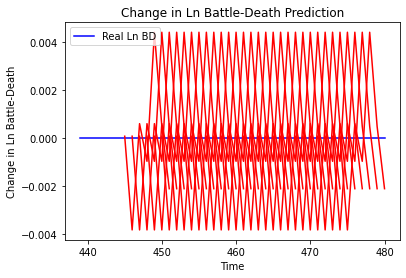

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritania', 'country_id': 244, 'step': 't+1', 'mse': 5.790394583954361e-09, 'mae': 7.609464228153229e-05, 'r2': 0.0, 'tadda_score': 7.609464228153229e-05}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+2', 'mse': 1.4058369841117102e-05, 'mae': 0.003749449271708727, 'r2': 0.0, 'tadda_score': 0.003749449271708727}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+3', 'mse': 9.926752830440944e-06, 'mae': 0.003150674980133772, 'r2': 0.0, 'tadda_score': 0.003150674980133772}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+4', 'mse': 1.6970698870109185e-05, 'mae': 0.004119550809264183, 'r2': 0.0, 'tadda_score': 0.004119550809264183}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+5', 'mse': 1.6902249642975842e-05, 'mae': 0.004111234564334154, 'r2': 0.0, 'tadda_score': 0.004111234564334154}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+6', 'mse': 2.115331829583033e-05, 'mae': 0

1/1 [==============================] - 0s 18ms/step - loss: 3.1775 - val_loss: 0.9235
Epoch 61/100
1/1 [==============================] - 0s 18ms/step - loss: 3.2011 - val_loss: 0.9236
Epoch 62/100
1/1 [==============================] - 0s 18ms/step - loss: 3.1714 - val_loss: 0.9237
Epoch 63/100
1/1 [==============================] - 0s 18ms/step - loss: 3.1928 - val_loss: 0.9239
Epoch 64/100
1/1 [==============================] - 0s 16ms/step - loss: 3.1691 - val_loss: 0.9241
Epoch 65/100
1/1 [==============================] - 0s 18ms/step - loss: 3.1594 - val_loss: 0.9243
Epoch 66/100
1/1 [==============================] - 0s 17ms/step - loss: 3.1689 - val_loss: 0.9244
Epoch 67/100
1/1 [==============================] - 0s 18ms/step - loss: 3.1834 - val_loss: 0.9247
Epoch 68/100
1/1 [==============================] - 0s 17ms/step - loss: 3.1642 - val_loss: 0.9249
Epoch 69/100
1/1 [==============================] - 0s 19ms/step - loss: 3.1633 - val_loss: 0.9251
Epoch 70/100
1/1 [=====

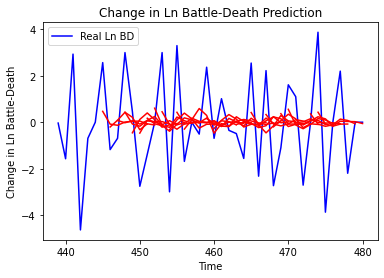

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sudan', 'country_id': 245, 'step': 't+1', 'mse': 3.232421521328222, 'mae': 1.5485141087167986, 'r2': 0.19216612755209228, 'tadda_score': 1.5921176572485296}
{'country': 'Sudan', 'country_id': 245, 'step': 't+2', 'mse': 4.278497099341153, 'mae': 1.6870377262169325, 'r2': -0.0027527231971526955, 'tadda_score': 1.776708698370477}
{'country': 'Sudan', 'country_id': 245, 'step': 't+3', 'mse': 3.850134034329114, 'mae': 1.6696949343548888, 'r2': 0.0071994851073913235, 'tadda_score': 1.7346057962046735}
{'country': 'Sudan', 'country_id': 245, 'step': 't+4', 'mse': 3.2706907164962447, 'mae': 1.4240373716083294, 'r2': 0.01487913947995323, 'tadda_score': 1.5190966184265542}
{'country': 'Sudan', 'country_id': 245, 'step': 't+5', 'mse': 5.22796732109866, 'mae': 1.9450873206009993, 'r2': 0.002829124935376459, 'tadda_score': 2.0172999987950453}
{'country': 'Sudan', 'country_id': 245, 'step': 't+6', 'mse': 4.9571592854493645, '

1/1 [==============================] - 0s 19ms/step - loss: 6.4554 - val_loss: 4.1145
Epoch 61/100
1/1 [==============================] - 0s 18ms/step - loss: 6.4788 - val_loss: 4.1132
Epoch 62/100
1/1 [==============================] - 0s 19ms/step - loss: 6.4569 - val_loss: 4.1118
Epoch 63/100
1/1 [==============================] - 0s 18ms/step - loss: 6.4837 - val_loss: 4.1105
Epoch 64/100
1/1 [==============================] - 0s 18ms/step - loss: 6.4227 - val_loss: 4.1092
Epoch 65/100
1/1 [==============================] - 0s 19ms/step - loss: 6.4625 - val_loss: 4.1079
Epoch 66/100
1/1 [==============================] - 0s 18ms/step - loss: 6.4744 - val_loss: 4.1066
Epoch 67/100
1/1 [==============================] - 0s 18ms/step - loss: 6.3970 - val_loss: 4.1051
Epoch 68/100
1/1 [==============================] - 0s 17ms/step - loss: 6.4045 - val_loss: 4.1036
Epoch 69/100
1/1 [==============================] - 0s 17ms/step - loss: 6.4015 - val_loss: 4.1019
Epoch 70/100
1/1 [=====

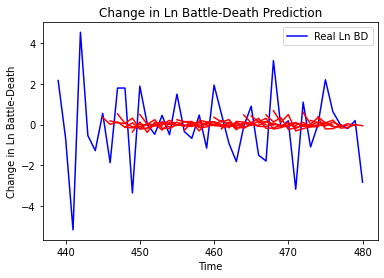

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Sudan', 'country_id': 246, 'step': 't+1', 'mse': 1.9502783798356293, 'mae': 1.0927027947569188, 'r2': 0.12331350870994018, 'tadda_score': 1.164943506629695}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+2', 'mse': 3.277674037350666, 'mae': 1.4223550320404754, 'r2': -0.21288044178807586, 'tadda_score': 1.6221548565465198}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+3', 'mse': 3.748275546962161, 'mae': 1.636165072159487, 'r2': -0.43360762482031157, 'tadda_score': 1.9543232576415122}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+4', 'mse': 3.8889684242213387, 'mae': 1.6135980541385686, 'r2': -0.23372884659256377, 'tadda_score': 1.8283228330192443}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+5', 'mse': 3.072482692915167, 'mae': 1.339738162764244, 'r2': -0.21808751437945806, 'tadda_score': 1.4979058376534111}
{'country': 'South Sudan', 'country_id': 246, 'step': '

In [15]:
np.random.seed(1)
tf.random.set_seed(1)
model = Sequential()
summary_model(dataset=df,
              modelname = "Vanilla",
              pred_africa=True,
              period=period_test, 
              epochs=100, 
              batch_size=64, 
              look_back=6, 
              look_forward=7,
              num_neurons=10, 
              val_split=0.2)

['Cape Verde']
Building vanilla Model...
Model: "sequential_114"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_108 (LSTM)              (None, 4)                 96        
_________________________________________________________________
dropout_216 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_216 (Dense)            (None, 4)                 20        
_________________________________________________________________
dropout_217 (Dropout)        (None, 4)                 0         
_________________________________________________________________
dense_217 (Dense)            (None, 7)                 35        
Total params: 151
Trainable params: 151
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0000e

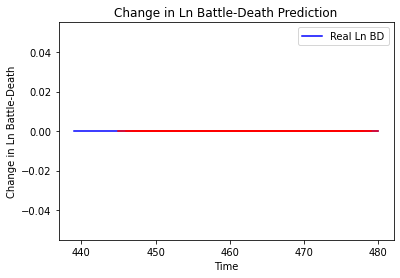

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
["Cote d'Ivoire"]
Building vanilla Model...
Model: "sequential_115"
_________________________________________________________________
Layer 

Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5617 - val_loss: 0.2884
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5614 - val_loss: 0.2885
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5607 - val_loss: 0.2884
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5661 - val_loss: 0.2884
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5641 - val_loss: 0.2884
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5654 - val_loss: 0.2884
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5633 - val_loss: 0.2884
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5608 - val_loss: 0.2884
Epoch 73/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5616 - val_loss: 0.2884
Epoch 74/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5636 - val_loss: 0.2884
Epoch 75/100
4/4 [=

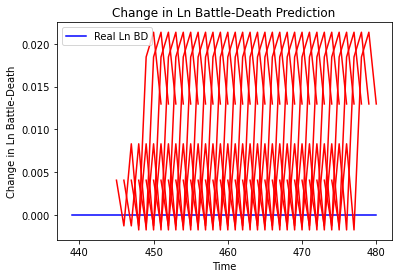

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+1', 'mse': 1.6442646623365288e-05, 'mae': 0.004054953344166279, 'r2': 0.0, 'tadda_score': 0.004054953344166279}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+2', 'mse': 7.705495791335336e-06, 'mae': 0.002775877481326461, 'r2': 0.0, 'tadda_score': 0.002775877481326461}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+3', 'mse': 0.00012288091845832991, 'mae': 0.011085166595876217, 'r2': 0.0, 'tadda_score': 0.011085166595876217}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+4', 'mse': 8.706146130649586e-05, 'mae': 0.009330673143267632, 'r2': 0.0, 'tadda_score': 0.009330673143267632}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+5', 'mse': 0.0008450142827718526, 'mae': 0.02906912937760353, 'r2': 0.0, 'tadda_score': 0.02906912937760353}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+6', 'mse': 0.0025420938717326536, '

Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [============================

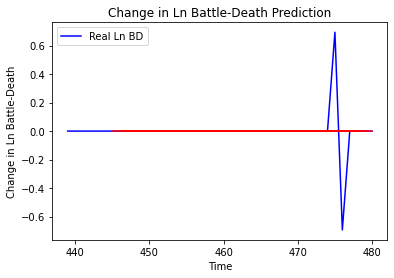

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ghana', 'country_id': 42, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Liberia']
Building vanilla Model...
Model: "sequential_117"
_________________________________________________________________
Layer (type)                 Output Shape      

4/4 [==============================] - 0s 9ms/step - loss: 1.2486 - val_loss: 3.8414e-04
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2458 - val_loss: 4.0929e-04
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2405 - val_loss: 4.5070e-04
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2477 - val_loss: 4.6941e-04
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2436 - val_loss: 5.0258e-04
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2399 - val_loss: 4.9534e-04
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2373 - val_loss: 5.1072e-04
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2393 - val_loss: 5.0618e-04
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2361 - val_loss: 4.8589e-04
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2469 - val_loss: 4.43

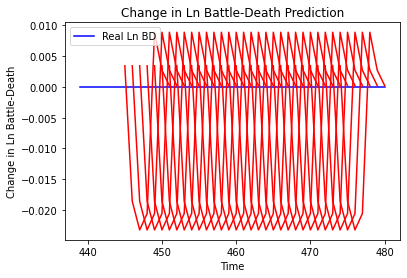

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Liberia', 'country_id': 43, 'step': 't+1', 'mse': 1.1770468840602982e-05, 'mae': 0.0034308116883039474, 'r2': 0.0, 'tadda_score': 0.0034308116883039474}
{'country': 'Liberia', 'country_id': 43, 'step': 't+2', 'mse': 0.00022953264109905336, 'mae': 0.015150334686040878, 'r2': 0.0, 'tadda_score': 0.015150334686040878}
{'country': 'Liberia', 'country_id': 43, 'step': 't+3', 'mse': 0.0014729020713592084, 'mae': 0.038378406316041946, 'r2': 0.0, 'tadda_score': 0.038378406316041946}
{'country': 'Liberia', 'country_id': 43, 'step': 't+4', 'mse': 0.003474831014831148, 'mae': 0.05894769728183746, 'r2': 0.0, 'tadda_score': 0.05894769728183746}
{'country': 'Liberia', 'country_id': 43, 'step': 't+5', 'mse': 0.0009915479538217392, 'mae': 0.03148885443806648, 'r2': 0.0, 'tadda_score': 0.03148885443806648}
{'country': 'Liberia', 'country_id': 43, 'step': 't+6', 'mse': 0.0008278903791494319, 'mae': 0.02877308428287506, 'r2': 0.0,

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/

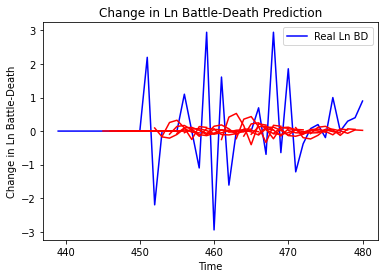

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+1', 'mse': 1.765121661147457, 'mae': 0.873052044057516, 'r2': -0.0703661463263161, 'tadda_score': 0.9076283294396279}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+2', 'mse': 1.2674461449359584, 'mae': 0.753021116376411, 'r2': -0.07104485002471828, 'tadda_score': 0.7757287733957082}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+3', 'mse': 2.1140646549279323, 'mae': 0.9648026726726507, 'r2': -0.060417967777357084, 'tadda_score': 1.0081644697322265}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+4', 'mse': 2.656821006616427, 'mae': 1.099400018813237, 'r2': -0.19685672796929343, 'tadda_score': 1.177957280016963}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+5', 'mse': 2.423498711828329, 'mae': 0.9602189521437339, 'r2': -0.16258281169010558, 'tadda_score': 0.985219227442687}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't

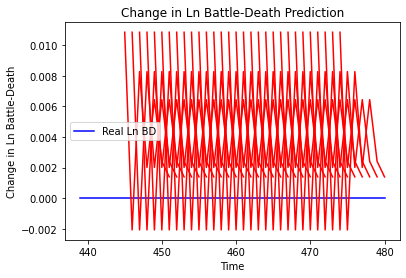

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea', 'country_id': 48, 'step': 't+1', 'mse': 0.00011788611814922412, 'mae': 0.010857537388801575, 'r2': 0.0, 'tadda_score': 0.010857537388801575}
{'country': 'Guinea', 'country_id': 48, 'step': 't+2', 'mse': 7.70334567598641e-05, 'mae': 0.008776870556175709, 'r2': 0.0, 'tadda_score': 0.008776870556175709}
{'country': 'Guinea', 'country_id': 48, 'step': 't+3', 'mse': 0.0002910171776976528, 'mae': 0.01705922558903694, 'r2': 0.0, 'tadda_score': 0.01705922558903694}
{'country': 'Guinea', 'country_id': 48, 'step': 't+4', 'mse': 0.000363608616746669, 'mae': 0.01906852424144745, 'r2': 0.0, 'tadda_score': 0.01906852424144745}
{'country': 'Guinea', 'country_id': 48, 'step': 't+5', 'mse': 0.0007613564751531854, 'mae': 0.02759268879890442, 'r2': 0.0, 'tadda_score': 0.02759268879890442}
{'country': 'Guinea', 'country_id': 48, 'step': 't+6', 'mse': 0.0008998404871576882, 'mae': 0.029997341334819794, 'r2': 0.0, 'tadda_sco

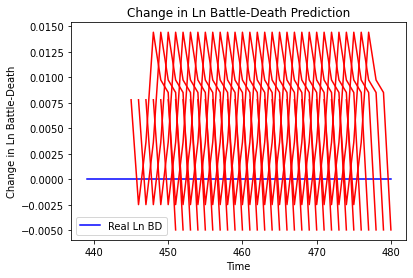

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+1', 'mse': 6.074461006242218e-05, 'mae': 0.007793882861733437, 'r2': 0.0, 'tadda_score': 0.007793882861733437}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+2', 'mse': 2.8326425135739722e-05, 'mae': 0.005322257522493601, 'r2': 0.0, 'tadda_score': 0.005322257522493601}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+3', 'mse': 8.011341424864205e-05, 'mae': 0.008950609713792801, 'r2': 0.0, 'tadda_score': 0.008950609713792801}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+4', 'mse': 0.0005454980357859664, 'mae': 0.02335589937865734, 'r2': 0.0, 'tadda_score': 0.02335589937865734}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+5', 'mse': 0.0012643581323646402, 'mae': 0.035557813942432404, 'r2': 0.0, 'tadda_score': 0.035557813942432404}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+6', 'mse': 0.0019416446538072507, 'm

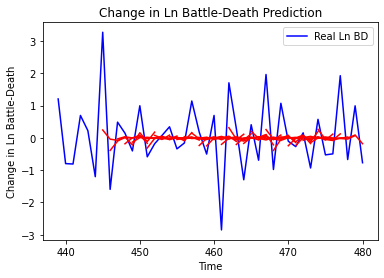

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mali', 'country_id': 50, 'step': 't+1', 'mse': 1.009431864393226, 'mae': 0.716800886861927, 'r2': 0.20039632377158856, 'tadda_score': 0.7476547067090339}
{'country': 'Mali', 'country_id': 50, 'step': 't+2', 'mse': 1.1130560214790346, 'mae': 0.8344275391861348, 'r2': -0.14963872620238394, 'tadda_score': 0.9351830701854873}
{'country': 'Mali', 'country_id': 50, 'step': 't+3', 'mse': 1.1752803386182114, 'mae': 0.8647749567287458, 'r2': -0.035233879639136045, 'tadda_score': 0.9409574886977466}
{'country': 'Mali', 'country_id': 50, 'step': 't+4', 'mse': 1.648616602019183, 'mae': 1.0470944537962117, 'r2': -0.1024317823829255, 'tadda_score': 1.1460670944173772}
{'country': 'Mali', 'country_id': 50, 'step': 't+5', 'mse': 1.3114215253009696, 'mae': 0.9537451217094599, 'r2': -0.21116046015915502, 'tadda_score': 1.0417874370534757}
{'country': 'Mali', 'country_id': 50, 'step': 't+6', 'mse': 1.7005365408862863, 'mae': 1.073

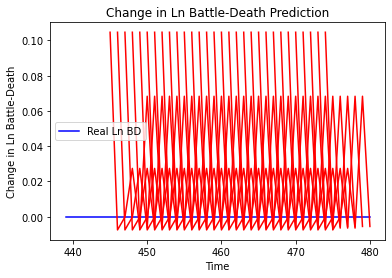

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Senegal', 'country_id': 52, 'step': 't+1', 'mse': 0.01095762979070708, 'mae': 0.1046786978840828, 'r2': 0.0, 'tadda_score': 0.1046786978840828}
{'country': 'Senegal', 'country_id': 52, 'step': 't+2', 'mse': 0.009442552423596595, 'mae': 0.0971727967262268, 'r2': 0.0, 'tadda_score': 0.0971727967262268}
{'country': 'Senegal', 'country_id': 52, 'step': 't+3', 'mse': 0.009400577130651622, 'mae': 0.09695657342672348, 'r2': 0.0, 'tadda_score': 0.09695657342672348}
{'country': 'Senegal', 'country_id': 52, 'step': 't+4', 'mse': 0.015465489924793019, 'mae': 0.12436032295227051, 'r2': 0.0, 'tadda_score': 0.12436032295227051}
{'country': 'Senegal', 'country_id': 52, 'step': 't+5', 'mse': 0.015722639181643183, 'mae': 0.1253899484872818, 'r2': 0.0, 'tadda_score': 0.1253899484872818}
{'country': 'Senegal', 'country_id': 52, 'step': 't+6', 'mse': 0.03753565348974064, 'mae': 0.19374120235443115, 'r2': 0.0, 'tadda_score': 0.19374

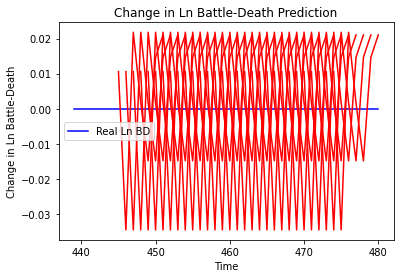

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+1', 'mse': 0.00011219915683011519, 'mae': 0.01059241034090519, 'r2': 0.0, 'tadda_score': 0.01059241034090519}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+2', 'mse': 0.0005696985022879721, 'mae': 0.02386835776269436, 'r2': 0.0, 'tadda_score': 0.02386835776269436}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+3', 'mse': 4.356816199826974e-06, 'mae': 0.0020872987806797028, 'r2': 0.0, 'tadda_score': 0.0020872987806797028}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+4', 'mse': 1.616817231347989e-07, 'mae': 0.0004020966589450836, 'r2': 0.0, 'tadda_score': 0.0004020966589450836}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+5', 'mse': 0.0003706961789044817, 'mae': 0.019253471866250038, 'r2': 0.0, 'tadda_score': 0.019253471866250038}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+6', 'mse': 0.0011497154680152472, 'mae':

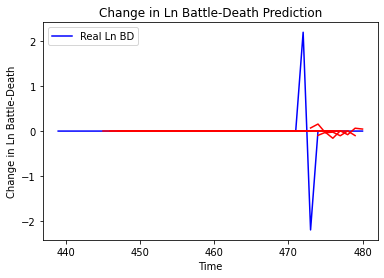

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'The Gambia', 'country_id': 54, 'step': 't+1', 'mse': 0.33240323984539855, 'mae': 0.15195906742206597, 'r2': -0.03277950426422871, 'tadda_score': 0.154254776078377}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+2', 'mse': 0.3060449280995764, 'mae': 0.14989971204391503, 'r2': 0.04911597951852076, 'tadda_score': 0.14989971204391503}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+3', 'mse': 0.1647538117919364, 'mae': 0.0888950235336591, 'r2': -0.059085656785252905, 'tadda_score': 0.0888950235336591}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+4', 'mse': 0.1643688831068351, 'mae': 0.08791630682245584, 'r2': -0.05661122268966512, 'tadda_score': 0.08791630682245584}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+5', 'mse': 0.16484420918139991, 'mae': 0.08743555587426516, 'r2': -0.05966675762626128, 'tadda_score': 0.08743555587426516}
{'country': 'The Gambia', 'country_id': 54, 'step'

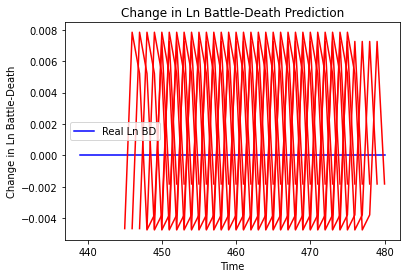

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Djibouti', 'country_id': 55, 'step': 't+1', 'mse': 2.1709212913272914e-05, 'mae': 0.004659314639866352, 'r2': 0.0, 'tadda_score': 0.004659314639866352}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+2', 'mse': 1.0125411553500198e-05, 'mae': 0.0031820451840758324, 'r2': 0.0, 'tadda_score': 0.0031820451840758324}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+3', 'mse': 7.044028962355318e-05, 'mae': 0.008392871357500553, 'r2': 0.0, 'tadda_score': 0.008392871357500553}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+4', 'mse': 1.3323828098641723e-05, 'mae': 0.0036501819267868996, 'r2': 0.0, 'tadda_score': 0.0036501819267868996}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+5', 'mse': 6.363302630824075e-05, 'mae': 0.007977031171321869, 'r2': 0.0, 'tadda_score': 0.007977031171321869}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+6', 'mse': 5.21418361284923e-07, 'mae': 0.0007220930419862

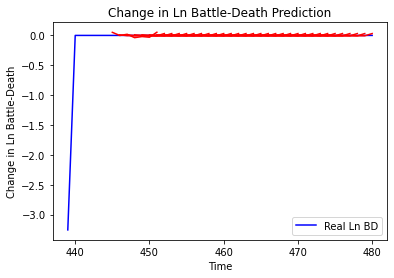

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Eritrea', 'country_id': 56, 'step': 't+1', 'mse': 0.00017957091225431545, 'mae': 0.011077436121801535, 'r2': 0.0, 'tadda_score': 0.011077436121801535}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+2', 'mse': 0.00011445653280528038, 'mae': 0.007010702850917975, 'r2': 0.0, 'tadda_score': 0.007010702850917975}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+3', 'mse': 0.00016975027858386762, 'mae': 0.005142488097772002, 'r2': 0.0, 'tadda_score': 0.005142488097772002}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+4', 'mse': 4.28076486505074e-05, 'mae': 0.00395922107466807, 'r2': 0.0, 'tadda_score': 0.00395922107466807}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+5', 'mse': 8.346206991788804e-06, 'mae': 0.0017554728935162227, 'r2': 0.0, 'tadda_score': 0.0017554728935162227}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+6', 'mse': 3.925795696695794e-05, 'mae': 0.005976871525247892, 'r2': 

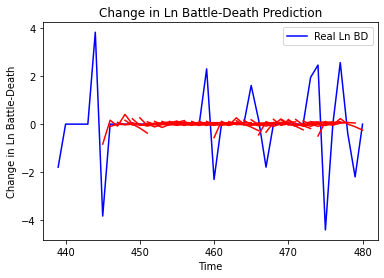

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+1', 'mse': 1.1325857899360456, 'mae': 0.6117452284808957, 'r2': 0.1698052626172194, 'tadda_score': 0.643175295106173}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+2', 'mse': 2.132745559310721, 'mae': 0.8390295099399195, 'r2': -0.06891918992580837, 'tadda_score': 0.8703608096819824}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+3', 'mse': 2.2454201960645106, 'mae': 0.874447476981253, 'r2': -0.12539103717371458, 'tadda_score': 0.9165743860037829}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+4', 'mse': 2.1085467419784494, 'mae': 0.7895142686175015, 'r2': -0.05679088886943018, 'tadda_score': 0.8100485309269733}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+5', 'mse': 2.181467779229971, 'mae': 0.8334722932981161, 'r2': -0.09333847220733094, 'tadda_score': 0.8672205367989051}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+6', 'mse': 2.03192427

Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9468 - val_loss: 1.0223
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9439 - val_loss: 1.0220
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9431 - val_loss: 1.0216
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9502 - val_loss: 1.0212
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9481 - val_loss: 1.0209
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9465 - val_loss: 1.0206
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9461 - val_loss: 1.0203
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9488 - val_loss: 1.0200
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9452 - val_loss: 1.0198
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9440 - val_loss: 1.0194
Epoch 71/100
4/4 [==

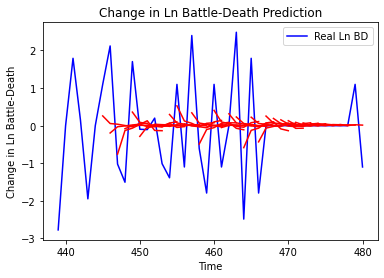

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Algeria', 'country_id': 67, 'step': 't+1', 'mse': 1.254791149012434, 'mae': 0.8348414756579653, 'r2': 0.21323264635873207, 'tadda_score': 0.8528832550072128}
{'country': 'Algeria', 'country_id': 67, 'step': 't+2', 'mse': 2.072280432377548, 'mae': 1.0446947326507547, 'r2': -0.23042407164587342, 'tadda_score': 1.1958709101126965}
{'country': 'Algeria', 'country_id': 67, 'step': 't+3', 'mse': 2.203785746893118, 'mae': 1.1456922935591152, 'r2': -0.22851109135366632, 'tadda_score': 1.3147165673122814}
{'country': 'Algeria', 'country_id': 67, 'step': 't+4', 'mse': 2.418827265792776, 'mae': 1.2334380712802238, 'r2': -0.18483497412164462, 'tadda_score': 1.3780674362376362}
{'country': 'Algeria', 'country_id': 67, 'step': 't+5', 'mse': 1.5967062221747776, 'mae': 0.9176524205062929, 'r2': -0.18646247300235697, 'tadda_score': 1.0197671510829671}
{'country': 'Algeria', 'country_id': 67, 'step': 't+6', 'mse': 1.9413943453419

4/4 [==============================] - 0s 8ms/step - loss: 0.1963 - val_loss: 1.4722
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1972 - val_loss: 1.4721
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1946 - val_loss: 1.4719
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1926 - val_loss: 1.4718
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1941 - val_loss: 1.4716
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1950 - val_loss: 1.4714
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1923 - val_loss: 1.4713
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1930 - val_loss: 1.4712
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1912 - val_loss: 1.4711
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1960 - val_loss: 1.4710
Epoch 71/100
4/4 [===============

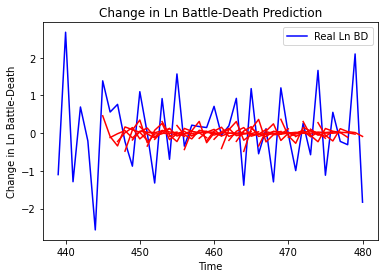

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cameroon', 'country_id': 69, 'step': 't+1', 'mse': 0.5949175551845107, 'mae': 0.6585015451426479, 'r2': 0.19219026497117564, 'tadda_score': 0.7058551244949473}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+2', 'mse': 0.9629468969151048, 'mae': 0.8434275775959392, 'r2': -0.30458399483683585, 'tadda_score': 0.9849811975966195}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+3', 'mse': 1.030812806862867, 'mae': 0.8037627309107338, 'r2': -0.05184658154992139, 'tadda_score': 0.8136251589450791}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+4', 'mse': 1.053699829017211, 'mae': 0.8319820228289276, 'r2': -0.19644860482327187, 'tadda_score': 0.9053433384071499}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+5', 'mse': 1.2676258512471164, 'mae': 0.9135933443794175, 'r2': -0.2743990645009615, 'tadda_score': 1.031867324549906}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+6', 'mse': 1.6808633

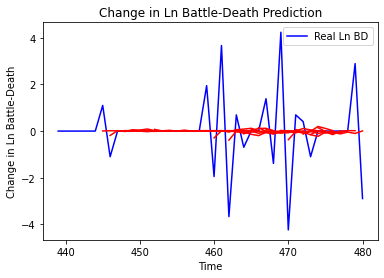

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+1', 'mse': 2.3687297624063737, 'mae': 0.9037269816775049, 'r2': 0.10436024238991426, 'tadda_score': 0.9079944869854972}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+2', 'mse': 1.487831687304408, 'mae': 0.7384735846839123, 'r2': -0.01629708074613445, 'tadda_score': 0.7508662784419232}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+3', 'mse': 2.176388787048506, 'mae': 0.885460802941658, 'r2': 0.07143498344286503, 'tadda_score': 0.9021562772782026}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+4', 'mse': 2.342585268506895, 'mae': 0.8380335588832319, 'r2': 0.031047359175458533, 'tadda_score': 0.8498314233079175}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+5', 'mse': 2.568869226743996, 'mae': 0.9260595087137251, 'r2': -0.013698769703192948, 'tadda_score': 0.957572442062

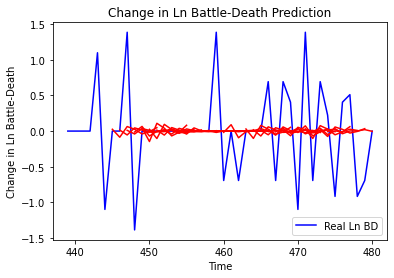

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tunisia', 'country_id': 73, 'step': 't+1', 'mse': 0.4061659512002073, 'mae': 0.40641090770025673, 'r2': 0.01616779725148043, 'tadda_score': 0.4069851391895078}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+2', 'mse': 0.39992424911438995, 'mae': 0.42436136785843576, 'r2': 0.02812165160753277, 'tadda_score': 0.4311502984657745}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+3', 'mse': 0.4867822349301756, 'mae': 0.4674620588693545, 'r2': -0.01879006721822507, 'tadda_score': 0.4700594689614848}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+4', 'mse': 0.5039020953145588, 'mae': 0.4634153919807138, 'r2': -0.043557929673442075, 'tadda_score': 0.46824148945049066}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+5', 'mse': 0.46781123272043, 'mae': 0.46701591026467726, 'r2': -0.06335567926233066, 'tadda_score': 0.48198548715991424}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+6', 'mse': 0.56072

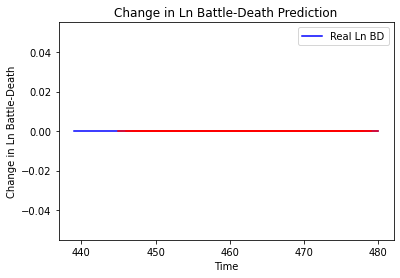

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Benin', 'country_id': 74, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Equatorial Guinea']
Building vanilla Model...
Model: "sequential_133"
_________________________________________________________________
Layer (type)                 Output S

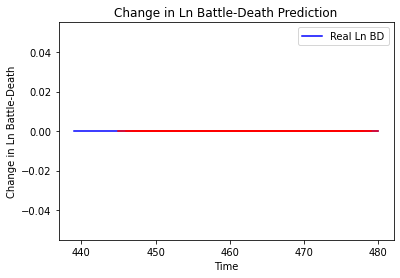

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Niger']
Building vanilla Model...
Model: "sequential_134"
_______________________________

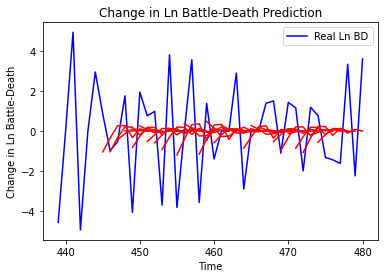

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Niger', 'country_id': 78, 'step': 't+1', 'mse': 3.3535773824088038, 'mae': 1.4998209840808783, 'r2': 0.22583569894842803, 'tadda_score': 1.647584475751169}
{'country': 'Niger', 'country_id': 78, 'step': 't+2', 'mse': 5.457519036657033, 'mae': 1.9320277085540303, 'r2': -0.3898108113628904, 'tadda_score': 2.2344467645523554}
{'country': 'Niger', 'country_id': 78, 'step': 't+3', 'mse': 4.627907597946702, 'mae': 1.696877939228834, 'r2': -0.19490479099464197, 'tadda_score': 1.954034975642583}
{'country': 'Niger', 'country_id': 78, 'step': 't+4', 'mse': 4.8986547502878555, 'mae': 1.8044946265188695, 'r2': -0.07965810633413106, 'tadda_score': 1.9747907856571516}
{'country': 'Niger', 'country_id': 78, 'step': 't+5', 'mse': 5.928209967871385, 'mae': 1.9760173635369849, 'r2': -0.07769408462703664, 'tadda_score': 2.1324154328988305}
{'country': 'Niger', 'country_id': 78, 'step': 't+6', 'mse': 5.233835827470374, 'mae': 1.83

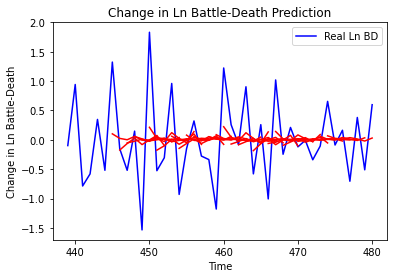

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Nigeria', 'country_id': 79, 'step': 't+1', 'mse': 0.49092443917188167, 'mae': 0.534821146803029, 'r2': 0.14099902879679427, 'tadda_score': 0.5482894833343005}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+2', 'mse': 0.62054775315907, 'mae': 0.6178913913348735, 'r2': -0.1468895339248255, 'tadda_score': 0.677335273039035}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+3', 'mse': 0.6474954701107873, 'mae': 0.6116242559674281, 'r2': -0.05680785531192378, 'tadda_score': 0.6611625564021765}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+4', 'mse': 0.8175831770604255, 'mae': 0.6784814046726447, 'r2': -0.09908549493204477, 'tadda_score': 0.7635165342160385}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+5', 'mse': 0.6044843021819691, 'mae': 0.6065415694948196, 'r2': -0.18071852947415912, 'tadda_score': 0.6838620101361135}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+6', 'mse': 0.6708686119673

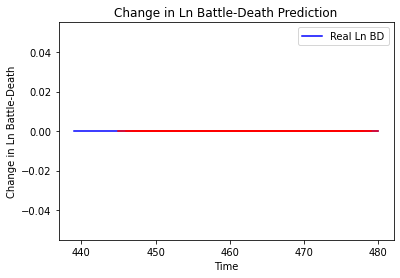

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Togo']
Building vanilla Model...
Model: "sequential_137"
____

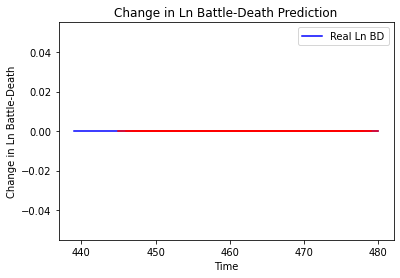

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Togo', 'country_id': 81, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Somalia']
Building vanilla Model...
Model: "sequential_138"
_________________________________________________________________
Layer (type)                 Output Shape             

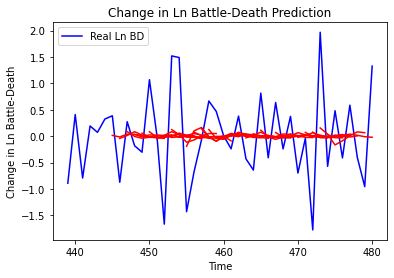

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Somalia', 'country_id': 120, 'step': 't+1', 'mse': 0.7072633731955134, 'mae': 0.6616541598145583, 'r2': 0.07157167941668274, 'tadda_score': 0.6825368978236536}
{'country': 'Somalia', 'country_id': 120, 'step': 't+2', 'mse': 1.0145416233919085, 'mae': 0.7225226244933791, 'r2': -0.034579521573605776, 'tadda_score': 0.7504959171372043}
{'country': 'Somalia', 'country_id': 120, 'step': 't+3', 'mse': 0.7974914240113322, 'mae': 0.6715489301412314, 'r2': 0.0007544128615452061, 'tadda_score': 0.6959143299812088}
{'country': 'Somalia', 'country_id': 120, 'step': 't+4', 'mse': 0.6910214767992077, 'mae': 0.6893978402958231, 'r2': 0.003111966031436708, 'tadda_score': 0.7128414957171595}
{'country': 'Somalia', 'country_id': 120, 'step': 't+5', 'mse': 0.7914428697662717, 'mae': 0.6254577176281735, 'r2': -0.026654030758320957, 'tadda_score': 0.664621390117598}
{'country': 'Somalia', 'country_id': 120, 'step': 't+6', 'mse': 0.6

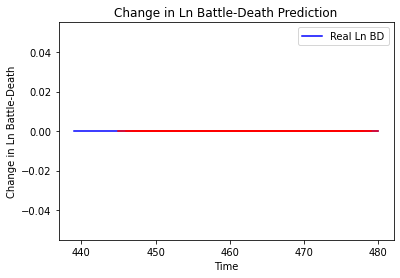

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Botswana', 'country_id': 154, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Burundi']
Building vanilla Model...
Model: "sequential_140"
_________________________________________________________________
Layer (type)       

4/4 [==============================] - 0s 8ms/step - loss: 1.9748 - val_loss: 1.6402
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9713 - val_loss: 1.6394
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9630 - val_loss: 1.6385
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9679 - val_loss: 1.6376
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9655 - val_loss: 1.6367
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9696 - val_loss: 1.6359
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9714 - val_loss: 1.6350
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9728 - val_loss: 1.6343
Epoch 73/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9713 - val_loss: 1.6334
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9725 - val_loss: 1.6327
Epoch 75/100
4/4 [===============

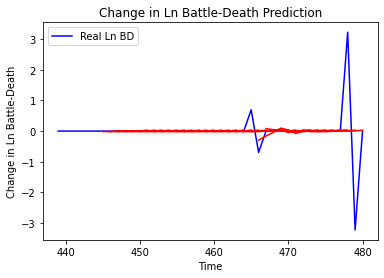

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burundi', 'country_id': 155, 'step': 't+1', 'mse': 0.022497230817968714, 'mae': 0.05517476486382963, 'r2': 0.29762442425434754, 'tadda_score': 0.0556693394950835}
{'country': 'Burundi', 'country_id': 155, 'step': 't+2', 'mse': 0.04790296013595959, 'mae': 0.09688938315677724, 'r2': -0.495556029880017, 'tadda_score': 0.10212122456200999}
{'country': 'Burundi', 'country_id': 155, 'step': 't+3', 'mse': 0.0472008037319512, 'mae': 0.09378499773361366, 'r2': -0.4736343314932545, 'tadda_score': 0.0975018793068139}
{'country': 'Burundi', 'country_id': 155, 'step': 't+4', 'mse': 0.04144358603289791, 'mae': 0.08936001161454203, 'r2': -0.29389091645766463, 'tadda_score': 0.09138986927487534}
{'country': 'Burundi', 'country_id': 155, 'step': 't+5', 'mse': 0.034714574433735136, 'mae': 0.06301913205254159, 'r2': -0.08380757622779944, 'tadda_score': 0.06372154482049824}
{'country': 'Burundi', 'country_id': 155, 'step': 't+6', '

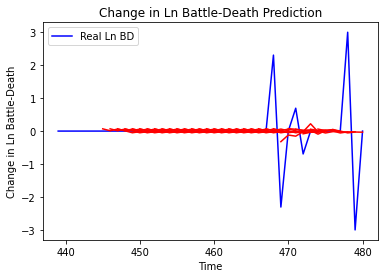

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Rwanda', 'country_id': 156, 'step': 't+1', 'mse': 0.32729691935882166, 'mae': 0.24086211631829102, 'r2': 0.15095889461492418, 'tadda_score': 0.24086211631829102}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+2', 'mse': 0.40599588059893055, 'mae': 0.2828335749371306, 'r2': -0.05319412086367481, 'tadda_score': 0.2895330376688099}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+3', 'mse': 0.3044291985901005, 'mae': 0.296726992333099, 'r2': -0.09079983152957927, 'tadda_score': 0.3040811750830857}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+4', 'mse': 0.35070184056993425, 'mae': 0.31047953818267104, 'r2': 0.049436875898013044, 'tadda_score': 0.31047953818267104}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+5', 'mse': 0.36894159601108545, 'mae': 0.25428918330893435, 'r2': -1.2419254360462872e-06, 'tadda_score': 0.25549612521157183}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+6', 'mse':

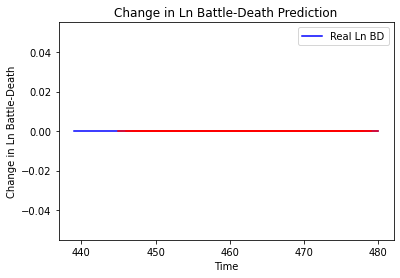

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zambia', 'country_id': 157, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Zimbabwe']
Building vanilla Model...
Model: "sequential_143"
_________________________________________________________________
Layer (type)                 Out

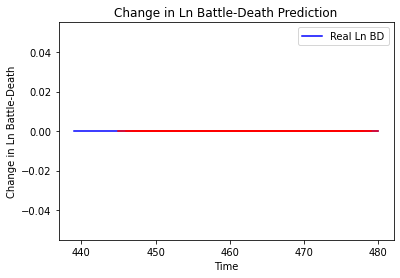

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Comoros']
Building vanilla Model...
Model: "sequential_144"
_________________________________________________________________
Layer (type)       

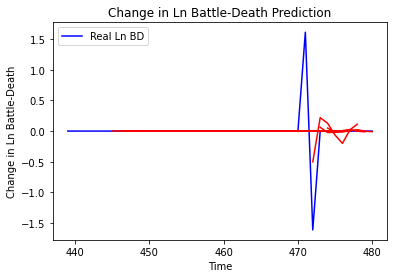

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Comoros', 'country_id': 159, 'step': 't+1', 'mse': 0.12732555691605624, 'mae': 0.09571658060648436, 'r2': 0.2626759693896248, 'tadda_score': 0.09571658060648436}
{'country': 'Comoros', 'country_id': 159, 'step': 't+2', 'mse': 0.1792245779697122, 'mae': 0.12089712027378027, 'r2': -0.03786381472648004, 'tadda_score': 0.1221557413902595}
{'country': 'Comoros', 'country_id': 159, 'step': 't+3', 'mse': 0.17470648780371273, 'mae': 0.11681156885417446, 'r2': -0.011700202859837194, 'tadda_score': 0.11731061560329939}
{'country': 'Comoros', 'country_id': 159, 'step': 't+4', 'mse': 0.08765180037404598, 'mae': 0.0653588048791433, 'r2': -0.05016344645840842, 'tadda_score': 0.0653588048791433}
{'country': 'Comoros', 'country_id': 159, 'step': 't+5', 'mse': 0.09961679104741045, 'mae': 0.08482107087695795, 'r2': -0.19351698613200718, 'tadda_score': 0.08482107087695795}
{'country': 'Comoros', 'country_id': 159, 'step': 't+6', '

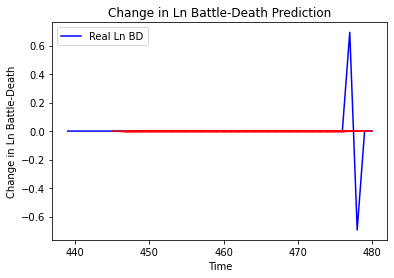

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Lesotho', 'country_id': 160, 'step': 't+1', 'mse': 7.54478663225755e-07, 'mae': 0.0008686073124408722, 'r2': 0.0, 'tadda_score': 0.0008686073124408722}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+2', 'mse': 1.1408771172333968e-06, 'mae': 0.0010681184940040112, 'r2': 0.0, 'tadda_score': 0.0010681184940040112}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+3', 'mse': 5.1811034408912916e-05, 'mae': 0.007197988219559193, 'r2': 0.0, 'tadda_score': 0.007197988219559193}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+4', 'mse': 4.864795879738759e-05, 'mae': 0.006974808871746063, 'r2': 0.0, 'tadda_score': 0.006974808871746063}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+5', 'mse': 2.0948708804617447e-05, 'mae': 0.00457697594538331, 'r2': 0.0, 'tadda_score': 0.00457697594538331}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+6', 'mse': 2.2099866709287272e-05, 'mae': 0.00470104953274130

Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [============================

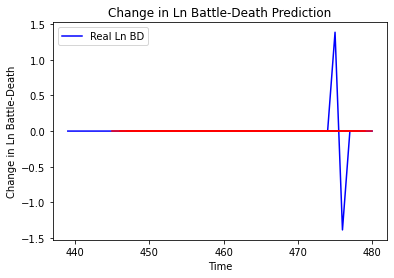

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Malawi', 'country_id': 161, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mozambique']
Building vanilla Model...
Model: "sequential_147"
_________________________________________________________________
Layer (type)                 O

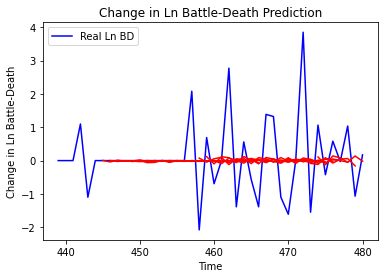

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mozambique', 'country_id': 162, 'step': 't+1', 'mse': 1.5855212032847605, 'mae': 0.8003337151572765, 'r2': -0.007605604257287846, 'tadda_score': 0.8082557844937194}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+2', 'mse': 2.020285004901254, 'mae': 0.8592213893902249, 'r2': -0.05590513212327797, 'tadda_score': 0.8776758242370631}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+3', 'mse': 2.008101662236992, 'mae': 1.008474029572952, 'r2': -0.049259335201821575, 'tadda_score': 1.0243554243541242}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+4', 'mse': 1.5538934093829389, 'mae': 0.795342774829662, 'r2': -0.031097470722499132, 'tadda_score': 0.8135757818980973}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+5', 'mse': 0.8641646381121882, 'mae': 0.5998782554834654, 'r2': -0.055151305464343325, 'tadda_score': 0.6108415609418919}
{'country': 'Mozambique', 'country_id': 162, 'step': 

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9m

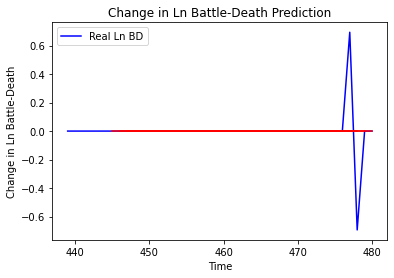

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Africa', 'country_id': 163, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Swaziland']
Building vanilla Model...
Model: "sequential_149"
_______________________________________________________

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 8ms/

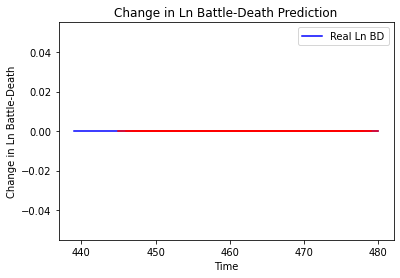

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Swaziland', 'country_id': 164, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Angola']
Building vanilla Model...
Model: "sequential_150"
_________________________________________________________________
Layer (type) 

4/4 [==============================] - 0s 8ms/step - loss: 3.3865 - val_loss: 0.0899
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 3.3791 - val_loss: 0.0898
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 3.3926 - val_loss: 0.0898
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3766 - val_loss: 0.0897
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3895 - val_loss: 0.0897
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3848 - val_loss: 0.0896
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 3.3774 - val_loss: 0.0896
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 3.3838 - val_loss: 0.0895
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 3.3707 - val_loss: 0.0895
Epoch 74/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3843 - val_loss: 0.0894
Epoch 75/100
4/4 [===============

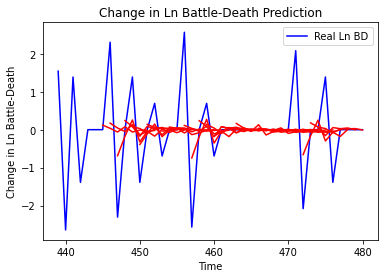

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Angola', 'country_id': 165, 'step': 't+1', 'mse': 0.9086882123222355, 'mae': 0.5896345877957384, 'r2': 0.2859091036987458, 'tadda_score': 0.5903571778845828}
{'country': 'Angola', 'country_id': 165, 'step': 't+2', 'mse': 1.4649758924748333, 'mae': 0.8031329030418933, 'r2': -0.15124850738804385, 'tadda_score': 0.8471279712952218}
{'country': 'Angola', 'country_id': 165, 'step': 't+3', 'mse': 0.9005657185698067, 'mae': 0.570183349467795, 'r2': -0.02673000351774757, 'tadda_score': 0.575799703416706}
{'country': 'Angola', 'country_id': 165, 'step': 't+4', 'mse': 1.0175827448834405, 'mae': 0.676213883544438, 'r2': 0.051978698884736385, 'tadda_score': 0.6936089538638124}
{'country': 'Angola', 'country_id': 165, 'step': 't+5', 'mse': 1.0192744544759347, 'mae': 0.6262265653074496, 'r2': -0.04103502143832727, 'tadda_score': 0.6327503021221074}
{'country': 'Angola', 'country_id': 165, 'step': 't+6', 'mse': 1.3517841733942

Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9323 - val_loss: 0.2229
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9327 - val_loss: 0.2228
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9402 - val_loss: 0.2228
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9385 - val_loss: 0.2228
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9358 - val_loss: 0.2228
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9362 - val_loss: 0.2229
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9423 - val_loss: 0.2229
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9384 - val_loss: 0.2230
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9406 - val_loss: 0.2229
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9347 - val_loss: 0.2229
Epoch 71/100
4/4 [==

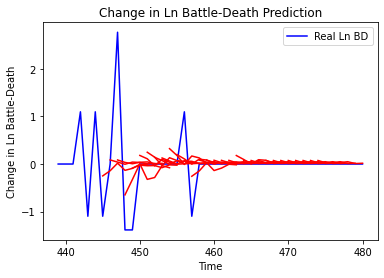

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo', 'country_id': 166, 'step': 't+1', 'mse': 0.4112426112783687, 'mae': 0.338014209759393, 'r2': 0.1835828028573181, 'tadda_score': 0.338014209759393}
{'country': 'Congo', 'country_id': 166, 'step': 't+2', 'mse': 0.9213239791448947, 'mae': 0.5678646571800314, 'r2': -0.21233561405156176, 'tadda_score': 0.6183833380406303}
{'country': 'Congo', 'country_id': 166, 'step': 't+3', 'mse': 0.800034045974334, 'mae': 0.5170312197526711, 'r2': -0.34890322899617643, 'tadda_score': 0.5737941599409202}
{'country': 'Congo', 'country_id': 166, 'step': 't+4', 'mse': 0.9540914848379652, 'mae': 0.6030925282856245, 'r2': -0.3735188115340329, 'tadda_score': 0.6824436137100477}
{'country': 'Congo', 'country_id': 166, 'step': 't+5', 'mse': 0.8697641237941593, 'mae': 0.5843753158073047, 'r2': -0.4664721344728997, 'tadda_score': 0.6488905279855349}
{'country': 'Congo', 'country_id': 166, 'step': 't+6', 'mse': 0.9440544955677216, 'ma

4/4 [==============================] - 0s 9ms/step - loss: 3.0164 - val_loss: 3.3125
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0093 - val_loss: 3.3121
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0164 - val_loss: 3.3118
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 3.0071 - val_loss: 3.3115
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9833 - val_loss: 3.3111
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0080 - val_loss: 3.3108
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 2.9940 - val_loss: 3.3105
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0067 - val_loss: 3.3103
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0095 - val_loss: 3.3102
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 3.0138 - val_loss: 3.3100
Epoch 71/100
4/4 [===============

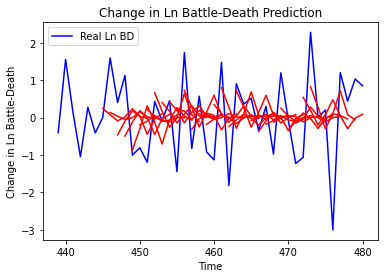

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+1', 'mse': 0.8854343183663418, 'mae': 0.7793790765486462, 'r2': 0.1910005366797668, 'tadda_score': 0.8863741509996159}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+2', 'mse': 2.0893765742023502, 'mae': 1.1671850168011852, 'r2': -0.47771474473747233, 'tadda_score': 1.4348932476890355}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+3', 'mse': 2.2300304302141583, 'mae': 1.1897444787242977, 'r2': -0.2928193065505489, 'tadda_score': 1.4221188043672808}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+4', 'mse': 2.556558384691764, 'mae': 1.2667086959035037, 'r2': -0.4674491153448932, 'tadda_score': 1.5409061153879604}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+5', 'mse': 3.258782338775421, 'mae': 1.418207515250835, 'r2': -0.775198895260206, 'tadda_score': 1.8072906168512437}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+6', 'm

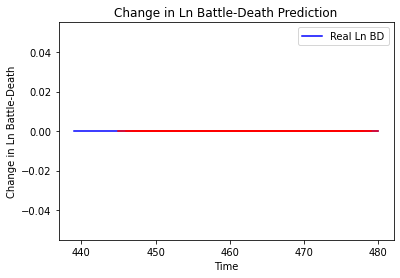

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Gabon', 'country_id': 169, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Namibia']
Building vanilla Model...
Model: "sequential_154"
_________________________________________________________________
Layer (type)                 Output Shap

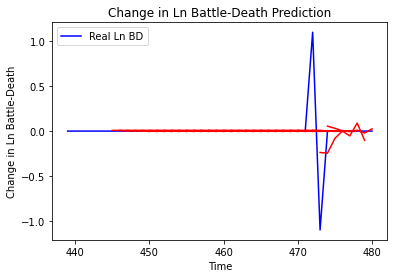

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Namibia', 'country_id': 170, 'step': 't+1', 'mse': 0.06452554919695735, 'mae': 0.0736740910263925, 'r2': 0.19807442619385496, 'tadda_score': 0.0736740910263925}
{'country': 'Namibia', 'country_id': 170, 'step': 't+2', 'mse': 0.09384337696758169, 'mae': 0.10590530787304732, 'r2': -0.166288468044266, 'tadda_score': 0.10875784262414467}
{'country': 'Namibia', 'country_id': 170, 'step': 't+3', 'mse': 0.050156752120312946, 'mae': 0.07265249735065149, 'r2': -0.2896890501966922, 'tadda_score': 0.07265249735065149}
{'country': 'Namibia', 'country_id': 170, 'step': 't+4', 'mse': 0.04996999676410691, 'mae': 0.07566263361223387, 'r2': -0.2848869781369472, 'tadda_score': 0.07566263361223387}
{'country': 'Namibia', 'country_id': 170, 'step': 't+5', 'mse': 0.04411484607894837, 'mae': 0.06347499311911907, 'r2': -0.134332498297683, 'tadda_score': 0.06347499311911907}
{'country': 'Namibia', 'country_id': 170, 'step': 't+6', 'mse

Epoch 56/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==========================

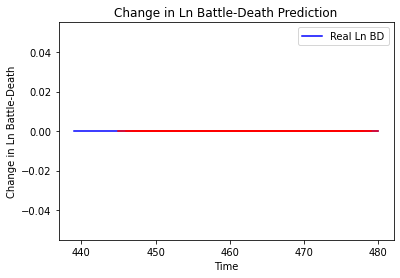

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Madagascar', 'country_id': 172, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mauritius']
Building vanilla Model...
Model: "sequential_156"
_________________________________________________________________
Lay

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s

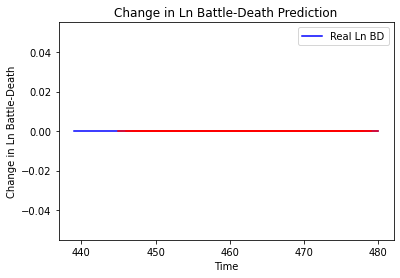

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritius', 'country_id': 173, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Seychelles']
Building vanilla Model...
Model: "sequential_157"
_________________________________________________________________
Layer (ty

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 8ms

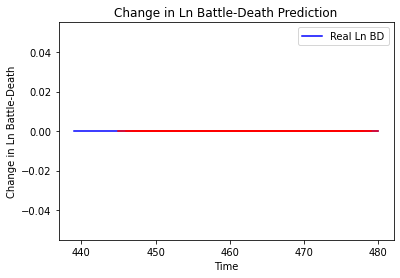

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Seychelles', 'country_id': 174, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Libya']
Building vanilla Model...
Model: "sequential_158"
_________________________________________________________________
Layer (

4/4 [==============================] - 0s 9ms/step - loss: 0.0314 - val_loss: 2.2798
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0314 - val_loss: 2.2798
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0314 - val_loss: 2.2797
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0314 - val_loss: 2.2798
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0314 - val_loss: 2.2798
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0314 - val_loss: 2.2798
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0314 - val_loss: 2.2798
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0314 - val_loss: 2.2798
Epoch 73/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0314 - val_loss: 2.2799
Epoch 74/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0314 - val_loss: 2.2800
Epoch 75/100
4/4 [===========

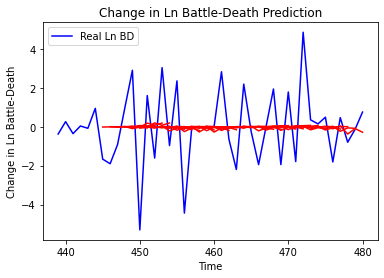

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Libya', 'country_id': 213, 'step': 't+1', 'mse': 4.810685806637264, 'mae': 1.68748552418934, 'r2': 0.007212672180548996, 'tadda_score': 1.696006835477108}
{'country': 'Libya', 'country_id': 213, 'step': 't+2', 'mse': 5.491630603488403, 'mae': 1.8006876911495637, 'r2': -0.0137342589308036, 'tadda_score': 1.8169798361130816}
{'country': 'Libya', 'country_id': 213, 'step': 't+3', 'mse': 7.498112540870136, 'mae': 2.1203860173609788, 'r2': -0.010181450851699969, 'tadda_score': 2.148111344484556}
{'country': 'Libya', 'country_id': 213, 'step': 't+4', 'mse': 5.90072257031967, 'mae': 1.9887747119771904, 'r2': -0.019680272898071838, 'tadda_score': 2.009340220252173}
{'country': 'Libya', 'country_id': 213, 'step': 't+5', 'mse': 7.563090733896124, 'mae': 2.294613625569662, 'r2': -0.03943155672731158, 'tadda_score': 2.3713148945580125}
{'country': 'Libya', 'country_id': 213, 'step': 't+6', 'mse': 6.467595898896652, 'mae': 1

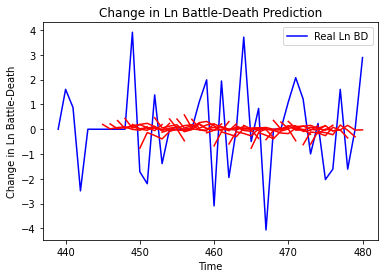

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Chad', 'country_id': 214, 'step': 't+1', 'mse': 2.525809865481883, 'mae': 1.1818915861281052, 'r2': 0.13954504780360533, 'tadda_score': 1.2188240457258914}
{'country': 'Chad', 'country_id': 214, 'step': 't+2', 'mse': 4.964635328333848, 'mae': 1.6840480926869865, 'r2': -0.16959405368686808, 'tadda_score': 1.8572481621790484}
{'country': 'Chad', 'country_id': 214, 'step': 't+3', 'mse': 6.46317979851689, 'mae': 2.019500656899813, 'r2': -0.23752106547180918, 'tadda_score': 2.2439185102552206}
{'country': 'Chad', 'country_id': 214, 'step': 't+4', 'mse': 8.209863156981811, 'mae': 2.4322569479811365, 'r2': -0.34633565072082706, 'tadda_score': 2.775852892822839}
{'country': 'Chad', 'country_id': 214, 'step': 't+5', 'mse': 7.000967818639561, 'mae': 2.165844049419061, 'r2': -0.47362102948186435, 'tadda_score': 2.4886719682465945}
{'country': 'Chad', 'country_id': 214, 'step': 't+6', 'mse': 5.482636308474336, 'mae': 1.8468

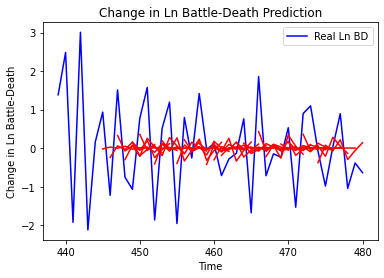

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Egypt', 'country_id': 222, 'step': 't+1', 'mse': 0.8626402603031582, 'mae': 0.7923854980239887, 'r2': 0.23459980121606838, 'tadda_score': 0.8200793903564034}
{'country': 'Egypt', 'country_id': 222, 'step': 't+2', 'mse': 1.2036524796275414, 'mae': 0.9107097893585248, 'r2': -0.11299303167515418, 'tadda_score': 0.9969642911980036}
{'country': 'Egypt', 'country_id': 222, 'step': 't+3', 'mse': 1.023673742644456, 'mae': 0.8142121332235532, 'r2': -0.10378190803271958, 'tadda_score': 0.9002858511408689}
{'country': 'Egypt', 'country_id': 222, 'step': 't+4', 'mse': 1.225456180012796, 'mae': 0.9426023012001702, 'r2': 0.005130937066163299, 'tadda_score': 0.9781672364075372}
{'country': 'Egypt', 'country_id': 222, 'step': 't+5', 'mse': 1.407561773063533, 'mae': 0.9835128851561749, 'r2': -0.18645587680711828, 'tadda_score': 1.1510338186923665}
{'country': 'Egypt', 'country_id': 222, 'step': 't+6', 'mse': 1.2275730820297048, 

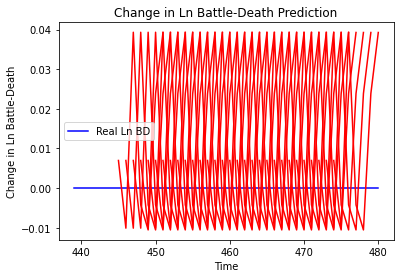

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Uganda', 'country_id': 235, 'step': 't+1', 'mse': 4.848806643620155e-05, 'mae': 0.006963337305933237, 'r2': 0.0, 'tadda_score': 0.006963337305933237}
{'country': 'Uganda', 'country_id': 235, 'step': 't+2', 'mse': 9.972739416464491e-06, 'mae': 0.0031579644419252872, 'r2': 0.0, 'tadda_score': 0.0031579644419252872}
{'country': 'Uganda', 'country_id': 235, 'step': 't+3', 'mse': 0.0013084180808045076, 'mae': 0.036172062158584595, 'r2': 0.0, 'tadda_score': 0.036172062158584595}
{'country': 'Uganda', 'country_id': 235, 'step': 't+4', 'mse': 0.0010195115516218323, 'mae': 0.03192979097366333, 'r2': 0.0, 'tadda_score': 0.03192979097366333}
{'country': 'Uganda', 'country_id': 235, 'step': 't+5', 'mse': 0.0009913281362037285, 'mae': 0.031485363841056824, 'r2': 0.0, 'tadda_score': 0.031485363841056824}
{'country': 'Uganda', 'country_id': 235, 'step': 't+6', 'mse': 0.0030621086028104344, 'mae': 0.055336322635412216, 'r2': 0.

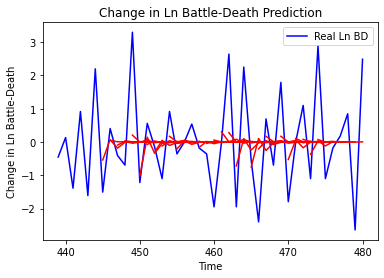

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Kenya', 'country_id': 237, 'step': 't+1', 'mse': 1.6291612404703564, 'mae': 0.9479665025853049, 'r2': 0.21377397629184758, 'tadda_score': 0.9536128553035788}
{'country': 'Kenya', 'country_id': 237, 'step': 't+2', 'mse': 2.1932070153343677, 'mae': 1.209201502956199, 'r2': -0.1489372890776337, 'tadda_score': 1.3478562424900606}
{'country': 'Kenya', 'country_id': 237, 'step': 't+3', 'mse': 2.362260952702564, 'mae': 1.1842584425149902, 'r2': -0.08182846372289476, 'tadda_score': 1.2973481115141061}
{'country': 'Kenya', 'country_id': 237, 'step': 't+4', 'mse': 3.0724729703889255, 'mae': 1.4073792098054576, 'r2': -0.09406498106139005, 'tadda_score': 1.5286218775400804}
{'country': 'Kenya', 'country_id': 237, 'step': 't+5', 'mse': 1.8782238933853286, 'mae': 1.0638726088138097, 'r2': -0.24005659606929308, 'tadda_score': 1.2096083411556158}
{'country': 'Kenya', 'country_id': 237, 'step': 't+6', 'mse': 2.38330806386679, 'm

3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
3/3 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
3/3 [==============================] -

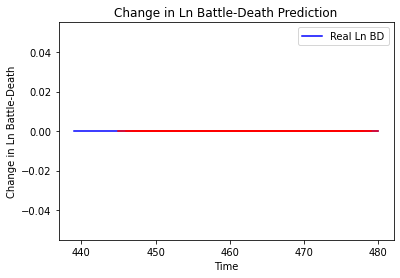

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tanzania', 'country_id': 242, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Morocco']
Building vanilla Model...
Model: "sequential_164"
_________________________________________________________________
Layer (type)       

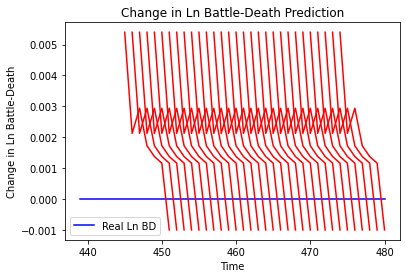

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Morocco', 'country_id': 243, 'step': 't+1', 'mse': 2.9125954107214747e-05, 'mae': 0.005396846681833267, 'r2': 0.0, 'tadda_score': 0.005396846681833267}
{'country': 'Morocco', 'country_id': 243, 'step': 't+2', 'mse': 5.6581773000694696e-05, 'mae': 0.007522085681557655, 'r2': 0.0, 'tadda_score': 0.007522085681557655}
{'country': 'Morocco', 'country_id': 243, 'step': 't+3', 'mse': 0.00010939553704329089, 'mae': 0.01045923214405775, 'r2': 0.0, 'tadda_score': 0.01045923214405775}
{'country': 'Morocco', 'country_id': 243, 'step': 't+4', 'mse': 0.0001484084100877997, 'mae': 0.012182299047708511, 'r2': 0.0, 'tadda_score': 0.012182299047708511}
{'country': 'Morocco', 'country_id': 243, 'step': 't+5', 'mse': 0.00013067502610598913, 'mae': 0.011431317776441574, 'r2': 0.0, 'tadda_score': 0.011431317776441574}
{'country': 'Morocco', 'country_id': 243, 'step': 't+6', 'mse': 0.00015857302841274304, 'mae': 0.012592578306794167,

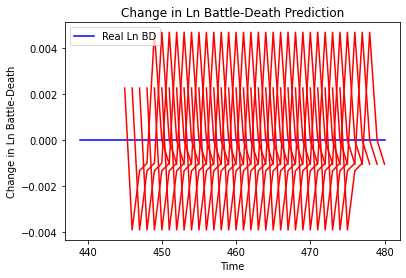

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritania', 'country_id': 244, 'step': 't+1', 'mse': 5.0764115422670245e-06, 'mae': 0.0022530893329530954, 'r2': 0.0, 'tadda_score': 0.0022530893329530954}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+2', 'mse': 2.704931855456805e-06, 'mae': 0.0016446677036583424, 'r2': 0.0, 'tadda_score': 0.0016446677036583424}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+3', 'mse': 8.87043995457913e-06, 'mae': 0.0029783283825963736, 'r2': 0.0, 'tadda_score': 0.0029783283825963736}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+4', 'mse': 1.5855816357459663e-05, 'mae': 0.003981936257332563, 'r2': 0.0, 'tadda_score': 0.003981936257332563}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+5', 'mse': 2.102724470726472e-05, 'mae': 0.004585547372698784, 'r2': 0.0, 'tadda_score': 0.004585547372698784}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+6', 'mse': 2.0943461822111632e-05, 'mae'

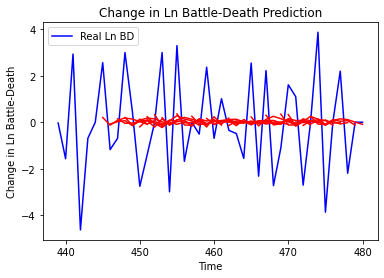

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sudan', 'country_id': 245, 'step': 't+1', 'mse': 3.6291742948011105, 'mae': 1.630761589591059, 'r2': 0.09301125951144407, 'tadda_score': 1.6643196222527352}
{'country': 'Sudan', 'country_id': 245, 'step': 't+2', 'mse': 4.4235784853967575, 'mae': 1.719871156914975, 'r2': -0.03675549369683995, 'tadda_score': 1.7738488661164498}
{'country': 'Sudan', 'country_id': 245, 'step': 't+3', 'mse': 3.917706564385996, 'mae': 1.6623576172210741, 'r2': -0.010224854418169782, 'tadda_score': 1.6974597149732678}
{'country': 'Sudan', 'country_id': 245, 'step': 't+4', 'mse': 3.5174045305037405, 'mae': 1.4951648173985872, 'r2': -0.05943021772445056, 'tadda_score': 1.5851249326152594}
{'country': 'Sudan', 'country_id': 245, 'step': 't+5', 'mse': 5.133707488195139, 'mae': 1.9454849737354416, 'r2': 0.0208080361042583, 'tadda_score': 2.0828049456048308}
{'country': 'Sudan', 'country_id': 245, 'step': 't+6', 'mse': 5.03687713396157, 'mae

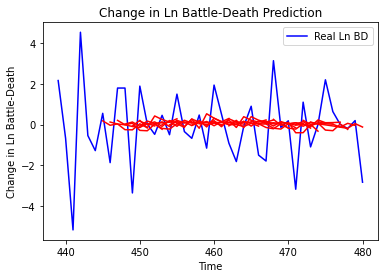

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Sudan', 'country_id': 246, 'step': 't+1', 'mse': 2.1194952575179835, 'mae': 1.1433871169253484, 'r2': 0.04724736743686453, 'tadda_score': 1.1683534930759962}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+2', 'mse': 2.8724624498490376, 'mae': 1.356253138754565, 'r2': -0.06293471696429842, 'tadda_score': 1.4627127191164082}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+3', 'mse': 2.931595465981831, 'mae': 1.3991571566989052, 'r2': -0.1212509753522224, 'tadda_score': 1.4765964132080502}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+4', 'mse': 3.3564365679508787, 'mae': 1.5221626591633557, 'r2': -0.06478946700840105, 'tadda_score': 1.6159758718759614}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+5', 'mse': 2.5792972930777154, 'mae': 1.23827513468142, 'r2': -0.022563881585205836, 'tadda_score': 1.3313873063710893}
{'country': 'South Sudan', 'country_id': 246, 'step':

In [33]:
np.random.seed(1)
tf.random.set_seed(1)
model = Sequential()
summary_model(dataset=df,
              modelname = "Vanilla",
              pred_africa=True,
              period=period_test, 
              epochs=100, 
              batch_size=64, 
              look_back=6, 
              look_forward=7,
              num_neurons=4, 
              val_split=0.2)

['Cape Verde']
Building vanilla Model...
Model: "sequential_169"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_162 (LSTM)              (None, 8)                 320       
_________________________________________________________________
dropout_324 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_324 (Dense)            (None, 8)                 72        
_________________________________________________________________
dropout_325 (Dropout)        (None, 8)                 0         
_________________________________________________________________
dense_325 (Dense)            (None, 7)                 63        
Total params: 455
Trainable params: 455
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
4/4 [==============================] - 0s 72ms/step - loss: 0.0000e

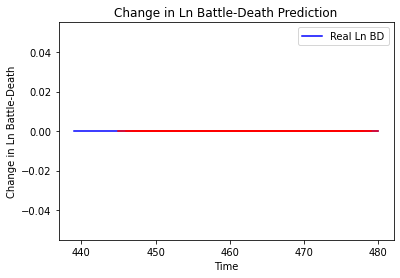

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
["Cote d'Ivoire"]
Building vanilla Model...
Model: "sequential_170"
_________________________________________________________________
Layer 

4/4 [==============================] - 0s 9ms/step - loss: 0.5600 - val_loss: 0.2834
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5547 - val_loss: 0.2833
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5571 - val_loss: 0.2832
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5561 - val_loss: 0.2831
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5557 - val_loss: 0.2830
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5535 - val_loss: 0.2829
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5501 - val_loss: 0.2828
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5513 - val_loss: 0.2827
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5569 - val_loss: 0.2827
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5515 - val_loss: 0.2826
Epoch 75/100
4/4 [===============

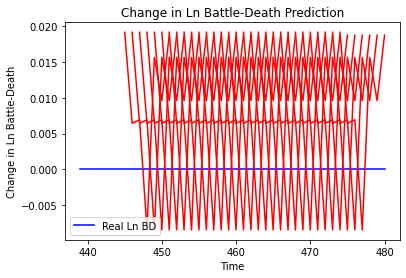

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+1', 'mse': 0.0003680230991476609, 'mae': 0.01918392814695835, 'r2': 0.0, 'tadda_score': 0.01918392814695835}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+2', 'mse': 0.000656359225956752, 'mae': 0.02561950869858265, 'r2': 0.0, 'tadda_score': 0.02561950869858265}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+3', 'mse': 0.0010594200235241602, 'mae': 0.03254873305559158, 'r2': 0.0, 'tadda_score': 0.03254873305559158}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+4', 'mse': 0.000578738574168236, 'mae': 0.02405698597431183, 'r2': 0.0, 'tadda_score': 0.02405698597431183}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+5', 'mse': 0.0011085792252494286, 'mae': 0.03329533338546753, 'r2': 0.0, 'tadda_score': 0.03329533338546753}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+6', 'mse': 0.0018406343670880482, 'mae': 0.0429

Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [============================

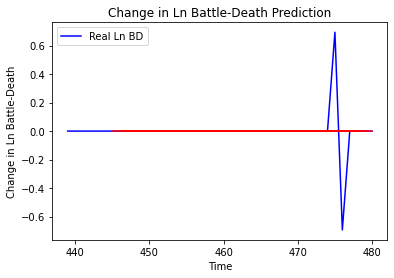

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ghana', 'country_id': 42, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Liberia']
Building vanilla Model...
Model: "sequential_172"
_________________________________________________________________
Layer (type)                 Output Shape      

Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2066 - val_loss: 2.2559e-04
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2105 - val_loss: 2.4202e-04
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2191 - val_loss: 2.3097e-04
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2070 - val_loss: 2.3869e-04
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2019 - val_loss: 2.3572e-04
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2097 - val_loss: 2.7897e-04
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 1.1993 - val_loss: 3.0448e-04
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2129 - val_loss: 3.2222e-04
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2103 - val_loss: 3.4606e-04
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1915 - v

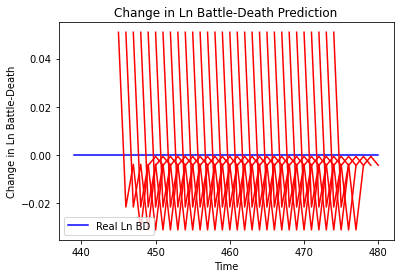

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Liberia', 'country_id': 43, 'step': 't+1', 'mse': 0.002590840069443212, 'mae': 0.05090029537677765, 'r2': 0.0, 'tadda_score': 0.05090029537677765}
{'country': 'Liberia', 'country_id': 43, 'step': 't+2', 'mse': 0.000856058124222861, 'mae': 0.029258470982313156, 'r2': 0.0, 'tadda_score': 0.029258470982313156}
{'country': 'Liberia', 'country_id': 43, 'step': 't+3', 'mse': 0.0006425542604660862, 'mae': 0.02534865401685238, 'r2': 0.0, 'tadda_score': 0.02534865401685238}
{'country': 'Liberia', 'country_id': 43, 'step': 't+4', 'mse': 3.364476898881641e-05, 'mae': 0.005800411105155945, 'r2': 0.0, 'tadda_score': 0.005800411105155945}
{'country': 'Liberia', 'country_id': 43, 'step': 't+5', 'mse': 0.00013108942915580294, 'mae': 0.011449429206550121, 'r2': 0.0, 'tadda_score': 0.011449429206550121}
{'country': 'Liberia', 'country_id': 43, 'step': 't+6', 'mse': 0.00011687407905511607, 'mae': 0.010810831561684608, 'r2': 0.0, '

Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [============================

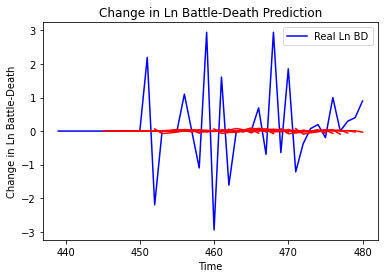

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+1', 'mse': 1.696401618868632, 'mae': 0.8274272458549393, 'r2': -0.02869445397308157, 'tadda_score': 0.8421872069359871}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+2', 'mse': 1.2309194026831798, 'mae': 0.73318904766365, 'r2': -0.040178229510443364, 'tadda_score': 0.7393689242891879}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+3', 'mse': 2.0734240642094877, 'mae': 0.9152977892405108, 'r2': -0.04003258717016189, 'tadda_score': 0.9274122537321166}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+4', 'mse': 2.417480272395715, 'mae': 1.0232176619644475, 'r2': -0.089037432911105, 'tadda_score': 1.0452137271315367}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+5', 'mse': 2.350442962242104, 'mae': 0.9517338455786757, 'r2': -0.12753704981305192, 'tadda_score': 0.9687398401221088}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 

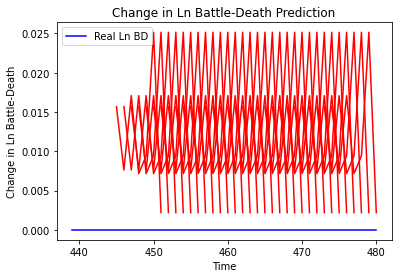

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea', 'country_id': 48, 'step': 't+1', 'mse': 0.0002459938516392729, 'mae': 0.01568419113755226, 'r2': 0.0, 'tadda_score': 0.01568419113755226}
{'country': 'Guinea', 'country_id': 48, 'step': 't+2', 'mse': 0.0005435844207677537, 'mae': 0.02331489697098732, 'r2': 0.0, 'tadda_score': 0.02331489697098732}
{'country': 'Guinea', 'country_id': 48, 'step': 't+3', 'mse': 0.0016322441549085909, 'mae': 0.04040104150772095, 'r2': 0.0, 'tadda_score': 0.04040104150772095}
{'country': 'Guinea', 'country_id': 48, 'step': 't+4', 'mse': 0.002262718958069565, 'mae': 0.04756804555654526, 'r2': 0.0, 'tadda_score': 0.04756804555654526}
{'country': 'Guinea', 'country_id': 48, 'step': 't+5', 'mse': 0.002437512967088884, 'mae': 0.04937117546796799, 'r2': 0.0, 'tadda_score': 0.04937117546796799}
{'country': 'Guinea', 'country_id': 48, 'step': 't+6', 'mse': 0.005554103135267996, 'mae': 0.0745258554816246, 'r2': 0.0, 'tadda_score': 0.0

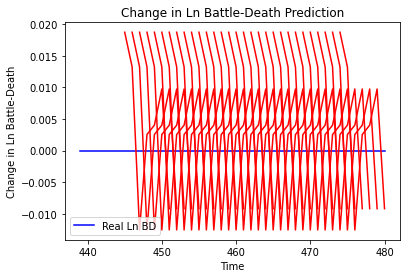

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+1', 'mse': 0.00035127369101563277, 'mae': 0.01874229684472084, 'r2': 0.0, 'tadda_score': 0.01874229684472084}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+2', 'mse': 0.0010240272771744469, 'mae': 0.032000426203012466, 'r2': 0.0, 'tadda_score': 0.032000426203012466}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+3', 'mse': 0.00037809854406051224, 'mae': 0.01944475620985031, 'r2': 0.0, 'tadda_score': 0.01944475620985031}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+4', 'mse': 0.0004837547303706037, 'mae': 0.021994424983859062, 'r2': 0.0, 'tadda_score': 0.021994424983859062}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+5', 'mse': 0.00016300585201989293, 'mae': 0.012767374515533447, 'r2': 0.0, 'tadda_score': 0.012767374515533447}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+6', 'mse': 0.00050729689387519, 'mae

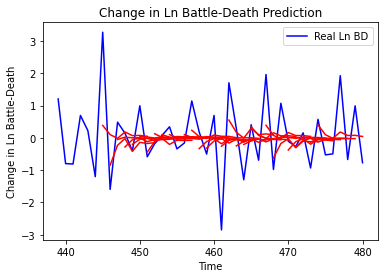

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mali', 'country_id': 50, 'step': 't+1', 'mse': 0.8932967504618473, 'mae': 0.6653968919814998, 'r2': 0.2923907092416328, 'tadda_score': 0.7083916252604499}
{'country': 'Mali', 'country_id': 50, 'step': 't+2', 'mse': 1.3391652670083924, 'mae': 0.8937172285597857, 'r2': -0.3831794824596819, 'tadda_score': 1.0993970902332502}
{'country': 'Mali', 'country_id': 50, 'step': 't+3', 'mse': 1.2761042038234622, 'mae': 0.9429554071160449, 'r2': -0.12404356844866848, 'tadda_score': 1.1360483284922733}
{'country': 'Mali', 'country_id': 50, 'step': 't+4', 'mse': 1.9083191461614815, 'mae': 1.1543124038714212, 'r2': -0.27609516674865153, 'tadda_score': 1.4264190875602802}
{'country': 'Mali', 'country_id': 50, 'step': 't+5', 'mse': 1.7199795819967483, 'mae': 1.068601014552884, 'r2': -0.5884833532204279, 'tadda_score': 1.3346230608357716}
{'country': 'Mali', 'country_id': 50, 'step': 't+6', 'mse': 1.9472539848136188, 'mae': 1.1491

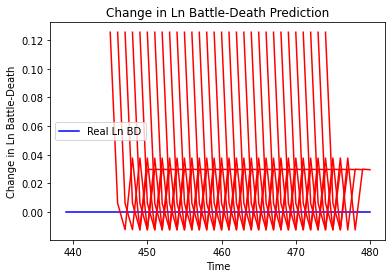

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Senegal', 'country_id': 52, 'step': 't+1', 'mse': 0.015767858384121647, 'mae': 0.1255701333284378, 'r2': 0.0, 'tadda_score': 0.1255701333284378}
{'country': 'Senegal', 'country_id': 52, 'step': 't+2', 'mse': 0.01734504547295601, 'mae': 0.13170059025287628, 'r2': 0.0, 'tadda_score': 0.13170059025287628}
{'country': 'Senegal', 'country_id': 52, 'step': 't+3', 'mse': 0.014257134454410902, 'mae': 0.11940324306488037, 'r2': 0.0, 'tadda_score': 0.11940324306488037}
{'country': 'Senegal', 'country_id': 52, 'step': 't+4', 'mse': 0.024671821558413853, 'mae': 0.15707266330718994, 'r2': 0.0, 'tadda_score': 0.15707266330718994}
{'country': 'Senegal', 'country_id': 52, 'step': 't+5', 'mse': 0.01916663151942921, 'mae': 0.13844360411167145, 'r2': 0.0, 'tadda_score': 0.13844360411167145}
{'country': 'Senegal', 'country_id': 52, 'step': 't+6', 'mse': 0.02833909727784434, 'mae': 0.1683422029018402, 'r2': 0.0, 'tadda_score': 0.168

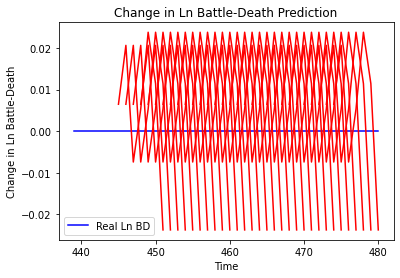

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+1', 'mse': 4.1873005199481034e-05, 'mae': 0.006470935419201851, 'r2': 0.0, 'tadda_score': 0.006470935419201851}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+2', 'mse': 0.0007349277181276127, 'mae': 0.027109550312161446, 'r2': 0.0, 'tadda_score': 0.027109550312161446}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+3', 'mse': 0.00038743360246840455, 'mae': 0.01968333311378956, 'r2': 0.0, 'tadda_score': 0.01968333311378956}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+4', 'mse': 0.0006256602211998641, 'mae': 0.02501320093870163, 'r2': 0.0, 'tadda_score': 0.02501320093870163}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+5', 'mse': 0.0007935048681280282, 'mae': 0.028169218450784683, 'r2': 0.0, 'tadda_score': 0.028169218450784683}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+6', 'mse': 0.001568173555012431, 'mae': 0.0

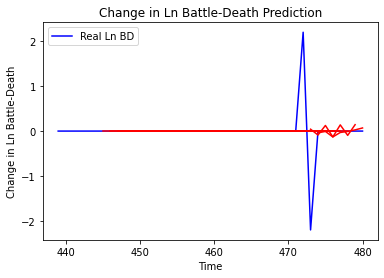

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'The Gambia', 'country_id': 54, 'step': 't+1', 'mse': 0.32809377526998734, 'mae': 0.14916862965913003, 'r2': -0.01938996362705714, 'tadda_score': 0.15056408515862013}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+2', 'mse': 0.31516323205279767, 'mae': 0.1464431057005265, 'r2': 0.020785336769916896, 'tadda_score': 0.1464431057005265}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+3', 'mse': 0.16217363239506166, 'mae': 0.08176502651865972, 'r2': -0.04249950948194292, 'tadda_score': 0.08176502651865972}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+4', 'mse': 0.16244958661870387, 'mae': 0.08186708308156025, 'r2': -0.04427342388798938, 'tadda_score': 0.08186708308156025}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+5', 'mse': 0.1633711386383481, 'mae': 0.0859569109171201, 'r2': -0.0501974296234029, 'tadda_score': 0.0859569109171201}
{'country': 'The Gambia', 'country_id': 54, 'step

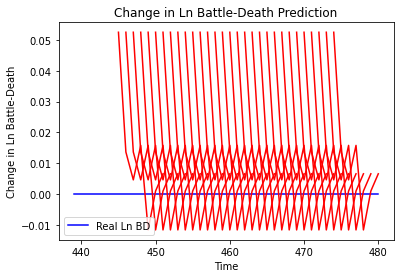

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Djibouti', 'country_id': 55, 'step': 't+1', 'mse': 0.0027527411072334473, 'mae': 0.05246657133102417, 'r2': 0.0, 'tadda_score': 0.05246657133102417}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+2', 'mse': 0.004367394086529863, 'mae': 0.06608626246452332, 'r2': 0.0, 'tadda_score': 0.06608626246452332}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+3', 'mse': 0.0049945418272315245, 'mae': 0.07067207247018814, 'r2': 0.0, 'tadda_score': 0.07067207247018814}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+4', 'mse': 0.007470882591571526, 'mae': 0.0864342674612999, 'r2': 0.0, 'tadda_score': 0.0864342674612999}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+5', 'mse': 0.0037407568145377823, 'mae': 0.06116172671318054, 'r2': 0.0, 'tadda_score': 0.06116172671318054}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+6', 'mse': 0.003859164916547933, 'mae': 0.062122177332639694, 'r2': 0.0, 'tadda

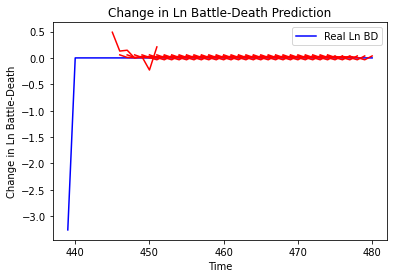

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Eritrea', 'country_id': 56, 'step': 't+1', 'mse': 0.01107359885866365, 'mae': 0.07179621768494447, 'r2': 0.0, 'tadda_score': 0.07179621768494447}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+2', 'mse': 0.016940661980075357, 'mae': 0.08503829712669055, 'r2': 0.0, 'tadda_score': 0.08503829712669055}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+3', 'mse': 0.024220917819234085, 'mae': 0.09418461372454962, 'r2': 0.0, 'tadda_score': 0.09418461372454962}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+4', 'mse': 0.02884047513626482, 'mae': 0.12178282886743545, 'r2': 0.0, 'tadda_score': 0.12178282886743545}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+5', 'mse': 0.023191583936174806, 'mae': 0.1153310681382815, 'r2': 0.0, 'tadda_score': 0.1153310681382815}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+6', 'mse': 0.009601836325289862, 'mae': 0.07368360000352064, 'r2': 0.0, 'tadda_score': 0.0

Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 4.6543 - val_loss: 2.6074
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 4.6644 - val_loss: 2.6058
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 4.6256 - val_loss: 2.6043
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 4.6352 - val_loss: 2.6027
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 4.6360 - val_loss: 2.6012
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 4.6443 - val_loss: 2.5998
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 4.6629 - val_loss: 2.5984
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 4.6632 - val_loss: 2.5972
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 4.6408 - val_loss: 2.5962
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 4.6284 - val_loss: 2.5954
Epoch 72/100
4/4 [==

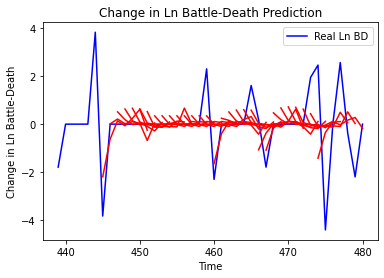

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+1', 'mse': 1.1041751029325746, 'mae': 0.7718491777644559, 'r2': 0.1906305308179117, 'tadda_score': 0.8548356518016264}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+2', 'mse': 3.488520702997072, 'mae': 1.3026026168149418, 'r2': -0.7484255013955787, 'tadda_score': 1.4523803471209316}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+3', 'mse': 3.770895790219554, 'mae': 1.3606316356541421, 'r2': -0.8899501892193973, 'tadda_score': 1.5569246916653425}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+4', 'mse': 3.874016273396291, 'mae': 1.3701529541295479, 'r2': -0.9416335524132984, 'tadda_score': 1.5794452228825997}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+5', 'mse': 3.081815460903587, 'mae': 1.1627151090583907, 'r2': -0.5445872910571414, 'tadda_score': 1.3020153650325248}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+6', 'mse': 2.593798159863

4/4 [==============================] - 0s 9ms/step - loss: 0.9313 - val_loss: 1.0099
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.9271 - val_loss: 1.0095
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9298 - val_loss: 1.0094
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9283 - val_loss: 1.0092
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9268 - val_loss: 1.0090
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9318 - val_loss: 1.0088
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9302 - val_loss: 1.0084
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9335 - val_loss: 1.0081
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9289 - val_loss: 1.0078
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9238 - val_loss: 1.0074
Epoch 71/100
4/4 [==============

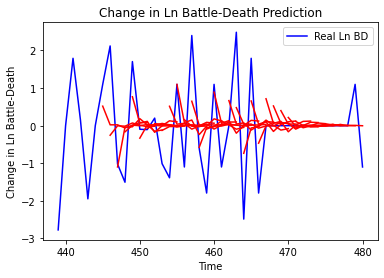

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Algeria', 'country_id': 67, 'step': 't+1', 'mse': 1.1197596459590717, 'mae': 0.7834574846762336, 'r2': 0.29789883036800724, 'tadda_score': 0.8158848940916773}
{'country': 'Algeria', 'country_id': 67, 'step': 't+2', 'mse': 2.3286619724610174, 'mae': 1.136907805154361, 'r2': -0.382651546998914, 'tadda_score': 1.3773445299760878}
{'country': 'Algeria', 'country_id': 67, 'step': 't+3', 'mse': 2.558762410480058, 'mae': 1.2371660578644286, 'r2': -0.42639456029027945, 'tadda_score': 1.497292568871976}
{'country': 'Algeria', 'country_id': 67, 'step': 't+4', 'mse': 2.595736152506868, 'mae': 1.2371612351208952, 'r2': -0.27149177643906053, 'tadda_score': 1.4379900560845962}
{'country': 'Algeria', 'country_id': 67, 'step': 't+5', 'mse': 1.847219128748889, 'mae': 0.9873939888481441, 'r2': -0.3726107816424382, 'tadda_score': 1.1543337441289565}
{'country': 'Algeria', 'country_id': 67, 'step': 't+6', 'mse': 2.0524121562352926,

4/4 [==============================] - 0s 9ms/step - loss: 0.1919 - val_loss: 1.4692
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1921 - val_loss: 1.4690
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1952 - val_loss: 1.4688
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1941 - val_loss: 1.4686
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1934 - val_loss: 1.4685
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1946 - val_loss: 1.4685
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1914 - val_loss: 1.4685
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1934 - val_loss: 1.4686
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1919 - val_loss: 1.4685
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1896 - val_loss: 1.4686
Epoch 71/100
4/4 [===============

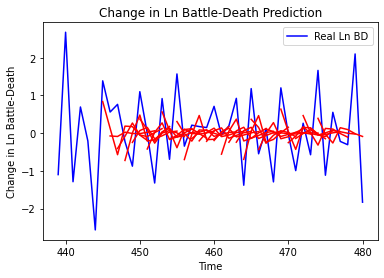

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cameroon', 'country_id': 69, 'step': 't+1', 'mse': 0.5298176925498587, 'mae': 0.6365624602154069, 'r2': 0.2805862155142742, 'tadda_score': 0.6987292174761666}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+2', 'mse': 1.258359863044134, 'mae': 0.9747720163818754, 'r2': -0.7048044314090349, 'tadda_score': 1.2542292392384566}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+3', 'mse': 1.1215466691453537, 'mae': 0.8440921380338438, 'r2': -0.14443187175708072, 'tadda_score': 0.9115138128243255}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+4', 'mse': 1.1682938369510782, 'mae': 0.8673265510623236, 'r2': -0.3265671045495757, 'tadda_score': 0.9982847713008105}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+5', 'mse': 1.4677088228384767, 'mae': 0.9850824591180292, 'r2': -0.47555112491984786, 'tadda_score': 1.1806425314804523}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+6', 'mse': 1.7989701

Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7253 - val_loss: 2.3953
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7371 - val_loss: 2.3946
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7344 - val_loss: 2.3939
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7468 - val_loss: 2.3933
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.7353 - val_loss: 2.3927
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7418 - val_loss: 2.3924
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7374 - val_loss: 2.3922
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 0.7279 - val_loss: 2.3917
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7296 - val_loss: 2.3913
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7237 - val_loss: 2.3908
Epoch 71/100
4/4 [==

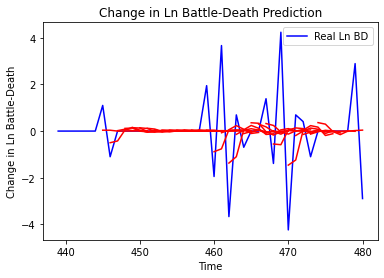

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+1', 'mse': 1.8654575786445227, 'mae': 0.8387074862647975, 'r2': 0.2946523490836086, 'tadda_score': 0.8568598116168306}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+2', 'mse': 2.0692452501915457, 'mae': 1.0491341488382988, 'r2': -0.41344476331697355, 'tadda_score': 1.1047804605783793}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+3', 'mse': 2.3252722478890537, 'mae': 1.0229621782135006, 'r2': 0.007913256946575298, 'tadda_score': 1.0700704571337536}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+4', 'mse': 2.938398054826061, 'mae': 1.1149703974107523, 'r2': -0.21539591036194006, 'tadda_score': 1.1461544174283367}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+5', 'mse': 2.673815958671223, 'mae': 0.96737748195037, 'r2': -0.05511168863711702, 'tadda_score': 0.989169119266

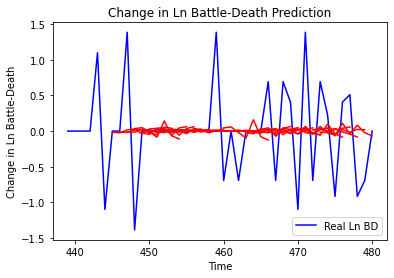

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tunisia', 'country_id': 73, 'step': 't+1', 'mse': 0.4275717522921074, 'mae': 0.41479820191012945, 'r2': -0.03568223197329812, 'tadda_score': 0.421127076860737}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+2', 'mse': 0.40162680920921157, 'mae': 0.42325267999071486, 'r2': 0.023984164829328303, 'tadda_score': 0.43003619418118005}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+3', 'mse': 0.4812974685519767, 'mae': 0.4684575158554838, 'r2': -0.00731095991694275, 'tadda_score': 0.4726543140670683}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+4', 'mse': 0.5036230266846178, 'mae': 0.46032852276387926, 'r2': -0.042979991450112776, 'tadda_score': 0.463452013866088}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+5', 'mse': 0.4547919954695858, 'mae': 0.4399917016966407, 'r2': -0.033762375591868565, 'tadda_score': 0.44394001016202217}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+6', 'mse': 0.55

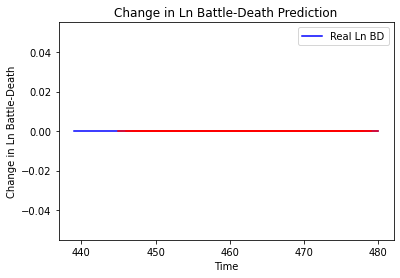

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Benin', 'country_id': 74, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Equatorial Guinea']
Building vanilla Model...
Model: "sequential_188"
_________________________________________________________________
Layer (type)                 Output S

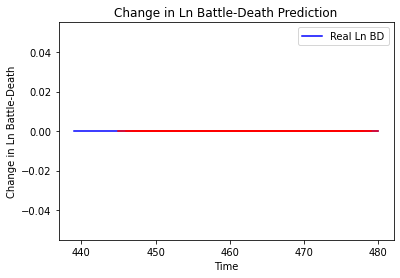

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Niger']
Building vanilla Model...
Model: "sequential_189"
_______________________________

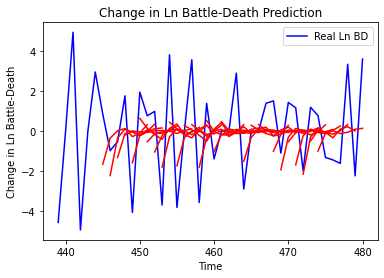

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Niger', 'country_id': 78, 'step': 't+1', 'mse': 3.218320708535933, 'mae': 1.5291007682610682, 'r2': 0.2570593376038569, 'tadda_score': 1.8006182938743762}
{'country': 'Niger', 'country_id': 78, 'step': 't+2', 'mse': 6.664566523321937, 'mae': 2.155863032023002, 'r2': -0.6971973061286274, 'tadda_score': 2.610831805348286}
{'country': 'Niger', 'country_id': 78, 'step': 't+3', 'mse': 6.227381417302173, 'mae': 1.9328644919101732, 'r2': -0.6078816902452482, 'tadda_score': 2.4479809058412245}
{'country': 'Niger', 'country_id': 78, 'step': 't+4', 'mse': 6.631912139070769, 'mae': 2.1440549707074643, 'r2': -0.4616661239542825, 'tadda_score': 2.593619324332444}
{'country': 'Niger', 'country_id': 78, 'step': 't+5', 'mse': 7.70491954336275, 'mae': 2.213825640679535, 'r2': -0.40068355530780897, 'tadda_score': 2.667482432078458}
{'country': 'Niger', 'country_id': 78, 'step': 't+6', 'mse': 7.325060366392046, 'mae': 2.1167238828

4/4 [==============================] - 0s 8ms/step - loss: 0.5416 - val_loss: 1.1607
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5423 - val_loss: 1.1604
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5348 - val_loss: 1.1600
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5394 - val_loss: 1.1596
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5418 - val_loss: 1.1592
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5384 - val_loss: 1.1589
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5386 - val_loss: 1.1586
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5359 - val_loss: 1.1587
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5408 - val_loss: 1.1587
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5447 - val_loss: 1.1584
Epoch 71/100
4/4 [===============

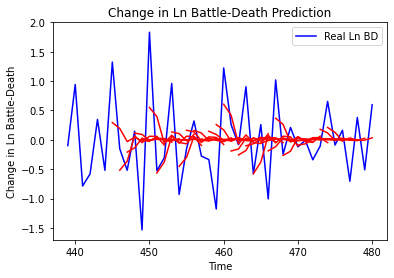

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Nigeria', 'country_id': 79, 'step': 't+1', 'mse': 0.4029440473306105, 'mae': 0.4766446642933096, 'r2': 0.2949437828326189, 'tadda_score': 0.5157396484521831}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+2', 'mse': 1.0097941132946364, 'mae': 0.7952462739594133, 'r2': -0.8662903766241614, 'tadda_score': 1.0164891193282952}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+3', 'mse': 0.9138833444570688, 'mae': 0.7779803199585852, 'r2': -0.491592052521562, 'tadda_score': 0.9677340112829285}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+4', 'mse': 1.1244590747571859, 'mae': 0.8276673448481561, 'r2': -0.5116219283692405, 'tadda_score': 1.0759167211650216}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+5', 'mse': 0.7112765237651087, 'mae': 0.6452886542861634, 'r2': -0.38931212631658885, 'tadda_score': 0.779344026054936}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+6', 'mse': 0.702247923885248

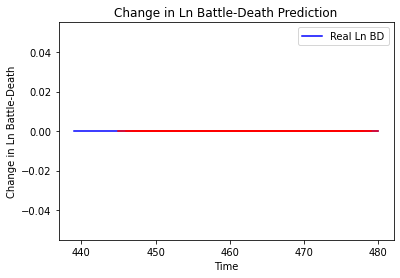

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Togo']
Building vanilla Model...
Model: "sequential_192"
____

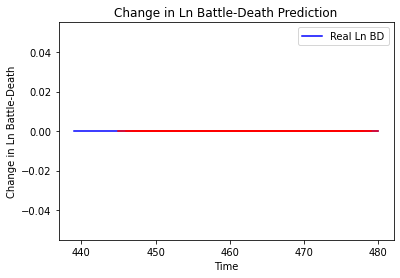

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Togo', 'country_id': 81, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Somalia']
Building vanilla Model...
Model: "sequential_193"
_________________________________________________________________
Layer (type)                 Output Shape             

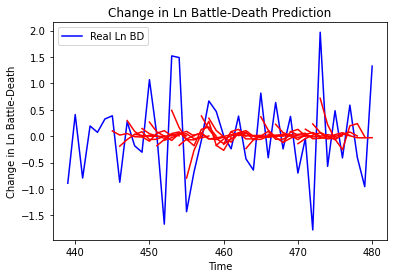

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Somalia', 'country_id': 120, 'step': 't+1', 'mse': 0.571248266490967, 'mae': 0.5891453518163404, 'r2': 0.2501194197317381, 'tadda_score': 0.6476452035771055}
{'country': 'Somalia', 'country_id': 120, 'step': 't+2', 'mse': 1.2379787166784253, 'mae': 0.8354919642162986, 'r2': -0.26242965186329736, 'tadda_score': 0.987320851591991}
{'country': 'Somalia', 'country_id': 120, 'step': 't+3', 'mse': 1.1620913190656812, 'mae': 0.7939535725948805, 'r2': -0.45608415020621895, 'tadda_score': 0.9594868926418418}
{'country': 'Somalia', 'country_id': 120, 'step': 't+4', 'mse': 0.8329225571301195, 'mae': 0.7515423516634653, 'r2': -0.20159873217194502, 'tadda_score': 0.8394753685888946}
{'country': 'Somalia', 'country_id': 120, 'step': 't+5', 'mse': 0.8378839545854666, 'mae': 0.6758596658376244, 'r2': -0.08689707386830059, 'tadda_score': 0.76968907909268}
{'country': 'Somalia', 'country_id': 120, 'step': 't+6', 'mse': 0.85092538

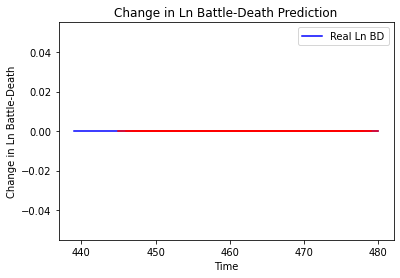

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Botswana', 'country_id': 154, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Burundi']
Building vanilla Model...
Model: "sequential_195"
_________________________________________________________________
Layer (type)       

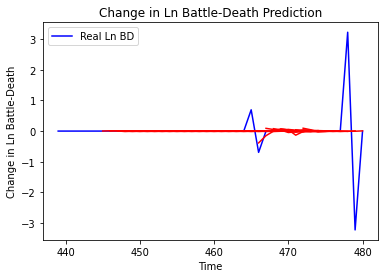

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burundi', 'country_id': 155, 'step': 't+1', 'mse': 0.02016668251536593, 'mae': 0.04839988775116037, 'r2': 0.37038538844093805, 'tadda_score': 0.04839988775116037}
{'country': 'Burundi', 'country_id': 155, 'step': 't+2', 'mse': 0.05003705881592364, 'mae': 0.09412756571266137, 'r2': -0.5621837318032499, 'tadda_score': 0.09880175202184004}
{'country': 'Burundi', 'country_id': 155, 'step': 't+3', 'mse': 0.05005102767073042, 'mae': 0.09876489924607755, 'r2': -0.5626198469196748, 'tadda_score': 0.1032193798543819}
{'country': 'Burundi', 'country_id': 155, 'step': 't+4', 'mse': 0.044370244845921517, 'mae': 0.08060042758502645, 'r2': -0.38526276952887484, 'tadda_score': 0.0832348366550414}
{'country': 'Burundi', 'country_id': 155, 'step': 't+5', 'mse': 0.03647711360175899, 'mae': 0.07218643588044328, 'r2': -0.13883499150978373, 'tadda_score': 0.07332622843204023}
{'country': 'Burundi', 'country_id': 155, 'step': 't+6', 

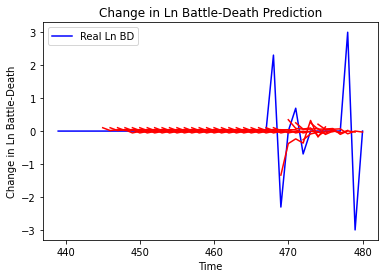

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Rwanda', 'country_id': 156, 'step': 't+1', 'mse': 0.22082981235812252, 'mae': 0.23935239436859448, 'r2': 0.4271452711690008, 'tadda_score': 0.23935239436859448}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+2', 'mse': 0.5602267289331562, 'mae': 0.37808110140397705, 'r2': -0.45328444316398286, 'tadda_score': 0.4025207601252651}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+3', 'mse': 0.48026012371540283, 'mae': 0.3979167479814736, 'r2': -0.7208193710239319, 'tadda_score': 0.4205545453768619}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+4', 'mse': 0.4958663956248646, 'mae': 0.4169289189480297, 'r2': -0.3440257667206903, 'tadda_score': 0.4169289189480297}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+5', 'mse': 0.495911710957123, 'mae': 0.3537887243333014, 'r2': -0.3441485920920404, 'tadda_score': 0.3634514379404537}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+6', 'mse': 0.511721727

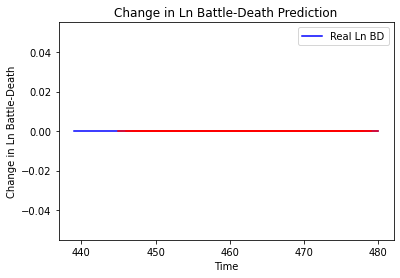

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zambia', 'country_id': 157, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Zimbabwe']
Building vanilla Model...
Model: "sequential_198"
_________________________________________________________________
Layer (type)                 Out

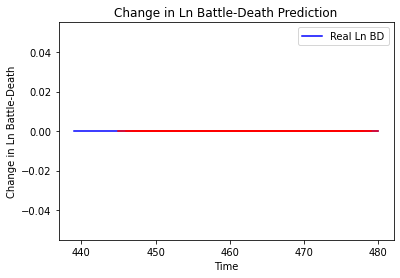

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Comoros']
Building vanilla Model...
Model: "sequential_199"
_________________________________________________________________
Layer (type)       

Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1308 - val_loss: 7.7108e-06
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1300 - val_loss: 1.3810e-05
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1317 - val_loss: 1.3178e-05
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1319 - val_loss: 1.5694e-05
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1304 - val_loss: 2.1153e-05
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1307 - val_loss: 1.3166e-05
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1309 - val_loss: 9.7458e-06
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1300 - val_loss: 8.7603e-06
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1315 - val_loss: 8.0684e-06
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1293 - v

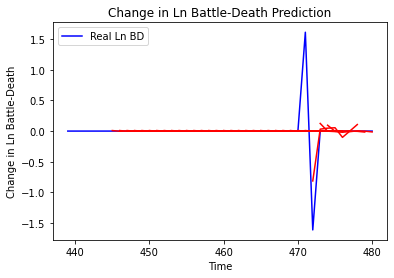

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Comoros', 'country_id': 159, 'step': 't+1', 'mse': 0.10748801173494384, 'mae': 0.09478687750869388, 'r2': 0.3775523471147689, 'tadda_score': 0.09478687750869388}
{'country': 'Comoros', 'country_id': 159, 'step': 't+2', 'mse': 0.20637282941898577, 'mae': 0.1453197786715964, 'r2': -0.19507544346335082, 'tadda_score': 0.14940920144392447}
{'country': 'Comoros', 'country_id': 159, 'step': 't+3', 'mse': 0.199824703201086, 'mae': 0.14421148649179336, 'r2': -0.15715618410279353, 'tadda_score': 0.14707560118360713}
{'country': 'Comoros', 'country_id': 159, 'step': 't+4', 'mse': 0.1013282306535092, 'mae': 0.08945000741977689, 'r2': -0.2140218851469311, 'tadda_score': 0.08945000741977689}
{'country': 'Comoros', 'country_id': 159, 'step': 't+5', 'mse': 0.10789795128426584, 'mae': 0.09502100043345688, 'r2': -0.292734249643978, 'tadda_score': 0.09502100043345688}
{'country': 'Comoros', 'country_id': 159, 'step': 't+6', 'mse'

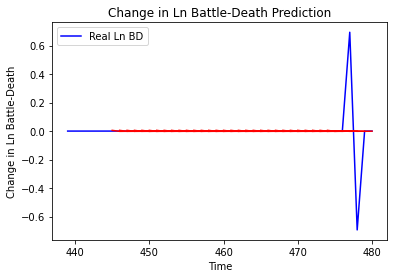

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Lesotho', 'country_id': 160, 'step': 't+1', 'mse': 2.5980452609389304e-05, 'mae': 0.005097102373838425, 'r2': 0.0, 'tadda_score': 0.005097102373838425}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+2', 'mse': 1.0222852450555346e-05, 'mae': 0.003197319572791457, 'r2': 0.0, 'tadda_score': 0.003197319572791457}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+3', 'mse': 2.8403990250469927e-06, 'mae': 0.0016853483393788338, 'r2': 0.0, 'tadda_score': 0.0016853483393788338}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+4', 'mse': 1.1908287154490055e-05, 'mae': 0.003450838616117835, 'r2': 0.0, 'tadda_score': 0.003450838616117835}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+5', 'mse': 3.50783620406503e-05, 'mae': 0.0059226988814771175, 'r2': 0.0, 'tadda_score': 0.0059226988814771175}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+6', 'mse': 1.8179439359098694e-05, 'mae': 0.00426373537629

Epoch 57/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==========================

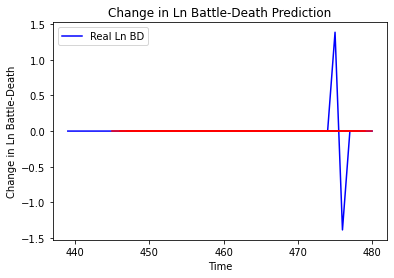

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Malawi', 'country_id': 161, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mozambique']
Building vanilla Model...
Model: "sequential_202"
_________________________________________________________________
Layer (type)                 O

4/4 [==============================] - 0s 10ms/step - loss: 1.1180 - val_loss: 0.6862
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 1.1171 - val_loss: 0.6859
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 1.1357 - val_loss: 0.6857
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 1.1152 - val_loss: 0.6854
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1131 - val_loss: 0.6853
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1247 - val_loss: 0.6852
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1210 - val_loss: 0.6850
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1212 - val_loss: 0.6848
Epoch 73/100
4/4 [==============================] - 0s 10ms/step - loss: 1.1182 - val_loss: 0.6847
Epoch 74/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1034 - val_loss: 0.6846
Epoch 75/100
4/4 [==========

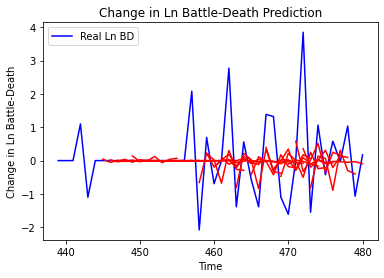

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mozambique', 'country_id': 162, 'step': 't+1', 'mse': 1.235494259607403, 'mae': 0.6901389017088063, 'r2': 0.21483803721510708, 'tadda_score': 0.6988304833889353}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+2', 'mse': 2.1656258552908985, 'mae': 0.9294779290727723, 'r2': -0.13186775594183575, 'tadda_score': 0.9989714214860844}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+3', 'mse': 2.211322327424164, 'mae': 1.0556001535650572, 'r2': -0.15544478590058142, 'tadda_score': 1.1281829831224164}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+4', 'mse': 2.1343378051737614, 'mae': 1.025765852460162, 'r2': -0.4162556448810679, 'tadda_score': 1.2247217680180036}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+5', 'mse': 1.2493053891341634, 'mae': 0.7721015625625771, 'r2': -0.5254109623696712, 'tadda_score': 0.8731785662154279}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+6',

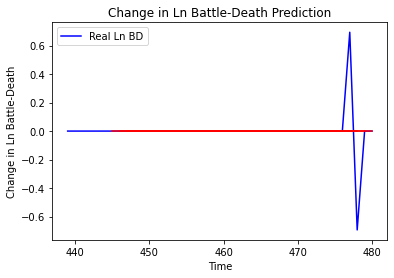

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Africa', 'country_id': 163, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Swaziland']
Building vanilla Model...
Model: "sequential_204"
_______________________________________________________

Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [============================

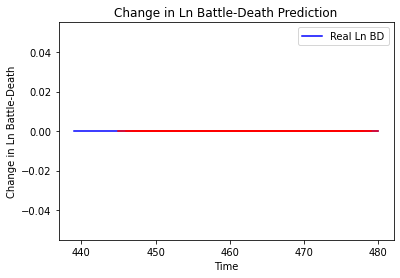

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Swaziland', 'country_id': 164, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Angola']
Building vanilla Model...
Model: "sequential_205"
_________________________________________________________________
Layer (type) 

4/4 [==============================] - 0s 9ms/step - loss: 3.3136 - val_loss: 0.0852
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 3.3169 - val_loss: 0.0851
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3183 - val_loss: 0.0851
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3171 - val_loss: 0.0851
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3253 - val_loss: 0.0851
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3322 - val_loss: 0.0851
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3101 - val_loss: 0.0851
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3245 - val_loss: 0.0851
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 3.2921 - val_loss: 0.0851
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 3.3162 - val_loss: 0.0851
Epoch 75/100
4/4 [==============

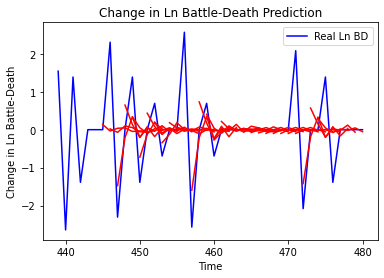

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Angola', 'country_id': 165, 'step': 't+1', 'mse': 0.74843995919568, 'mae': 0.5568326887301646, 'r2': 0.41183988738681787, 'tadda_score': 0.5601230074278555}
{'country': 'Angola', 'country_id': 165, 'step': 't+2', 'mse': 2.10042928431479, 'mae': 0.999906411574487, 'r2': -0.6506183418189455, 'tadda_score': 1.1190925796143254}
{'country': 'Angola', 'country_id': 165, 'step': 't+3', 'mse': 1.242500053159324, 'mae': 0.7788494693164834, 'r2': -0.4165674504877217, 'tadda_score': 0.821870031274836}
{'country': 'Angola', 'country_id': 165, 'step': 't+4', 'mse': 1.1747846225407748, 'mae': 0.786550766227576, 'r2': -0.09447693761639098, 'tadda_score': 0.798417685923907}
{'country': 'Angola', 'country_id': 165, 'step': 't+5', 'mse': 1.1636703718350456, 'mae': 0.7137495487963867, 'r2': -0.1885136580934934, 'tadda_score': 0.7362025650874489}
{'country': 'Angola', 'country_id': 165, 'step': 't+6', 'mse': 1.5089859099608693, 'ma

Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9101 - val_loss: 0.2210
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 1.8815 - val_loss: 0.2209
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9120 - val_loss: 0.2209
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9077 - val_loss: 0.2208
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9203 - val_loss: 0.2207
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9007 - val_loss: 0.2207
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 1.8756 - val_loss: 0.2207
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9033 - val_loss: 0.2207
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 1.8897 - val_loss: 0.2207
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9085 - val_loss: 0.2208
Epoch 71/100
4/4

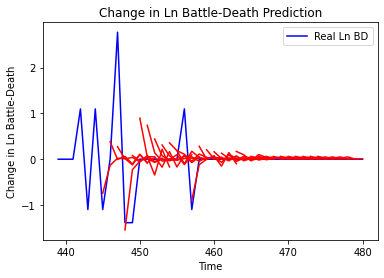

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo', 'country_id': 166, 'step': 't+1', 'mse': 0.39546411564071576, 'mae': 0.3590181887127926, 'r2': 0.2149069770317229, 'tadda_score': 0.36168691217680476}
{'country': 'Congo', 'country_id': 166, 'step': 't+2', 'mse': 1.2792259720559345, 'mae': 0.7004813009118241, 'r2': -0.683285401713438, 'tadda_score': 0.8149687319860064}
{'country': 'Congo', 'country_id': 166, 'step': 't+3', 'mse': 1.214779299850721, 'mae': 0.6145206937214155, 'r2': -1.0481874844347816, 'tadda_score': 0.7450232137263237}
{'country': 'Congo', 'country_id': 166, 'step': 't+4', 'mse': 1.1684487809882904, 'mae': 0.6726339821041046, 'r2': -0.6821095319533079, 'tadda_score': 0.7925474444052}
{'country': 'Congo', 'country_id': 166, 'step': 't+5', 'mse': 1.1408549831388612, 'mae': 0.6917348158503989, 'r2': -0.9235468519320462, 'tadda_score': 0.7898731281628628}
{'country': 'Congo', 'country_id': 166, 'step': 't+6', 'mse': 1.052545314820809, 'mae':

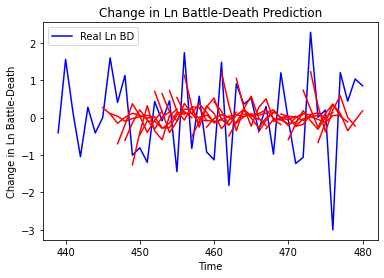

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+1', 'mse': 0.8944131147090219, 'mae': 0.7805102131669276, 'r2': 0.18279683226960586, 'tadda_score': 0.9339972269440246}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+2', 'mse': 2.5200589662363937, 'mae': 1.3051287842978074, 'r2': -0.7823155184158483, 'tadda_score': 1.663990585326059}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+3', 'mse': 2.4454436298242017, 'mae': 1.2832500663192163, 'r2': -0.41770116446983585, 'tadda_score': 1.6197184221735688}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+4', 'mse': 3.077246967907736, 'mae': 1.4621178085126554, 'r2': -0.7663212261426238, 'tadda_score': 1.899479298742421}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+5', 'mse': 3.7967228724769524, 'mae': 1.548849166842892, 'r2': -1.0682382399810608, 'tadda_score': 2.0629724456991694}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+6', '

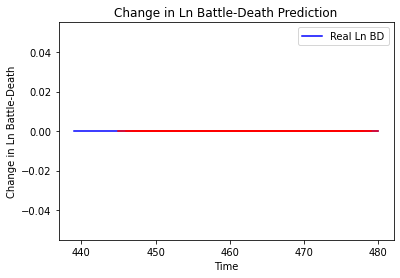

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Gabon', 'country_id': 169, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Namibia']
Building vanilla Model...
Model: "sequential_209"
_________________________________________________________________
Layer (type)                 Output Shap

Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1430 - val_loss: 7.1986e-06
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1417 - val_loss: 1.2690e-05
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1427 - val_loss: 1.2961e-05
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1430 - val_loss: 1.9098e-05
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1427 - val_loss: 9.4753e-06
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1435 - val_loss: 6.6880e-06
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1415 - val_loss: 5.3828e-06
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1406 - val_loss: 4.6706e-06
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1402 - val_loss: 3.4229e-06
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1416 - v

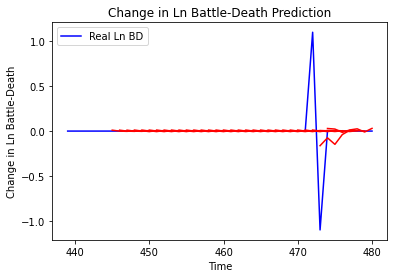

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Namibia', 'country_id': 170, 'step': 't+1', 'mse': 0.06882776510351588, 'mae': 0.07766212645317805, 'r2': 0.14460635033178149, 'tadda_score': 0.07766212645317805}
{'country': 'Namibia', 'country_id': 170, 'step': 't+2', 'mse': 0.08556521806569355, 'mae': 0.09132280087119035, 'r2': -0.06340724641852091, 'tadda_score': 0.09303221290951662}
{'country': 'Namibia', 'country_id': 170, 'step': 't+3', 'mse': 0.04478164040819078, 'mae': 0.05647344790098911, 'r2': -0.15147789365929598, 'tadda_score': 0.05647344790098911}
{'country': 'Namibia', 'country_id': 170, 'step': 't+4', 'mse': 0.04550591553637489, 'mae': 0.063583944449304, 'r2': -0.17010130252572764, 'tadda_score': 0.063583944449304}
{'country': 'Namibia', 'country_id': 170, 'step': 't+5', 'mse': 0.04321930288124039, 'mae': 0.06404866708763288, 'r2': -0.1113052445933036, 'tadda_score': 0.06404866708763288}
{'country': 'Namibia', 'country_id': 170, 'step': 't+6', 'm

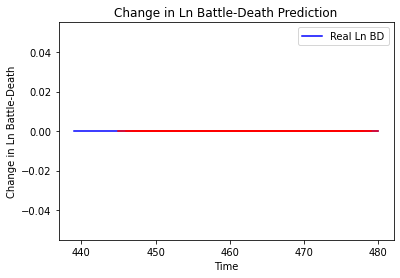

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Madagascar', 'country_id': 172, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mauritius']
Building vanilla Model...
Model: "sequential_211"
_________________________________________________________________
Lay

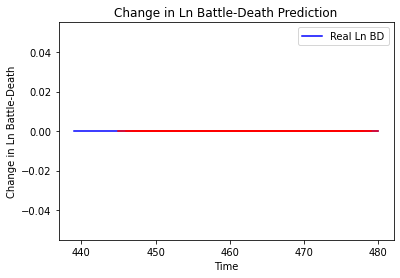

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritius', 'country_id': 173, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Seychelles']
Building vanilla Model...
Model: "sequential_212"
_________________________________________________________________
Layer (ty

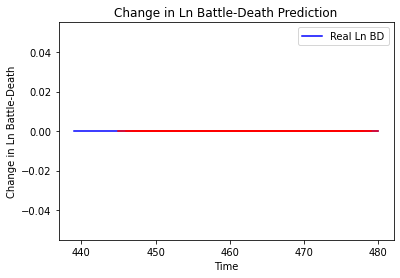

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Seychelles', 'country_id': 174, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Libya']
Building vanilla Model...
Model: "sequential_213"
_________________________________________________________________
Layer (

Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0315 - val_loss: 2.2969
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.2969
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.2969
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.2968
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.2968
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.2968
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.2968
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.2968
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.2968
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.2968
Epoch 75/100
4/4 [==

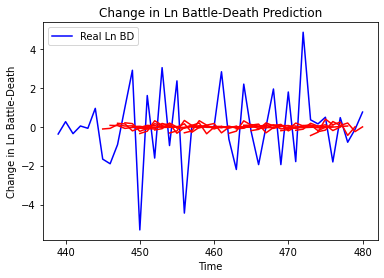

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Libya', 'country_id': 213, 'step': 't+1', 'mse': 4.507323713644231, 'mae': 1.633215443518315, 'r2': 0.06981789184564147, 'tadda_score': 1.667683709389522}
{'country': 'Libya', 'country_id': 213, 'step': 't+2', 'mse': 5.849384797590203, 'mae': 1.8799597517078341, 'r2': -0.07977433136517309, 'tadda_score': 1.9968253051663658}
{'country': 'Libya', 'country_id': 213, 'step': 't+3', 'mse': 7.569049850005816, 'mae': 2.135426158999968, 'r2': -0.019738463162678466, 'tadda_score': 2.1846140891766237}
{'country': 'Libya', 'country_id': 213, 'step': 't+4', 'mse': 5.923647468815543, 'mae': 1.9917709188816415, 'r2': -0.023641832940228813, 'tadda_score': 2.018585374203321}
{'country': 'Libya', 'country_id': 213, 'step': 't+5', 'mse': 7.24926294202501, 'mae': 2.2726120072985894, 'r2': 0.003699290399368893, 'tadda_score': 2.322953542037328}
{'country': 'Libya', 'country_id': 213, 'step': 't+6', 'mse': 6.139608286906116, 'mae': 

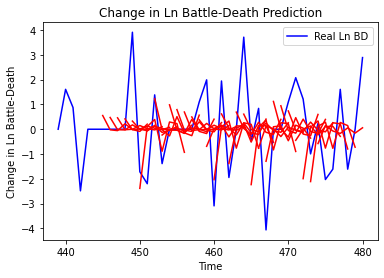

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Chad', 'country_id': 214, 'step': 't+1', 'mse': 2.5856407614514363, 'mae': 1.2969556423200053, 'r2': 0.11916275718272051, 'tadda_score': 1.4455608250869194}
{'country': 'Chad', 'country_id': 214, 'step': 't+2', 'mse': 6.824450963388633, 'mae': 2.028004372397958, 'r2': -0.6077388848489103, 'tadda_score': 2.521818463037311}
{'country': 'Chad', 'country_id': 214, 'step': 't+3', 'mse': 7.730368999955033, 'mae': 2.168174170555674, 'r2': -0.48015292465015835, 'tadda_score': 2.5690501790265277}
{'country': 'Chad', 'country_id': 214, 'step': 't+4', 'mse': 11.025272264145821, 'mae': 2.767659113836741, 'r2': -0.8080346559125888, 'tadda_score': 3.433337831529435}
{'country': 'Chad', 'country_id': 214, 'step': 't+5', 'mse': 9.679410960009848, 'mae': 2.4730486166547605, 'r2': -1.037401672621817, 'tadda_score': 3.095233745581991}
{'country': 'Chad', 'country_id': 214, 'step': 't+6', 'mse': 7.015274171861159, 'mae': 2.08844370

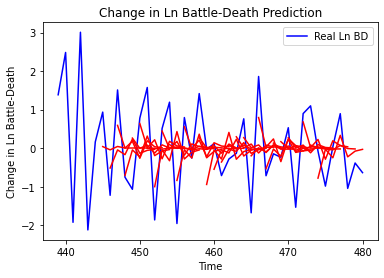

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Egypt', 'country_id': 222, 'step': 't+1', 'mse': 0.6774585415114298, 'mae': 0.686973142989687, 'r2': 0.3989071386970804, 'tadda_score': 0.7362405707992234}
{'country': 'Egypt', 'country_id': 222, 'step': 't+2', 'mse': 1.579623832296511, 'mae': 1.066040545445304, 'r2': -0.46064611486369333, 'tadda_score': 1.2983874364362369}
{'country': 'Egypt', 'country_id': 222, 'step': 't+3', 'mse': 1.5186133970691942, 'mae': 0.9946533090868854, 'r2': -0.6374533439247079, 'tadda_score': 1.2433899752919142}
{'country': 'Egypt', 'country_id': 222, 'step': 't+4', 'mse': 1.3262085554078247, 'mae': 0.9745229748632221, 'r2': -0.0766634370880912, 'tadda_score': 1.1564825193579706}
{'country': 'Egypt', 'country_id': 222, 'step': 't+5', 'mse': 1.6807060067804238, 'mae': 1.1074682904108066, 'r2': -0.41669343192631003, 'tadda_score': 1.398917851132522}
{'country': 'Egypt', 'country_id': 222, 'step': 't+6', 'mse': 1.478643314140379, 'mae'

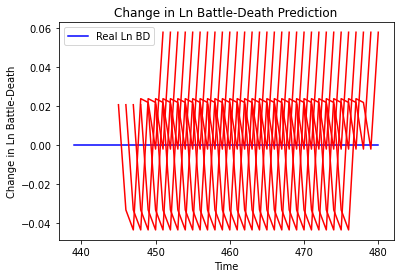

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Uganda', 'country_id': 235, 'step': 't+1', 'mse': 0.000423716557081847, 'mae': 0.02058437652885914, 'r2': 0.0, 'tadda_score': 0.02058437652885914}
{'country': 'Uganda', 'country_id': 235, 'step': 't+2', 'mse': 0.0001651359891168304, 'mae': 0.012850524857640266, 'r2': 0.0, 'tadda_score': 0.012850524857640266}
{'country': 'Uganda', 'country_id': 235, 'step': 't+3', 'mse': 0.0031983790268521606, 'mae': 0.05655421316623688, 'r2': 0.0, 'tadda_score': 0.05655421316623688}
{'country': 'Uganda', 'country_id': 235, 'step': 't+4', 'mse': 0.0010803136110806855, 'mae': 0.032868124544620514, 'r2': 0.0, 'tadda_score': 0.032868124544620514}
{'country': 'Uganda', 'country_id': 235, 'step': 't+5', 'mse': 0.000497333420590218, 'mae': 0.022300973534584045, 'r2': 0.0, 'tadda_score': 0.022300973534584045}
{'country': 'Uganda', 'country_id': 235, 'step': 't+6', 'mse': 0.00040395059886422224, 'mae': 0.020098522305488586, 'r2': 0.0, 't

Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1164 - val_loss: 1.6690
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1196 - val_loss: 1.6681
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1197 - val_loss: 1.6672
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1164 - val_loss: 1.6661
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1171 - val_loss: 1.6651
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1166 - val_loss: 1.6639
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1170 - val_loss: 1.6627
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1180 - val_loss: 1.6616
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1182 - val_loss: 1.6604
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1185 - val_loss: 1.6595
Epoch 72/100
4/4 [==

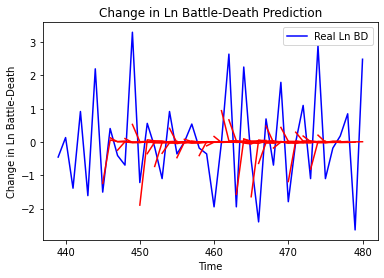

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Kenya', 'country_id': 237, 'step': 't+1', 'mse': 1.34516103642209, 'mae': 0.8715534459539444, 'r2': 0.3508312212191248, 'tadda_score': 0.8921792140591334}
{'country': 'Kenya', 'country_id': 237, 'step': 't+2', 'mse': 2.832442679801269, 'mae': 1.3805677156594869, 'r2': -0.48380840989719354, 'tadda_score': 1.7248100803243593}
{'country': 'Kenya', 'country_id': 237, 'step': 't+3', 'mse': 2.7333513078170015, 'mae': 1.2498891685552296, 'r2': -0.251774171167513, 'tadda_score': 1.4623223261681098}
{'country': 'Kenya', 'country_id': 237, 'step': 't+4', 'mse': 3.465641140100531, 'mae': 1.5110973547668514, 'r2': -0.23406670940695085, 'tadda_score': 1.7403147879512368}
{'country': 'Kenya', 'country_id': 237, 'step': 't+5', 'mse': 2.3426665266337126, 'mae': 1.1425329257343386, 'r2': -0.5466947731704155, 'tadda_score': 1.3969771024380302}
{'country': 'Kenya', 'country_id': 237, 'step': 't+6', 'mse': 2.537386587372845, 'mae':

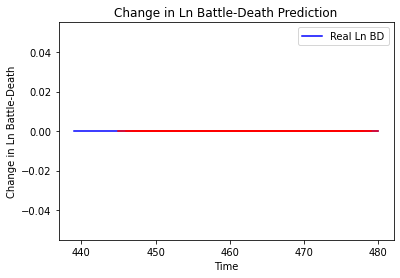

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tanzania', 'country_id': 242, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Morocco']
Building vanilla Model...
Model: "sequential_219"
_________________________________________________________________
Layer (type)       

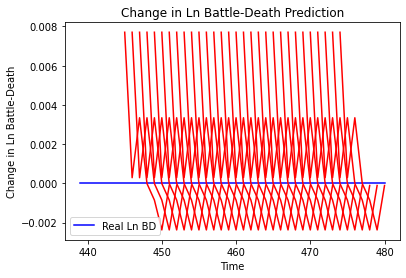

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Morocco', 'country_id': 243, 'step': 't+1', 'mse': 5.934411110875004e-05, 'mae': 0.007703512907028198, 'r2': 0.0, 'tadda_score': 0.007703512907028198}
{'country': 'Morocco', 'country_id': 243, 'step': 't+2', 'mse': 6.393133015656586e-05, 'mae': 0.007995706982910633, 'r2': 0.0, 'tadda_score': 0.007995706982910633}
{'country': 'Morocco', 'country_id': 243, 'step': 't+3', 'mse': 0.00012862930755043467, 'mae': 0.011341486126184464, 'r2': 0.0, 'tadda_score': 0.011341486126184464}
{'country': 'Morocco', 'country_id': 243, 'step': 't+4', 'mse': 0.0001284646895987904, 'mae': 0.011334226466715336, 'r2': 0.0, 'tadda_score': 0.011334226466715336}
{'country': 'Morocco', 'country_id': 243, 'step': 't+5', 'mse': 0.0001038723710825723, 'mae': 0.01019177958369255, 'r2': 0.0, 'tadda_score': 0.01019177958369255}
{'country': 'Morocco', 'country_id': 243, 'step': 't+6', 'mse': 6.117962574126237e-05, 'mae': 0.007821740582585335, 'r2

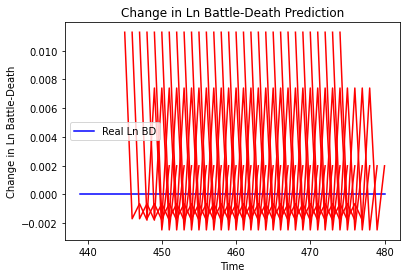

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritania', 'country_id': 244, 'step': 't+1', 'mse': 0.00012737976152091615, 'mae': 0.011286264285445213, 'r2': 0.0, 'tadda_score': 0.011286264285445213}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+2', 'mse': 9.204338745558496e-05, 'mae': 0.009593924507498741, 'r2': 0.0, 'tadda_score': 0.009593924507498741}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+3', 'mse': 8.008175760977707e-05, 'mae': 0.008948841132223606, 'r2': 0.0, 'tadda_score': 0.008948841132223606}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+4', 'mse': 5.1271775539244455e-05, 'mae': 0.0071604312397539616, 'r2': 0.0, 'tadda_score': 0.0071604312397539616}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+5', 'mse': 0.00026429244627014514, 'mae': 0.01625707373023033, 'r2': 0.0, 'tadda_score': 0.01625707373023033}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+6', 'mse': 0.00019011078620284616, 'mae': 0.

Epoch 61/100
1/1 [==============================] - 0s 19ms/step - loss: 3.1933 - val_loss: 0.9262
Epoch 62/100
1/1 [==============================] - 0s 19ms/step - loss: 3.1997 - val_loss: 0.9262
Epoch 63/100
1/1 [==============================] - 0s 17ms/step - loss: 3.2093 - val_loss: 0.9261
Epoch 64/100
1/1 [==============================] - 0s 18ms/step - loss: 3.1938 - val_loss: 0.9261
Epoch 65/100
1/1 [==============================] - 0s 18ms/step - loss: 3.2083 - val_loss: 0.9261
Epoch 66/100
1/1 [==============================] - 0s 18ms/step - loss: 3.1824 - val_loss: 0.9260
Epoch 67/100
1/1 [==============================] - 0s 17ms/step - loss: 3.1890 - val_loss: 0.9260
Epoch 68/100
1/1 [==============================] - 0s 18ms/step - loss: 3.1868 - val_loss: 0.9260
Epoch 69/100
1/1 [==============================] - 0s 18ms/step - loss: 3.1860 - val_loss: 0.9260
Epoch 70/100
1/1 [==============================] - 0s 18ms/step - loss: 3.1363 - val_loss: 0.9260
Epoch 71/1

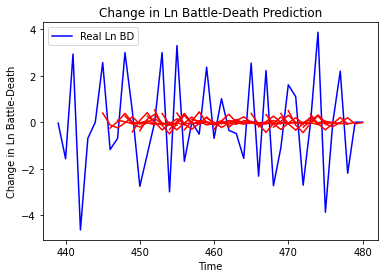

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sudan', 'country_id': 245, 'step': 't+1', 'mse': 3.3196987776591613, 'mae': 1.5641270622455605, 'r2': 0.17035414433974194, 'tadda_score': 1.6096937745654114}
{'country': 'Sudan', 'country_id': 245, 'step': 't+2', 'mse': 4.4901514170411945, 'mae': 1.7318107884113196, 'r2': -0.05235821281705566, 'tadda_score': 1.845572207220813}
{'country': 'Sudan', 'country_id': 245, 'step': 't+3', 'mse': 3.824732059561088, 'mae': 1.666532728080121, 'r2': 0.013749670998096097, 'tadda_score': 1.6912079627356602}
{'country': 'Sudan', 'country_id': 245, 'step': 't+4', 'mse': 3.2537823230542413, 'mae': 1.439476626740359, 'r2': 0.019971889770766804, 'tadda_score': 1.4709320082343744}
{'country': 'Sudan', 'country_id': 245, 'step': 't+5', 'mse': 5.2425875159280935, 'mae': 1.946399531136009, 'r2': 4.05014463111808e-05, 'tadda_score': 2.0022061495682126}
{'country': 'Sudan', 'country_id': 245, 'step': 't+6', 'mse': 4.7752752928013695, 'm

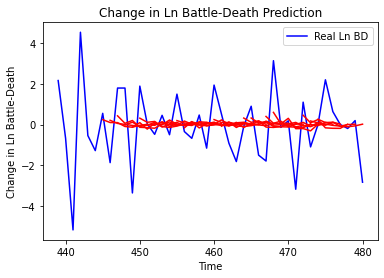

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Sudan', 'country_id': 246, 'step': 't+1', 'mse': 2.038283689106562, 'mae': 1.1224619169398442, 'r2': 0.08375348148647643, 'tadda_score': 1.1750839450075523}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+2', 'mse': 3.0857707154614773, 'mae': 1.395535741819738, 'r2': -0.14186795452387724, 'tadda_score': 1.5539850027102218}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+3', 'mse': 3.3528935169452563, 'mae': 1.5243087633316894, 'r2': -0.28238536651847546, 'tadda_score': 1.7220434729124288}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+4', 'mse': 3.67433889610295, 'mae': 1.570069348214919, 'r2': -0.16564018880840492, 'tadda_score': 1.715658626480753}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+5', 'mse': 2.9174010795683443, 'mae': 1.294853637112932, 'r2': -0.15660532039894237, 'tadda_score': 1.3883557972746652}
{'country': 'South Sudan', 'country_id': 246, 'step': 't

In [34]:
np.random.seed(1)
tf.random.set_seed(1)
model = Sequential()
summary_model(dataset=df,
              modelname = "Vanilla",
              pred_africa=True,
              period=period_test, 
              epochs=100, 
              batch_size=64,
              look_back=6, 
              look_forward=7,
              num_neurons=8, 
              val_split=0.2)

['Cape Verde']
Building vanilla Model...
Model: "sequential_224"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_216 (LSTM)              (None, 12)                672       
_________________________________________________________________
dropout_432 (Dropout)        (None, 12)                0         
_________________________________________________________________
dense_432 (Dense)            (None, 12)                156       
_________________________________________________________________
dropout_433 (Dropout)        (None, 12)                0         
_________________________________________________________________
dense_433 (Dense)            (None, 7)                 91        
Total params: 919
Trainable params: 919
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
4/4 [==============================] - 0s 68ms/step - loss: 0.0000e

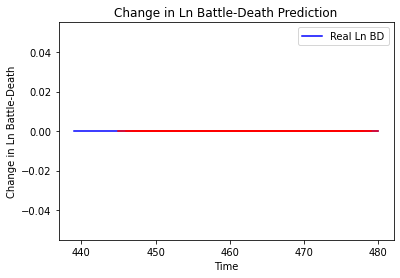

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
["Cote d'Ivoire"]
Building vanilla Model...
Model: "sequential_225"
_________________________________________________________________
Layer 

4/4 [==============================] - 0s 8ms/step - loss: 0.5512 - val_loss: 0.2875
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5496 - val_loss: 0.2876
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5541 - val_loss: 0.2875
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5507 - val_loss: 0.2875
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5549 - val_loss: 0.2876
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5493 - val_loss: 0.2877
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5490 - val_loss: 0.2877
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5447 - val_loss: 0.2878
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5457 - val_loss: 0.2881
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5500 - val_loss: 0.2881
Epoch 75/100
4/4 [===============

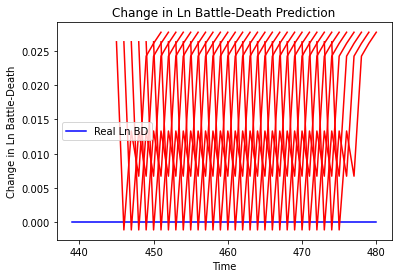

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+1', 'mse': 0.0006924513796409265, 'mae': 0.026314470916986465, 'r2': 0.0, 'tadda_score': 0.026314470916986465}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+2', 'mse': 0.0006352503981404412, 'mae': 0.02520417422056198, 'r2': 0.0, 'tadda_score': 0.02520417422056198}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+3', 'mse': 0.0014832391985931809, 'mae': 0.03851284459233284, 'r2': 0.0, 'tadda_score': 0.03851284459233284}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+4', 'mse': 0.0020463057101096638, 'mae': 0.04523611068725586, 'r2': 0.0, 'tadda_score': 0.04523611068725586}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+5', 'mse': 0.00497939401392089, 'mae': 0.07056482136249542, 'r2': 0.0, 'tadda_score': 0.07056482136249542}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+6', 'mse': 0.00934109373068126, 'mae': 0.0966

Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [============================

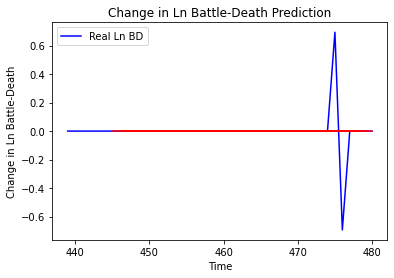

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ghana', 'country_id': 42, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Liberia']
Building vanilla Model...
Model: "sequential_227"
_________________________________________________________________
Layer (type)                 Output Shape      

Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 1.1863 - val_loss: 2.6614e-04
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1880 - val_loss: 2.4832e-04
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1869 - val_loss: 2.0493e-04
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1800 - val_loss: 1.9009e-04
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 1.1912 - val_loss: 1.6019e-04
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1927 - val_loss: 1.9396e-04
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 1.1844 - val_loss: 1.7790e-04
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1713 - val_loss: 1.9212e-04
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 1.1860 - val_loss: 2.1348e-04
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1893 -

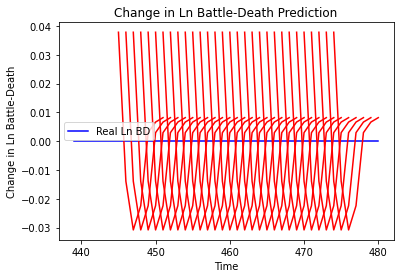

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Liberia', 'country_id': 43, 'step': 't+1', 'mse': 0.0014336127860788, 'mae': 0.03786307945847511, 'r2': 0.0, 'tadda_score': 0.03786307945847511}
{'country': 'Liberia', 'country_id': 43, 'step': 't+2', 'mse': 0.000572982018132176, 'mae': 0.02393704280257225, 'r2': 0.0, 'tadda_score': 0.02393704280257225}
{'country': 'Liberia', 'country_id': 43, 'step': 't+3', 'mse': 4.7521969575751305e-05, 'mae': 0.006893618032336235, 'r2': 0.0, 'tadda_score': 0.006893618032336235}
{'country': 'Liberia', 'country_id': 43, 'step': 't+4', 'mse': 0.0008597037816927694, 'mae': 0.02932070568203926, 'r2': 0.0, 'tadda_score': 0.02932070568203926}
{'country': 'Liberia', 'country_id': 43, 'step': 't+5', 'mse': 0.00015431036595947925, 'mae': 0.012422172352671623, 'r2': 0.0, 'tadda_score': 0.012422172352671623}
{'country': 'Liberia', 'country_id': 43, 'step': 't+6', 'mse': 3.3353765691025196e-05, 'mae': 0.005775271914899349, 'r2': 0.0, 'tad

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 9ms/

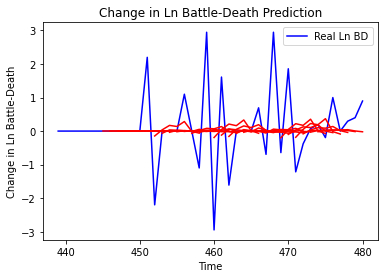

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+1', 'mse': 1.5846292857865654, 'mae': 0.7981806015362146, 'r2': 0.03908405901008605, 'tadda_score': 0.8076137651145262}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+2', 'mse': 1.2365055953037805, 'mae': 0.7457983132531157, 'r2': -0.04489879524133911, 'tadda_score': 0.7595438381425947}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+3', 'mse': 2.0612119093308268, 'mae': 0.90682151381759, 'r2': -0.033906952162535475, 'tadda_score': 0.9140974162664329}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+4', 'mse': 2.2606923914692256, 'mae': 1.0082534400925238, 'r2': -0.018406920097635115, 'tadda_score': 1.0265044720556784}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+5', 'mse': 2.101402870424268, 'mae': 0.9234220334460786, 'r2': -0.008069385664505546, 'tadda_score': 0.9444057771136812}
{'country': 'Burkina Faso', 'country_id': 47, 'st

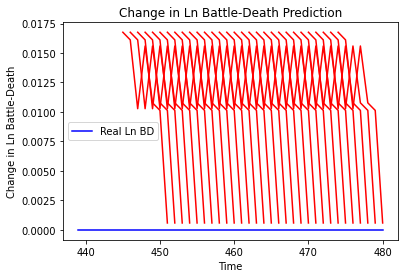

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea', 'country_id': 48, 'step': 't+1', 'mse': 0.0002809169251617588, 'mae': 0.016760576516389847, 'r2': 0.0, 'tadda_score': 0.016760576516389847}
{'country': 'Guinea', 'country_id': 48, 'step': 't+2', 'mse': 0.0010806545201336726, 'mae': 0.03287331014871597, 'r2': 0.0, 'tadda_score': 0.03287331014871597}
{'country': 'Guinea', 'country_id': 48, 'step': 't+3', 'mse': 0.0018621501473470858, 'mae': 0.04315263777971268, 'r2': 0.0, 'tadda_score': 0.04315263777971268}
{'country': 'Guinea', 'country_id': 48, 'step': 't+4', 'mse': 0.0034511899914522193, 'mae': 0.0587468296289444, 'r2': 0.0, 'tadda_score': 0.0587468296289444}
{'country': 'Guinea', 'country_id': 48, 'step': 't+5', 'mse': 0.0028524236822171645, 'mae': 0.05340808629989624, 'r2': 0.0, 'tadda_score': 0.05340808629989624}
{'country': 'Guinea', 'country_id': 48, 'step': 't+6', 'mse': 0.004037665420409342, 'mae': 0.06354262679815292, 'r2': 0.0, 'tadda_score': 

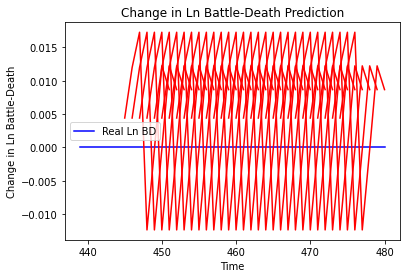

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+1', 'mse': 1.938557862590784e-05, 'mae': 0.004402905702590942, 'r2': 0.0, 'tadda_score': 0.004402905702590942}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+2', 'mse': 0.00026851022791708756, 'mae': 0.016386281698942184, 'r2': 0.0, 'tadda_score': 0.016386281698942184}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+3', 'mse': 0.0011331314177831647, 'mae': 0.033662017434835434, 'r2': 0.0, 'tadda_score': 0.033662017434835434}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+4', 'mse': 0.0004525330075166867, 'mae': 0.021272823214530945, 'r2': 0.0, 'tadda_score': 0.021272823214530945}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+5', 'mse': 8.027753215068215e-05, 'mae': 0.008959772996604443, 'r2': 0.0, 'tadda_score': 0.008959772996604443}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+6', 'mse': 0.00044901352459993105,

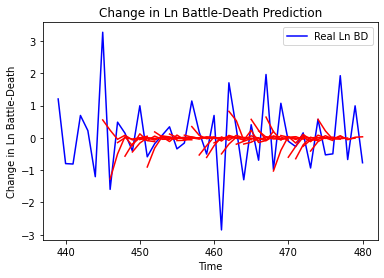

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mali', 'country_id': 50, 'step': 't+1', 'mse': 0.7990783832256175, 'mae': 0.6473985735366569, 'r2': 0.36702412975051824, 'tadda_score': 0.7273690486987259}
{'country': 'Mali', 'country_id': 50, 'step': 't+2', 'mse': 1.8136955271396138, 'mae': 1.0470512633790505, 'r2': -0.8733060828053043, 'tadda_score': 1.412091210759673}
{'country': 'Mali', 'country_id': 50, 'step': 't+3', 'mse': 1.6025982632735416, 'mae': 1.0604093565301171, 'r2': -0.41163258082083454, 'tadda_score': 1.401009725407369}
{'country': 'Mali', 'country_id': 50, 'step': 't+4', 'mse': 2.324683625009317, 'mae': 1.263642832573557, 'r2': -0.5545185636591095, 'tadda_score': 1.6658987037204744}
{'country': 'Mali', 'country_id': 50, 'step': 't+5', 'mse': 1.7926006844283904, 'mae': 1.096684520464145, 'r2': -0.6555524123608039, 'tadda_score': 1.369014857730273}
{'country': 'Mali', 'country_id': 50, 'step': 't+6', 'mse': 2.0338331366063453, 'mae': 1.159411992

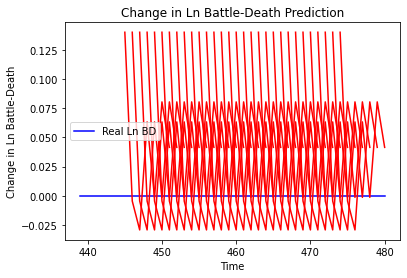

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Senegal', 'country_id': 52, 'step': 't+1', 'mse': 0.019615995951455467, 'mae': 0.14005711674690247, 'r2': 0.0, 'tadda_score': 0.14005711674690247}
{'country': 'Senegal', 'country_id': 52, 'step': 't+2', 'mse': 0.018369950781951028, 'mae': 0.13553579151630402, 'r2': 0.0, 'tadda_score': 0.13553579151630402}
{'country': 'Senegal', 'country_id': 52, 'step': 't+3', 'mse': 0.011300051966940894, 'mae': 0.1063017025589943, 'r2': 0.0, 'tadda_score': 0.1063017025589943}
{'country': 'Senegal', 'country_id': 52, 'step': 't+4', 'mse': 0.02875322652196033, 'mae': 0.1695677638053894, 'r2': 0.0, 'tadda_score': 0.1695677638053894}
{'country': 'Senegal', 'country_id': 52, 'step': 't+5', 'mse': 0.029837248320191634, 'mae': 0.17273461818695068, 'r2': 0.0, 'tadda_score': 0.17273461818695068}
{'country': 'Senegal', 'country_id': 52, 'step': 't+6', 'mse': 0.06408336139820481, 'mae': 0.2531469166278839, 'r2': 0.0, 'tadda_score': 0.2531

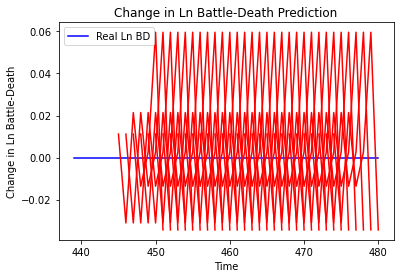

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+1', 'mse': 0.00012504751585457052, 'mae': 0.01118246465921402, 'r2': 0.0, 'tadda_score': 0.01118246465921402}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+2', 'mse': 0.00039674402583506074, 'mae': 0.01991843432188034, 'r2': 0.0, 'tadda_score': 0.01991843432188034}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+3', 'mse': 2.225272588283339e-06, 'mae': 0.0014917347580194473, 'r2': 0.0, 'tadda_score': 0.0014917347580194473}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+4', 'mse': 0.0001479047735544227, 'mae': 0.012161610648036003, 'r2': 0.0, 'tadda_score': 0.012161610648036003}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+5', 'mse': 0.0004637058384034422, 'mae': 0.02153383009135723, 'r2': 0.0, 'tadda_score': 0.02153383009135723}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+6', 'mse': 0.006583835682778594, 'mae': 0.0

Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [============================

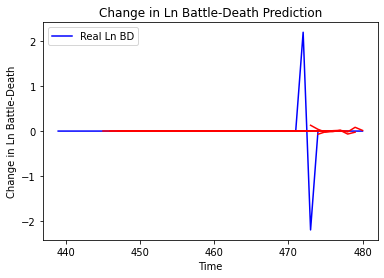

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'The Gambia', 'country_id': 54, 'step': 't+1', 'mse': 0.34154291791530067, 'mae': 0.15313796484263126, 'r2': -0.061176556562992035, 'tadda_score': 0.15745402459096297}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+2', 'mse': 0.3103549721815462, 'mae': 0.14920743017188096, 'r2': 0.035724638349872495, 'tadda_score': 0.14920743017188096}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+3', 'mse': 0.1619516156789713, 'mae': 0.08136075453853302, 'r2': -0.04107232113940662, 'tadda_score': 0.08136075453853302}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+4', 'mse': 0.16193077176960333, 'mae': 0.08104994437988293, 'r2': -0.04093833039768824, 'tadda_score': 0.08104994437988293}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+5', 'mse': 0.16172588875007934, 'mae': 0.0803645490794946, 'r2': -0.03962128246455299, 'tadda_score': 0.0803645490794946}
{'country': 'The Gambia', 'country_id': 54, 's

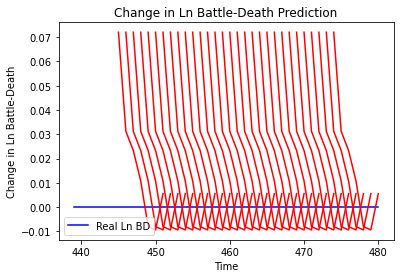

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Djibouti', 'country_id': 55, 'step': 't+1', 'mse': 0.005190625652767844, 'mae': 0.07204599678516388, 'r2': 0.0, 'tadda_score': 0.07204599678516388}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+2', 'mse': 0.010658004951764832, 'mae': 0.10323761403560638, 'r2': 0.0, 'tadda_score': 0.10323761403560638}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+3', 'mse': 0.016005347968894634, 'mae': 0.12651224434375763, 'r2': 0.0, 'tadda_score': 0.12651224434375763}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+4', 'mse': 0.018832566102333637, 'mae': 0.13723179697990417, 'r2': 0.0, 'tadda_score': 0.13723179697990417}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+5', 'mse': 0.009594158045090673, 'mae': 0.09794977307319641, 'r2': 0.0, 'tadda_score': 0.09794977307319641}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+6', 'mse': 0.007834374749737805, 'mae': 0.08851200342178345, 'r2': 0.0, 'tadda_s

Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9764 - val_loss: 0.0285
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9737 - val_loss: 0.0286
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9788 - val_loss: 0.0286
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9828 - val_loss: 0.0287
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9768 - val_loss: 0.0287
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9713 - val_loss: 0.0287
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9758 - val_loss: 0.0287
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9858 - val_loss: 0.0287
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9558 - val_loss: 0.0288
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9812 - val_loss: 0.0288
Epoch 72/100
4/4 [=

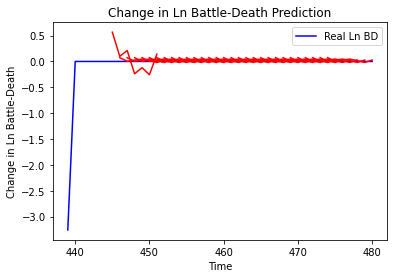

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Eritrea', 'country_id': 56, 'step': 't+1', 'mse': 0.01574794156158918, 'mae': 0.08917378410696983, 'r2': 0.0, 'tadda_score': 0.08917378410696983}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+2', 'mse': 0.020143582693000657, 'mae': 0.0947632630666097, 'r2': 0.0, 'tadda_score': 0.0947632630666097}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+3', 'mse': 0.0355376332365006, 'mae': 0.12751567338903744, 'r2': 0.0, 'tadda_score': 0.12751567338903744}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+4', 'mse': 0.0345532995987693, 'mae': 0.16392988661924998, 'r2': 0.0, 'tadda_score': 0.16392988661924998}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+5', 'mse': 0.03097655522518487, 'mae': 0.1699668193856875, 'r2': 0.0, 'tadda_score': 0.1699668193856875}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+6', 'mse': 0.020297949748501676, 'mae': 0.1424387921889623, 'r2': 0.0, 'tadda_score': 0.14243879

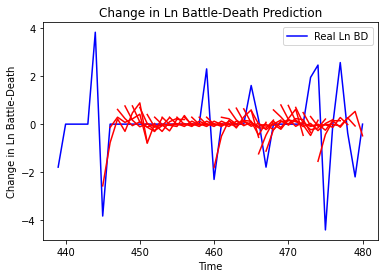

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+1', 'mse': 1.1512223689948835, 'mae': 0.7821982931212589, 'r2': 0.15614449625854998, 'tadda_score': 0.8750254860635603}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+2', 'mse': 3.8731152862556617, 'mae': 1.3630170810899842, 'r2': -0.9411819831014829, 'tadda_score': 1.5372806686840164}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+3', 'mse': 4.0992459053580355, 'mae': 1.3937374411703856, 'r2': -1.0545172832891203, 'tadda_score': 1.6166507063986566}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+4', 'mse': 4.335451132613533, 'mae': 1.4493484396419634, 'r2': -1.172901916220106, 'tadda_score': 1.68538522905923}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+5', 'mse': 3.098843532080454, 'mae': 1.1794932870747354, 'r2': -0.5531216574605384, 'tadda_score': 1.3045528867524574}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+6', 'mse': 2.417861808996

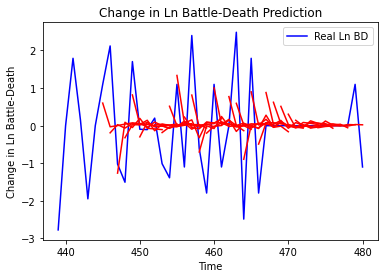

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Algeria', 'country_id': 67, 'step': 't+1', 'mse': 1.0428333569984134, 'mae': 0.7818647258182403, 'r2': 0.34613242911362685, 'tadda_score': 0.8164706674913602}
{'country': 'Algeria', 'country_id': 67, 'step': 't+2', 'mse': 2.346578981875152, 'mae': 1.159088420457778, 'r2': -0.3932898367451352, 'tadda_score': 1.4207551004609842}
{'country': 'Algeria', 'country_id': 67, 'step': 't+3', 'mse': 2.6266476274377744, 'mae': 1.250453030282856, 'r2': -0.4642375049091372, 'tadda_score': 1.5262930658604712}
{'country': 'Algeria', 'country_id': 67, 'step': 't+4', 'mse': 2.702420144565395, 'mae': 1.2497612640703746, 'r2': -0.32374971430732313, 'tadda_score': 1.477573539360864}
{'country': 'Algeria', 'country_id': 67, 'step': 't+5', 'mse': 2.106493724978081, 'mae': 1.0841782620755172, 'r2': -0.5652696279327625, 'tadda_score': 1.3034445582536196}
{'country': 'Algeria', 'country_id': 67, 'step': 't+6', 'mse': 2.181658216804157, '

4/4 [==============================] - 0s 9ms/step - loss: 0.1906 - val_loss: 1.4664
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1881 - val_loss: 1.4667
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1853 - val_loss: 1.4668
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1880 - val_loss: 1.4669
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1886 - val_loss: 1.4671
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1872 - val_loss: 1.4674
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1866 - val_loss: 1.4676
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1899 - val_loss: 1.4680
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1875 - val_loss: 1.4683
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1846 - val_loss: 1.4685
Epoch 71/100
4/4 [===============

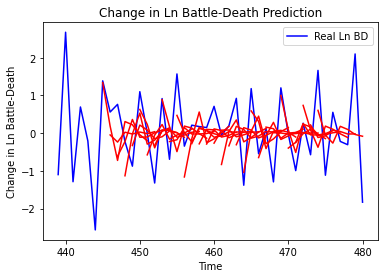

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cameroon', 'country_id': 69, 'step': 't+1', 'mse': 0.5298530632504862, 'mae': 0.6289071445482055, 'r2': 0.2805381873529724, 'tadda_score': 0.7171006921497065}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+2', 'mse': 1.7723955252323809, 'mae': 1.148786322264031, 'r2': -1.401211159354764, 'tadda_score': 1.5950632649045744}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+3', 'mse': 1.3459728832934543, 'mae': 0.9388292826557011, 'r2': -0.37343751137489956, 'tadda_score': 1.1115796009544383}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+4', 'mse': 1.4903906265686266, 'mae': 0.9548906598117461, 'r2': -0.6922995873150031, 'tadda_score': 1.1986461677776288}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+5', 'mse': 1.8375131727863805, 'mae': 1.1113228290112072, 'r2': -0.8473314236241869, 'tadda_score': 1.4310611465405674}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+6', 'mse': 2.017017563

Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7164 - val_loss: 2.3868
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7192 - val_loss: 2.3873
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.7247 - val_loss: 2.3881
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.7156 - val_loss: 2.3885
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7169 - val_loss: 2.3890
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7237 - val_loss: 2.3898
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.7251 - val_loss: 2.3907
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7146 - val_loss: 2.3909
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7129 - val_loss: 2.3912
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7250 - val_loss: 2.3911
Epoch 71/100
4/

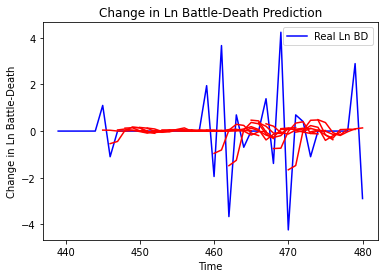

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+1', 'mse': 1.7652963850470473, 'mae': 0.8186295814542894, 'r2': 0.33252427038899446, 'tadda_score': 0.8210402907689587}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+2', 'mse': 2.3438338186315066, 'mae': 1.1149508706551565, 'r2': -0.6010086947031832, 'tadda_score': 1.1823105380507084}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+3', 'mse': 2.5031208029507277, 'mae': 1.0735475393490033, 'r2': -0.06796654332544527, 'tadda_score': 1.1336898110663927}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+4', 'mse': 3.061988479074807, 'mae': 1.1623964139153182, 'r2': -0.26651604228045733, 'tadda_score': 1.215756292971931}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+5', 'mse': 2.671936205152529, 'mae': 0.9604749931197791, 'r2': -0.05436992108841987, 'tadda_score': 0.98766112136

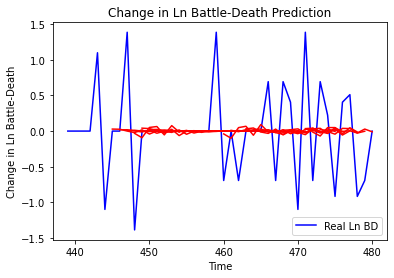

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tunisia', 'country_id': 73, 'step': 't+1', 'mse': 0.4034975311639206, 'mae': 0.405425679631751, 'r2': 0.02263135618447476, 'tadda_score': 0.4063666570024279}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+2', 'mse': 0.4429270231646672, 'mae': 0.44131793942561853, 'r2': -0.07638180151597052, 'tadda_score': 0.45899098432571794}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+3', 'mse': 0.49339279099171024, 'mae': 0.48108562492564577, 'r2': -0.03262534790640936, 'tadda_score': 0.4922388234559224}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+4', 'mse': 0.500759213045163, 'mae': 0.4634528177526903, 'r2': -0.03704916587834317, 'tadda_score': 0.4678135004252008}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+5', 'mse': 0.4514081081490545, 'mae': 0.4389259998294974, 'r2': -0.026070649637906396, 'tadda_score': 0.44077678713135565}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+6', 'mse': 0.54699

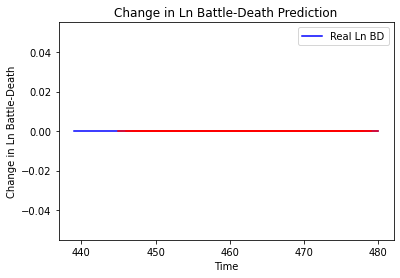

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Benin', 'country_id': 74, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Equatorial Guinea']
Building vanilla Model...
Model: "sequential_243"
_________________________________________________________________
Layer (type)                 Output S

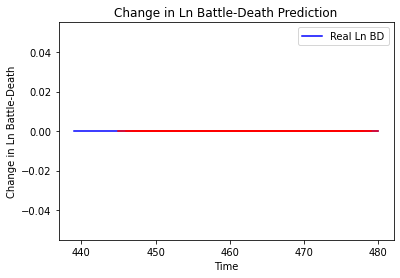

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Niger']
Building vanilla Model...
Model: "sequential_244"
_______________________________

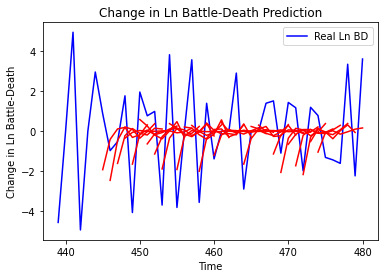

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Niger', 'country_id': 78, 'step': 't+1', 'mse': 3.385184063927448, 'mae': 1.5619748175073795, 'r2': 0.21853938169784304, 'tadda_score': 1.8676037933607035}
{'country': 'Niger', 'country_id': 78, 'step': 't+2', 'mse': 7.171473106565054, 'mae': 2.2457837676024996, 'r2': -0.8262860449878595, 'tadda_score': 2.744776179953571}
{'country': 'Niger', 'country_id': 78, 'step': 't+3', 'mse': 6.647878281177556, 'mae': 2.000491190659934, 'r2': -0.7164520768851728, 'tadda_score': 2.562491806244287}
{'country': 'Niger', 'country_id': 78, 'step': 't+4', 'mse': 6.885267133314871, 'mae': 2.183460846050052, 'r2': -0.5175052853689153, 'tadda_score': 2.668958855361708}
{'country': 'Niger', 'country_id': 78, 'step': 't+5', 'mse': 7.949669891962654, 'mae': 2.266705181332813, 'r2': -0.4451769191269097, 'tadda_score': 2.7508935651815305}
{'country': 'Niger', 'country_id': 78, 'step': 't+6', 'mse': 7.614497720138306, 'mae': 2.1442822458

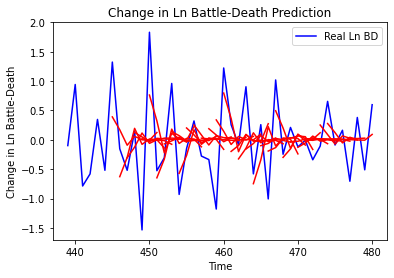

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Nigeria', 'country_id': 79, 'step': 't+1', 'mse': 0.38385082460204833, 'mae': 0.46802544213717223, 'r2': 0.32835238008009016, 'tadda_score': 0.5195916412883504}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+2', 'mse': 1.0571808135624203, 'mae': 0.8094565072379858, 'r2': -0.953869955000981, 'tadda_score': 1.0445246259343972}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+3', 'mse': 0.8849976222504202, 'mae': 0.7619668351223396, 'r2': -0.4444463047233247, 'tadda_score': 0.9434702401252167}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+4', 'mse': 1.1369449244620167, 'mae': 0.8289583178757033, 'r2': -0.5284067848676599, 'tadda_score': 1.0809067657116456}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+5', 'mse': 0.7838479850923663, 'mae': 0.6799968537189041, 'r2': -0.5310634816302227, 'tadda_score': 0.8495956518001828}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+6', 'mse': 0.744185323352

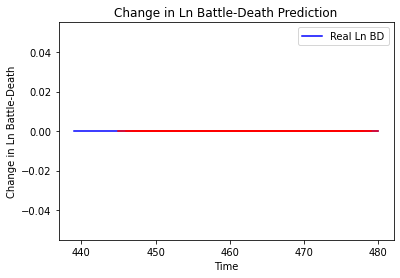

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Togo']
Building vanilla Model...
Model: "sequential_247"
____

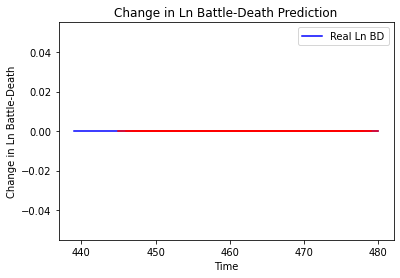

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Togo', 'country_id': 81, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Somalia']
Building vanilla Model...
Model: "sequential_248"
_________________________________________________________________
Layer (type)                 Output Shape             

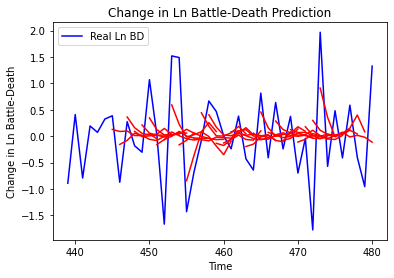

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Somalia', 'country_id': 120, 'step': 't+1', 'mse': 0.5510221323027032, 'mae': 0.5773425537413599, 'r2': 0.27667037162319363, 'tadda_score': 0.6446482974356654}
{'country': 'Somalia', 'country_id': 120, 'step': 't+2', 'mse': 1.3031518453061772, 'mae': 0.8670505176651804, 'r2': -0.32888999482066894, 'tadda_score': 1.0458756445018775}
{'country': 'Somalia', 'country_id': 120, 'step': 't+3', 'mse': 1.281720823079697, 'mae': 0.8237039215126287, 'r2': -0.6059782435825367, 'tadda_score': 1.0360703609147321}
{'country': 'Somalia', 'country_id': 120, 'step': 't+4', 'mse': 1.052421172050823, 'mae': 0.8205750996449661, 'r2': -0.5182539303586502, 'tadda_score': 0.9875326661595774}
{'country': 'Somalia', 'country_id': 120, 'step': 't+5', 'mse': 0.9276627245512791, 'mae': 0.7302733011779927, 'r2': -0.20335745222655865, 'tadda_score': 0.8881822479504093}
{'country': 'Somalia', 'country_id': 120, 'step': 't+6', 'mse': 1.0531043

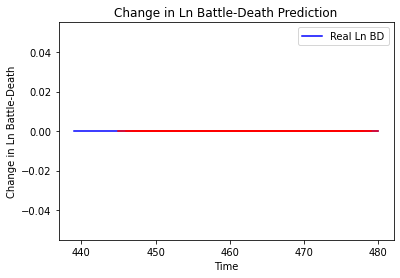

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Botswana', 'country_id': 154, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Burundi']
Building vanilla Model...
Model: "sequential_250"
_________________________________________________________________
Layer (type)       

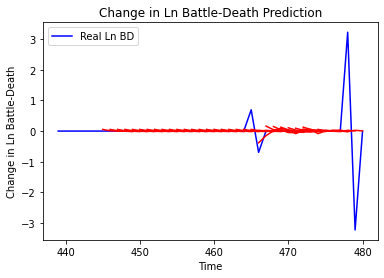

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burundi', 'country_id': 155, 'step': 't+1', 'mse': 0.02236934704800139, 'mae': 0.09692190165040972, 'r2': 0.30161702393410816, 'tadda_score': 0.09692190165040972}
{'country': 'Burundi', 'country_id': 155, 'step': 't+2', 'mse': 0.057021523884547426, 'mae': 0.14315546539642496, 'r2': -0.7802424659445113, 'tadda_score': 0.1500678458533494}
{'country': 'Burundi', 'country_id': 155, 'step': 't+3', 'mse': 0.056696897910585645, 'mae': 0.14065722189563595, 'r2': -0.7701074694550194, 'tadda_score': 0.14758040271419368}
{'country': 'Burundi', 'country_id': 155, 'step': 't+4', 'mse': 0.049070679339221275, 'mae': 0.13090586612341884, 'r2': -0.5320128478029189, 'tadda_score': 0.13575462102609953}
{'country': 'Burundi', 'country_id': 155, 'step': 't+5', 'mse': 0.037656343530525924, 'mae': 0.0923922799499639, 'r2': -0.17565118043791794, 'tadda_score': 0.09462762052534106}
{'country': 'Burundi', 'country_id': 155, 'step': 't+6'

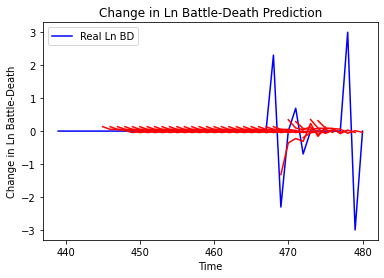

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Rwanda', 'country_id': 156, 'step': 't+1', 'mse': 0.22766664932849243, 'mae': 0.2714050901197847, 'r2': 0.4094098288983189, 'tadda_score': 0.2714050901197847}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+2', 'mse': 0.5744777615449664, 'mae': 0.4313201712830322, 'r2': -0.4902530541283441, 'tadda_score': 0.46065517736111644}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+3', 'mse': 0.5087306937640812, 'mae': 0.4629664270621188, 'r2': -0.8228322303569962, 'tadda_score': 0.49295536265190915}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+4', 'mse': 0.5194355852814122, 'mae': 0.46914774555986644, 'r2': -0.40790909997058367, 'tadda_score': 0.46914774555986644}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+5', 'mse': 0.5259370051552389, 'mae': 0.3839826030435713, 'r2': -0.4255309350208931, 'tadda_score': 0.3983647885821811}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+6', 'mse': 0.53963987

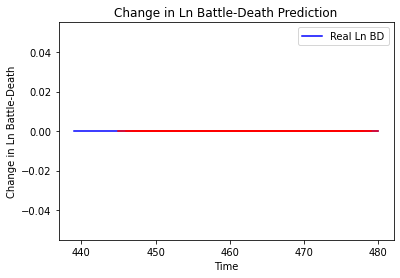

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zambia', 'country_id': 157, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Zimbabwe']
Building vanilla Model...
Model: "sequential_253"
_________________________________________________________________
Layer (type)                 Out

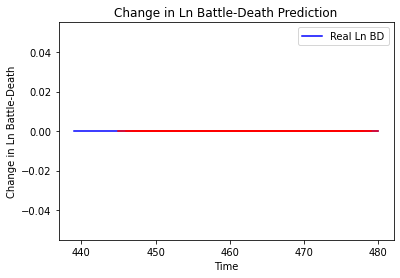

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Comoros']
Building vanilla Model...
Model: "sequential_254"
_________________________________________________________________
Layer (type)       

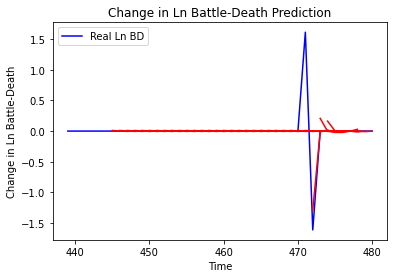

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Comoros', 'country_id': 159, 'step': 't+1', 'mse': 0.09119058815462333, 'mae': 0.08522719642841214, 'r2': 0.4719283886091624, 'tadda_score': 0.08522719642841214}
{'country': 'Comoros', 'country_id': 159, 'step': 't+2', 'mse': 0.25142407455714444, 'mae': 0.17187592990769343, 'r2': -0.45596073981577834, 'tadda_score': 0.17863750862651465}
{'country': 'Comoros', 'country_id': 159, 'step': 't+3', 'mse': 0.2446656842616718, 'mae': 0.16607142480163173, 'r2': -0.41682387135204, 'tadda_score': 0.1711409806405345}
{'country': 'Comoros', 'country_id': 159, 'step': 't+4', 'mse': 0.14403735300426757, 'mae': 0.11337723898737825, 'r2': -0.7257234010506133, 'tadda_score': 0.11337723898737825}
{'country': 'Comoros', 'country_id': 159, 'step': 't+5', 'mse': 0.14515972180197084, 'mae': 0.1141106964465151, 'r2': -0.7391705941460613, 'tadda_score': 0.1141106964465151}
{'country': 'Comoros', 'country_id': 159, 'step': 't+6', 'mse': 

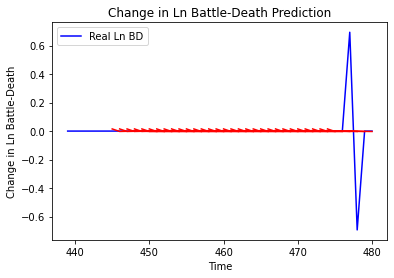

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Lesotho', 'country_id': 160, 'step': 't+1', 'mse': 0.0002280758323253175, 'mae': 0.01510217972099781, 'r2': 0.0, 'tadda_score': 0.01510217972099781}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+2', 'mse': 0.0001554937102176213, 'mae': 0.01246971171349287, 'r2': 0.0, 'tadda_score': 0.01246971171349287}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+3', 'mse': 0.00011918120433522614, 'mae': 0.010917014442384243, 'r2': 0.0, 'tadda_score': 0.010917014442384243}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+4', 'mse': 0.00015975112673793923, 'mae': 0.012639269232749939, 'r2': 0.0, 'tadda_score': 0.012639269232749939}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+5', 'mse': 0.00023563139211818518, 'mae': 0.015350289642810822, 'r2': 0.0, 'tadda_score': 0.015350289642810822}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+6', 'mse': 0.00017359045278355582, 'mae': 0.01317537296563387, 'r2

Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [============================

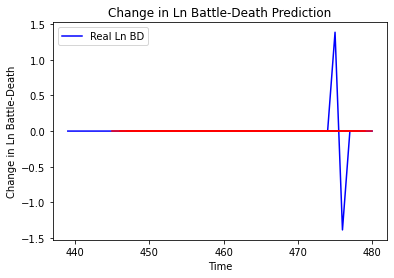

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Malawi', 'country_id': 161, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mozambique']
Building vanilla Model...
Model: "sequential_257"
_________________________________________________________________
Layer (type)                 O

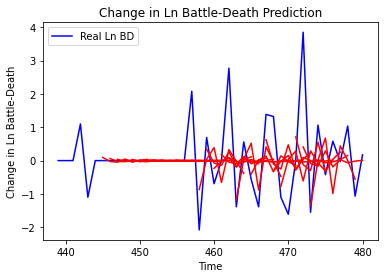

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mozambique', 'country_id': 162, 'step': 't+1', 'mse': 1.1726283584362018, 'mae': 0.6445060950401273, 'r2': 0.2547895901842858, 'tadda_score': 0.6561711243051139}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+2', 'mse': 2.5112744788287267, 'mae': 1.0399426916586307, 'r2': -0.31252155212381494, 'tadda_score': 1.1918125717562382}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+3', 'mse': 2.2832844255089615, 'mae': 1.0728001659459352, 'r2': -0.19304592164789702, 'tadda_score': 1.1628017420914252}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+4', 'mse': 2.2114907189680273, 'mae': 1.0436801399888058, 'r2': -0.46745103176653613, 'tadda_score': 1.259854668301986}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+5', 'mse': 1.1958869421183453, 'mae': 0.7447167221449238, 'r2': -0.46018665022036886, 'tadda_score': 0.8338025262571793}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+

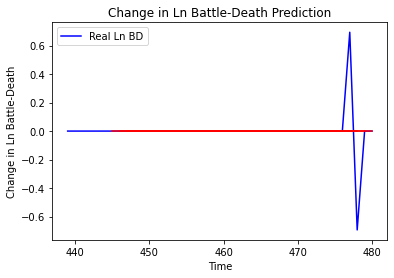

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Africa', 'country_id': 163, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Swaziland']
Building vanilla Model...
Model: "sequential_259"
_______________________________________________________

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 9ms/

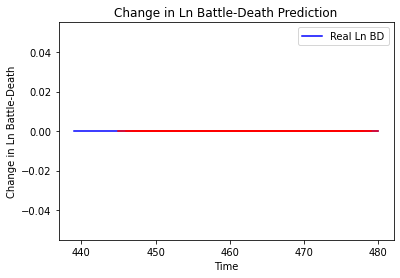

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Swaziland', 'country_id': 164, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Angola']
Building vanilla Model...
Model: "sequential_260"
_________________________________________________________________
Layer (type) 

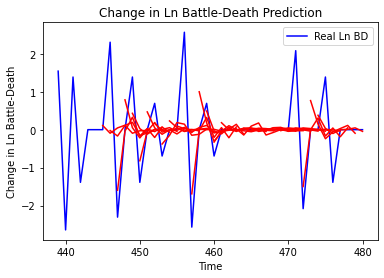

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Angola', 'country_id': 165, 'step': 't+1', 'mse': 0.7408254722000435, 'mae': 0.5408287662329319, 'r2': 0.417823717450699, 'tadda_score': 0.5424354204845471}
{'country': 'Angola', 'country_id': 165, 'step': 't+2', 'mse': 2.1909228163701338, 'mae': 0.9993052113117815, 'r2': -0.7217325111661224, 'tadda_score': 1.1365646452269993}
{'country': 'Angola', 'country_id': 165, 'step': 't+3', 'mse': 1.25948391470982, 'mae': 0.7910209502453415, 'r2': -0.4359306572697643, 'tadda_score': 0.8355275965655653}
{'country': 'Angola', 'country_id': 165, 'step': 't+4', 'mse': 1.1351078844421782, 'mae': 0.7835532996782988, 'r2': -0.05751248134453313, 'tadda_score': 0.7946170686413178}
{'country': 'Angola', 'country_id': 165, 'step': 't+5', 'mse': 1.1927653242023843, 'mae': 0.7379410110449506, 'r2': -0.2182297607864161, 'tadda_score': 0.76211418037968}
{'country': 'Angola', 'country_id': 165, 'step': 't+6', 'mse': 1.54588480371758, 'm

4/4 [==============================] - 0s 9ms/step - loss: 1.9011 - val_loss: 0.2223
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 1.8979 - val_loss: 0.2223
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 1.8936 - val_loss: 0.2223
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 1.8885 - val_loss: 0.2223
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 1.8769 - val_loss: 0.2224
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 1.8769 - val_loss: 0.2225
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 1.8980 - val_loss: 0.2225
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 1.8683 - val_loss: 0.2224
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 1.8877 - val_loss: 0.2222
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 1.8667 - val_loss: 0.2221
Epoch 71/100
4/4 [===============

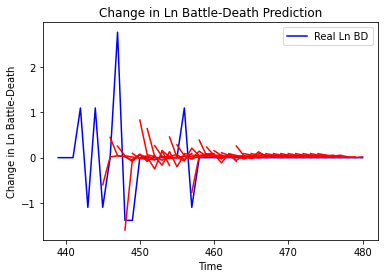

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo', 'country_id': 166, 'step': 't+1', 'mse': 0.40123385732468153, 'mae': 0.3782410991666685, 'r2': 0.2034526281761465, 'tadda_score': 0.38136812944988113}
{'country': 'Congo', 'country_id': 166, 'step': 't+2', 'mse': 1.2191043349919624, 'mae': 0.6876683023934764, 'r2': -0.6041735980074445, 'tadda_score': 0.805183543996533}
{'country': 'Congo', 'country_id': 166, 'step': 't+3', 'mse': 1.1052072419018566, 'mae': 0.6187720995665011, 'r2': -0.8634427182355182, 'tadda_score': 0.7322392187039474}
{'country': 'Congo', 'country_id': 166, 'step': 't+4', 'mse': 1.0632663789256098, 'mae': 0.682786612736227, 'r2': -0.530687985727095, 'tadda_score': 0.7893599649539013}
{'country': 'Congo', 'country_id': 166, 'step': 't+5', 'mse': 1.0484689662975792, 'mae': 0.6889301907539784, 'r2': -0.7677787354895387, 'tadda_score': 0.7723679124335864}
{'country': 'Congo', 'country_id': 166, 'step': 't+6', 'mse': 1.041544328630949, 'mae

4/4 [==============================] - 0s 9ms/step - loss: 2.9469 - val_loss: 3.2623
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9440 - val_loss: 3.2633
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 2.9360 - val_loss: 3.2637
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 2.9473 - val_loss: 3.2647
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9333 - val_loss: 3.2664
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9376 - val_loss: 3.2680
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9441 - val_loss: 3.2686
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9495 - val_loss: 3.2704
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9205 - val_loss: 3.2709
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9252 - val_loss: 3.2723
Epoch 71/100
4/4 [===============

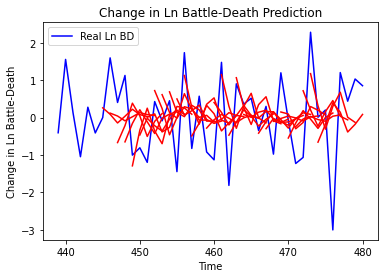

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+1', 'mse': 0.8903217427111971, 'mae': 0.78297016267027, 'r2': 0.18653501779260495, 'tadda_score': 0.9334470955684337}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+2', 'mse': 2.527946591736017, 'mae': 1.2997652793996943, 'r2': -0.7878940534897423, 'tadda_score': 1.6618890206092014}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+3', 'mse': 2.46864390100577, 'mae': 1.2897595709392309, 'r2': -0.4311510968538794, 'tadda_score': 1.627833290977168}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+4', 'mse': 3.208367390008521, 'mae': 1.4881704699390208, 'r2': -0.8415835587252001, 'tadda_score': 1.9439129587405002}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+5', 'mse': 4.110346957720359, 'mae': 1.6104875889631045, 'r2': -1.2390827677135579, 'tadda_score': 2.162181821188523}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+6', 'mse': 

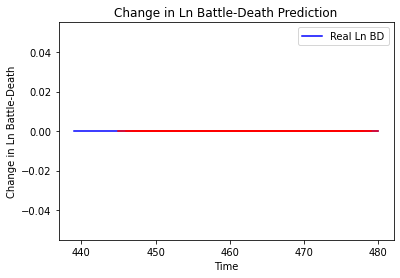

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Gabon', 'country_id': 169, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Namibia']
Building vanilla Model...
Model: "sequential_264"
_________________________________________________________________
Layer (type)                 Output Shap

Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1396 - val_loss: 4.8683e-05
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1385 - val_loss: 5.5330e-05
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1411 - val_loss: 4.7735e-05
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1389 - val_loss: 3.3146e-05
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1395 - val_loss: 2.0451e-05
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1400 - val_loss: 2.0912e-05
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1395 - val_loss: 1.8974e-05
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1396 - val_loss: 1.9928e-05
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1387 - val_loss: 1.8986e-05
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1380 - 

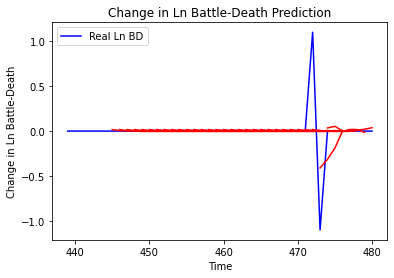

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Namibia', 'country_id': 170, 'step': 't+1', 'mse': 0.05511794034170823, 'mae': 0.0754606413781215, 'r2': 0.3149924876947584, 'tadda_score': 0.0754606413781215}
{'country': 'Namibia', 'country_id': 170, 'step': 't+2', 'mse': 0.10345608177614452, 'mae': 0.11985408171411051, 'r2': -0.28575546856379574, 'tadda_score': 0.12279683703577214}
{'country': 'Namibia', 'country_id': 170, 'step': 't+3', 'mse': 0.06700892552858091, 'mae': 0.09057418762095618, 'r2': -0.7230118352232173, 'tadda_score': 0.09057418762095618}
{'country': 'Namibia', 'country_id': 170, 'step': 't+4', 'mse': 0.06720128859288901, 'mae': 0.09128035377410895, 'r2': -0.7279580992298127, 'tadda_score': 0.09128035377410895}
{'country': 'Namibia', 'country_id': 170, 'step': 't+5', 'mse': 0.05080708678815346, 'mae': 0.06972519304303176, 'r2': -0.30641121550088335, 'tadda_score': 0.06972519304303176}
{'country': 'Namibia', 'country_id': 170, 'step': 't+6', 'm

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms

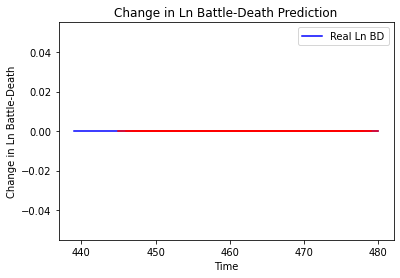

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Madagascar', 'country_id': 172, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mauritius']
Building vanilla Model...
Model: "sequential_266"
_________________________________________________________________
Lay

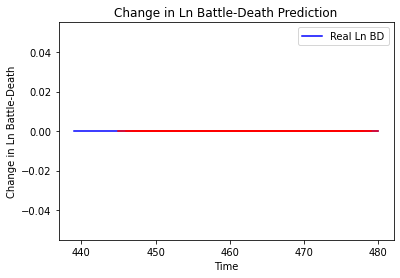

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritius', 'country_id': 173, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Seychelles']
Building vanilla Model...
Model: "sequential_267"
_________________________________________________________________
Layer (ty

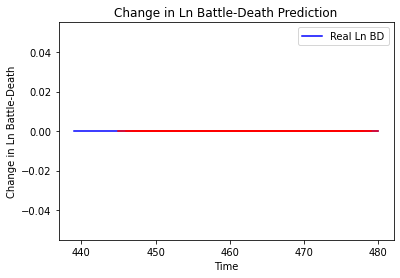

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Seychelles', 'country_id': 174, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Libya']
Building vanilla Model...
Model: "sequential_268"
_________________________________________________________________
Layer (

4/4 [==============================] - 0s 9ms/step - loss: 0.0314 - val_loss: 2.2938
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0314 - val_loss: 2.2938
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.2938
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.2938
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0314 - val_loss: 2.2939
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.2940
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0314 - val_loss: 2.2941
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0314 - val_loss: 2.2941
Epoch 73/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0314 - val_loss: 2.2941
Epoch 74/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0314 - val_loss: 2.2942
Epoch 75/100
4/4 [===============

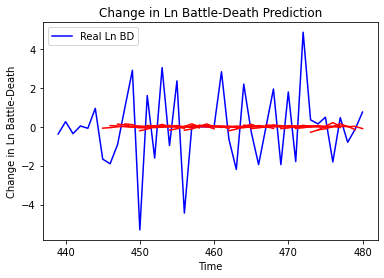

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Libya', 'country_id': 213, 'step': 't+1', 'mse': 4.5967286504237, 'mae': 1.6588414970707688, 'r2': 0.05136728171502469, 'tadda_score': 1.680339235928833}
{'country': 'Libya', 'country_id': 213, 'step': 't+2', 'mse': 5.669167276020618, 'mae': 1.8425696126142117, 'r2': -0.04650685784671782, 'tadda_score': 1.919044050725199}
{'country': 'Libya', 'country_id': 213, 'step': 't+3', 'mse': 7.6874165445940355, 'mae': 2.1640941494907624, 'r2': -0.03568538828815426, 'tadda_score': 2.2503775392180367}
{'country': 'Libya', 'country_id': 213, 'step': 't+4', 'mse': 6.057154378205238, 'mae': 2.01334414866765, 'r2': -0.046712628114537136, 'tadda_score': 2.072461656229691}
{'country': 'Libya', 'country_id': 213, 'step': 't+5', 'mse': 7.364873780944039, 'mae': 2.284915919814031, 'r2': -0.012189657452807978, 'tadda_score': 2.3104988384629492}
{'country': 'Libya', 'country_id': 213, 'step': 't+6', 'mse': 6.2836058306316325, 'mae': 

Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 5.0000 - val_loss: 0.8299
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 4.9664 - val_loss: 0.8299
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 4.9651 - val_loss: 0.8301
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 4.9962 - val_loss: 0.8301
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 4.9590 - val_loss: 0.8304
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 4.9690 - val_loss: 0.8311
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 5.0011 - val_loss: 0.8318
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 4.9748 - val_loss: 0.8320
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 4.9527 - val_loss: 0.8322
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 4.9252 - val_loss: 0.8326
Epoch 71/100
4/4 

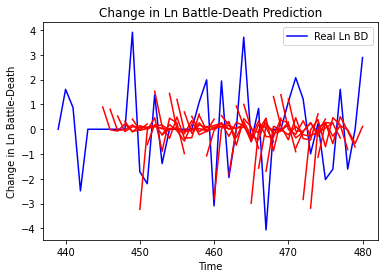

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Chad', 'country_id': 214, 'step': 't+1', 'mse': 3.2294811510618473, 'mae': 1.4640355691849885, 'r2': -0.10017111241503751, 'tadda_score': 1.7091517155905263}
{'country': 'Chad', 'country_id': 214, 'step': 't+2', 'mse': 8.602182388573379, 'mae': 2.281428079373116, 'r2': -1.0265459001561466, 'tadda_score': 3.01332220888781}
{'country': 'Chad', 'country_id': 214, 'step': 't+3', 'mse': 9.900397712713946, 'mae': 2.445315766684218, 'r2': -0.8956537042097896, 'tadda_score': 3.0910438421885207}
{'country': 'Chad', 'country_id': 214, 'step': 't+4', 'mse': 13.572763554609029, 'mae': 3.0763553242211104, 'r2': -1.2257978120907378, 'tadda_score': 3.9814245661422176}
{'country': 'Chad', 'country_id': 214, 'step': 't+5', 'mse': 11.571930219126928, 'mae': 2.7280499971976746, 'r2': -1.4357546219825101, 'tadda_score': 3.5316649871141577}
{'country': 'Chad', 'country_id': 214, 'step': 't+6', 'mse': 9.197086384266198, 'mae': 2.4085

Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.5719 - val_loss: 2.1438
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5770 - val_loss: 2.1421
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5674 - val_loss: 2.1407
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5734 - val_loss: 2.1394
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5684 - val_loss: 2.1383
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5718 - val_loss: 2.1373
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5739 - val_loss: 2.1373
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5739 - val_loss: 2.1368
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5695 - val_loss: 2.1369
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5704 - val_loss: 2.1363
Epoch 71/100
4/4

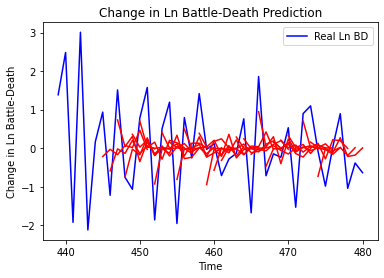

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Egypt', 'country_id': 222, 'step': 't+1', 'mse': 0.6793149760220438, 'mae': 0.6833417144226153, 'r2': 0.39725996848159106, 'tadda_score': 0.7434943772164105}
{'country': 'Egypt', 'country_id': 222, 'step': 't+2', 'mse': 1.5781792180090346, 'mae': 1.0769994695631369, 'r2': -0.45931030933624006, 'tadda_score': 1.3168482663380805}
{'country': 'Egypt', 'country_id': 222, 'step': 't+3', 'mse': 1.3615116414610162, 'mae': 0.937580824612157, 'r2': -0.46805750193258566, 'tadda_score': 1.1723997139370208}
{'country': 'Egypt', 'country_id': 222, 'step': 't+4', 'mse': 1.34276855321646, 'mae': 0.9633438853482592, 'r2': -0.09010743432827928, 'tadda_score': 1.1386837709009836}
{'country': 'Egypt', 'country_id': 222, 'step': 't+5', 'mse': 1.6657863316515067, 'mae': 1.1123846438108884, 'r2': -0.4041174039497688, 'tadda_score': 1.4066645814432706}
{'country': 'Egypt', 'country_id': 222, 'step': 't+6', 'mse': 1.4621753280624559, '

Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7033 - val_loss: 0.0010
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6985 - val_loss: 0.0011
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6734 - val_loss: 0.0012
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7050 - val_loss: 0.0013
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6918 - val_loss: 0.0013
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7080 - val_loss: 0.0014
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 2.6708 - val_loss: 0.0012
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6784 - val_loss: 0.0011
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6929 - val_loss: 9.6270e-04
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6667 - val_loss: 0.0010
Epoch 69/100
4/

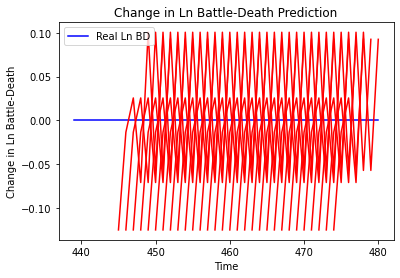

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Uganda', 'country_id': 235, 'step': 't+1', 'mse': 0.015652590493102858, 'mae': 0.12511031329631805, 'r2': 0.0, 'tadda_score': 0.12511031329631805}
{'country': 'Uganda', 'country_id': 235, 'step': 't+2', 'mse': 0.01921512132550962, 'mae': 0.1386186182498932, 'r2': 0.0, 'tadda_score': 0.1386186182498932}
{'country': 'Uganda', 'country_id': 235, 'step': 't+3', 'mse': 0.012777440311818877, 'mae': 0.1130373403429985, 'r2': 0.0, 'tadda_score': 0.1130373403429985}
{'country': 'Uganda', 'country_id': 235, 'step': 't+4', 'mse': 0.033859888135001626, 'mae': 0.1840105652809143, 'r2': 0.0, 'tadda_score': 0.1840105652809143}
{'country': 'Uganda', 'country_id': 235, 'step': 't+5', 'mse': 0.004883702952974467, 'mae': 0.06988349556922913, 'r2': 0.0, 'tadda_score': 0.06988349556922913}
{'country': 'Uganda', 'country_id': 235, 'step': 't+6', 'mse': 0.01613707143505483, 'mae': 0.12703177332878113, 'r2': 0.0, 'tadda_score': 0.12703

Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1151 - val_loss: 1.6529
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1148 - val_loss: 1.6521
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1161 - val_loss: 1.6514
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1141 - val_loss: 1.6504
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1137 - val_loss: 1.6495
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1157 - val_loss: 1.6485
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1171 - val_loss: 1.6475
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1148 - val_loss: 1.6469
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1150 - val_loss: 1.6466
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1147 - val_loss: 1.6465
Epoch 72/100
4/4 [==

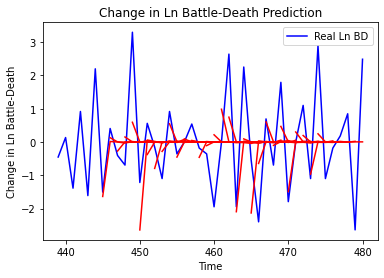

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Kenya', 'country_id': 237, 'step': 't+1', 'mse': 1.408890903845043, 'mae': 0.8818638220021261, 'r2': 0.3200754684976018, 'tadda_score': 0.9066170846014354}
{'country': 'Kenya', 'country_id': 237, 'step': 't+2', 'mse': 3.399628992996291, 'mae': 1.4848280654298738, 'r2': -0.7809356306875557, 'tadda_score': 1.92185108770405}
{'country': 'Kenya', 'country_id': 237, 'step': 't+3', 'mse': 3.157763700523916, 'mae': 1.362798035805116, 'r2': -0.4461394068379392, 'tadda_score': 1.6347800162083803}
{'country': 'Kenya', 'country_id': 237, 'step': 't+4', 'mse': 3.9450450154537595, 'mae': 1.627667327674355, 'r2': -0.40477577564250966, 'tadda_score': 1.9080636413913228}
{'country': 'Kenya', 'country_id': 237, 'step': 't+5', 'mse': 2.715667157684329, 'mae': 1.208018613063367, 'r2': -0.7929603512526087, 'tadda_score': 1.518314301921002}
{'country': 'Kenya', 'country_id': 237, 'step': 't+6', 'mse': 2.6547091840449153, 'mae': 1.29

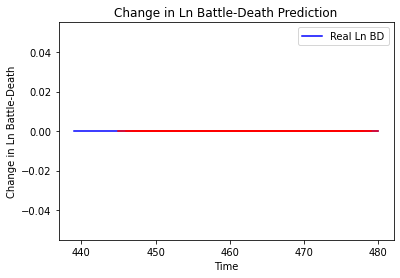

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tanzania', 'country_id': 242, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Morocco']
Building vanilla Model...
Model: "sequential_274"
_________________________________________________________________
Layer (type)       

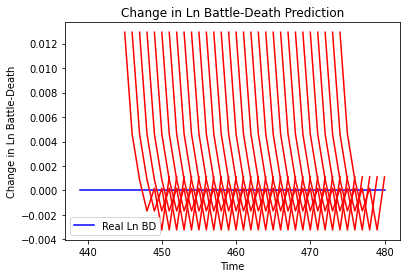

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Morocco', 'country_id': 243, 'step': 't+1', 'mse': 0.00016704447679477888, 'mae': 0.012924568727612495, 'r2': 0.0, 'tadda_score': 0.012924568727612495}
{'country': 'Morocco', 'country_id': 243, 'step': 't+2', 'mse': 0.0003074111379037549, 'mae': 0.01753314398229122, 'r2': 0.0, 'tadda_score': 0.01753314398229122}
{'country': 'Morocco', 'country_id': 243, 'step': 't+3', 'mse': 0.0003391583372567425, 'mae': 0.018416251987218857, 'r2': 0.0, 'tadda_score': 0.018416251987218857}
{'country': 'Morocco', 'country_id': 243, 'step': 't+4', 'mse': 0.00028033255982386207, 'mae': 0.016743134707212448, 'r2': 0.0, 'tadda_score': 0.016743134707212448}
{'country': 'Morocco', 'country_id': 243, 'step': 't+5', 'mse': 0.00015162242101493875, 'mae': 0.01231350563466549, 'r2': 0.0, 'tadda_score': 0.01231350563466549}
{'country': 'Morocco', 'country_id': 243, 'step': 't+6', 'mse': 8.267896683477553e-05, 'mae': 0.00909279752522707, 'r2'

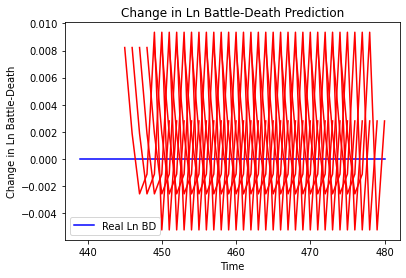

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritania', 'country_id': 244, 'step': 't+1', 'mse': 6.762105244086103e-05, 'mae': 0.00822320207953453, 'r2': 0.0, 'tadda_score': 0.00822320207953453}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+2', 'mse': 0.00010181935789266641, 'mae': 0.010090557858347893, 'r2': 0.0, 'tadda_score': 0.010090557858347893}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+3', 'mse': 5.631650657905805e-05, 'mae': 0.007504432462155819, 'r2': 0.0, 'tadda_score': 0.007504432462155819}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+4', 'mse': 4.0675339652651056e-05, 'mae': 0.0063777221366763115, 'r2': 0.0, 'tadda_score': 0.0063777221366763115}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+5', 'mse': 0.0001921834944368381, 'mae': 0.013863026164472103, 'r2': 0.0, 'tadda_score': 0.013863026164472103}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+6', 'mse': 7.419207419112617e-05, 'mae': 0.00

Epoch 61/100
1/1 [==============================] - 0s 21ms/step - loss: 3.2011 - val_loss: 0.8882
Epoch 62/100
1/1 [==============================] - 0s 23ms/step - loss: 3.2085 - val_loss: 0.8883
Epoch 63/100
1/1 [==============================] - 0s 21ms/step - loss: 3.1892 - val_loss: 0.8883
Epoch 64/100
1/1 [==============================] - 0s 21ms/step - loss: 3.1444 - val_loss: 0.8883
Epoch 65/100
1/1 [==============================] - 0s 22ms/step - loss: 3.2027 - val_loss: 0.8884
Epoch 66/100
1/1 [==============================] - 0s 22ms/step - loss: 3.1950 - val_loss: 0.8884
Epoch 67/100
1/1 [==============================] - 0s 21ms/step - loss: 3.1737 - val_loss: 0.8885
Epoch 68/100
1/1 [==============================] - 0s 22ms/step - loss: 3.1734 - val_loss: 0.8886
Epoch 69/100
1/1 [==============================] - 0s 22ms/step - loss: 3.1610 - val_loss: 0.8886
Epoch 70/100
1/1 [==============================] - 0s 25ms/step - loss: 3.1621 - val_loss: 0.8888
Epoch 71/1

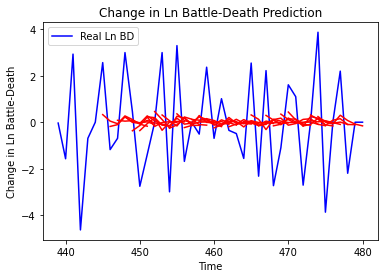

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sudan', 'country_id': 245, 'step': 't+1', 'mse': 3.42510235285059, 'mae': 1.5855326952567725, 'r2': 0.14401210393600206, 'tadda_score': 1.625684916647129}
{'country': 'Sudan', 'country_id': 245, 'step': 't+2', 'mse': 4.640787966583593, 'mae': 1.757119000489904, 'r2': -0.08766294874639025, 'tadda_score': 1.9212868451181984}
{'country': 'Sudan', 'country_id': 245, 'step': 't+3', 'mse': 4.002722162830941, 'mae': 1.6806550741089352, 'r2': -0.032147085996986124, 'tadda_score': 1.7715356409443388}
{'country': 'Sudan', 'country_id': 245, 'step': 't+4', 'mse': 3.628435941345962, 'mae': 1.5114144135190373, 'r2': -0.09287249902667605, 'tadda_score': 1.6387675627989893}
{'country': 'Sudan', 'country_id': 245, 'step': 't+5', 'mse': 5.266269657029531, 'mae': 1.9625741533903578, 'r2': -0.004476577547319893, 'tadda_score': 2.095900809140831}
{'country': 'Sudan', 'country_id': 245, 'step': 't+6', 'mse': 5.049710370328911, 'mae'

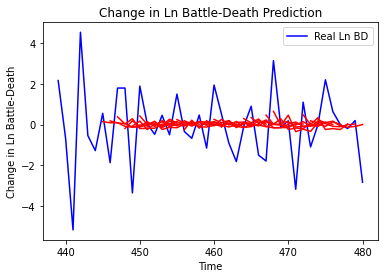

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Sudan', 'country_id': 246, 'step': 't+1', 'mse': 2.059073897548984, 'mae': 1.1299376189077193, 'r2': 0.07440789519427105, 'tadda_score': 1.1972016492847894}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+2', 'mse': 3.089190688048511, 'mae': 1.3956160675225642, 'r2': -0.1431334915525737, 'tadda_score': 1.5537549948432035}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+3', 'mse': 3.417621882569559, 'mae': 1.528099204114594, 'r2': -0.3071421052743455, 'tadda_score': 1.7480233321701666}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+4', 'mse': 3.708392364473345, 'mae': 1.576999486633991, 'r2': -0.17644324547336, 'tadda_score': 1.7254049189625726}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+5', 'mse': 2.9190215042850243, 'mae': 1.3005424361229097, 'r2': -0.15724773870122655, 'tadda_score': 1.401684316823895}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+6', 

In [35]:
np.random.seed(1)
tf.random.set_seed(1)
model = Sequential()
summary_model(dataset=df,
              modelname = "Vanilla",
              pred_africa=True,
              period=period_test, 
              epochs=100, 
              batch_size=64,
              look_back=6, 
              look_forward=7,
              num_neurons=12, 
              val_split=0.2)

['Cape Verde']
Building vanilla Model...
Model: "sequential_279"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_270 (LSTM)              (None, 16)                1152      
_________________________________________________________________
dropout_540 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_540 (Dense)            (None, 16)                272       
_________________________________________________________________
dropout_541 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_541 (Dense)            (None, 7)                 119       
Total params: 1,543
Trainable params: 1,543
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
4/4 [==============================] - 0s 80ms/step - loss: 0.0

4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 72/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 73/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 74/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 75/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 76/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 77/100
4/4 [==============================] - 0s

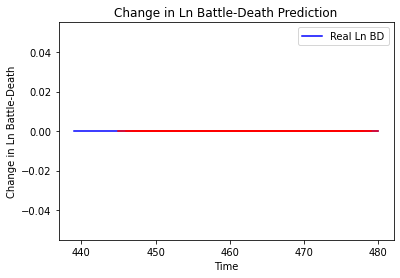

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
["Cote d'Ivoire"]
Building vanilla Model...
Model: "sequential_280"
_________________________________________________________________
Layer 

4/4 [==============================] - 0s 9ms/step - loss: 0.5386 - val_loss: 0.2851
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5412 - val_loss: 0.2855
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5423 - val_loss: 0.2859
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5374 - val_loss: 0.2863
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5415 - val_loss: 0.2865
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5345 - val_loss: 0.2870
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5411 - val_loss: 0.2874
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5373 - val_loss: 0.2876
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5319 - val_loss: 0.2881
Epoch 74/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5319 - val_loss: 0.2882
Epoch 75/100
4/4 [==============

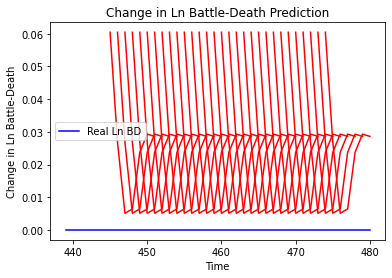

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+1', 'mse': 0.0036527923305449406, 'mae': 0.060438334941864014, 'r2': 0.0, 'tadda_score': 0.060438334941864014}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+2', 'mse': 0.007613648445826904, 'mae': 0.08725622296333313, 'r2': 0.0, 'tadda_score': 0.08725622296333313}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+3', 'mse': 0.008528776835706964, 'mae': 0.09235137701034546, 'r2': 0.0, 'tadda_score': 0.09235137701034546}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+4', 'mse': 0.009752810892926844, 'mae': 0.0987563207745552, 'r2': 0.0, 'tadda_score': 0.0987563207745552}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+5', 'mse': 0.009150289861549477, 'mae': 0.09565714746713638, 'r2': 0.0, 'tadda_score': 0.09565714746713638}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+6', 'mse': 0.015613628758354148, 'mae': 0.1249545

Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [============================

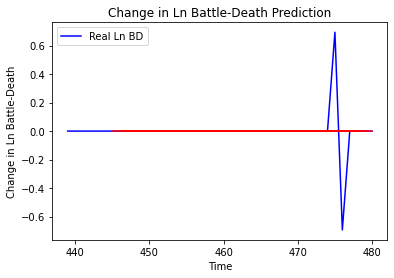

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ghana', 'country_id': 42, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Liberia']
Building vanilla Model...
Model: "sequential_282"
_________________________________________________________________
Layer (type)                 Output Shape      

Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1865 - val_loss: 4.9948e-04
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1861 - val_loss: 5.2393e-04
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1843 - val_loss: 3.8624e-04
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1835 - val_loss: 3.1188e-04
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 1.1882 - val_loss: 2.4547e-04
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 1.1778 - val_loss: 2.4921e-04
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1826 - val_loss: 2.6442e-04
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1888 - val_loss: 3.0125e-04
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1710 - val_loss: 3.5499e-04
Epoch 72/100
4/4 [==============================] - 0s 10ms/step - loss: 1.1845 

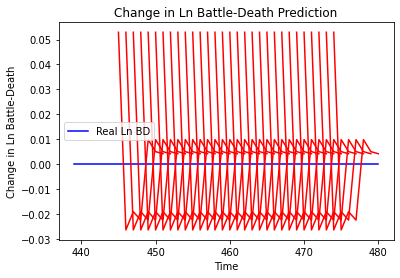

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Liberia', 'country_id': 43, 'step': 't+1', 'mse': 0.00280050261225373, 'mae': 0.05291977524757385, 'r2': 0.0, 'tadda_score': 0.05291977524757385}
{'country': 'Liberia', 'country_id': 43, 'step': 't+2', 'mse': 0.0007016912395946401, 'mae': 0.02648945525288582, 'r2': 0.0, 'tadda_score': 0.02648945525288582}
{'country': 'Liberia', 'country_id': 43, 'step': 't+3', 'mse': 5.430159136496707e-05, 'mae': 0.007368961349129677, 'r2': 0.0, 'tadda_score': 0.007368961349129677}
{'country': 'Liberia', 'country_id': 43, 'step': 't+4', 'mse': 0.00022838345316220435, 'mae': 0.015112360939383507, 'r2': 0.0, 'tadda_score': 0.015112360939383507}
{'country': 'Liberia', 'country_id': 43, 'step': 't+5', 'mse': 0.0004465170165781629, 'mae': 0.02113094925880432, 'r2': 0.0, 'tadda_score': 0.02113094925880432}
{'country': 'Liberia', 'country_id': 43, 'step': 't+6', 'mse': 0.0006822915493091136, 'mae': 0.026120711117982864, 'r2': 0.0, 'tad

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/

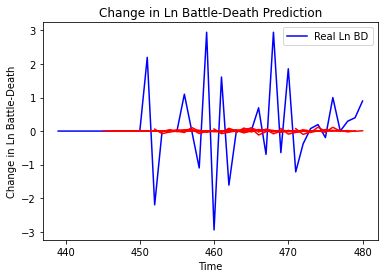

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+1', 'mse': 1.6956330397590897, 'mae': 0.831563099784074, 'r2': -0.02822838918121162, 'tadda_score': 0.8448959135449605}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+2', 'mse': 1.2271538841655532, 'mae': 0.7325891351988761, 'r2': -0.03699620932592462, 'tadda_score': 0.7386033841565783}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+3', 'mse': 2.0729277160856667, 'mae': 0.9082363735936647, 'r2': -0.03978361821476817, 'tadda_score': 0.9143594771986271}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+4', 'mse': 2.376383123712784, 'mae': 1.0117200130814574, 'r2': -0.07052380373585154, 'tadda_score': 1.0205970692976576}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+5', 'mse': 2.305976302652979, 'mae': 0.9272044168762069, 'r2': -0.10620583396413119, 'tadda_score': 0.929925686677466}
{'country': 'Burkina Faso', 'country_id': 47, 'step'

4/4 [==============================] - 0s 10ms/step - loss: 0.2508 - val_loss: 1.4408e-04
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2503 - val_loss: 1.1224e-04
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2502 - val_loss: 1.0063e-04
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2468 - val_loss: 6.9399e-05
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2493 - val_loss: 9.3116e-05
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.2499 - val_loss: 1.2760e-04
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2441 - val_loss: 1.2247e-04
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.2413 - val_loss: 5.0153e-05
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.2531 - val_loss: 3.3929e-05
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.2466 - val_loss:

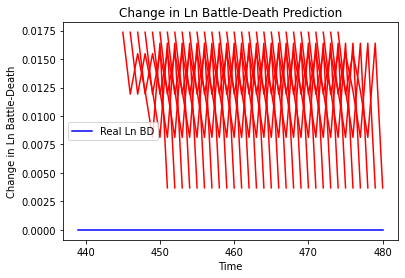

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea', 'country_id': 48, 'step': 't+1', 'mse': 0.0003012469940912345, 'mae': 0.017356468364596367, 'r2': 0.0, 'tadda_score': 0.017356468364596367}
{'country': 'Guinea', 'country_id': 48, 'step': 't+2', 'mse': 0.0008571538874415641, 'mae': 0.029277190566062927, 'r2': 0.0, 'tadda_score': 0.029277190566062927}
{'country': 'Guinea', 'country_id': 48, 'step': 't+3', 'mse': 0.0020031387946459894, 'mae': 0.044756438583135605, 'r2': 0.0, 'tadda_score': 0.044756438583135605}
{'country': 'Guinea', 'country_id': 48, 'step': 't+4', 'mse': 0.0032439181108304127, 'mae': 0.056955404579639435, 'r2': 0.0, 'tadda_score': 0.056955404579639435}
{'country': 'Guinea', 'country_id': 48, 'step': 't+5', 'mse': 0.0028263932366679456, 'mae': 0.053163833916187286, 'r2': 0.0, 'tadda_score': 0.053163833916187286}
{'country': 'Guinea', 'country_id': 48, 'step': 't+6', 'mse': 0.0048381073165879585, 'mae': 0.06955650448799133, 'r2': 0.0, 'tad

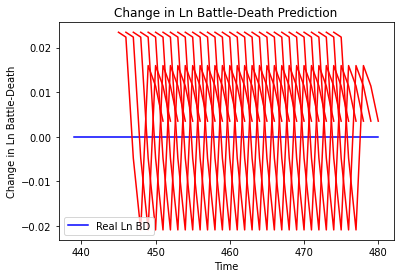

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+1', 'mse': 0.0005489533377693902, 'mae': 0.02342975325882435, 'r2': 0.0, 'tadda_score': 0.02342975325882435}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+2', 'mse': 0.002095357105506901, 'mae': 0.045775070786476135, 'r2': 0.0, 'tadda_score': 0.045775070786476135}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+3', 'mse': 0.0016796559714095244, 'mae': 0.04098360612988472, 'r2': 0.0, 'tadda_score': 0.04098360612988472}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+4', 'mse': 0.0004036429301385175, 'mae': 0.020090866833925247, 'r2': 0.0, 'tadda_score': 0.020090866833925247}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+5', 'mse': 0.00018765389371488972, 'mae': 0.013698682188987732, 'r2': 0.0, 'tadda_score': 0.013698682188987732}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+6', 'mse': 0.0006281611893245755, 'mae'

4/4 [==============================] - 0s 10ms/step - loss: 1.2643 - val_loss: 3.0361
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 1.2647 - val_loss: 3.0362
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2680 - val_loss: 3.0364
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2649 - val_loss: 3.0362
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2642 - val_loss: 3.0361
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2639 - val_loss: 3.0357
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2542 - val_loss: 3.0358
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 1.2566 - val_loss: 3.0357
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2729 - val_loss: 3.0358
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2721 - val_loss: 3.0350
Epoch 71/100
4/4 [============

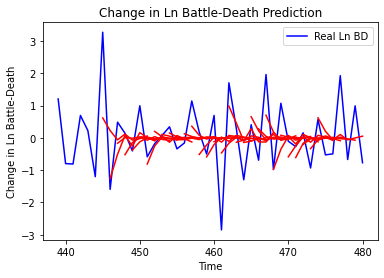

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mali', 'country_id': 50, 'step': 't+1', 'mse': 0.7756710302916009, 'mae': 0.6357842112759166, 'r2': 0.3855658521956149, 'tadda_score': 0.7115533476252769}
{'country': 'Mali', 'country_id': 50, 'step': 't+2', 'mse': 1.776437874756414, 'mae': 1.0300811743011011, 'r2': -0.8348238867607634, 'tadda_score': 1.3885877564817604}
{'country': 'Mali', 'country_id': 50, 'step': 't+3', 'mse': 1.574882622016394, 'mae': 1.048180382140584, 'r2': -0.3872195366453004, 'tadda_score': 1.3782864294331343}
{'country': 'Mali', 'country_id': 50, 'step': 't+4', 'mse': 2.292739927358542, 'mae': 1.2534293080978633, 'r2': -0.533157776988689, 'tadda_score': 1.6483560701820295}
{'country': 'Mali', 'country_id': 50, 'step': 't+5', 'mse': 1.797510591591161, 'mae': 1.0973289550801149, 'r2': -0.6600869463026922, 'tadda_score': 1.3770317826628717}
{'country': 'Mali', 'country_id': 50, 'step': 't+6', 'mse': 1.9948200791538662, 'mae': 1.15655015563

4/4 [==============================] - 0s 8ms/step - loss: 1.6261 - val_loss: 0.4308
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 1.6297 - val_loss: 0.4309
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 1.6301 - val_loss: 0.4311
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 1.6313 - val_loss: 0.4314
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 1.6273 - val_loss: 0.4316
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 1.6300 - val_loss: 0.4318
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 1.6369 - val_loss: 0.4318
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 1.6298 - val_loss: 0.4316
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 1.6278 - val_loss: 0.4313
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 1.6330 - val_loss: 0.4312
Epoch 71/100
4/4 [===============

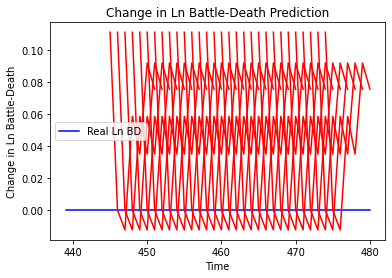

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Senegal', 'country_id': 52, 'step': 't+1', 'mse': 0.012391053455103107, 'mae': 0.11131510883569717, 'r2': 0.0, 'tadda_score': 0.11131510883569717}
{'country': 'Senegal', 'country_id': 52, 'step': 't+2', 'mse': 0.012321178953343725, 'mae': 0.11100080609321594, 'r2': 0.0, 'tadda_score': 0.11100080609321594}
{'country': 'Senegal', 'country_id': 52, 'step': 't+3', 'mse': 0.009668977631136721, 'mae': 0.09833095967769623, 'r2': 0.0, 'tadda_score': 0.09833095967769623}
{'country': 'Senegal', 'country_id': 52, 'step': 't+4', 'mse': 0.02461407619738787, 'mae': 0.15688873827457428, 'r2': 0.0, 'tadda_score': 0.15688873827457428}
{'country': 'Senegal', 'country_id': 52, 'step': 't+5', 'mse': 0.03690198191584759, 'mae': 0.19209888577461243, 'r2': 0.0, 'tadda_score': 0.19209888577461243}
{'country': 'Senegal', 'country_id': 52, 'step': 't+6', 'mse': 0.08072496661795014, 'mae': 0.28412139415740967, 'r2': 0.0, 'tadda_score': 0.

Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 2.1315 - val_loss: 8.9668e-04
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 2.1391 - val_loss: 9.1609e-04
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 2.1587 - val_loss: 0.0011
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 2.1197 - val_loss: 0.0012
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 2.1186 - val_loss: 0.0012
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 2.1495 - val_loss: 0.0012
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 2.1484 - val_loss: 0.0011
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 2.1468 - val_loss: 0.0010
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 2.1123 - val_loss: 7.8067e-04
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 2.1303 - val_loss: 6.6256e-04

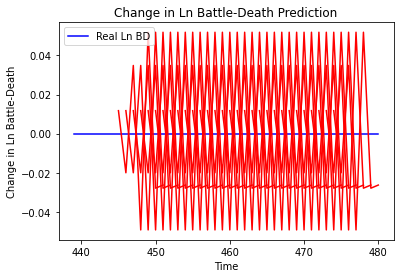

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+1', 'mse': 0.00013808302045116572, 'mae': 0.011750873178243637, 'r2': 0.0, 'tadda_score': 0.011750873178243637}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+2', 'mse': 6.84513419167733e-05, 'mae': 0.0082735326141119, 'r2': 0.0, 'tadda_score': 0.0082735326141119}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+3', 'mse': 0.000707064696508667, 'mae': 0.026590688154101372, 'r2': 0.0, 'tadda_score': 0.026590688154101372}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+4', 'mse': 0.0005139531739945004, 'mae': 0.022670535370707512, 'r2': 0.0, 'tadda_score': 0.022670535370707512}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+5', 'mse': 0.0024224546948486414, 'mae': 0.04921843856573105, 'r2': 0.0, 'tadda_score': 0.04921843856573105}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+6', 'mse': 0.00045416967639223815, 'mae': 0.0213

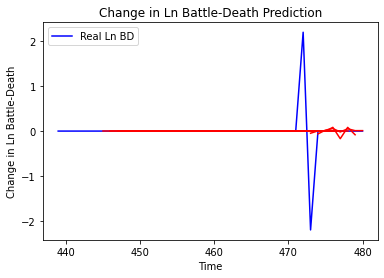

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'The Gambia', 'country_id': 54, 'step': 't+1', 'mse': 0.31505408111355815, 'mae': 0.14697388717324916, 'r2': 0.02112446960439296, 'tadda_score': 0.14697388717324916}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+2', 'mse': 0.31594501790344626, 'mae': 0.14654255331845467, 'r2': 0.01835632192743475, 'tadda_score': 0.14654255331845467}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+3', 'mse': 0.16100385940453915, 'mae': 0.07528383487856082, 'r2': -0.03497986679518217, 'tadda_score': 0.07528383487856082}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+4', 'mse': 0.16097396950927914, 'mae': 0.07460252951230299, 'r2': -0.034787725812170045, 'tadda_score': 0.07460252951230299}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+5', 'mse': 0.16157128989122968, 'mae': 0.07867151025082361, 'r2': -0.03862747581339154, 'tadda_score': 0.07867151025082361}
{'country': 'The Gambia', 'country_id': 54, 

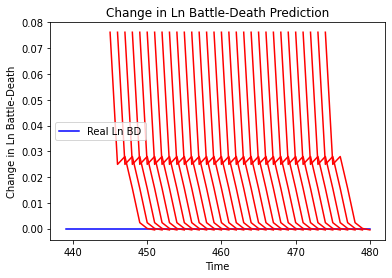

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Djibouti', 'country_id': 55, 'step': 't+1', 'mse': 0.005805299053751378, 'mae': 0.07619251310825348, 'r2': 0.0, 'tadda_score': 0.07619251310825348}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+2', 'mse': 0.010226873292398297, 'mae': 0.1011280044913292, 'r2': 0.0, 'tadda_score': 0.1011280044913292}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+3', 'mse': 0.01667050246774071, 'mae': 0.1291143000125885, 'r2': 0.0, 'tadda_score': 0.1291143000125885}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+4', 'mse': 0.02095226888068069, 'mae': 0.1447489857673645, 'r2': 0.0, 'tadda_score': 0.1447489857673645}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+5', 'mse': 0.014916058800737098, 'mae': 0.12213131785392761, 'r2': 0.0, 'tadda_score': 0.12213131785392761}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+6', 'mse': 0.01493205999716829, 'mae': 0.12219680845737457, 'r2': 0.0, 'tadda_score': 0.

Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9480 - val_loss: 0.0295
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9305 - val_loss: 0.0293
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9233 - val_loss: 0.0293
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9399 - val_loss: 0.0294
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9375 - val_loss: 0.0295
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9209 - val_loss: 0.0296
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9206 - val_loss: 0.0298
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9288 - val_loss: 0.0299
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9420 - val_loss: 0.0297
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9263 - val_loss: 0.0296
Epoch 72/100
4/4 [=

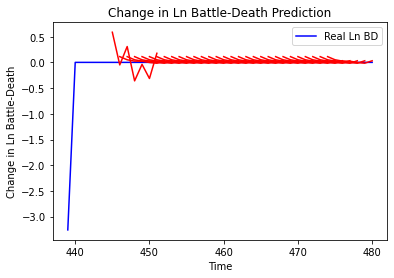

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Eritrea', 'country_id': 56, 'step': 't+1', 'mse': 0.023484192360810712, 'mae': 0.12741235146919885, 'r2': 0.0, 'tadda_score': 0.12741235146919885}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+2', 'mse': 0.03499476609422629, 'mae': 0.17456839084625245, 'r2': 0.0, 'tadda_score': 0.17456839084625245}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+3', 'mse': 0.05735055909523131, 'mae': 0.2082895835240682, 'r2': 0.0, 'tadda_score': 0.2082895835240682}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+4', 'mse': 0.05067512618604094, 'mae': 0.2196499024828275, 'r2': 0.0, 'tadda_score': 0.2196499024828275}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+5', 'mse': 0.03218682180115904, 'mae': 0.16879189312458037, 'r2': 0.0, 'tadda_score': 0.16879189312458037}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+6', 'mse': 0.020293602887798114, 'mae': 0.14225641787052154, 'r2': 0.0, 'tadda_score': 0.14225

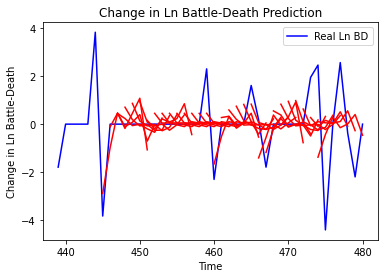

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+1', 'mse': 1.1477746305042873, 'mae': 0.8223897758738204, 'r2': 0.15867171704500072, 'tadda_score': 0.915113185208639}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+2', 'mse': 4.1255138712441335, 'mae': 1.4624039733093686, 'r2': -1.0676826291004793, 'tadda_score': 1.65072068807301}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+3', 'mse': 4.032635057889688, 'mae': 1.4847758778613518, 'r2': -1.021132328949255, 'tadda_score': 1.6952407746197489}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+4', 'mse': 4.236768131177593, 'mae': 1.5022267529052207, 'r2': -1.1234425920668558, 'tadda_score': 1.7325312861484001}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+5', 'mse': 3.1477452339254075, 'mae': 1.2227991972050773, 'r2': -0.5776308949989324, 'tadda_score': 1.3680408670188695}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+6', 'mse': 2.6184596575415

Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9149 - val_loss: 1.0005
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9148 - val_loss: 1.0004
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9186 - val_loss: 1.0006
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9089 - val_loss: 1.0007
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9135 - val_loss: 1.0008
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9131 - val_loss: 1.0005
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9082 - val_loss: 1.0003
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9202 - val_loss: 1.0002
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9201 - val_loss: 1.0000
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9146 - val_loss: 0.9997
Epoch 71/100
4/4 [==

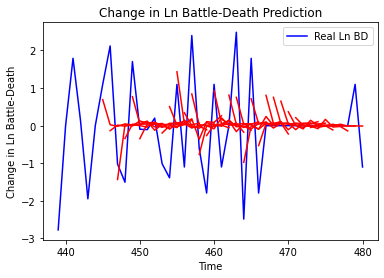

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Algeria', 'country_id': 67, 'step': 't+1', 'mse': 1.0369949948286743, 'mae': 0.8036985812286572, 'r2': 0.34979314409197204, 'tadda_score': 0.8423724485139089}
{'country': 'Algeria', 'country_id': 67, 'step': 't+2', 'mse': 2.378241826998967, 'mae': 1.1776786834246296, 'r2': -0.4120897666235639, 'tadda_score': 1.4471119060115396}
{'country': 'Algeria', 'country_id': 67, 'step': 't+3', 'mse': 2.7440749139928426, 'mae': 1.2885943370209147, 'r2': -0.5296979173670382, 'tadda_score': 1.589943091784518}
{'country': 'Algeria', 'country_id': 67, 'step': 't+4', 'mse': 2.836886156717338, 'mae': 1.284406772300107, 'r2': -0.3896163581480814, 'tadda_score': 1.5403128045742738}
{'country': 'Algeria', 'country_id': 67, 'step': 't+5', 'mse': 2.155563454408032, 'mae': 1.088408482507917, 'r2': -0.6017318097170352, 'tadda_score': 1.319048936229003}
{'country': 'Algeria', 'country_id': 67, 'step': 't+6', 'mse': 2.180405933481189, 'ma

4/4 [==============================] - 0s 8ms/step - loss: 0.1864 - val_loss: 1.4773
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1836 - val_loss: 1.4780
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1854 - val_loss: 1.4786
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1862 - val_loss: 1.4790
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1850 - val_loss: 1.4797
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1858 - val_loss: 1.4806
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1839 - val_loss: 1.4819
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1836 - val_loss: 1.4838
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1855 - val_loss: 1.4845
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1813 - val_loss: 1.4845
Epoch 71/100
4/4 [===============

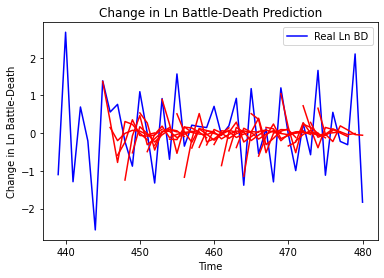

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cameroon', 'country_id': 69, 'step': 't+1', 'mse': 0.5487343898034396, 'mae': 0.6316693269776383, 'r2': 0.25490014849059006, 'tadda_score': 0.7368166964319426}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+2', 'mse': 1.8033047973357599, 'mae': 1.1653669180182475, 'r2': -1.4430865128216124, 'tadda_score': 1.633728475541657}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+3', 'mse': 1.4928700843597866, 'mae': 0.995836856767112, 'r2': -0.523332155438464, 'tadda_score': 1.2234980526611945}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+4', 'mse': 1.7625717228434514, 'mae': 1.0557437901883335, 'r2': -1.001354105432386, 'tadda_score': 1.376512609192631}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+5', 'mse': 2.0635667623361456, 'mae': 1.1906913433304678, 'r2': -1.0745928689204338, 'tadda_score': 1.5692881811490904}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+6', 'mse': 2.193986049808

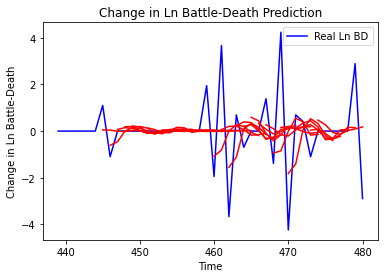

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+1', 'mse': 1.686491098990453, 'mae': 0.7973251737384921, 'r2': 0.36232131538006973, 'tadda_score': 0.8053098731715406}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+2', 'mse': 2.6075159491390143, 'mae': 1.1738163925033582, 'r2': -0.781122737014794, 'tadda_score': 1.2801541772307727}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+3', 'mse': 2.6184885940611906, 'mae': 1.0984429301607033, 'r2': -0.11718867472960759, 'tadda_score': 1.1764888268498004}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+4', 'mse': 3.022437857771705, 'mae': 1.195602643572253, 'r2': -0.25015690288301795, 'tadda_score': 1.2916329990654805}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+5', 'mse': 2.6489952498956475, 'mae': 0.9657527877193122, 'r2': -0.04531721498815933, 'tadda_score': 0.989919665162

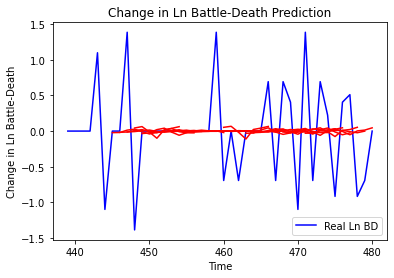

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tunisia', 'country_id': 73, 'step': 't+1', 'mse': 0.4304072653513257, 'mae': 0.41786666798334193, 'r2': -0.042550530634792416, 'tadda_score': 0.425648760021884}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+2', 'mse': 0.397713010015949, 'mae': 0.4172642021062335, 'r2': 0.03349530776279874, 'tadda_score': 0.4220111313829681}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+3', 'mse': 0.47969536555733416, 'mae': 0.46929605309029676, 'r2': -0.003957906948942602, 'tadda_score': 0.4745359245295103}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+4', 'mse': 0.5028064030055452, 'mae': 0.4590340467527322, 'r2': -0.041288801586488066, 'tadda_score': 0.46115866353584445}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+5', 'mse': 0.4636580092539521, 'mae': 0.4477049234009176, 'r2': -0.05391521812880318, 'tadda_score': 0.45529440675515825}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+6', 'mse': 0.565

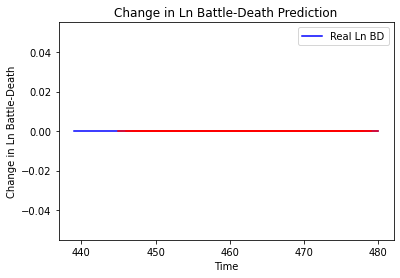

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Benin', 'country_id': 74, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Equatorial Guinea']
Building vanilla Model...
Model: "sequential_298"
_________________________________________________________________
Layer (type)                 Output S

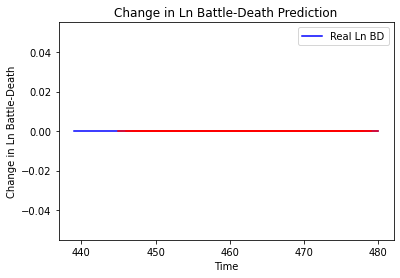

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Niger']
Building vanilla Model...
Model: "sequential_299"
_______________________________

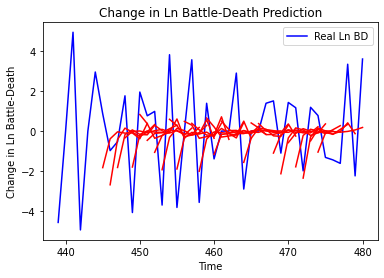

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Niger', 'country_id': 78, 'step': 't+1', 'mse': 3.269391817609943, 'mae': 1.5598736488500369, 'r2': 0.2452697097075086, 'tadda_score': 1.8507373249708745}
{'country': 'Niger', 'country_id': 78, 'step': 't+2', 'mse': 7.425541677224705, 'mae': 2.297612422147549, 'r2': -0.890987101266097, 'tadda_score': 2.8314713825177704}
{'country': 'Niger', 'country_id': 78, 'step': 't+3', 'mse': 6.723466045848416, 'mae': 2.011680255602234, 'r2': -0.7359684955331722, 'tadda_score': 2.586543645233346}
{'country': 'Niger', 'country_id': 78, 'step': 't+4', 'mse': 7.135312494101831, 'mae': 2.2141200554281157, 'r2': -0.5726150072183722, 'tadda_score': 2.725150285354225}
{'country': 'Niger', 'country_id': 78, 'step': 't+5', 'mse': 8.093957329400135, 'mae': 2.2805896319211887, 'r2': -0.471407049074247, 'tadda_score': 2.7758162773908546}
{'country': 'Niger', 'country_id': 78, 'step': 't+6', 'mse': 7.850213838697068, 'mae': 2.16801237876

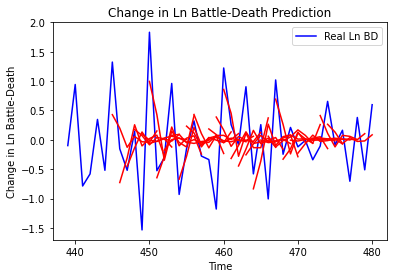

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Nigeria', 'country_id': 79, 'step': 't+1', 'mse': 0.40896589267163364, 'mae': 0.4761942304362584, 'r2': 0.2844069861616281, 'tadda_score': 0.5425750675302972}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+2', 'mse': 1.2119900627950608, 'mae': 0.8904350439692084, 'r2': -1.2399867071700323, 'tadda_score': 1.1700006560717564}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+3', 'mse': 0.9934422425771724, 'mae': 0.808820028044718, 'r2': -0.6214438775527096, 'tadda_score': 1.0210895692933972}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+4', 'mse': 1.2527797172826374, 'mae': 0.8785601001004363, 'r2': -0.6841246912161578, 'tadda_score': 1.1708387986217919}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+5', 'mse': 0.8273562694022127, 'mae': 0.6949683137984289, 'r2': -0.6160467264966896, 'tadda_score': 0.8931855954976096}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+6', 'mse': 0.75805818897711

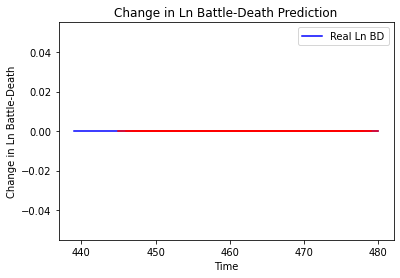

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Togo']
Building vanilla Model...
Model: "sequential_302"
____

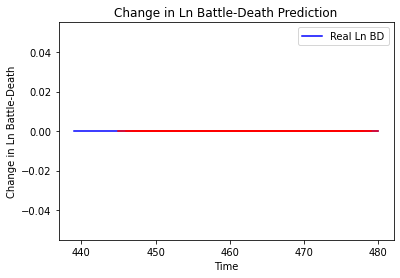

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Togo', 'country_id': 81, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Somalia']
Building vanilla Model...
Model: "sequential_303"
_________________________________________________________________
Layer (type)                 Output Shape             

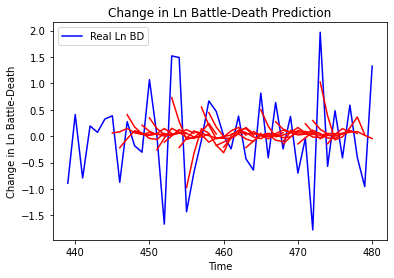

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Somalia', 'country_id': 120, 'step': 't+1', 'mse': 0.5380366980701564, 'mae': 0.5711773469054442, 'r2': 0.29371641889989286, 'tadda_score': 0.6529789094133917}
{'country': 'Somalia', 'country_id': 120, 'step': 't+2', 'mse': 1.4213094680837153, 'mae': 0.910766371488345, 'r2': -0.4493813123033015, 'tadda_score': 1.1230888234076621}
{'country': 'Somalia', 'country_id': 120, 'step': 't+3', 'mse': 1.3440605264696137, 'mae': 0.850485198147122, 'r2': -0.6840890189969808, 'tadda_score': 1.0823614052901902}
{'country': 'Somalia', 'country_id': 120, 'step': 't+4', 'mse': 1.0621518473237308, 'mae': 0.8140936454722062, 'r2': -0.5322916904973474, 'tadda_score': 0.983641603150842}
{'country': 'Somalia', 'country_id': 120, 'step': 't+5', 'mse': 0.9374335500609232, 'mae': 0.7424832252400858, 'r2': -0.21603209720285954, 'tadda_score': 0.9089603596913561}
{'country': 'Somalia', 'country_id': 120, 'step': 't+6', 'mse': 1.057183335

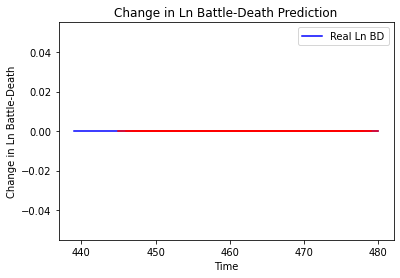

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Botswana', 'country_id': 154, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Burundi']
Building vanilla Model...
Model: "sequential_305"
_________________________________________________________________
Layer (type)       

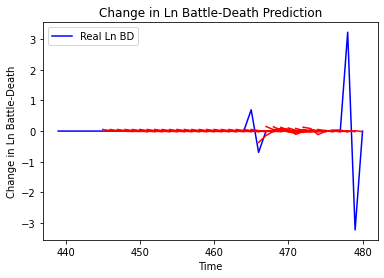

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burundi', 'country_id': 155, 'step': 't+1', 'mse': 0.022136293398085715, 'mae': 0.09460108689683758, 'r2': 0.30889308350177747, 'tadda_score': 0.09460108689683758}
{'country': 'Burundi', 'country_id': 155, 'step': 't+2', 'mse': 0.0557891124163369, 'mae': 0.14330740607994877, 'r2': -0.7417659209179766, 'tadda_score': 0.14984769063411238}
{'country': 'Burundi', 'country_id': 155, 'step': 't+3', 'mse': 0.057123559552234256, 'mae': 0.14395953553138258, 'r2': -0.7834280740497046, 'tadda_score': 0.15092638370611353}
{'country': 'Burundi', 'country_id': 155, 'step': 't+4', 'mse': 0.04942326814541866, 'mae': 0.13233503016052725, 'r2': -0.5430208588669545, 'tadda_score': 0.1370006175062863}
{'country': 'Burundi', 'country_id': 155, 'step': 't+5', 'mse': 0.03732463094206782, 'mae': 0.09133988208788715, 'r2': -0.16529493605453105, 'tadda_score': 0.09346797354239307}
{'country': 'Burundi', 'country_id': 155, 'step': 't+6', 

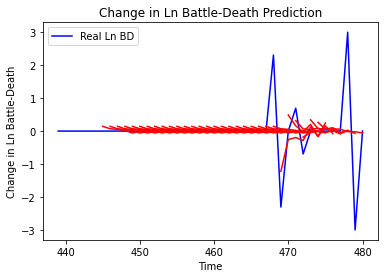

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Rwanda', 'country_id': 156, 'step': 't+1', 'mse': 0.23781494838735015, 'mae': 0.2845531421168105, 'r2': 0.38308412113550105, 'tadda_score': 0.2845531421168105}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+2', 'mse': 0.5919695923213973, 'mae': 0.44701673361296024, 'r2': -0.5356286212639081, 'tadda_score': 0.4824508584800816}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+3', 'mse': 0.48568904016161407, 'mae': 0.4761708044550466, 'r2': -0.7402717138752128, 'tadda_score': 0.5035117699247249}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+4', 'mse': 0.5019459991181443, 'mae': 0.48628260174419, 'r2': -0.36050428556872816, 'tadda_score': 0.48628260174419}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+5', 'mse': 0.5253955265344826, 'mae': 0.38092210271979887, 'r2': -0.4240632791667236, 'tadda_score': 0.396204408794895}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+6', 'mse': 0.5323458805422

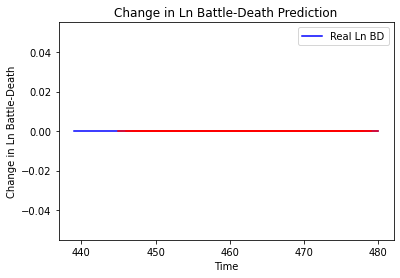

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zambia', 'country_id': 157, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Zimbabwe']
Building vanilla Model...
Model: "sequential_308"
_________________________________________________________________
Layer (type)                 Out

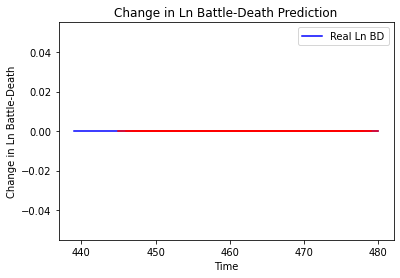

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Comoros']
Building vanilla Model...
Model: "sequential_309"
_________________________________________________________________
Layer (type)       

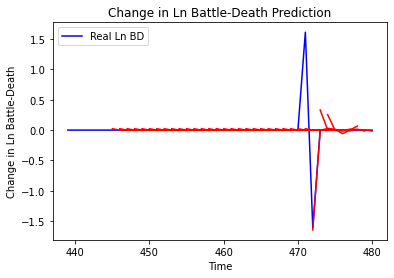

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Comoros', 'country_id': 159, 'step': 't+1', 'mse': 0.09021366777833478, 'mae': 0.09334742786983649, 'r2': 0.4775855943334253, 'tadda_score': 0.09334742786983649}
{'country': 'Comoros', 'country_id': 159, 'step': 't+2', 'mse': 0.30317241215375645, 'mae': 0.19994482228605345, 'r2': -0.755627937653174, 'tadda_score': 0.21109077959704792}
{'country': 'Comoros', 'country_id': 159, 'step': 't+3', 'mse': 0.2907045385803534, 'mae': 0.1980919294501185, 'r2': -0.6834282707603534, 'tadda_score': 0.20636329282768962}
{'country': 'Comoros', 'country_id': 159, 'step': 't+4', 'mse': 0.17601332425872976, 'mae': 0.13909025849500495, 'r2': -1.108830148808691, 'tadda_score': 0.13909025849500495}
{'country': 'Comoros', 'country_id': 159, 'step': 't+5', 'mse': 0.18181310917676702, 'mae': 0.14509491633970736, 'r2': -1.178317850056719, 'tadda_score': 0.14509491633970736}
{'country': 'Comoros', 'country_id': 159, 'step': 't+6', 'mse': 

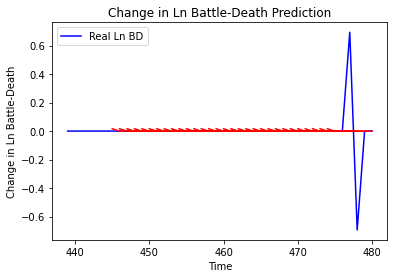

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Lesotho', 'country_id': 160, 'step': 't+1', 'mse': 0.00027312328587782153, 'mae': 0.016526442021131516, 'r2': 0.0, 'tadda_score': 0.016526442021131516}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+2', 'mse': 0.0002327869899545476, 'mae': 0.01525735855102539, 'r2': 0.0, 'tadda_score': 0.01525735855102539}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+3', 'mse': 0.0002855344930724514, 'mae': 0.016897765919566154, 'r2': 0.0, 'tadda_score': 0.016897765919566154}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+4', 'mse': 0.00031695948669452356, 'mae': 0.017803356051445007, 'r2': 0.0, 'tadda_score': 0.017803356051445007}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+5', 'mse': 0.0004143883268166483, 'mae': 0.02035653032362461, 'r2': 0.0, 'tadda_score': 0.02035653032362461}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+6', 'mse': 0.0003542888383424453, 'mae': 0.0188225619494915, 'r2': 

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 10m

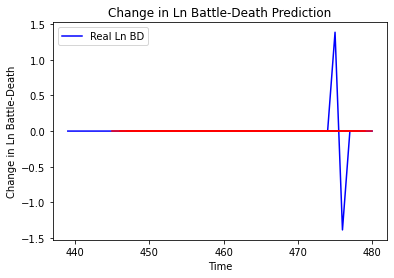

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Malawi', 'country_id': 161, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mozambique']
Building vanilla Model...
Model: "sequential_312"
_________________________________________________________________
Layer (type)                 O

Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 1.0542 - val_loss: 0.6789
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 1.0176 - val_loss: 0.6793
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.9986 - val_loss: 0.6797
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.9962 - val_loss: 0.6801
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9879 - val_loss: 0.6805
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 1.0482 - val_loss: 0.6810
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 0.9907 - val_loss: 0.6813
Epoch 72/100
4/4 [==============================] - 0s 10ms/step - loss: 0.9574 - val_loss: 0.6818
Epoch 73/100
4/4 [==============================] - 0s 10ms/step - loss: 0.9797 - val_loss: 0.6825
Epoch 74/100
4/4 [==============================] - 0s 10ms/step - loss: 1.0146 - val_loss: 0.6829
Epoch 75/100


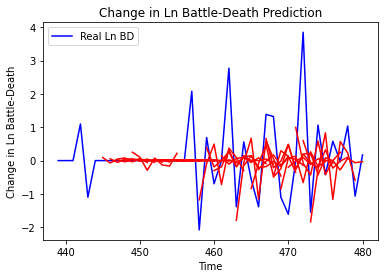

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mozambique', 'country_id': 162, 'step': 't+1', 'mse': 1.1578654560126609, 'mae': 0.6627446319822871, 'r2': 0.2641714787306175, 'tadda_score': 0.6984776587450906}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+2', 'mse': 2.945145801124547, 'mae': 1.1279931819038536, 'r2': -0.5392850804289022, 'tadda_score': 1.3508576445874518}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+3', 'mse': 2.627011756951568, 'mae': 1.143429076643932, 'r2': -0.37264793984372724, 'tadda_score': 1.3072277771653213}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+4', 'mse': 2.7976413665843385, 'mae': 1.1742770028153025, 'r2': -0.8563956315505947, 'tadda_score': 1.504663310154176}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+5', 'mse': 1.478304477328188, 'mae': 0.836031880322091, 'r2': -0.8050205138388444, 'tadda_score': 0.9849977265725456}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+6', 'mse

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/

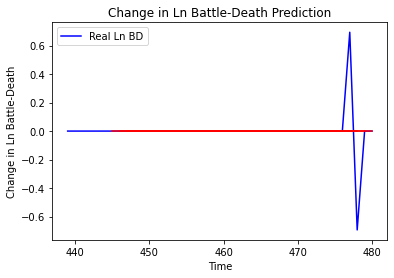

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Africa', 'country_id': 163, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Swaziland']
Building vanilla Model...
Model: "sequential_314"
_______________________________________________________

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 9ms/

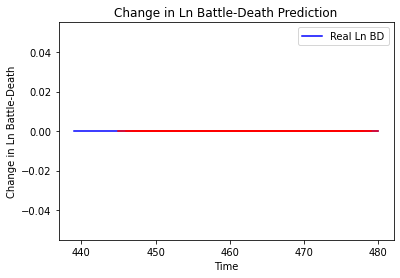

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Swaziland', 'country_id': 164, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Angola']
Building vanilla Model...
Model: "sequential_315"
_________________________________________________________________
Layer (type) 

4/4 [==============================] - 0s 8ms/step - loss: 3.2635 - val_loss: 0.0865
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 3.2951 - val_loss: 0.0866
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 3.2871 - val_loss: 0.0867
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 3.2729 - val_loss: 0.0865
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 3.2902 - val_loss: 0.0864
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 3.2806 - val_loss: 0.0864
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 3.2792 - val_loss: 0.0865
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 3.2769 - val_loss: 0.0865
Epoch 73/100
4/4 [==============================] - 0s 9ms/step - loss: 3.2740 - val_loss: 0.0866
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 3.2455 - val_loss: 0.0867
Epoch 75/100
4/4 [===============

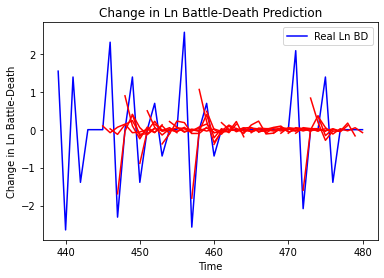

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Angola', 'country_id': 165, 'step': 't+1', 'mse': 0.7485546395357862, 'mae': 0.5506389542730691, 'r2': 0.41174976606055425, 'tadda_score': 0.5537614826671324}
{'country': 'Angola', 'country_id': 165, 'step': 't+2', 'mse': 2.309864825739941, 'mae': 1.023559219197635, 'r2': -0.8152028620818645, 'tadda_score': 1.17309212069333}
{'country': 'Angola', 'country_id': 165, 'step': 't+3', 'mse': 1.2678866845888115, 'mae': 0.7905988534961946, 'r2': -0.4455106088152403, 'tadda_score': 0.8306330336307295}
{'country': 'Angola', 'country_id': 165, 'step': 't+4', 'mse': 1.1616782345845338, 'mae': 0.7938189653038312, 'r2': -0.08226649573766176, 'tadda_score': 0.8107337879617342}
{'country': 'Angola', 'country_id': 165, 'step': 't+5', 'mse': 1.205104382231321, 'mae': 0.7453858452574127, 'r2': -0.23083224629291998, 'tadda_score': 0.7684342744485252}
{'country': 'Angola', 'country_id': 165, 'step': 't+6', 'mse': 1.516249032089076,

4/4 [==============================] - 0s 8ms/step - loss: 1.8732 - val_loss: 0.2220
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 1.8661 - val_loss: 0.2219
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 1.8663 - val_loss: 0.2218
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 1.8502 - val_loss: 0.2219
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 1.8746 - val_loss: 0.2218
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 1.8756 - val_loss: 0.2219
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 1.8543 - val_loss: 0.2219
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 1.8735 - val_loss: 0.2221
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 1.8550 - val_loss: 0.2221
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 1.8618 - val_loss: 0.2223
Epoch 71/100
4/4 [============

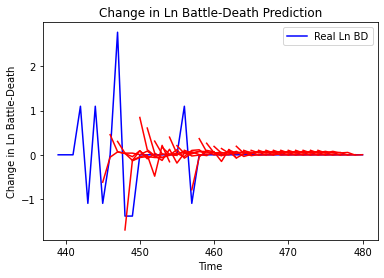

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo', 'country_id': 166, 'step': 't+1', 'mse': 0.3704710805948263, 'mae': 0.3727553747572472, 'r2': 0.2645242663413707, 'tadda_score': 0.3727553747572472}
{'country': 'Congo', 'country_id': 166, 'step': 't+2', 'mse': 1.2229677362820817, 'mae': 0.6888517362242145, 'r2': -0.6092573026340529, 'tadda_score': 0.8137054147685769}
{'country': 'Congo', 'country_id': 166, 'step': 't+3', 'mse': 1.1790691095999766, 'mae': 0.6565591930369953, 'r2': -0.9879780581238893, 'tadda_score': 0.7815220374882638}
{'country': 'Congo', 'country_id': 166, 'step': 't+4', 'mse': 1.104896842641018, 'mae': 0.7164702782055159, 'r2': -0.5906195813389237, 'tadda_score': 0.8369643895845035}
{'country': 'Congo', 'country_id': 166, 'step': 't+5', 'mse': 1.178840125104724, 'mae': 0.7339291303376773, 'r2': -0.9875919771482227, 'tadda_score': 0.8426282534023543}
{'country': 'Congo', 'country_id': 166, 'step': 't+6', 'mse': 1.0996956121773147, 'mae

Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 2.9127 - val_loss: 3.2821
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 2.9313 - val_loss: 3.2840
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 2.9064 - val_loss: 3.2842
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9409 - val_loss: 3.2848
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 2.8904 - val_loss: 3.2857
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9217 - val_loss: 3.2868
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 2.9080 - val_loss: 3.2865
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9147 - val_loss: 3.2881
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9158 - val_loss: 3.2886
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9200 - val_loss: 3.2906
Epoch 71/100
4/4

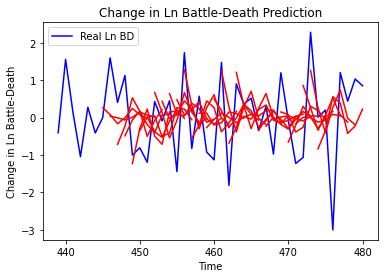

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+1', 'mse': 0.8855636573541144, 'mae': 0.7715902195785708, 'r2': 0.19088236284177118, 'tadda_score': 0.9231769816802707}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+2', 'mse': 2.739015154891131, 'mae': 1.3425199811109318, 'r2': -0.9371726142699772, 'tadda_score': 1.7269500752983902}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+3', 'mse': 2.3322131525015513, 'mae': 1.2573697855479276, 'r2': -0.35205786867023625, 'tadda_score': 1.5722109385238843}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+4', 'mse': 3.0523194638056714, 'mae': 1.460033304436703, 'r2': -0.7520129889197364, 'tadda_score': 1.8975481859159467}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+5', 'mse': 4.166691948707236, 'mae': 1.6070705428472105, 'r2': -1.2697763076174642, 'tadda_score': 2.1775497019043515}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+6', 

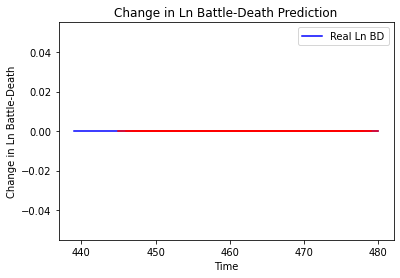

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Gabon', 'country_id': 169, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Namibia']
Building vanilla Model...
Model: "sequential_319"
_________________________________________________________________
Layer (type)                 Output Shap

Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1404 - val_loss: 6.4589e-05
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1366 - val_loss: 6.5590e-05
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1367 - val_loss: 4.6150e-05
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1364 - val_loss: 4.1455e-05
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1351 - val_loss: 3.7131e-05
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1382 - val_loss: 3.6562e-05
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1342 - val_loss: 4.7621e-05
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1363 - val_loss: 7.7845e-05
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1377 - val_loss: 7.9333e-05
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1376 - v

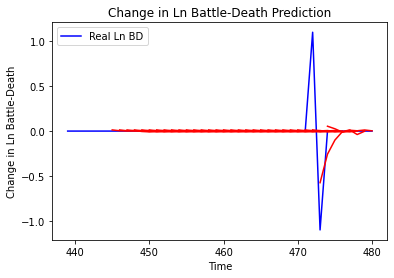

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Namibia', 'country_id': 170, 'step': 't+1', 'mse': 0.04872320983457868, 'mae': 0.06711323867882979, 'r2': 0.39446640144034384, 'tadda_score': 0.06711323867882979}
{'country': 'Namibia', 'country_id': 170, 'step': 't+2', 'mse': 0.10852526090412985, 'mae': 0.11778488014534805, 'r2': -0.34875538768927994, 'tadda_score': 0.12043394351398641}
{'country': 'Namibia', 'country_id': 170, 'step': 't+3', 'mse': 0.06821310394445138, 'mae': 0.08566728577959386, 'r2': -0.7539750784911636, 'tadda_score': 0.08566728577959386}
{'country': 'Namibia', 'country_id': 170, 'step': 't+4', 'mse': 0.06846324640830766, 'mae': 0.0913653945768659, 'r2': -0.760407033970474, 'tadda_score': 0.0913653945768659}
{'country': 'Namibia', 'country_id': 170, 'step': 't+5', 'mse': 0.05424386182343699, 'mae': 0.07471548004396604, 'r2': -0.3947815932391072, 'tadda_score': 0.07471548004396604}
{'country': 'Namibia', 'country_id': 170, 'step': 't+6', 'ms

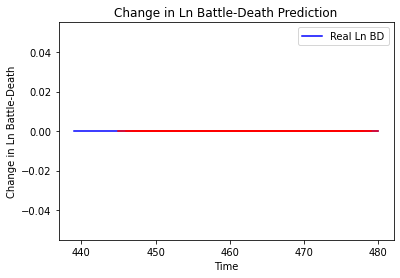

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Madagascar', 'country_id': 172, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mauritius']
Building vanilla Model...
Model: "sequential_321"
_________________________________________________________________
Lay

4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] 

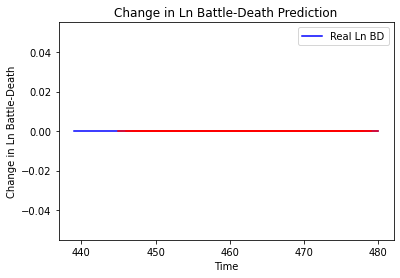

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritius', 'country_id': 173, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Seychelles']
Building vanilla Model...
Model: "sequential_322"
_________________________________________________________________
Layer (ty

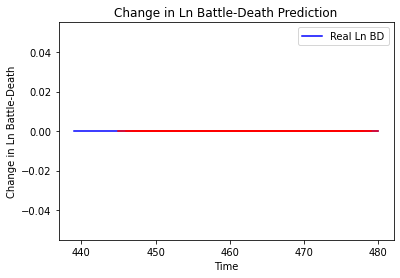

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Seychelles', 'country_id': 174, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Libya']
Building vanilla Model...
Model: "sequential_323"
_________________________________________________________________
Layer (

4/4 [==============================] - 0s 10ms/step - loss: 0.0313 - val_loss: 2.2982
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0314 - val_loss: 2.2983
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0314 - val_loss: 2.2983
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0314 - val_loss: 2.2984
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0314 - val_loss: 2.2986
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0314 - val_loss: 2.2988
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0314 - val_loss: 2.2990
Epoch 72/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0315 - val_loss: 2.2992
Epoch 73/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0314 - val_loss: 2.2995
Epoch 74/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0314 - val_loss: 2.2995
Epoch 75/100
4/4 [=====

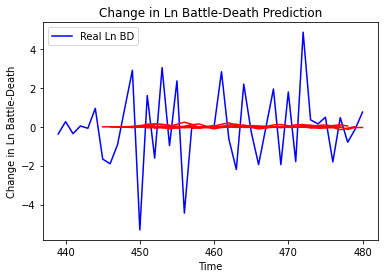

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Libya', 'country_id': 213, 'step': 't+1', 'mse': 4.848257988419757, 'mae': 1.6974664137038942, 'r2': -0.0005411465994518139, 'tadda_score': 1.7110946678517616}
{'country': 'Libya', 'country_id': 213, 'step': 't+2', 'mse': 5.414856990499635, 'mae': 1.8012152130941685, 'r2': 0.00043785993297640324, 'tadda_score': 1.8248928748607771}
{'country': 'Libya', 'country_id': 213, 'step': 't+3', 'mse': 7.461205212415606, 'mae': 2.1122385510075277, 'r2': -0.005209119694753905, 'tadda_score': 2.1369618340848073}
{'country': 'Libya', 'country_id': 213, 'step': 't+4', 'mse': 5.901694254255057, 'mae': 1.9912466604892443, 'r2': -0.01984818571359548, 'tadda_score': 2.021176319011453}
{'country': 'Libya', 'country_id': 213, 'step': 't+5', 'mse': 7.531980198463229, 'mae': 2.304585751854897, 'r2': -0.035155887769552585, 'tadda_score': 2.3631696232542594}
{'country': 'Libya', 'country_id': 213, 'step': 't+6', 'mse': 6.633090088039392

Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 4.9689 - val_loss: 0.8444
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 4.9315 - val_loss: 0.8451
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 4.9588 - val_loss: 0.8447
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 4.9375 - val_loss: 0.8437
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 4.9342 - val_loss: 0.8431
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 4.9264 - val_loss: 0.8430
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 4.9189 - val_loss: 0.8427
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 4.9074 - val_loss: 0.8418
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 4.9466 - val_loss: 0.8417
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 4.9145 - val_loss: 0.8422
Epoch 71/100
4/4 [==

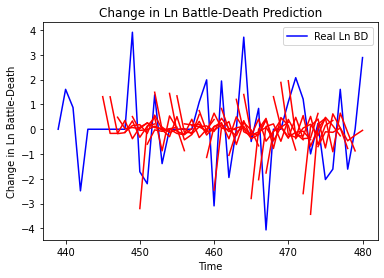

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Chad', 'country_id': 214, 'step': 't+1', 'mse': 3.251027378467853, 'mae': 1.507748732024401, 'r2': -0.10751115741447004, 'tadda_score': 1.7387245548804302}
{'country': 'Chad', 'country_id': 214, 'step': 't+2', 'mse': 8.03992212206492, 'mae': 2.215150629546717, 'r2': -0.8940857654550978, 'tadda_score': 2.915559297866101}
{'country': 'Chad', 'country_id': 214, 'step': 't+3', 'mse': 9.512096196367857, 'mae': 2.403305938276695, 'r2': -0.8213046498413503, 'tadda_score': 3.0033751501967973}
{'country': 'Chad', 'country_id': 214, 'step': 't+4', 'mse': 13.775880580023507, 'mae': 3.0475226195230642, 'r2': -1.2591069778289414, 'tadda_score': 3.9715007952426435}
{'country': 'Chad', 'country_id': 214, 'step': 't+5', 'mse': 11.49447012628929, 'mae': 2.7299721039405336, 'r2': -1.419450187408871, 'tadda_score': 3.5519287066728737}
{'country': 'Chad', 'country_id': 214, 'step': 't+6', 'mse': 9.190803831892415, 'mae': 2.37130488

4/4 [==============================] - 0s 9ms/step - loss: 0.5755 - val_loss: 2.1363
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5575 - val_loss: 2.1344
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5711 - val_loss: 2.1334
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5687 - val_loss: 2.1324
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5636 - val_loss: 2.1312
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5672 - val_loss: 2.1300
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5670 - val_loss: 2.1293
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5664 - val_loss: 2.1277
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5615 - val_loss: 2.1269
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5615 - val_loss: 2.1257
Epoch 71/100
4/4 [==============

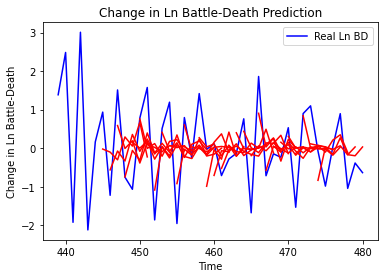

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Egypt', 'country_id': 222, 'step': 't+1', 'mse': 0.6437225229043618, 'mae': 0.6566875943846622, 'r2': 0.4288403061323144, 'tadda_score': 0.70937359264067}
{'country': 'Egypt', 'country_id': 222, 'step': 't+2', 'mse': 1.566236843284911, 'mae': 1.0635579763251248, 'r2': -0.44826743768136135, 'tadda_score': 1.3045303873367808}
{'country': 'Egypt', 'country_id': 222, 'step': 't+3', 'mse': 1.4729679223639338, 'mae': 0.9668792736564894, 'r2': -0.5882358568833015, 'tadda_score': 1.2065888486340461}
{'country': 'Egypt', 'country_id': 222, 'step': 't+4', 'mse': 1.410005987210691, 'mae': 1.0050876997967748, 'r2': -0.14469318291964695, 'tadda_score': 1.2122951008935958}
{'country': 'Egypt', 'country_id': 222, 'step': 't+5', 'mse': 1.762476819333182, 'mae': 1.1318228620495436, 'r2': -0.48561933128016666, 'tadda_score': 1.4404384283429426}
{'country': 'Egypt', 'country_id': 222, 'step': 't+6', 'mse': 1.7348916902822806, 'mae

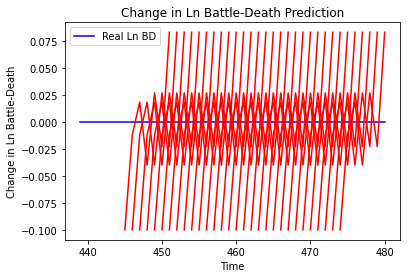

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Uganda', 'country_id': 235, 'step': 't+1', 'mse': 0.00995340512666637, 'mae': 0.09976675361394882, 'r2': 0.0, 'tadda_score': 0.09976675361394882}
{'country': 'Uganda', 'country_id': 235, 'step': 't+2', 'mse': 0.012500397877933056, 'mae': 0.11180517822504044, 'r2': 0.0, 'tadda_score': 0.11180517822504044}
{'country': 'Uganda', 'country_id': 235, 'step': 't+3', 'mse': 0.008738231512802008, 'mae': 0.09347850829362869, 'r2': 0.0, 'tadda_score': 0.09347850829362869}
{'country': 'Uganda', 'country_id': 235, 'step': 't+4', 'mse': 0.017777783605787967, 'mae': 0.13333335518836975, 'r2': 0.0, 'tadda_score': 0.13333335518836975}
{'country': 'Uganda', 'country_id': 235, 'step': 't+5', 'mse': 0.00891369730217223, 'mae': 0.09441237896680832, 'r2': 0.0, 'tadda_score': 0.09441237896680832}
{'country': 'Uganda', 'country_id': 235, 'step': 't+6', 'mse': 0.013708554074043144, 'mae': 0.11708353459835052, 'r2': 0.0, 'tadda_score': 0

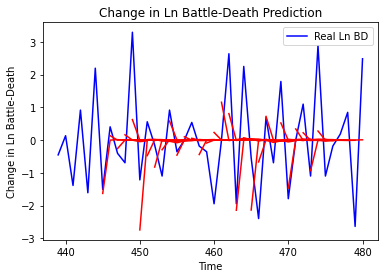

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Kenya', 'country_id': 237, 'step': 't+1', 'mse': 1.4201723887899076, 'mae': 0.8923424813516264, 'r2': 0.31463107365847376, 'tadda_score': 0.9213992653655335}
{'country': 'Kenya', 'country_id': 237, 'step': 't+2', 'mse': 3.5068036577266946, 'mae': 1.4956193121470487, 'r2': -0.837080339277402, 'tadda_score': 1.9540372093218044}
{'country': 'Kenya', 'country_id': 237, 'step': 't+3', 'mse': 3.287349606402583, 'mae': 1.3819488158535336, 'r2': -0.5054849763087772, 'tadda_score': 1.6761962310186402}
{'country': 'Kenya', 'country_id': 237, 'step': 't+4', 'mse': 4.085725741977256, 'mae': 1.656968447270121, 'r2': -0.45487022981118175, 'tadda_score': 1.967016181053843}
{'country': 'Kenya', 'country_id': 237, 'step': 't+5', 'mse': 2.971479954014099, 'mae': 1.2654192147931176, 'r2': -0.9618552026943594, 'tadda_score': 1.621549641666881}
{'country': 'Kenya', 'country_id': 237, 'step': 't+6', 'mse': 2.821171963642762, 'mae': 1

3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
3/3 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
3/3 [==============================] 

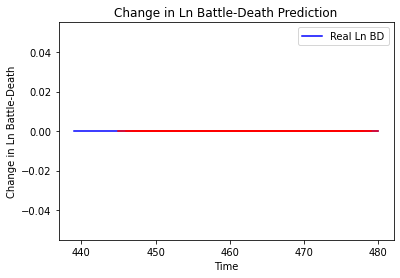

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tanzania', 'country_id': 242, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Morocco']
Building vanilla Model...
Model: "sequential_329"
_________________________________________________________________
Layer (type)       

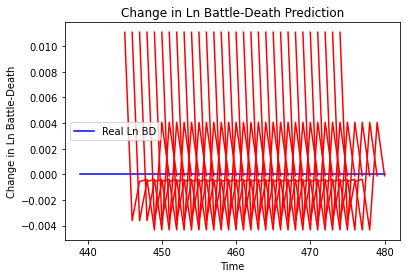

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Morocco', 'country_id': 243, 'step': 't+1', 'mse': 0.00012266959726425775, 'mae': 0.011075630784034729, 'r2': 0.0, 'tadda_score': 0.011075630784034729}
{'country': 'Morocco', 'country_id': 243, 'step': 't+2', 'mse': 5.573914015876238e-05, 'mae': 0.00746586499735713, 'r2': 0.0, 'tadda_score': 0.00746586499735713}
{'country': 'Morocco', 'country_id': 243, 'step': 't+3', 'mse': 4.766523460932818e-05, 'mae': 0.006904001347720623, 'r2': 0.0, 'tadda_score': 0.006904001347720623}
{'country': 'Morocco', 'country_id': 243, 'step': 't+4', 'mse': 4.243905471098424e-05, 'mae': 0.006514526437968016, 'r2': 0.0, 'tadda_score': 0.006514526437968016}
{'country': 'Morocco', 'country_id': 243, 'step': 't+5', 'mse': 3.353210100026042e-05, 'mae': 0.005790690891444683, 'r2': 0.0, 'tadda_score': 0.005790690891444683}
{'country': 'Morocco', 'country_id': 243, 'step': 't+6', 'mse': 9.69083971563145e-05, 'mae': 0.009844206273555756, 'r2'

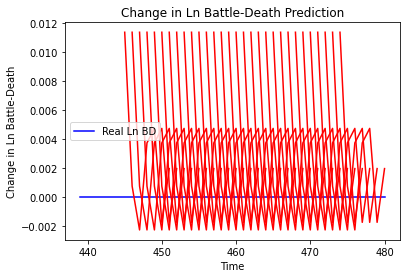

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritania', 'country_id': 244, 'step': 't+1', 'mse': 0.0001289696263684784, 'mae': 0.011356479488313198, 'r2': 0.0, 'tadda_score': 0.011356479488313198}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+2', 'mse': 0.00014686006713929625, 'mae': 0.012118583545088768, 'r2': 0.0, 'tadda_score': 0.012118583545088768}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+3', 'mse': 9.742502965748648e-05, 'mae': 0.009870411828160286, 'r2': 0.0, 'tadda_score': 0.009870411828160286}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+4', 'mse': 0.00018525790211500193, 'mae': 0.013610947877168655, 'r2': 0.0, 'tadda_score': 0.013610947877168655}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+5', 'mse': 0.0003093177867895293, 'mae': 0.017587432637810707, 'r2': 0.0, 'tadda_score': 0.017587432637810707}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+6', 'mse': 0.0002515767844796374, 'mae': 0.01

Epoch 61/100
1/1 [==============================] - 0s 19ms/step - loss: 3.0912 - val_loss: 0.8870
Epoch 62/100
1/1 [==============================] - 0s 19ms/step - loss: 3.1254 - val_loss: 0.8872
Epoch 63/100
1/1 [==============================] - 0s 17ms/step - loss: 3.0934 - val_loss: 0.8873
Epoch 64/100
1/1 [==============================] - 0s 18ms/step - loss: 3.1056 - val_loss: 0.8874
Epoch 65/100
1/1 [==============================] - 0s 19ms/step - loss: 3.0686 - val_loss: 0.8875
Epoch 66/100
1/1 [==============================] - 0s 18ms/step - loss: 3.0924 - val_loss: 0.8877
Epoch 67/100
1/1 [==============================] - 0s 19ms/step - loss: 3.0989 - val_loss: 0.8879
Epoch 68/100
1/1 [==============================] - 0s 19ms/step - loss: 3.0550 - val_loss: 0.8882
Epoch 69/100
1/1 [==============================] - 0s 19ms/step - loss: 3.0675 - val_loss: 0.8886
Epoch 70/100
1/1 [==============================] - 0s 19ms/step - loss: 3.0736 - val_loss: 0.8890
Epoch 71/1

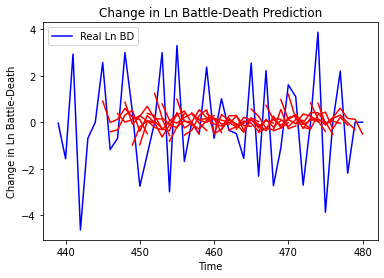

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sudan', 'country_id': 245, 'step': 't+1', 'mse': 2.7051397690542416, 'mae': 1.456562247701588, 'r2': 0.3239422764856571, 'tadda_score': 1.5629911281944342}
{'country': 'Sudan', 'country_id': 245, 'step': 't+2', 'mse': 5.352325393283637, 'mae': 1.915020011958844, 'r2': -0.2544262012889793, 'tadda_score': 2.2964300924016703}
{'country': 'Sudan', 'country_id': 245, 'step': 't+3', 'mse': 4.6613314398257035, 'mae': 1.7058352094040514, 'r2': -0.2019769213957907, 'tadda_score': 1.9977391206866704}
{'country': 'Sudan', 'country_id': 245, 'step': 't+4', 'mse': 4.506336277490258, 'mae': 1.5947254707807241, 'r2': -0.3572930785181454, 'tadda_score': 1.9023718434466856}
{'country': 'Sudan', 'country_id': 245, 'step': 't+5', 'mse': 5.8868846277105344, 'mae': 2.0788451280637763, 'r2': -0.12285129861618227, 'tadda_score': 2.4657029491110825}
{'country': 'Sudan', 'country_id': 245, 'step': 't+6', 'mse': 6.770299333160992, 'mae':

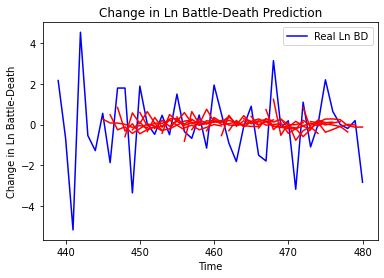

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Sudan', 'country_id': 246, 'step': 't+1', 'mse': 1.9171079551550443, 'mae': 1.0873118624257132, 'r2': 0.13822423300883446, 'tadda_score': 1.220144992089975}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+2', 'mse': 3.1145741251776555, 'mae': 1.3804087496794482, 'r2': -0.1525264556144248, 'tadda_score': 1.5256230398513102}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+3', 'mse': 3.3606411337355078, 'mae': 1.5358311311766684, 'r2': -0.28534860717822186, 'tadda_score': 1.7397818671032965}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+4', 'mse': 3.5366024798360223, 'mae': 1.5295013227528875, 'r2': -0.1219449536101882, 'tadda_score': 1.7052881768312598}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+5', 'mse': 3.1413535626236007, 'mae': 1.3602249327829095, 'r2': -0.24539140991961572, 'tadda_score': 1.5225099497567227}
{'country': 'South Sudan', 'country_id': 246, 'step'

In [36]:
np.random.seed(1)
tf.random.set_seed(1)
model = Sequential()
summary_model(dataset=df,
              modelname = "Vanilla",
              pred_africa=True,
              period=period_test, 
              epochs=100, 
              batch_size=64,
              look_back=6, 
              look_forward=7,
              num_neurons=16, 
              val_split=0.2)